In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
import os
import numpy as np
import astropy.units as u
from astropy.coordinates import SkyCoord, Angle
from regions import CircleSkyRegion
from gammapy.spectrum import (
    SpectrumDatasetOnOff,
    SpectrumDataset,
    SpectrumDatasetMaker,
    FluxPointsEstimator,
    FluxPointsDataset,
    ReflectedRegionsBackgroundMaker,
    plot_spectrum_datasets_off_regions,
)
from gammapy.modeling import Fit, Parameter
from gammapy.modeling.models import (
    PowerLawSpectralModel,
    SpectralModel,
    SkyModel,
    ExpCutoffPowerLawSpectralModel,
)
from gammapy.irf import load_cta_irfs
from gammapy.data import Observation
from gammapy.maps import MapAxis
from itertools import combinations

In [3]:
import scipy.stats as stats
import math

In [4]:
os.environ['CALDB'] = '/home/rishank/anaconda2/envs/cta/share/caldb/'
!echo $CALDB
!ls $CALDB

/home/rishank/anaconda2/envs/cta/share/caldb/
data


In [5]:
l = [0.01,0.1,0.2,0.5]
livetime = [10,8,5,4,2] * u.h
n_obs = [100,125,200,250,500]
model_name = ['PowerLaw', 'Cutoff_value = 10GeV', 'Cutoff_value = 100GeV', 'Cutoff_value = 200GeV', 'Cutoff_value = 500GeV']
pointing = SkyCoord(0, 0, unit="deg", frame="galactic")
offset = 0.5 * u.deg
# Reconstructed and true energy axis
energy_axis = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 10), unit="TeV", name="energy", interp="log"
)
energy_axis_true = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 10), unit="TeV", name="energy", interp="log"
)

on_region_radius = Angle("0.11 deg")
on_region = CircleSkyRegion(center=pointing, radius=on_region_radius)

In [6]:
irfs = load_cta_irfs(
    "$CALDB/data/cta/prod3b-v2/bcf/South_z20_50h/irf_file.fits"
)

In [7]:
rows, cols = (5, 5) 
model = [[0 for i in range(cols)] for j in range(rows)]
print(model) 

[[0, 0, 0, 0, 0], [0, 0, 0, 0, 0], [0, 0, 0, 0, 0], [0, 0, 0, 0, 0], [0, 0, 0, 0, 0]]


In [8]:
for i in range(5):
    model_simu = PowerLawSpectralModel(
        index=2.22,
        amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
        reference=1 * u.TeV,
    )
    print(model_simu) 
    mod = SkyModel(spectral_model=model_simu)
    model[i][0]=mod

PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --

In [9]:
simu = []
for j in range(4):
    for i in range(5):
        sim = ExpCutoffPowerLawSpectralModel(
            index=2.22,
            amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
            reference=1 * u.TeV,
            lambda_=l[j] * u.Unit("TeV-1"),
            alpha = 1,
        )
        mod = SkyModel(spectral_model=sim)
        model[i][j+1]=mod
    simu.append(sim)
    print(simu[j])

ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.000e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.000e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    inde

In [10]:
obs = [[0 for i in range(cols)] for j in range(rows)]
for j in range(5):
    for i in range(5):
        obs[i][j]=Observation.create(pointing=pointing, livetime=livetime[i], irfs=irfs)
        print(obs[i][j])

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 36000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 28800.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 18000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 14400.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 7200.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 36000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 28800.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 18000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 14400.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 7200.0 s

Info for OBS

In [11]:
dataset = [[0 for i in range(cols)] for j in range(rows)]
for j in range(5):
    for i in range(5):
        dataset_empty = SpectrumDataset.create(
            e_reco=energy_axis.edges, e_true=energy_axis_true.edges, region=on_region
        )
        maker = SpectrumDatasetMaker(selection=["aeff", "edisp", "background"])
        dataset[i][j]=maker.run(dataset_empty, obs[i][j])
        print(dataset[i][j])

SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 4231.13

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 3.60e+04 s

    Number of total bins            : 0 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 3384.90

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.88e+04 s

    Number of total bins            : 0 
    Number of fit bins  

SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 846.23

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 7.20e+03 s

    Number of total bins            : 0 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 4231.13

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 3.60e+04 s

    Number of total bins            : 0 
    Number of fit bins   

In [12]:
data = [[0 for i in range(cols)] for j in range(rows)]
for j in range(5):
    for i in range(5):
        dataset[i][j].model = model[i][j]
        dataset[i][j].fake(random_state=42)
        print(dataset[i][j])
        data[i][j]=dataset[i][j]

SpectrumDataset

    Name                            : 1 

    Total counts                    : 4219 
    Total predicted counts          : nan
    Total background counts         : 4231.13

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 3.60e+04 s

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : 3375 
    Total predicted counts          : nan
    Total background counts         : 3384.90

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.88e+04 s

    Number of total bins            : 9 
    Number of fit bins

In [13]:
data_onoff = [[0 for i in range(cols)] for j in range(rows)]
for j in range(5):
    for i in range(5):
        dataset_onoff = SpectrumDatasetOnOff(
            aeff=data[i][j].aeff,
            edisp=data[i][j].edisp,
            models=model[i][j],
            livetime=livetime[i],
            acceptance=1,
            acceptance_off=5,
        )
        dataset_onoff.fake(background_model=data[i][j].background)
        print(dataset_onoff)
        data_onoff[i][j]=dataset_onoff

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 7909 
    Total predicted counts          : 7891.36
    Total off counts                : 21006.00

    Total background counts         : 4201.20

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 1.00e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.02

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 6367 
    Total predicted counts          : 6323.73
    Total off counts                : 16858.00

    Total background counts         : 3371.60

    Effect

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 2853 
    Total predicted counts          : 2835.16
    Total off counts                : 8515.00

    Total background counts         : 1703.00

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 4.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 1327 
    Total predicted counts          : 1417.08
    Total off counts                : 4255.00

    Total background counts         : 851.00

    Effective

In [14]:
%%time
datas = [[0 for i in range(cols)] for j in range(rows)]
for j in range(5):
    for i in range(5):
        datasets = []
        for idx in range(n_obs[i]):
            data_onoff[i][j].fake(random_state=idx, background_model=data[i][j].background)
            data_onoff[i][j].name = f"obs_{idx}"
            datasets.append(data_onoff[i][j].copy())
        datas[i][j]=datasets

CPU times: user 20.4 s, sys: 169 ms, total: 20.6 s
Wall time: 20.6 s


In [15]:
print(*datas[0][0], sep = "\n")
print(*datas[4][4], sep = "\n")

SpectrumDatasetOnOff

    Name                            : obs_0 

    Total counts                    : 7894 
    Total predicted counts          : 7913.96
    Total off counts                : 21119.00

    Total background counts         : 4223.80

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 1.00e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.23

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1 

    Total counts                    : 7805 
    Total predicted counts          : 7945.36
    Total off counts                : 21276.00

    Total background counts         : 4255.20


SpectrumDatasetOnOff

    Name                            : obs_30 

    Total counts                    : 8111 
    Total predicted counts          : 7892.56
    Total off counts                : 21012.00

    Total background counts         : 4202.40

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 1.00e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.53

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_31 

    Total counts                    : 7792 
    Total predicted counts          : 7881.36
    Total off counts                : 20956.00

    Total background counts         : 4191.2

SpectrumDatasetOnOff

    Name                            : obs_64 

    Total counts                    : 7912 
    Total predicted counts          : 7916.16
    Total off counts                : 21130.00

    Total background counts         : 4226.00

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 1.00e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.14

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_65 

    Total counts                    : 7761 
    Total predicted counts          : 7870.16
    Total off counts                : 20900.00

    Total background counts         : 4180.00

SpectrumDatasetOnOff

    Name                            : obs_98 

    Total counts                    : 7859 
    Total predicted counts          : 7907.36
    Total off counts                : 21086.00

    Total background counts         : 4217.20

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 1.00e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.31

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_99 

    Total counts                    : 7996 
    Total predicted counts          : 7962.36
    Total off counts                : 21361.00

    Total background counts         : 4272.2

SpectrumDatasetOnOff

    Name                            : obs_31 

    Total counts                    : 1394 
    Total predicted counts          : 1394.48
    Total off counts                : 4142.00

    Total background counts         : 828.40

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_32 

    Total counts                    : 1401 
    Total predicted counts          : 1408.68
    Total off counts                : 4213.00

    Total background counts         : 842.60

 

SpectrumDatasetOnOff

    Name                            : obs_65 

    Total counts                    : 1389 
    Total predicted counts          : 1402.08
    Total off counts                : 4180.00

    Total background counts         : 836.00

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_66 

    Total counts                    : 1398 
    Total predicted counts          : 1399.68
    Total off counts                : 4168.00

    Total background counts         : 833.60

 

SpectrumDatasetOnOff

    Name                            : obs_99 

    Total counts                    : 1445 
    Total predicted counts          : 1418.48
    Total off counts                : 4262.00

    Total background counts         : 852.40

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_100 

    Total counts                    : 1416 
    Total predicted counts          : 1418.68
    Total off counts                : 4263.00

    Total background counts         : 852.60

 

SpectrumDatasetOnOff

    Name                            : obs_133 

    Total counts                    : 1385 
    Total predicted counts          : 1388.88
    Total off counts                : 4114.00

    Total background counts         : 822.80

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_134 

    Total counts                    : 1419 
    Total predicted counts          : 1439.48
    Total off counts                : 4367.00

    Total background counts         : 873.40



SpectrumDatasetOnOff

    Name                            : obs_167 

    Total counts                    : 1434 
    Total predicted counts          : 1398.68
    Total off counts                : 4163.00

    Total background counts         : 832.60

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_168 

    Total counts                    : 1454 
    Total predicted counts          : 1404.28
    Total off counts                : 4191.00

    Total background counts         : 838.20



SpectrumDatasetOnOff

    Name                            : obs_201 

    Total counts                    : 1408 
    Total predicted counts          : 1407.28
    Total off counts                : 4206.00

    Total background counts         : 841.20

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_202 

    Total counts                    : 1459 
    Total predicted counts          : 1414.28
    Total off counts                : 4241.00

    Total background counts         : 848.20



SpectrumDatasetOnOff

    Name                            : obs_234 

    Total counts                    : 1410 
    Total predicted counts          : 1436.48
    Total off counts                : 4352.00

    Total background counts         : 870.40

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_235 

    Total counts                    : 1409 
    Total predicted counts          : 1449.68
    Total off counts                : 4418.00

    Total background counts         : 883.60


SpectrumDatasetOnOff

    Name                            : obs_268 

    Total counts                    : 1378 
    Total predicted counts          : 1417.68
    Total off counts                : 4258.00

    Total background counts         : 851.60

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_269 

    Total counts                    : 1397 
    Total predicted counts          : 1417.48
    Total off counts                : 4257.00

    Total background counts         : 851.40



SpectrumDatasetOnOff

    Name                            : obs_302 

    Total counts                    : 1380 
    Total predicted counts          : 1413.88
    Total off counts                : 4239.00

    Total background counts         : 847.80

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_303 

    Total counts                    : 1422 
    Total predicted counts          : 1423.68
    Total off counts                : 4288.00

    Total background counts         : 857.60



SpectrumDatasetOnOff

    Name                            : obs_336 

    Total counts                    : 1368 
    Total predicted counts          : 1408.48
    Total off counts                : 4212.00

    Total background counts         : 842.40

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_337 

    Total counts                    : 1438 
    Total predicted counts          : 1411.08
    Total off counts                : 4225.00

    Total background counts         : 845.00



SpectrumDatasetOnOff

    Name                            : obs_369 

    Total counts                    : 1443 
    Total predicted counts          : 1402.28
    Total off counts                : 4181.00

    Total background counts         : 836.20

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_370 

    Total counts                    : 1485 
    Total predicted counts          : 1388.08
    Total off counts                : 4110.00

    Total background counts         : 822.00



SpectrumDatasetOnOff

    Name                            : obs_403 

    Total counts                    : 1432 
    Total predicted counts          : 1417.68
    Total off counts                : 4258.00

    Total background counts         : 851.60

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_404 

    Total counts                    : 1475 
    Total predicted counts          : 1441.88
    Total off counts                : 4379.00

    Total background counts         : 875.80



SpectrumDatasetOnOff

    Name                            : obs_434 

    Total counts                    : 1419 
    Total predicted counts          : 1402.08
    Total off counts                : 4180.00

    Total background counts         : 836.00

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_435 

    Total counts                    : 1501 
    Total predicted counts          : 1401.48
    Total off counts                : 4177.00

    Total background counts         : 835.40



SpectrumDatasetOnOff

    Name                            : obs_468 

    Total counts                    : 1370 
    Total predicted counts          : 1412.88
    Total off counts                : 4234.00

    Total background counts         : 846.80

    Effective area min              : 5.09e+04 m2
    Effective area max              : 5.15e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_469 

    Total counts                    : 1391 
    Total predicted counts          : 1423.88
    Total off counts                : 4289.00

    Total background counts         : 857.80



/home/rishank/anaconda2/envs/gammapy-0.15/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


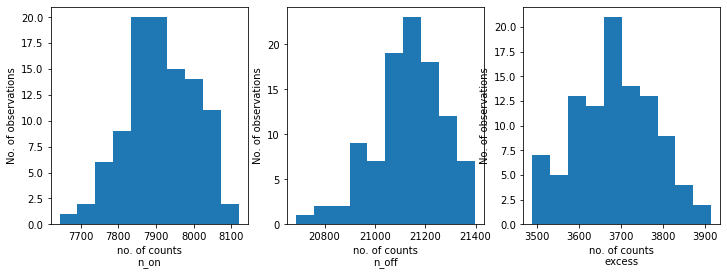

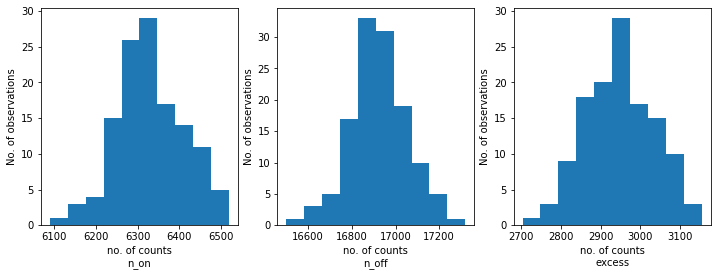

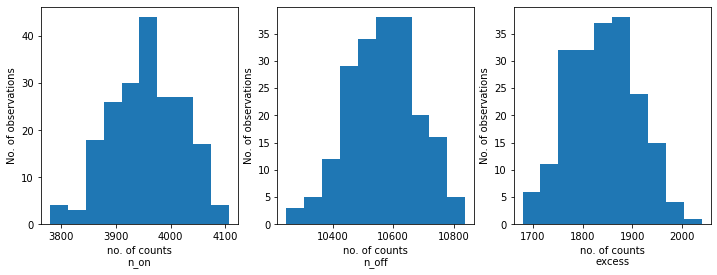

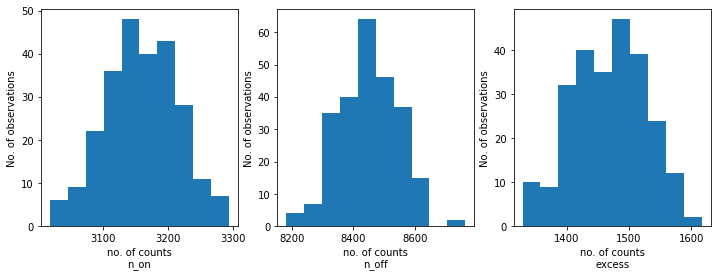

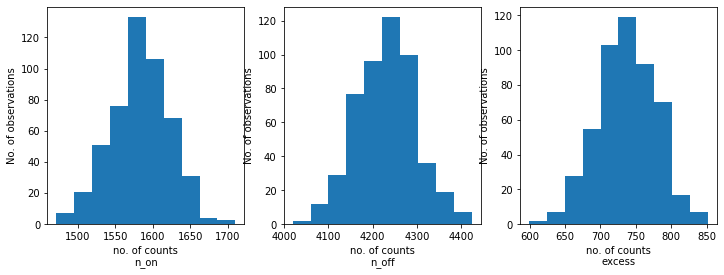

...

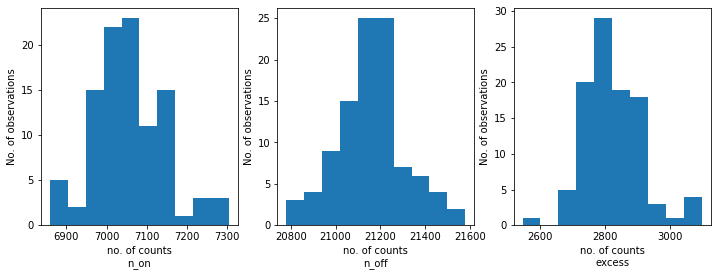

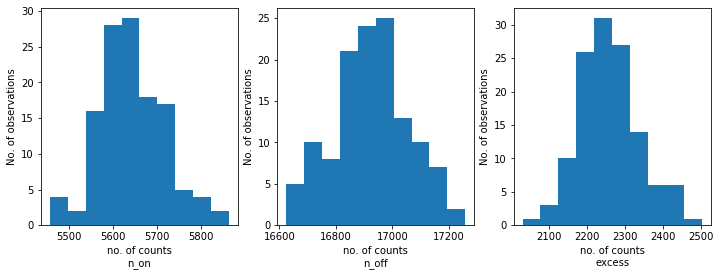

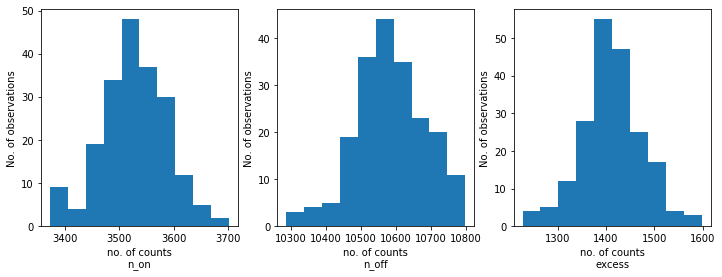

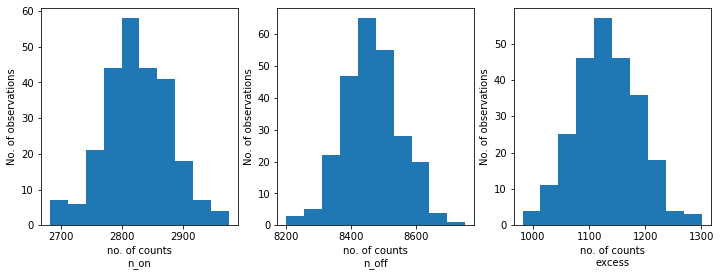

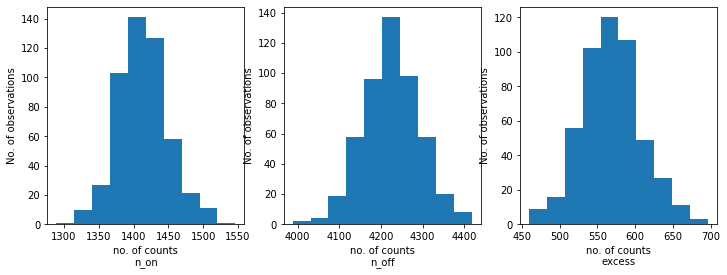

In [16]:
for j in range(5):
    for i in range(5):
        n_on = [dataset.counts.data.sum() for dataset in datas[i][j]]
        n_off = [dataset.counts_off.data.sum() for dataset in datas[i][j]]
        excess = [dataset.excess.data.sum() for dataset in datas[i][j]]
        
        fix, axes = plt.subplots(1, 3, figsize=(12, 4))
        axes[0].hist(n_on)
        axes[0].set_xlabel("no. of counts\nn_on")
        axes[0].set_ylabel("No. of observations")
        axes[1].hist(n_off)
        axes[1].set_xlabel("no. of counts\nn_off")
        axes[1].set_ylabel("No. of observations")
        axes[2].hist(excess)
        axes[2].set_xlabel("no. of counts\nexcess");
        axes[2].set_ylabel("No. of observations")

In [17]:
%%time
res = [[0 for i in range(cols)] for j in range(rows)]
fpes_all = [[0 for i in range(cols)] for j in range(rows)]
model_best_joints_all = [[0 for i in range(cols)] for j in range(rows)]
e_edges = np.logspace(-1.5, 2.0, 10) * u.TeV
for i in range(5):
    results = []
    fpes = []
    model_best_joints = []
    for dataset in datas[i][0]:
        dataset.models = model[i][0].copy()
        fit = Fit([dataset])
        result = fit.run()
        results.append(
            {
                "index": result.parameters["index"].value,
                "amplitude": result.parameters["amplitude"].value,
                "reference":result.parameters["reference"].value,
            }
        )
        print(result.parameters.to_table())
        fpe = FluxPointsEstimator(datasets=[dataset], e_edges=e_edges)
        flux_points = fpe.run()
        print(flux_points.table_formatted)
        fpes.append(flux_points)
        model_best_joint = model[i][0].copy()
        model_best_joint.spectral_model.parameters.covariance = (result.parameters.covariance)
        model_best_joints.append(model_best_joint)
    res[i][0]=results
    fpes_all[i][0]=fpes
    model_best_joints_all[i][0]=model_best_joints

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.208e+00 1.379e-02                nan nan  False
amplitude 1.318e-12 3.071e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.913e-11       7.948e-11       7.879e-11
 0.121  0.077   0.190 ...       6.915e-12       6.911e-12       6.919e-12
 0.297  0.190   0.464 ...       8.613e-13       8.673e-13       8.553e-13
 0.726  0.464   1.136 ...       1.374e-13       1.393e-13       1.355e-13
 1.778  1.136   2.783 ...       2.135e-14       2.171e-14       2.099e-14
 4.354  2.783   6.813 ...       3.486e-15       3.561e-15       3.412e-15
10.661  6.813  16.681 ...       7.

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.943e-11       7.974e-11       7.911e-11
 0.121  0.077   0.190 ...       6.848e-12       6.870e-12       6.825e-12
 0.297  0.190   0.464 ...       8.793e-13       8.873e-13       8.714e-13
 0.726  0.464   1.136 ...       1.362e-13       1.382e-13       1.343e-13
 1.778  1.136   2.783 ...       2.033e-14       2.077e-14       1.991e-14
 4.354  2.783   6.813 ...       3.330e-15       3.420e-15       3.243e-15
10.661  6.813  16.681 ...       6.811e-16       7.049e-16       6.578e-16
26.102 16.681  40.842 ...       1.462e-16       1.551e-16       1.375e-16
63.908 40.842 100.000 ...       4.110e-17       4.416e-17       3.817e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.001e-11       8.048e-11       7.956e-11
 0.121  0.077   0.190 ...       7.023e-12       7.067e-12       6.979e-12
 0.297  0.190   0.464 ...       8.573e-13       8.651e-13       8.495e-13
 0.726  0.464   1.136 ...       1.387e-13       1.406e-13       1.368e-13
 1.778  1.136   2.783 ...       2.012e-14       2.046e-14       1.978e-14
 4.354  2.783   6.813 ...       3.474e-15       3.552e-15       3.397e-15
10.661  6.813  16.681 ...       7.079e-16       7.336e-16       6.829e-16
26.102 16.681  40.842 ...       1.649e-16       1.750e-16       1.552e-16
63.908 40.842 100.000 ...       4.108e-17       4.413e-17       3.814e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.887e-11       7.922e-11       7.853e-11
 0.121  0.077   0.190 ...       6.881e-12       6.886e-12       6.877e-12
 0.297  0.190   0.464 ...       8.699e-13       8.749e-13       8.648e-13
 0.726  0.464   1.136 ...       1.364e-13       1.383e-13       1.346e-13
 1.778  1.136   2.783 ...       1.962e-14       1.996e-14       1.928e-14
 4.354  2.783   6.813 ...       3.169e-15       3.242e-15       3.097e-15
10.661  6.813  16.681 ...       6.653e-16       6.912e-16       6.402e-16
26.102 16.681  40.842 ...       1.580e-16       1.672e-16       1.491e-16
63.908 40.842 100.000 ...       3.693e-17       3.998e-17       3.401e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.959e-11       7.991e-11       7.928e-11
 0.121  0.077   0.190 ...       6.864e-12       6.903e-12       6.825e-12
 0.297  0.190   0.464 ...       8.640e-13       8.719e-13       8.561e-13
 0.726  0.464   1.136 ...       1.363e-13       1.382e-13       1.345e-13
 1.778  1.136   2.783 ...       1.964e-14       2.000e-14       1.929e-14
 4.354  2.783   6.813 ...       3.319e-15       3.395e-15       3.245e-15
10.661  6.813  16.681 ...       6.991e-16       7.236e-16       6.750e-16
26.102 16.681  40.842 ...       1.509e-16       1.607e-16       1.414e-16
63.908 40.842 100.000 ...       3.802e-17       4.107e-17       3.509e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.965e-11       7.979e-11       7.951e-11
 0.121  0.077   0.190 ...       6.842e-12       6.833e-12       6.851e-12
 0.297  0.190   0.464 ...       8.851e-13       8.859e-13       8.840e-13
 0.726  0.464   1.136 ...       1.393e-13       1.412e-13       1.373e-13
 1.778  1.136   2.783 ...       2.044e-14       2.078e-14       2.009e-14
 4.354  2.783   6.813 ...       3.539e-15       3.613e-15       3.466e-15
10.661  6.813  16.681 ...       7.701e-16       7.942e-16       7.464e-16
26.102 16.681  40.842 ...       1.697e-16       1.790e-16       1.606e-16
63.908 40.842 100.000 ...       2.694e-17       3.002e-17       2.403e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.930e-11       7.931e-11       7.930e-11
 0.121  0.077   0.190 ...       6.930e-12       6.950e-12       6.909e-12
 0.297  0.190   0.464 ...       8.503e-13       8.515e-13       8.489e-13
 0.726  0.464   1.136 ...       1.390e-13       1.410e-13       1.371e-13
 1.778  1.136   2.783 ...       2.058e-14       2.092e-14       2.025e-14
 4.354  2.783   6.813 ...       3.267e-15       3.340e-15       3.195e-15
10.661  6.813  16.681 ...       6.808e-16       7.082e-16       6.544e-16
26.102 16.681  40.842 ...       1.558e-16       1.651e-16       1.468e-16
63.908 40.842 100.000 ...       3.470e-17       3.796e-17       3.163e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.931e-11       7.966e-11       7.897e-11
 0.121  0.077   0.190 ...       7.019e-12       7.063e-12       6.973e-12
 0.297  0.190   0.464 ...       8.883e-13       8.923e-13       8.841e-13
 0.726  0.464   1.136 ...       1.379e-13       1.401e-13       1.358e-13
 1.778  1.136   2.783 ...       2.061e-14       2.095e-14       2.027e-14
 4.354  2.783   6.813 ...       3.457e-15       3.551e-15       3.365e-15
10.661  6.813  16.681 ...       7.215e-16       7.481e-16       6.957e-16
26.102 16.681  40.842 ...       1.739e-16       1.831e-16       1.649e-16
63.908 40.842 100.000 ...       4.397e-17       4.702e-17       4.102e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.038e-11       8.073e-11       8.004e-11
 0.121  0.077   0.190 ...       6.743e-12       6.781e-12       6.704e-12
 0.297  0.190   0.464 ...       8.578e-13       8.649e-13       8.507e-13
 0.726  0.464   1.136 ...       1.423e-13       1.447e-13       1.400e-13
 1.778  1.136   2.783 ...       1.977e-14       2.027e-14       1.929e-14
 4.354  2.783   6.813 ...       3.557e-15       3.652e-15       3.464e-15
10.661  6.813  16.681 ...       7.188e-16       7.452e-16       6.931e-16
26.102 16.681  40.842 ...       1.740e-16       1.832e-16       1.650e-16
63.908 40.842 100.000 ...       3.240e-17       3.539e-17       2.953e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.041e-11       8.077e-11       8.006e-11
 0.121  0.077   0.190 ...       6.809e-12       6.822e-12       6.797e-12
 0.297  0.190   0.464 ...       8.495e-13       8.505e-13       8.484e-13
 0.726  0.464   1.136 ...       1.365e-13       1.384e-13       1.346e-13
 1.778  1.136   2.783 ...       2.042e-14       2.076e-14       2.008e-14
 4.354  2.783   6.813 ...       3.196e-15       3.267e-15       3.126e-15
10.661  6.813  16.681 ...       7.330e-16       7.568e-16       7.096e-16
26.102 16.681  40.842 ...       1.737e-16       1.834e-16       1.643e-16
63.908 40.842 100.000 ...       3.471e-17       3.792e-17       3.167e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.990e-11       8.030e-11       7.950e-11
 0.121  0.077   0.190 ...       6.840e-12       6.828e-12       6.853e-12
 0.297  0.190   0.464 ...       8.697e-13       8.770e-13       8.624e-13
 0.726  0.464   1.136 ...       1.407e-13       1.426e-13       1.388e-13
 1.778  1.136   2.783 ...       1.996e-14       2.030e-14       1.962e-14
 4.354  2.783   6.813 ...       3.372e-15       3.446e-15       3.299e-15
10.661  6.813  16.681 ...       7.069e-16       7.308e-16       6.834e-16
26.102 16.681  40.842 ...       1.436e-16       1.524e-16       1.350e-16
63.908 40.842 100.000 ...       3.696e-17       4.008e-17       3.398e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.920e-11       7.952e-11       7.888e-11
 0.121  0.077   0.190 ...       6.922e-12       6.981e-12       6.863e-12
 0.297  0.190   0.464 ...       8.342e-13       8.420e-13       8.264e-13
 0.726  0.464   1.136 ...       1.343e-13       1.362e-13       1.324e-13
 1.778  1.136   2.783 ...       1.935e-14       1.974e-14       1.898e-14
 4.354  2.783   6.813 ...       3.355e-15       3.429e-15       3.283e-15
10.661  6.813  16.681 ...       7.420e-16       7.668e-16       7.178e-16
26.102 16.681  40.842 ...       1.486e-16       1.578e-16       1.398e-16
63.908 40.842 100.000 ...       3.588e-17       3.896e-17       3.293e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.935e-11       7.923e-11       7.950e-11
 0.121  0.077   0.190 ...       6.852e-12       6.860e-12       6.844e-12
 0.297  0.190   0.464 ...       8.618e-13       8.697e-13       8.539e-13
 0.726  0.464   1.136 ...       1.378e-13       1.397e-13       1.359e-13
 1.778  1.136   2.783 ...       1.965e-14       1.998e-14       1.932e-14
 4.354  2.783   6.813 ...       3.677e-15       3.753e-15       3.602e-15
10.661  6.813  16.681 ...       7.193e-16       7.431e-16       6.959e-16
26.102 16.681  40.842 ...       1.762e-16       1.855e-16       1.673e-16
63.908 40.842 100.000 ...       4.216e-17       4.522e-17       3.922e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.992e-11       8.024e-11       7.959e-11
 0.121  0.077   0.190 ...       6.866e-12       6.907e-12       6.824e-12
 0.297  0.190   0.464 ...       8.679e-13       8.759e-13       8.601e-13
 0.726  0.464   1.136 ...       1.390e-13       1.409e-13       1.371e-13
 1.778  1.136   2.783 ...       2.106e-14       2.141e-14       2.071e-14
 4.354  2.783   6.813 ...       3.343e-15       3.431e-15       3.257e-15
10.661  6.813  16.681 ...       6.388e-16       6.601e-16       6.176e-16
26.102 16.681  40.842 ...       1.605e-16       1.697e-16       1.515e-16
63.908 40.842 100.000 ...       3.233e-17       3.538e-17       2.942e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.033e-11       8.068e-11       7.997e-11
 0.121  0.077   0.190 ...       6.733e-12       6.763e-12       6.703e-12
 0.297  0.190   0.464 ...       8.638e-13       8.693e-13       8.583e-13
 0.726  0.464   1.136 ...       1.387e-13       1.406e-13       1.367e-13
 1.778  1.136   2.783 ...       1.996e-14       2.035e-14       1.957e-14
 4.354  2.783   6.813 ...       3.358e-15       3.431e-15       3.285e-15
10.661  6.813  16.681 ...       7.666e-16       7.910e-16       7.426e-16
26.102 16.681  40.842 ...       1.538e-16       1.628e-16       1.450e-16
63.908 40.842 100.000 ...       4.309e-17       4.614e-17       4.014e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.910e-11       8.951e-11       8.869e-11
 0.121  0.077   0.190 ...       7.683e-12       7.701e-12       7.666e-12
 0.297  0.190   0.464 ...       9.776e-13       9.821e-13       9.728e-13
 0.726  0.464   1.136 ...       1.559e-13       1.584e-13       1.535e-13
 1.778  1.136   2.783 ...       2.140e-14       2.182e-14       2.099e-14
 4.354  2.783   6.813 ...       3.710e-15       3.828e-15       3.595e-15
10.661  6.813  16.681 ...       8.508e-16       8.824e-16       8.199e-16
26.102 16.681  40.842 ...       1.729e-16       1.856e-16       1.609e-16
63.908 40.842 100.000 ...       4.044e-17       4.427e-17       3.678e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.790e-11       8.820e-11       8.760e-11
 0.121  0.077   0.190 ...       7.656e-12       7.706e-12       7.606e-12
 0.297  0.190   0.464 ...       9.911e-13       9.948e-13       9.873e-13
 0.726  0.464   1.136 ...       1.616e-13       1.643e-13       1.589e-13
 1.778  1.136   2.783 ...       2.208e-14       2.250e-14       2.167e-14
 4.354  2.783   6.813 ...       4.124e-15       4.217e-15       4.032e-15
10.661  6.813  16.681 ...       7.949e-16       8.243e-16       7.659e-16
26.102 16.681  40.842 ...       1.922e-16       2.038e-16       1.810e-16
63.908 40.842 100.000 ...       4.202e-17       4.591e-17       3.832e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.811e-11       8.850e-11       8.770e-11
 0.121  0.077   0.190 ...       7.692e-12       7.722e-12       7.662e-12
 0.297  0.190   0.464 ...       9.664e-13       9.761e-13       9.568e-13
 0.726  0.464   1.136 ...       1.549e-13       1.573e-13       1.526e-13
 1.778  1.136   2.783 ...       2.164e-14       2.209e-14       2.120e-14
 4.354  2.783   6.813 ...       3.794e-15       3.887e-15       3.703e-15
10.661  6.813  16.681 ...       7.182e-16       7.478e-16       6.892e-16
26.102 16.681  40.842 ...       1.551e-16       1.665e-16       1.442e-16
63.908 40.842 100.000 ...       3.538e-17       3.921e-17       3.175e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.916e-11       8.959e-11       8.873e-11
 0.121  0.077   0.190 ...       7.777e-12       7.822e-12       7.732e-12
 0.297  0.190   0.464 ...       9.871e-13       9.934e-13       9.807e-13
 0.726  0.464   1.136 ...       1.535e-13       1.559e-13       1.512e-13
 1.778  1.136   2.783 ...       2.262e-14       2.318e-14       2.207e-14
 4.354  2.783   6.813 ...       3.625e-15       3.717e-15       3.535e-15
10.661  6.813  16.681 ...       7.630e-16       7.957e-16       7.314e-16
26.102 16.681  40.842 ...       1.623e-16       1.738e-16       1.513e-16
63.908 40.842 100.000 ...       3.875e-17       4.259e-17       3.510e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.818e-11       8.861e-11       8.775e-11
 0.121  0.077   0.190 ...       7.840e-12       7.896e-12       7.784e-12
 0.297  0.190   0.464 ...       9.902e-13       9.983e-13       9.820e-13
 0.726  0.464   1.136 ...       1.557e-13       1.582e-13       1.533e-13
 1.778  1.136   2.783 ...       2.119e-14       2.160e-14       2.080e-14
 4.354  2.783   6.813 ...       3.968e-15       4.061e-15       3.876e-15
10.661  6.813  16.681 ...       7.785e-16       8.117e-16       7.464e-16
26.102 16.681  40.842 ...       1.887e-16       2.003e-16       1.775e-16
63.908 40.842 100.000 ...       3.880e-17       4.272e-17       3.509e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.925e-11       8.969e-11       8.881e-11
 0.121  0.077   0.190 ...       7.825e-12       7.843e-12       7.808e-12
 0.297  0.190   0.464 ...       9.701e-13       9.788e-13       9.615e-13
 0.726  0.464   1.136 ...       1.541e-13       1.565e-13       1.517e-13
 1.778  1.136   2.783 ...       2.293e-14       2.340e-14       2.246e-14
 4.354  2.783   6.813 ...       3.888e-15       3.991e-15       3.787e-15
10.661  6.813  16.681 ...       7.722e-16       8.058e-16       7.399e-16
26.102 16.681  40.842 ...       1.946e-16       2.066e-16       1.831e-16
63.908 40.842 100.000 ...       2.963e-17       3.348e-17       2.602e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.968e-11       8.959e-11       8.980e-11
 0.121  0.077   0.190 ...       7.801e-12       7.809e-12       7.792e-12
 0.297  0.190   0.464 ...       9.778e-13       9.829e-13       9.726e-13
 0.726  0.464   1.136 ...       1.559e-13       1.583e-13       1.535e-13
 1.778  1.136   2.783 ...       2.187e-14       2.232e-14       2.142e-14
 4.354  2.783   6.813 ...       3.565e-15       3.656e-15       3.476e-15
10.661  6.813  16.681 ...       8.021e-16       8.321e-16       7.728e-16
26.102 16.681  40.842 ...       1.623e-16       1.738e-16       1.513e-16
63.908 40.842 100.000 ...       4.876e-17       5.257e-17       4.511e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.849e-11       8.890e-11       8.807e-11
 0.121  0.077   0.190 ...       7.669e-12       7.719e-12       7.619e-12
 0.297  0.190   0.464 ...       9.832e-13       9.879e-13       9.783e-13
 0.726  0.464   1.136 ...       1.579e-13       1.603e-13       1.555e-13
 1.778  1.136   2.783 ...       2.201e-14       2.244e-14       2.158e-14
 4.354  2.783   6.813 ...       3.650e-15       3.741e-15       3.559e-15
10.661  6.813  16.681 ...       7.988e-16       8.314e-16       7.673e-16
26.102 16.681  40.842 ...       1.661e-16       1.776e-16       1.551e-16
63.908 40.842 100.000 ...       3.364e-17       3.741e-17       3.005e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.972e-11       9.001e-11       8.943e-11
 0.121  0.077   0.190 ...       7.771e-12       7.823e-12       7.720e-12
 0.297  0.190   0.464 ...       1.006e-12       1.016e-12       9.960e-13
 0.726  0.464   1.136 ...       1.582e-13       1.607e-13       1.558e-13
 1.778  1.136   2.783 ...       2.185e-14       2.226e-14       2.143e-14
 4.354  2.783   6.813 ...       3.608e-15       3.697e-15       3.520e-15
10.661  6.813  16.681 ...       8.575e-16       8.912e-16       8.249e-16
26.102 16.681  40.842 ...       1.759e-16       1.874e-16       1.648e-16
63.908 40.842 100.000 ...       4.034e-17       4.421e-17       3.667e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.891e-11       8.929e-11       8.854e-11
 0.121  0.077   0.190 ...       7.692e-12       7.694e-12       7.690e-12
 0.297  0.190   0.464 ...       9.770e-13       9.866e-13       9.674e-13
 0.726  0.464   1.136 ...       1.585e-13       1.612e-13       1.559e-13
 1.778  1.136   2.783 ...       2.289e-14       2.332e-14       2.247e-14
 4.354  2.783   6.813 ...       3.946e-15       4.042e-15       3.852e-15
10.661  6.813  16.681 ...       7.824e-16       8.183e-16       7.480e-16
26.102 16.681  40.842 ...       1.920e-16       2.035e-16       1.808e-16
63.908 40.842 100.000 ...       2.968e-17       3.353e-17       2.606e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.858e-11       8.901e-11       8.815e-11
 0.121  0.077   0.190 ...       7.732e-12       7.766e-12       7.699e-12
 0.297  0.190   0.464 ...       9.848e-13       9.904e-13       9.793e-13
 0.726  0.464   1.136 ...       1.540e-13       1.564e-13       1.517e-13
 1.778  1.136   2.783 ...       2.195e-14       2.251e-14       2.140e-14
 4.354  2.783   6.813 ...       3.843e-15       3.936e-15       3.751e-15
10.661  6.813  16.681 ...       8.571e-16       8.877e-16       8.271e-16
26.102 16.681  40.842 ...       1.626e-16       1.738e-16       1.518e-16
63.908 40.842 100.000 ...       3.170e-17       3.554e-17       2.808e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.783e-11       8.825e-11       8.742e-11
 0.121  0.077   0.190 ...       7.721e-12       7.762e-12       7.681e-12
 0.297  0.190   0.464 ...       9.676e-13       9.716e-13       9.634e-13
 0.726  0.464   1.136 ...       1.517e-13       1.541e-13       1.494e-13
 1.778  1.136   2.783 ...       2.254e-14       2.299e-14       2.211e-14
 4.354  2.783   6.813 ...       3.724e-15       3.832e-15       3.618e-15
10.661  6.813  16.681 ...       8.033e-16       8.363e-16       7.714e-16
26.102 16.681  40.842 ...       1.399e-16       1.514e-16       1.288e-16
63.908 40.842 100.000 ...       4.486e-17       4.868e-17       4.120e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.963e-11       9.018e-11       8.907e-11
 0.121  0.077   0.190 ...       7.659e-12       7.693e-12       7.624e-12
 0.297  0.190   0.464 ...       9.722e-13       9.817e-13       9.628e-13
 0.726  0.464   1.136 ...       1.516e-13       1.539e-13       1.493e-13
 1.778  1.136   2.783 ...       2.126e-14       2.184e-14       2.070e-14
 4.354  2.783   6.813 ...       3.983e-15       4.083e-15       3.885e-15
10.661  6.813  16.681 ...       7.074e-16       7.366e-16       6.787e-16
26.102 16.681  40.842 ...       1.475e-16       1.591e-16       1.365e-16
63.908 40.842 100.000 ...       4.034e-17       4.415e-17       3.669e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.954e-11       8.991e-11       8.917e-11
 0.121  0.077   0.190 ...       7.778e-12       7.830e-12       7.726e-12
 0.297  0.190   0.464 ...       9.766e-13       9.826e-13       9.705e-13
 0.726  0.464   1.136 ...       1.476e-13       1.505e-13       1.447e-13
 1.778  1.136   2.783 ...       2.263e-14       2.318e-14       2.209e-14
 4.354  2.783   6.813 ...       3.694e-15       3.795e-15       3.595e-15
10.661  6.813  16.681 ...       7.981e-16       8.313e-16       7.660e-16
26.102 16.681  40.842 ...       1.660e-16       1.775e-16       1.550e-16
63.908 40.842 100.000 ...       4.038e-17       4.426e-17       3.669e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.906e-11       8.947e-11       8.864e-11
 0.121  0.077   0.190 ...       7.682e-12       7.725e-12       7.638e-12
 0.297  0.190   0.464 ...       9.705e-13       9.804e-13       9.608e-13
 0.726  0.464   1.136 ...       1.587e-13       1.612e-13       1.562e-13
 1.778  1.136   2.783 ...       2.169e-14       2.226e-14       2.114e-14
 4.354  2.783   6.813 ...       3.718e-15       3.826e-15       3.612e-15
10.661  6.813  16.681 ...       8.078e-16       8.425e-16       7.744e-16
26.102 16.681  40.842 ...       1.857e-16       1.972e-16       1.745e-16
63.908 40.842 100.000 ...       3.544e-17       3.925e-17       3.181e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.878e-11       8.915e-11       8.841e-11
 0.121  0.077   0.190 ...       7.638e-12       7.692e-12       7.585e-12
 0.297  0.190   0.464 ...       9.624e-13       9.722e-13       9.526e-13
 0.726  0.464   1.136 ...       1.542e-13       1.566e-13       1.519e-13
 1.778  1.136   2.783 ...       2.228e-14       2.279e-14       2.178e-14
 4.354  2.783   6.813 ...       3.587e-15       3.694e-15       3.482e-15
10.661  6.813  16.681 ...       7.717e-16       8.052e-16       7.394e-16
26.102 16.681  40.842 ...       1.437e-16       1.552e-16       1.326e-16
63.908 40.842 100.000 ...       3.358e-17       3.740e-17       2.996e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.918e-11       8.966e-11       8.871e-11
 0.121  0.077   0.190 ...       7.567e-12       7.618e-12       7.516e-12
 0.297  0.190   0.464 ...       9.562e-13       9.653e-13       9.472e-13
 0.726  0.464   1.136 ...       1.535e-13       1.560e-13       1.511e-13
 1.778  1.136   2.783 ...       2.131e-14       2.183e-14       2.080e-14
 4.354  2.783   6.813 ...       3.725e-15       3.830e-15       3.622e-15
10.661  6.813  16.681 ...       6.384e-16       6.683e-16       6.092e-16
26.102 16.681  40.842 ...       1.918e-16       2.033e-16       1.806e-16
63.908 40.842 100.000 ...       4.620e-17       5.002e-17       4.254e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.894e-11       8.935e-11       8.853e-11
 0.121  0.077   0.190 ...       7.737e-12       7.792e-12       7.683e-12
 0.297  0.190   0.464 ...       9.566e-13       9.644e-13       9.489e-13
 0.726  0.464   1.136 ...       1.561e-13       1.584e-13       1.537e-13
 1.778  1.136   2.783 ...       2.178e-14       2.230e-14       2.126e-14
 4.354  2.783   6.813 ...       3.831e-15       3.935e-15       3.730e-15
10.661  6.813  16.681 ...       7.791e-16       8.099e-16       7.492e-16
26.102 16.681  40.842 ...       1.762e-16       1.878e-16       1.651e-16
63.908 40.842 100.000 ...       3.881e-17       4.278e-17       3.508e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.159e-10       1.166e-10       1.152e-10
 0.121  0.077   0.190 ...       9.743e-12       9.787e-12       9.698e-12
 0.297  0.190   0.464 ...       1.203e-12       1.218e-12       1.188e-12
 0.726  0.464   1.136 ...       1.941e-13       1.979e-13       1.904e-13
 1.778  1.136   2.783 ...       2.772e-14       2.846e-14       2.699e-14
 4.354  2.783   6.813 ...       4.771e-15       4.925e-15       4.620e-15
10.661  6.813  16.681 ...       1.008e-15       1.062e-15       9.561e-16
26.102 16.681  40.842 ...       2.483e-16       2.667e-16       2.305e-16
63.908 40.842 100.000 ...       5.063e-17       5.685e-17       4.480e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.140e-10       1.147e-10       1.133e-10
 0.121  0.077   0.190 ...       9.603e-12       9.682e-12       9.525e-12
 0.297  0.190   0.464 ...       1.235e-12       1.242e-12       1.229e-12
 0.726  0.464   1.136 ...       1.897e-13       1.935e-13       1.858e-13
 1.778  1.136   2.783 ...       2.771e-14       2.849e-14       2.695e-14
 4.354  2.783   6.813 ...       4.652e-15       4.815e-15       4.493e-15
10.661  6.813  16.681 ...       1.132e-15       1.180e-15       1.085e-15
26.102 16.681  40.842 ...       2.101e-16       2.285e-16       1.925e-16
63.908 40.842 100.000 ...       3.586e-17       4.207e-17       3.015e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.129e-10       1.134e-10       1.123e-10
 0.121  0.077   0.190 ...       9.916e-12       1.002e-11       9.814e-12
 0.297  0.190   0.464 ...       1.193e-12       1.209e-12       1.178e-12
 0.726  0.464   1.136 ...       1.974e-13       2.011e-13       1.937e-13
 1.778  1.136   2.783 ...       2.759e-14       2.845e-14       2.675e-14
 4.354  2.783   6.813 ...       4.983e-15       5.132e-15       4.837e-15
10.661  6.813  16.681 ...       1.049e-15       1.097e-15       1.002e-15
26.102 16.681  40.842 ...       1.799e-16       1.984e-16       1.622e-16
63.908 40.842 100.000 ...       5.668e-17       6.281e-17       5.087e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.133e-10       1.140e-10       1.126e-10
 0.121  0.077   0.190 ...       9.632e-12       9.704e-12       9.560e-12
 0.297  0.190   0.464 ...       1.206e-12       1.222e-12       1.190e-12
 0.726  0.464   1.136 ...       2.014e-13       2.061e-13       1.968e-13
 1.778  1.136   2.783 ...       2.869e-14       2.951e-14       2.790e-14
 4.354  2.783   6.813 ...       4.987e-15       5.136e-15       4.842e-15
10.661  6.813  16.681 ...       9.044e-16       9.506e-16       8.593e-16
26.102 16.681  40.842 ...       2.096e-16       2.301e-16       1.906e-16
63.908 40.842 100.000 ...       3.104e-17       3.728e-17       2.537e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.107e-10       1.114e-10       1.100e-10
 0.121  0.077   0.190 ...       9.896e-12       9.908e-12       9.883e-12
 0.297  0.190   0.464 ...       1.224e-12       1.236e-12       1.212e-12
 0.726  0.464   1.136 ...       2.039e-13       2.082e-13       1.997e-13
 1.778  1.136   2.783 ...       2.908e-14       2.989e-14       2.829e-14
 4.354  2.783   6.813 ...       4.632e-15       4.779e-15       4.488e-15
10.661  6.813  16.681 ...       9.604e-16       1.007e-15       9.145e-16
26.102 16.681  40.842 ...       2.428e-16       2.613e-16       2.249e-16
63.908 40.842 100.000 ...       4.744e-17       5.376e-17       4.157e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.121e-10       1.129e-10       1.112e-10
 0.121  0.077   0.190 ...       9.684e-12       9.767e-12       9.601e-12
 0.297  0.190   0.464 ...       1.179e-12       1.194e-12       1.163e-12
 0.726  0.464   1.136 ...       1.882e-13       1.921e-13       1.845e-13
 1.778  1.136   2.783 ...       3.021e-14       3.093e-14       2.950e-14
 4.354  2.783   6.813 ...       4.687e-15       4.861e-15       4.519e-15
10.661  6.813  16.681 ...       9.275e-16       9.742e-16       8.819e-16
26.102 16.681  40.842 ...       2.240e-16       2.429e-16       2.060e-16
63.908 40.842 100.000 ...       5.388e-17       6.011e-17       4.802e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.106e-10       1.112e-10       1.099e-10
 0.121  0.077   0.190 ...       9.838e-12       9.856e-12       9.820e-12
 0.297  0.190   0.464 ...       1.255e-12       1.272e-12       1.239e-12
 0.726  0.464   1.136 ...       1.946e-13       1.983e-13       1.909e-13
 1.778  1.136   2.783 ...       2.669e-14       2.761e-14       2.581e-14
 4.354  2.783   6.813 ...       4.695e-15       4.844e-15       4.549e-15
10.661  6.813  16.681 ...       9.764e-16       1.029e-15       9.261e-16
26.102 16.681  40.842 ...       2.098e-16       2.285e-16       1.919e-16
63.908 40.842 100.000 ...       3.102e-17       3.726e-17       2.536e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.120e-10       1.126e-10       1.115e-10
 0.121  0.077   0.190 ...       9.694e-12       9.777e-12       9.611e-12
 0.297  0.190   0.464 ...       1.276e-12       1.293e-12       1.260e-12
 0.726  0.464   1.136 ...       1.870e-13       1.913e-13       1.827e-13
 1.778  1.136   2.783 ...       2.803e-14       2.871e-14       2.736e-14
 4.354  2.783   6.813 ...       4.780e-15       4.928e-15       4.635e-15
10.661  6.813  16.681 ...       9.793e-16       1.029e-15       9.311e-16
26.102 16.681  40.842 ...       2.486e-16       2.671e-16       2.309e-16
63.908 40.842 100.000 ...       4.394e-17       5.007e-17       3.819e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.130e-10       1.136e-10       1.125e-10
 0.121  0.077   0.190 ...       9.783e-12       9.867e-12       9.699e-12
 0.297  0.190   0.464 ...       1.236e-12       1.250e-12       1.221e-12
 0.726  0.464   1.136 ...       1.956e-13       1.993e-13       1.919e-13
 1.778  1.136   2.783 ...       2.889e-14       2.977e-14       2.804e-14
 4.354  2.783   6.813 ...       4.664e-15       4.812e-15       4.519e-15
10.661  6.813  16.681 ...       9.131e-16       9.605e-16       8.670e-16
26.102 16.681  40.842 ...       2.165e-16       2.352e-16       1.986e-16
63.908 40.842 100.000 ...       3.099e-17       3.722e-17       2.533e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.128e-10       1.134e-10       1.122e-10
 0.121  0.077   0.190 ...       9.733e-12       9.785e-12       9.682e-12
 0.297  0.190   0.464 ...       1.223e-12       1.239e-12       1.208e-12
 0.726  0.464   1.136 ...       1.871e-13       1.913e-13       1.829e-13
 1.778  1.136   2.783 ...       2.864e-14       2.938e-14       2.792e-14
 4.354  2.783   6.813 ...       4.916e-15       5.065e-15       4.769e-15
10.661  6.813  16.681 ...       8.694e-16       9.139e-16       8.256e-16
26.102 16.681  40.842 ...       2.423e-16       2.608e-16       2.246e-16
63.908 40.842 100.000 ...       4.381e-17       5.024e-17       3.791e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.132e-10       1.139e-10       1.125e-10
 0.121  0.077   0.190 ...       9.867e-12       9.959e-12       9.777e-12
 0.297  0.190   0.464 ...       1.178e-12       1.192e-12       1.164e-12
 0.726  0.464   1.136 ...       2.024e-13       2.067e-13       1.982e-13
 1.778  1.136   2.783 ...       2.657e-14       2.722e-14       2.593e-14
 4.354  2.783   6.813 ...       5.050e-15       5.200e-15       4.904e-15
10.661  6.813  16.681 ...       1.011e-15       1.059e-15       9.642e-16
26.102 16.681  40.842 ...       2.429e-16       2.615e-16       2.251e-16
63.908 40.842 100.000 ...       5.956e-17       6.569e-17       5.373e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.116e-10       1.123e-10       1.110e-10
 0.121  0.077   0.190 ...       9.738e-12       9.814e-12       9.664e-12
 0.297  0.190   0.464 ...       1.254e-12       1.270e-12       1.238e-12
 0.726  0.464   1.136 ...       1.948e-13       1.986e-13       1.911e-13
 1.778  1.136   2.783 ...       2.748e-14       2.827e-14       2.671e-14
 4.354  2.783   6.813 ...       4.865e-15       5.017e-15       4.716e-15
10.661  6.813  16.681 ...       9.904e-16       1.040e-15       9.425e-16
26.102 16.681  40.842 ...       2.238e-16       2.423e-16       2.060e-16
63.908 40.842 100.000 ...       4.011e-17       4.631e-17       3.437e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.124e-10       1.131e-10       1.117e-10
 0.121  0.077   0.190 ...       9.721e-12       9.807e-12       9.636e-12
 0.297  0.190   0.464 ...       1.222e-12       1.238e-12       1.207e-12
 0.726  0.464   1.136 ...       1.941e-13       1.979e-13       1.904e-13
 1.778  1.136   2.783 ...       2.830e-14       2.898e-14       2.763e-14
 4.354  2.783   6.813 ...       4.800e-15       4.951e-15       4.652e-15
10.661  6.813  16.681 ...       9.373e-16       9.845e-16       8.912e-16
26.102 16.681  40.842 ...       2.488e-16       2.672e-16       2.310e-16
63.908 40.842 100.000 ...       4.747e-17       5.366e-17       4.167e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.119e-10       1.126e-10       1.112e-10
 0.121  0.077   0.190 ...       1.000e-11       1.011e-11       9.891e-12
 0.297  0.190   0.464 ...       1.198e-12       1.207e-12       1.188e-12
 0.726  0.464   1.136 ...       1.865e-13       1.905e-13       1.825e-13
 1.778  1.136   2.783 ...       2.800e-14       2.869e-14       2.733e-14
 4.354  2.783   6.813 ...       4.534e-15       4.684e-15       4.386e-15
10.661  6.813  16.681 ...       9.022e-16       9.496e-16       8.561e-16
26.102 16.681  40.842 ...       2.162e-16       2.362e-16       1.975e-16
63.908 40.842 100.000 ...       5.059e-17       5.672e-17       4.481e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.111e-10       1.118e-10       1.104e-10
 0.121  0.077   0.190 ...       9.853e-12       9.947e-12       9.761e-12
 0.297  0.190   0.464 ...       1.193e-12       1.202e-12       1.184e-12
 0.726  0.464   1.136 ...       1.958e-13       1.997e-13       1.921e-13
 1.778  1.136   2.783 ...       2.903e-14       2.986e-14       2.822e-14
 4.354  2.783   6.813 ...       4.678e-15       4.858e-15       4.505e-15
10.661  6.813  16.681 ...       9.795e-16       1.030e-15       9.304e-16
26.102 16.681  40.842 ...       2.169e-16       2.368e-16       1.982e-16
63.908 40.842 100.000 ...       5.382e-17       5.996e-17       4.801e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.136e-10       1.144e-10       1.129e-10
 0.121  0.077   0.190 ...       9.695e-12       9.769e-12       9.622e-12
 0.297  0.190   0.464 ...       1.215e-12       1.230e-12       1.199e-12
 0.726  0.464   1.136 ...       1.891e-13       1.930e-13       1.853e-13
 1.778  1.136   2.783 ...       2.634e-14       2.701e-14       2.568e-14
 4.354  2.783   6.813 ...       4.886e-15       5.038e-15       4.736e-15
10.661  6.813  16.681 ...       9.984e-16       1.055e-15       9.446e-16
26.102 16.681  40.842 ...       1.711e-16       1.896e-16       1.536e-16
63.908 40.842 100.000 ...       5.365e-17       5.978e-17       4.786e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.136e-10       1.143e-10       1.129e-10
 0.121  0.077   0.190 ...       9.733e-12       9.806e-12       9.661e-12
 0.297  0.190   0.464 ...       1.194e-12       1.209e-12       1.178e-12
 0.726  0.464   1.136 ...       1.918e-13       1.957e-13       1.879e-13
 1.778  1.136   2.783 ...       2.913e-14       2.984e-14       2.842e-14
 4.354  2.783   6.813 ...       4.869e-15       5.018e-15       4.723e-15
10.661  6.813  16.681 ...       1.125e-15       1.176e-15       1.075e-15
26.102 16.681  40.842 ...       2.366e-16       2.559e-16       2.182e-16
63.908 40.842 100.000 ...       3.589e-17       4.211e-17       3.018e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.134e-10       1.120e-10
 0.121  0.077   0.190 ...       9.951e-12       1.007e-11       9.833e-12
 0.297  0.190   0.464 ...       1.182e-12       1.197e-12       1.166e-12
 0.726  0.464   1.136 ...       1.954e-13       1.992e-13       1.916e-13
 1.778  1.136   2.783 ...       2.857e-14       2.926e-14       2.789e-14
 4.354  2.783   6.813 ...       4.735e-15       4.881e-15       4.591e-15
10.661  6.813  16.681 ...       1.089e-15       1.138e-15       1.042e-15
26.102 16.681  40.842 ...       2.550e-16       2.737e-16       2.369e-16
63.908 40.842 100.000 ...       5.683e-17       6.297e-17       5.100e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.124e-10       1.131e-10       1.117e-10
 0.121  0.077   0.190 ...       9.859e-12       9.912e-12       9.807e-12
 0.297  0.190   0.464 ...       1.276e-12       1.293e-12       1.260e-12
 0.726  0.464   1.136 ...       2.096e-13       2.146e-13       2.048e-13
 1.778  1.136   2.783 ...       2.616e-14       2.676e-14       2.556e-14
 4.354  2.783   6.813 ...       4.781e-15       4.965e-15       4.605e-15
10.661  6.813  16.681 ...       1.158e-15       1.206e-15       1.112e-15
26.102 16.681  40.842 ...       2.100e-16       2.282e-16       1.925e-16
63.908 40.842 100.000 ...       4.007e-17       4.626e-17       3.433e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.134e-10       1.120e-10
 0.121  0.077   0.190 ...       9.642e-12       9.721e-12       9.564e-12
 0.297  0.190   0.464 ...       1.203e-12       1.218e-12       1.188e-12
 0.726  0.464   1.136 ...       1.918e-13       1.954e-13       1.882e-13
 1.778  1.136   2.783 ...       2.620e-14       2.686e-14       2.555e-14
 4.354  2.783   6.813 ...       4.832e-15       4.983e-15       4.684e-15
10.661  6.813  16.681 ...       1.029e-15       1.077e-15       9.811e-16
26.102 16.681  40.842 ...       2.233e-16       2.433e-16       2.045e-16
63.908 40.842 100.000 ...       4.384e-17       5.021e-17       3.798e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.121e-10       1.128e-10       1.115e-10
 0.121  0.077   0.190 ...       9.761e-12       9.843e-12       9.680e-12
 0.297  0.190   0.464 ...       1.235e-12       1.250e-12       1.221e-12
 0.726  0.464   1.136 ...       1.945e-13       1.984e-13       1.906e-13
 1.778  1.136   2.783 ...       2.994e-14       3.082e-14       2.909e-14
 4.354  2.783   6.813 ...       4.982e-15       5.138e-15       4.829e-15
10.661  6.813  16.681 ...       1.062e-15       1.110e-15       1.016e-15
26.102 16.681  40.842 ...       2.370e-16       2.559e-16       2.190e-16
63.908 40.842 100.000 ...       5.388e-17       6.028e-17       4.791e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.125e-10       1.128e-10       1.121e-10
 0.121  0.077   0.190 ...       9.757e-12       9.853e-12       9.662e-12
 0.297  0.190   0.464 ...       1.203e-12       1.215e-12       1.191e-12
 0.726  0.464   1.136 ...       1.882e-13       1.923e-13       1.842e-13
 1.778  1.136   2.783 ...       2.807e-14       2.875e-14       2.740e-14
 4.354  2.783   6.813 ...       4.944e-15       5.133e-15       4.762e-15
10.661  6.813  16.681 ...       1.051e-15       1.099e-15       1.004e-15
26.102 16.681  40.842 ...       2.364e-16       2.569e-16       2.173e-16
63.908 40.842 100.000 ...       4.013e-17       4.633e-17       3.439e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.134e-10       1.143e-10       1.126e-10
 0.121  0.077   0.190 ...       9.714e-12       9.738e-12       9.689e-12
 0.297  0.190   0.464 ...       1.219e-12       1.235e-12       1.203e-12
 0.726  0.464   1.136 ...       1.872e-13       1.915e-13       1.830e-13
 1.778  1.136   2.783 ...       2.764e-14       2.857e-14       2.675e-14
 4.354  2.783   6.813 ...       5.162e-15       5.316e-15       5.010e-15
10.661  6.813  16.681 ...       9.600e-16       1.007e-15       9.139e-16
26.102 16.681  40.842 ...       2.238e-16       2.435e-16       2.053e-16
63.908 40.842 100.000 ...       6.720e-17       7.332e-17       6.135e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.141e-10       1.150e-10       1.133e-10
 0.121  0.077   0.190 ...       9.723e-12       9.804e-12       9.643e-12
 0.297  0.190   0.464 ...       1.242e-12       1.258e-12       1.227e-12
 0.726  0.464   1.136 ...       2.025e-13       2.068e-13       1.984e-13
 1.778  1.136   2.783 ...       2.923e-14       2.995e-14       2.853e-14
 4.354  2.783   6.813 ...       4.769e-15       4.916e-15       4.625e-15
10.661  6.813  16.681 ...       1.080e-15       1.128e-15       1.033e-15
26.102 16.681  40.842 ...       2.101e-16       2.283e-16       1.926e-16
63.908 40.842 100.000 ...       4.393e-17       5.004e-17       3.820e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.144e-10       1.152e-10       1.136e-10
 0.121  0.077   0.190 ...       9.649e-12       9.729e-12       9.570e-12
 0.297  0.190   0.464 ...       1.253e-12       1.267e-12       1.239e-12
 0.726  0.464   1.136 ...       1.970e-13       2.008e-13       1.932e-13
 1.778  1.136   2.783 ...       2.913e-14       3.007e-14       2.823e-14
 4.354  2.783   6.813 ...       4.641e-15       4.819e-15       4.469e-15
10.661  6.813  16.681 ...       9.017e-16       9.478e-16       8.564e-16
26.102 16.681  40.842 ...       2.422e-16       2.606e-16       2.245e-16
63.908 40.842 100.000 ...       4.734e-17       5.357e-17       4.152e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.128e-10       1.134e-10       1.122e-10
 0.121  0.077   0.190 ...       9.863e-12       9.954e-12       9.774e-12
 0.297  0.190   0.464 ...       1.214e-12       1.229e-12       1.199e-12
 0.726  0.464   1.136 ...       1.919e-13       1.960e-13       1.879e-13
 1.778  1.136   2.783 ...       2.913e-14       2.983e-14       2.845e-14
 4.354  2.783   6.813 ...       4.703e-15       4.849e-15       4.559e-15
10.661  6.813  16.681 ...       1.152e-15       1.205e-15       1.101e-15
26.102 16.681  40.842 ...       2.550e-16       2.736e-16       2.370e-16
63.908 40.842 100.000 ...       4.401e-17       5.020e-17       3.824e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.111e-10       1.118e-10       1.105e-10
 0.121  0.077   0.190 ...       9.831e-12       9.920e-12       9.742e-12
 0.297  0.190   0.464 ...       1.255e-12       1.271e-12       1.239e-12
 0.726  0.464   1.136 ...       1.919e-13       1.958e-13       1.881e-13
 1.778  1.136   2.783 ...       2.865e-14       2.935e-14       2.795e-14
 4.354  2.783   6.813 ...       4.641e-15       4.787e-15       4.497e-15
10.661  6.813  16.681 ...       1.048e-15       1.097e-15       1.001e-15
26.102 16.681  40.842 ...       2.236e-16       2.421e-16       2.058e-16
63.908 40.842 100.000 ...       3.104e-17       3.729e-17       2.538e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.133e-10       1.140e-10       1.126e-10
 0.121  0.077   0.190 ...       9.702e-12       9.725e-12       9.679e-12
 0.297  0.190   0.464 ...       1.233e-12       1.248e-12       1.218e-12
 0.726  0.464   1.136 ...       1.916e-13       1.954e-13       1.879e-13
 1.778  1.136   2.783 ...       2.519e-14       2.584e-14       2.455e-14
 4.354  2.783   6.813 ...       4.700e-15       4.848e-15       4.554e-15
10.661  6.813  16.681 ...       9.843e-16       1.034e-15       9.364e-16
26.102 16.681  40.842 ...       1.792e-16       1.977e-16       1.617e-16
63.908 40.842 100.000 ...       5.051e-17       5.664e-17       4.474e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.256e-10       1.265e-10       1.247e-10
 0.121  0.077   0.190 ...       1.074e-11       1.085e-11       1.064e-11
 0.297  0.190   0.464 ...       1.351e-12       1.370e-12       1.332e-12
 0.726  0.464   1.136 ...       2.098e-13       2.142e-13       2.054e-13
 1.778  1.136   2.783 ...       3.077e-14       3.168e-14       2.987e-14
 4.354  2.783   6.813 ...       5.520e-15       5.707e-15       5.337e-15
10.661  6.813  16.681 ...       1.023e-15       1.090e-15       9.584e-16
26.102 16.681  40.842 ...       2.143e-16       2.375e-16       1.924e-16
63.908 40.842 100.000 ...       5.009e-17       5.786e-17       4.289e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.287e-10       1.296e-10       1.279e-10
 0.121  0.077   0.190 ...       1.064e-11       1.074e-11       1.054e-11
 0.297  0.190   0.464 ...       1.381e-12       1.399e-12       1.364e-12
 0.726  0.464   1.136 ...       2.064e-13       2.111e-13       2.018e-13
 1.778  1.136   2.783 ...       3.027e-14       3.109e-14       2.946e-14
 4.354  2.783   6.813 ...       6.006e-15       6.204e-15       5.812e-15
10.661  6.813  16.681 ...       1.184e-15       1.248e-15       1.122e-15
26.102 16.681  40.842 ...       2.962e-16       3.193e-16       2.740e-16
63.908 40.842 100.000 ...       7.102e-17       7.871e-17       6.373e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.247e-10       1.256e-10       1.239e-10
 0.121  0.077   0.190 ...       1.101e-11       1.112e-11       1.090e-11
 0.297  0.190   0.464 ...       1.374e-12       1.394e-12       1.355e-12
 0.726  0.464   1.136 ...       2.160e-13       2.208e-13       2.113e-13
 1.778  1.136   2.783 ...       3.178e-14       3.263e-14       3.095e-14
 4.354  2.783   6.813 ...       5.521e-15       5.718e-15       5.329e-15
10.661  6.813  16.681 ...       1.058e-15       1.117e-15       1.001e-15
26.102 16.681  40.842 ...       2.712e-16       2.945e-16       2.489e-16
63.908 40.842 100.000 ...       5.012e-17       5.784e-17       4.296e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.287e-10       1.295e-10       1.278e-10
 0.121  0.077   0.190 ...       1.097e-11       1.103e-11       1.091e-11
 0.297  0.190   0.464 ...       1.372e-12       1.388e-12       1.355e-12
 0.726  0.464   1.136 ...       2.139e-13       2.189e-13       2.089e-13
 1.778  1.136   2.783 ...       3.154e-14       3.241e-14       3.069e-14
 4.354  2.783   6.813 ...       5.650e-15       5.837e-15       5.467e-15
10.661  6.813  16.681 ...       1.222e-15       1.285e-15       1.161e-15
26.102 16.681  40.842 ...       2.248e-16       2.479e-16       2.028e-16
63.908 40.842 100.000 ...       3.880e-17       4.660e-17       3.172e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.263e-10       1.264e-10       1.263e-10
 0.121  0.077   0.190 ...       1.109e-11       1.114e-11       1.103e-11
 0.297  0.190   0.464 ...       1.436e-12       1.456e-12       1.416e-12
 0.726  0.464   1.136 ...       2.185e-13       2.233e-13       2.138e-13
 1.778  1.136   2.783 ...       2.968e-14       3.050e-14       2.887e-14
 4.354  2.783   6.813 ...       5.371e-15       5.555e-15       5.190e-15
10.661  6.813  16.681 ...       1.259e-15       1.319e-15       1.200e-15
26.102 16.681  40.842 ...       2.141e-16       2.372e-16       1.921e-16
63.908 40.842 100.000 ...       5.000e-17       5.785e-17       4.277e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.259e-10       1.268e-10       1.250e-10
 0.121  0.077   0.190 ...       1.076e-11       1.086e-11       1.065e-11
 0.297  0.190   0.464 ...       1.397e-12       1.417e-12       1.377e-12
 0.726  0.464   1.136 ...       2.069e-13       2.122e-13       2.017e-13
 1.778  1.136   2.783 ...       3.088e-14       3.186e-14       2.993e-14
 4.354  2.783   6.813 ...       5.550e-15       5.773e-15       5.335e-15
10.661  6.813  16.681 ...       1.103e-15       1.168e-15       1.040e-15
26.102 16.681  40.842 ...       2.960e-16       3.192e-16       2.738e-16
63.908 40.842 100.000 ...       5.021e-17       5.790e-17       4.305e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.272e-10       1.281e-10       1.264e-10
 0.121  0.077   0.190 ...       1.087e-11       1.092e-11       1.081e-11
 0.297  0.190   0.464 ...       1.350e-12       1.369e-12       1.331e-12
 0.726  0.464   1.136 ...       2.188e-13       2.236e-13       2.141e-13
 1.778  1.136   2.783 ...       3.172e-14       3.272e-14       3.075e-14
 4.354  2.783   6.813 ...       6.084e-15       6.286e-15       5.887e-15
10.661  6.813  16.681 ...       1.103e-15       1.162e-15       1.045e-15
26.102 16.681  40.842 ...       2.631e-16       2.866e-16       2.407e-16
63.908 40.842 100.000 ...       5.939e-17       6.728e-17       5.205e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.270e-10       1.276e-10       1.263e-10
 0.121  0.077   0.190 ...       1.101e-11       1.103e-11       1.099e-11
 0.297  0.190   0.464 ...       1.331e-12       1.344e-12       1.318e-12
 0.726  0.464   1.136 ...       2.190e-13       2.236e-13       2.143e-13
 1.778  1.136   2.783 ...       3.036e-14       3.131e-14       2.943e-14
 4.354  2.783   6.813 ...       5.393e-15       5.579e-15       5.211e-15
10.661  6.813  16.681 ...       1.085e-15       1.145e-15       1.027e-15
26.102 16.681  40.842 ...       2.345e-16       2.587e-16       2.118e-16
63.908 40.842 100.000 ...       5.485e-17       6.259e-17       4.764e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.260e-10       1.270e-10       1.250e-10
 0.121  0.077   0.190 ...       1.070e-11       1.079e-11       1.060e-11
 0.297  0.190   0.464 ...       1.393e-12       1.406e-12       1.380e-12
 0.726  0.464   1.136 ...       2.135e-13       2.183e-13       2.088e-13
 1.778  1.136   2.783 ...       3.272e-14       3.357e-14       3.188e-14
 4.354  2.783   6.813 ...       5.054e-15       5.236e-15       4.876e-15
10.661  6.813  16.681 ...       1.199e-15       1.260e-15       1.140e-15
26.102 16.681  40.842 ...       2.624e-16       2.878e-16       2.388e-16
63.908 40.842 100.000 ...       3.884e-17       4.666e-17       3.176e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.235e-10       1.244e-10       1.227e-10
 0.121  0.077   0.190 ...       1.064e-11       1.072e-11       1.056e-11
 0.297  0.190   0.464 ...       1.331e-12       1.350e-12       1.311e-12
 0.726  0.464   1.136 ...       2.210e-13       2.267e-13       2.154e-13
 1.778  1.136   2.783 ...       3.178e-14       3.264e-14       3.095e-14
 4.354  2.783   6.813 ...       5.056e-15       5.240e-15       4.876e-15
10.661  6.813  16.681 ...       9.961e-16       1.054e-15       9.395e-16
26.102 16.681  40.842 ...       2.447e-16       2.678e-16       2.226e-16
63.908 40.842 100.000 ...       4.486e-17       5.264e-17       3.771e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.254e-10       1.264e-10       1.244e-10
 0.121  0.077   0.190 ...       1.068e-11       1.077e-11       1.058e-11
 0.297  0.190   0.464 ...       1.362e-12       1.380e-12       1.345e-12
 0.726  0.464   1.136 ...       2.250e-13       2.300e-13       2.201e-13
 1.778  1.136   2.783 ...       2.882e-14       2.964e-14       2.801e-14
 4.354  2.783   6.813 ...       5.251e-15       5.440e-15       5.066e-15
10.661  6.813  16.681 ...       1.100e-15       1.161e-15       1.040e-15
26.102 16.681  40.842 ...       2.346e-16       2.589e-16       2.118e-16
63.908 40.842 100.000 ...       5.928e-17       6.698e-17       5.205e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.272e-10       1.283e-10       1.262e-10
 0.121  0.077   0.190 ...       1.071e-11       1.081e-11       1.060e-11
 0.297  0.190   0.464 ...       1.415e-12       1.427e-12       1.403e-12
 0.726  0.464   1.136 ...       2.253e-13       2.304e-13       2.203e-13
 1.778  1.136   2.783 ...       3.284e-14       3.372e-14       3.197e-14
 4.354  2.783   6.813 ...       5.610e-15       5.800e-15       5.423e-15
10.661  6.813  16.681 ...       1.117e-15       1.184e-15       1.053e-15
26.102 16.681  40.842 ...       2.250e-16       2.482e-16       2.030e-16
63.908 40.842 100.000 ...       5.016e-17       5.784e-17       4.302e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.249e-10       1.258e-10       1.240e-10
 0.121  0.077   0.190 ...       1.086e-11       1.096e-11       1.076e-11
 0.297  0.190   0.464 ...       1.370e-12       1.389e-12       1.352e-12
 0.726  0.464   1.136 ...       2.138e-13       2.186e-13       2.091e-13
 1.778  1.136   2.783 ...       3.342e-14       3.428e-14       3.258e-14
 4.354  2.783   6.813 ...       5.160e-15       5.340e-15       4.984e-15
10.661  6.813  16.681 ...       1.200e-15       1.266e-15       1.136e-15
26.102 16.681  40.842 ...       2.886e-16       3.120e-16       2.662e-16
63.908 40.842 100.000 ...       5.495e-17       6.326e-17       4.743e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.277e-10       1.287e-10       1.267e-10
 0.121  0.077   0.190 ...       1.063e-11       1.073e-11       1.053e-11
 0.297  0.190   0.464 ...       1.399e-12       1.416e-12       1.382e-12
 0.726  0.464   1.136 ...       2.188e-13       2.235e-13       2.141e-13
 1.778  1.136   2.783 ...       3.077e-14       3.190e-14       2.968e-14
 4.354  2.783   6.813 ...       5.678e-15       5.869e-15       5.491e-15
10.661  6.813  16.681 ...       1.114e-15       1.175e-15       1.056e-15
26.102 16.681  40.842 ...       2.146e-16       2.378e-16       1.926e-16
63.908 40.842 100.000 ...       5.495e-17       6.268e-17       4.773e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.252e-10       1.258e-10       1.246e-10
 0.121  0.077   0.190 ...       1.092e-11       1.100e-11       1.085e-11
 0.297  0.190   0.464 ...       1.381e-12       1.400e-12       1.362e-12
 0.726  0.464   1.136 ...       2.101e-13       2.157e-13       2.047e-13
 1.778  1.136   2.783 ...       3.335e-14       3.423e-14       3.250e-14
 4.354  2.783   6.813 ...       4.993e-15       5.166e-15       4.822e-15
10.661  6.813  16.681 ...       1.212e-15       1.273e-15       1.154e-15
26.102 16.681  40.842 ...       2.798e-16       3.032e-16       2.575e-16
63.908 40.842 100.000 ...       5.496e-17       6.269e-17       4.774e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.247e-10       1.256e-10       1.238e-10
 0.121  0.077   0.190 ...       1.109e-11       1.120e-11       1.098e-11
 0.297  0.190   0.464 ...       1.363e-12       1.381e-12       1.345e-12
 0.726  0.464   1.136 ...       2.162e-13       2.209e-13       2.115e-13
 1.778  1.136   2.783 ...       3.106e-14       3.191e-14       3.022e-14
 4.354  2.783   6.813 ...       5.568e-15       5.754e-15       5.385e-15
10.661  6.813  16.681 ...       1.099e-15       1.159e-15       1.040e-15
26.102 16.681  40.842 ...       1.916e-16       2.148e-16       1.697e-16
63.908 40.842 100.000 ...       4.478e-17       5.254e-17       3.765e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.263e-10       1.271e-10       1.254e-10
 0.121  0.077   0.190 ...       1.109e-11       1.120e-11       1.099e-11
 0.297  0.190   0.464 ...       1.410e-12       1.425e-12       1.396e-12
 0.726  0.464   1.136 ...       2.074e-13       2.134e-13       2.017e-13
 1.778  1.136   2.783 ...       3.230e-14       3.315e-14       3.146e-14
 4.354  2.783   6.813 ...       5.252e-15       5.439e-15       5.070e-15
10.661  6.813  16.681 ...       1.128e-15       1.194e-15       1.064e-15
26.102 16.681  40.842 ...       2.438e-16       2.674e-16       2.215e-16
63.908 40.842 100.000 ...       3.873e-17       4.652e-17       3.166e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.253e-10       1.262e-10       1.245e-10
 0.121  0.077   0.190 ...       1.089e-11       1.100e-11       1.079e-11
 0.297  0.190   0.464 ...       1.408e-12       1.429e-12       1.389e-12
 0.726  0.464   1.136 ...       2.186e-13       2.234e-13       2.139e-13
 1.778  1.136   2.783 ...       3.471e-14       3.562e-14       3.381e-14
 4.354  2.783   6.813 ...       5.199e-15       5.382e-15       5.019e-15
10.661  6.813  16.681 ...       1.073e-15       1.132e-15       1.016e-15
26.102 16.681  40.842 ...       2.348e-16       2.578e-16       2.129e-16
63.908 40.842 100.000 ...       3.169e-17       3.956e-17       2.470e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.288e-10       1.297e-10       1.279e-10
 0.121  0.077   0.190 ...       1.084e-11       1.094e-11       1.074e-11
 0.297  0.190   0.464 ...       1.314e-12       1.333e-12       1.295e-12
 0.726  0.464   1.136 ...       2.199e-13       2.248e-13       2.151e-13
 1.778  1.136   2.783 ...       3.083e-14       3.172e-14       2.996e-14
 4.354  2.783   6.813 ...       5.229e-15       5.416e-15       5.045e-15
10.661  6.813  16.681 ...       1.157e-15       1.217e-15       1.098e-15
26.102 16.681  40.842 ...       2.248e-16       2.477e-16       2.029e-16
63.908 40.842 100.000 ...       6.719e-17       7.485e-17       5.994e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.265e-10       1.267e-10       1.264e-10
 0.121  0.077   0.190 ...       1.047e-11       1.057e-11       1.037e-11
 0.297  0.190   0.464 ...       1.429e-12       1.450e-12       1.409e-12
 0.726  0.464   1.136 ...       2.214e-13       2.261e-13       2.167e-13
 1.778  1.136   2.783 ...       3.103e-14       3.188e-14       3.019e-14
 4.354  2.783   6.813 ...       5.199e-15       5.396e-15       5.007e-15
10.661  6.813  16.681 ...       1.045e-15       1.104e-15       9.877e-16
26.102 16.681  40.842 ...       2.535e-16       2.776e-16       2.308e-16
63.908 40.842 100.000 ...       5.004e-17       5.808e-17       4.271e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.275e-10       1.284e-10       1.267e-10
 0.121  0.077   0.190 ...       1.091e-11       1.096e-11       1.087e-11
 0.297  0.190   0.464 ...       1.358e-12       1.366e-12       1.349e-12
 0.726  0.464   1.136 ...       2.254e-13       2.305e-13       2.203e-13
 1.778  1.136   2.783 ...       3.074e-14       3.170e-14       2.981e-14
 4.354  2.783   6.813 ...       5.677e-15       5.865e-15       5.493e-15
10.661  6.813  16.681 ...       9.608e-16       1.021e-15       9.030e-16
26.102 16.681  40.842 ...       2.621e-16       2.854e-16       2.398e-16
63.908 40.842 100.000 ...       5.001e-17       5.777e-17       4.283e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.269e-10       1.278e-10       1.260e-10
 0.121  0.077   0.190 ...       1.097e-11       1.106e-11       1.089e-11
 0.297  0.190   0.464 ...       1.366e-12       1.379e-12       1.353e-12
 0.726  0.464   1.136 ...       2.227e-13       2.275e-13       2.180e-13
 1.778  1.136   2.783 ...       3.130e-14       3.215e-14       3.046e-14
 4.354  2.783   6.813 ...       5.009e-15       5.191e-15       4.830e-15
10.661  6.813  16.681 ...       1.138e-15       1.199e-15       1.078e-15
26.102 16.681  40.842 ...       2.621e-16       2.855e-16       2.398e-16
63.908 40.842 100.000 ...       5.480e-17       6.253e-17       4.759e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.228e-10       1.237e-10       1.219e-10
 0.121  0.077   0.190 ...       1.075e-11       1.085e-11       1.064e-11
 0.297  0.190   0.464 ...       1.382e-12       1.402e-12       1.362e-12
 0.726  0.464   1.136 ...       2.265e-13       2.332e-13       2.200e-13
 1.778  1.136   2.783 ...       3.157e-14       3.244e-14       3.071e-14
 4.354  2.783   6.813 ...       5.082e-15       5.266e-15       4.903e-15
10.661  6.813  16.681 ...       1.104e-15       1.164e-15       1.045e-15
26.102 16.681  40.842 ...       1.661e-16       1.895e-16       1.443e-16
63.908 40.842 100.000 ...       5.004e-17       5.809e-17       4.270e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.242e-10       1.251e-10       1.233e-10
 0.121  0.077   0.190 ...       1.112e-11       1.125e-11       1.099e-11
 0.297  0.190   0.464 ...       1.385e-12       1.405e-12       1.365e-12
 0.726  0.464   1.136 ...       2.249e-13       2.296e-13       2.203e-13
 1.778  1.136   2.783 ...       3.007e-14       3.089e-14       2.926e-14
 4.354  2.783   6.813 ...       5.280e-15       5.501e-15       5.068e-15
10.661  6.813  16.681 ...       1.234e-15       1.298e-15       1.172e-15
26.102 16.681  40.842 ...       2.877e-16       3.108e-16       2.655e-16
63.908 40.842 100.000 ...       5.489e-17       6.263e-17       4.767e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.234e-10       1.242e-10       1.225e-10
 0.121  0.077   0.190 ...       1.093e-11       1.103e-11       1.083e-11
 0.297  0.190   0.464 ...       1.391e-12       1.408e-12       1.374e-12
 0.726  0.464   1.136 ...       2.239e-13       2.287e-13       2.192e-13
 1.778  1.136   2.783 ...       3.399e-14       3.511e-14       3.291e-14
 4.354  2.783   6.813 ...       5.610e-15       5.796e-15       5.427e-15
10.661  6.813  16.681 ...       1.061e-15       1.117e-15       1.005e-15
26.102 16.681  40.842 ...       2.718e-16       2.951e-16       2.494e-16
63.908 40.842 100.000 ...       4.492e-17       5.270e-17       3.777e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.264e-10       1.264e-10       1.265e-10
 0.121  0.077   0.190 ...       1.101e-11       1.111e-11       1.091e-11
 0.297  0.190   0.464 ...       1.377e-12       1.396e-12       1.359e-12
 0.726  0.464   1.136 ...       2.208e-13       2.255e-13       2.161e-13
 1.778  1.136   2.783 ...       3.245e-14       3.331e-14       3.161e-14
 4.354  2.783   6.813 ...       5.581e-15       5.766e-15       5.399e-15
10.661  6.813  16.681 ...       1.224e-15       1.285e-15       1.165e-15
26.102 16.681  40.842 ...       2.037e-16       2.269e-16       1.817e-16
63.908 40.842 100.000 ...       7.096e-17       7.865e-17       6.368e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.258e-10       1.266e-10       1.250e-10
 0.121  0.077   0.190 ...       1.068e-11       1.079e-11       1.057e-11
 0.297  0.190   0.464 ...       1.374e-12       1.393e-12       1.355e-12
 0.726  0.464   1.136 ...       2.266e-13       2.315e-13       2.218e-13
 1.778  1.136   2.783 ...       3.212e-14       3.300e-14       3.125e-14
 4.354  2.783   6.813 ...       5.287e-15       5.467e-15       5.110e-15
10.661  6.813  16.681 ...       1.187e-15       1.247e-15       1.128e-15
26.102 16.681  40.842 ...       3.120e-16       3.351e-16       2.897e-16
63.908 40.842 100.000 ...       6.364e-17       7.138e-17       5.636e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.250e-10       1.259e-10       1.241e-10
 0.121  0.077   0.190 ...       1.066e-11       1.076e-11       1.056e-11
 0.297  0.190   0.464 ...       1.340e-12       1.359e-12       1.320e-12
 0.726  0.464   1.136 ...       2.265e-13       2.310e-13       2.220e-13
 1.778  1.136   2.783 ...       3.060e-14       3.148e-14       2.974e-14
 4.354  2.783   6.813 ...       5.251e-15       5.437e-15       5.068e-15
10.661  6.813  16.681 ...       1.143e-15       1.212e-15       1.077e-15
26.102 16.681  40.842 ...       2.036e-16       2.268e-16       1.816e-16
63.908 40.842 100.000 ...       4.486e-17       5.263e-17       3.771e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.245e-10       1.253e-10       1.236e-10
 0.121  0.077   0.190 ...       1.073e-11       1.084e-11       1.063e-11
 0.297  0.190   0.464 ...       1.391e-12       1.406e-12       1.376e-12
 0.726  0.464   1.136 ...       2.190e-13       2.239e-13       2.141e-13
 1.778  1.136   2.783 ...       3.298e-14       3.385e-14       3.213e-14
 4.354  2.783   6.813 ...       5.300e-15       5.502e-15       5.103e-15
10.661  6.813  16.681 ...       1.086e-15       1.150e-15       1.025e-15
26.102 16.681  40.842 ...       2.145e-16       2.377e-16       1.925e-16
63.908 40.842 100.000 ...       3.171e-17       3.959e-17       2.472e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.257e-10       1.266e-10       1.249e-10
 0.121  0.077   0.190 ...       1.078e-11       1.088e-11       1.067e-11
 0.297  0.190   0.464 ...       1.386e-12       1.395e-12       1.377e-12
 0.726  0.464   1.136 ...       2.172e-13       2.220e-13       2.124e-13
 1.778  1.136   2.783 ...       3.082e-14       3.170e-14       2.996e-14
 4.354  2.783   6.813 ...       4.787e-15       4.964e-15       4.613e-15
10.661  6.813  16.681 ...       1.072e-15       1.134e-15       1.013e-15
26.102 16.681  40.842 ...       2.874e-16       3.104e-16       2.652e-16
63.908 40.842 100.000 ...       5.923e-17       6.692e-17       5.202e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.267e-10       1.276e-10       1.259e-10
 0.121  0.077   0.190 ...       1.084e-11       1.095e-11       1.074e-11
 0.297  0.190   0.464 ...       1.368e-12       1.388e-12       1.349e-12
 0.726  0.464   1.136 ...       2.148e-13       2.195e-13       2.102e-13
 1.778  1.136   2.783 ...       3.067e-14       3.157e-14       2.978e-14
 4.354  2.783   6.813 ...       5.373e-15       5.563e-15       5.187e-15
10.661  6.813  16.681 ...       1.087e-15       1.149e-15       1.027e-15
26.102 16.681  40.842 ...       2.875e-16       3.106e-16       2.654e-16
63.908 40.842 100.000 ...       3.880e-17       4.660e-17       3.172e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.247e-10       1.256e-10       1.239e-10
 0.121  0.077   0.190 ...       1.115e-11       1.127e-11       1.103e-11
 0.297  0.190   0.464 ...       1.348e-12       1.359e-12       1.337e-12
 0.726  0.464   1.136 ...       2.127e-13       2.173e-13       2.080e-13
 1.778  1.136   2.783 ...       3.253e-14       3.342e-14       3.167e-14
 4.354  2.783   6.813 ...       4.770e-15       4.953e-15       4.590e-15
10.661  6.813  16.681 ...       9.402e-16       9.994e-16       8.828e-16
26.102 16.681  40.842 ...       1.909e-16       2.140e-16       1.690e-16
63.908 40.842 100.000 ...       3.863e-17       4.640e-17       3.158e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.275e-10       1.283e-10       1.266e-10
 0.121  0.077   0.190 ...       1.084e-11       1.093e-11       1.076e-11
 0.297  0.190   0.464 ...       1.384e-12       1.403e-12       1.364e-12
 0.726  0.464   1.136 ...       2.135e-13       2.182e-13       2.088e-13
 1.778  1.136   2.783 ...       3.040e-14       3.124e-14       2.957e-14
 4.354  2.783   6.813 ...       5.373e-15       5.560e-15       5.189e-15
10.661  6.813  16.681 ...       1.141e-15       1.212e-15       1.073e-15
26.102 16.681  40.842 ...       2.875e-16       3.105e-16       2.653e-16
63.908 40.842 100.000 ...       4.479e-17       5.255e-17       3.766e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.254e-10       1.261e-10       1.246e-10
 0.121  0.077   0.190 ...       1.097e-11       1.108e-11       1.086e-11
 0.297  0.190   0.464 ...       1.370e-12       1.390e-12       1.351e-12
 0.726  0.464   1.136 ...       2.080e-13       2.129e-13       2.032e-13
 1.778  1.136   2.783 ...       3.099e-14       3.189e-14       3.011e-14
 4.354  2.783   6.813 ...       5.604e-15       5.791e-15       5.420e-15
10.661  6.813  16.681 ...       1.099e-15       1.159e-15       1.040e-15
26.102 16.681  40.842 ...       2.538e-16       2.773e-16       2.314e-16
63.908 40.842 100.000 ...       5.002e-17       5.825e-17       4.259e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.258e-10       1.265e-10       1.251e-10
 0.121  0.077   0.190 ...       1.106e-11       1.109e-11       1.102e-11
 0.297  0.190   0.464 ...       1.398e-12       1.418e-12       1.378e-12
 0.726  0.464   1.136 ...       2.137e-13       2.193e-13       2.083e-13
 1.778  1.136   2.783 ...       3.330e-14       3.434e-14       3.229e-14
 4.354  2.783   6.813 ...       5.658e-15       5.858e-15       5.464e-15
10.661  6.813  16.681 ...       1.160e-15       1.221e-15       1.101e-15
26.102 16.681  40.842 ...       2.629e-16       2.860e-16       2.408e-16
63.908 40.842 100.000 ...       5.493e-17       6.279e-17       4.765e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.262e-10       1.268e-10       1.256e-10
 0.121  0.077   0.190 ...       1.099e-11       1.108e-11       1.091e-11
 0.297  0.190   0.464 ...       1.393e-12       1.411e-12       1.375e-12
 0.726  0.464   1.136 ...       2.249e-13       2.296e-13       2.202e-13
 1.778  1.136   2.783 ...       3.251e-14       3.336e-14       3.167e-14
 4.354  2.783   6.813 ...       5.278e-15       5.485e-15       5.077e-15
10.661  6.813  16.681 ...       1.067e-15       1.137e-15       1.002e-15
26.102 16.681  40.842 ...       2.953e-16       3.184e-16       2.732e-16
63.908 40.842 100.000 ...       4.479e-17       5.254e-17       3.765e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.796e-10       1.813e-10       1.778e-10
 0.121  0.077   0.190 ...       1.629e-11       1.655e-11       1.604e-11
 0.297  0.190   0.464 ...       1.902e-12       1.927e-12       1.877e-12
 0.726  0.464   1.136 ...       3.117e-13       3.211e-13       3.025e-13
 1.778  1.136   2.783 ...       4.265e-14       4.442e-14       4.094e-14
 4.354  2.783   6.813 ...       7.361e-15       7.756e-15       6.981e-15
10.661  6.813  16.681 ...       1.380e-15       1.499e-15       1.266e-15
26.102 16.681  40.842 ...       3.571e-16       4.034e-16       3.136e-16
63.908 40.842 100.000 ...       6.303e-17       7.888e-17       4.906e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.751e-10       1.768e-10       1.735e-10
 0.121  0.077   0.190 ...       1.502e-11       1.523e-11       1.481e-11
 0.297  0.190   0.464 ...       1.944e-12       1.983e-12       1.905e-12
 0.726  0.464   1.136 ...       3.338e-13       3.435e-13       3.244e-13
 1.778  1.136   2.783 ...       4.758e-14       4.968e-14       4.557e-14
 4.354  2.783   6.813 ...       8.268e-15       8.646e-15       7.900e-15
10.661  6.813  16.681 ...       1.346e-15       1.466e-15       1.232e-15
26.102 16.681  40.842 ...       1.921e-16       2.399e-16       1.497e-16
63.908 40.842 100.000 ...       7.773e-17       9.352e-17       6.347e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.768e-10       1.784e-10       1.752e-10
 0.121  0.077   0.190 ...       1.598e-11       1.620e-11       1.575e-11
 0.297  0.190   0.464 ...       1.966e-12       2.006e-12       1.927e-12
 0.726  0.464   1.136 ...       3.006e-13       3.105e-13       2.910e-13
 1.778  1.136   2.783 ...       4.462e-14       4.633e-14       4.296e-14
 4.354  2.783   6.813 ...       7.872e-15       8.244e-15       7.511e-15
10.661  6.813  16.681 ...       1.290e-15       1.409e-15       1.176e-15
26.102 16.681  40.842 ...       4.281e-16       4.745e-16       3.842e-16
63.908 40.842 100.000 ...       7.726e-17       9.370e-17       6.278e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.810e-10       1.828e-10       1.792e-10
 0.121  0.077   0.190 ...       1.514e-11       1.534e-11       1.495e-11
 0.297  0.190   0.464 ...       1.970e-12       2.008e-12       1.933e-12
 0.726  0.464   1.136 ...       3.136e-13       3.230e-13       3.044e-13
 1.778  1.136   2.783 ...       4.545e-14       4.715e-14       4.379e-14
 4.354  2.783   6.813 ...       7.468e-15       7.849e-15       7.098e-15
10.661  6.813  16.681 ...       1.512e-15       1.637e-15       1.393e-15
26.102 16.681  40.842 ...       3.828e-16       4.292e-16       3.390e-16
63.908 40.842 100.000 ...       7.721e-17       9.368e-17       6.272e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.810e-10       1.831e-10       1.789e-10
 0.121  0.077   0.190 ...       1.566e-11       1.587e-11       1.544e-11
 0.297  0.190   0.464 ...       1.974e-12       2.014e-12       1.935e-12
 0.726  0.464   1.136 ...       3.080e-13       3.175e-13       2.986e-13
 1.778  1.136   2.783 ...       4.112e-14       4.277e-14       3.949e-14
 4.354  2.783   6.813 ...       7.935e-15       8.310e-15       7.570e-15
10.661  6.813  16.681 ...       1.669e-15       1.791e-15       1.552e-15
26.102 16.681  40.842 ...       3.026e-16       3.493e-16       2.592e-16
63.908 40.842 100.000 ...       8.945e-17       1.049e-16       7.520e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.791e-10       1.802e-10       1.781e-10
 0.121  0.077   0.190 ...       1.580e-11       1.605e-11       1.557e-11
 0.297  0.190   0.464 ...       1.952e-12       1.992e-12       1.912e-12
 0.726  0.464   1.136 ...       3.002e-13       3.094e-13       2.912e-13
 1.778  1.136   2.783 ...       4.474e-14       4.681e-14       4.276e-14
 4.354  2.783   6.813 ...       8.413e-15       8.794e-15       8.042e-15
10.661  6.813  16.681 ...       1.677e-15       1.799e-15       1.560e-15
26.102 16.681  40.842 ...       4.073e-16       4.542e-16       3.630e-16
63.908 40.842 100.000 ...       7.769e-17       9.350e-17       6.343e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.788e-10       1.806e-10       1.771e-10
 0.121  0.077   0.190 ...       1.509e-11       1.530e-11       1.488e-11
 0.297  0.190   0.464 ...       1.908e-12       1.947e-12       1.870e-12
 0.726  0.464   1.136 ...       3.250e-13       3.357e-13       3.147e-13
 1.778  1.136   2.783 ...       4.474e-14       4.648e-14       4.304e-14
 4.354  2.783   6.813 ...       7.382e-15       7.788e-15       6.992e-15
10.661  6.813  16.681 ...       1.820e-15       1.941e-15       1.704e-15
26.102 16.681  40.842 ...       2.715e-16       3.185e-16       2.282e-16
63.908 40.842 100.000 ...       4.487e-17       6.092e-17       3.133e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.788e-10       1.805e-10       1.771e-10
 0.121  0.077   0.190 ...       1.564e-11       1.578e-11       1.550e-11
 0.297  0.190   0.464 ...       1.940e-12       1.973e-12       1.907e-12
 0.726  0.464   1.136 ...       3.171e-13       3.264e-13       3.079e-13
 1.778  1.136   2.783 ...       4.488e-14       4.661e-14       4.318e-14
 4.354  2.783   6.813 ...       6.663e-15       7.029e-15       6.307e-15
10.661  6.813  16.681 ...       1.065e-15       1.186e-15       9.513e-16
26.102 16.681  40.842 ...       4.048e-16       4.510e-16       3.611e-16
63.908 40.842 100.000 ...       4.460e-17       6.056e-17       3.114e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.708e-10       1.725e-10       1.691e-10
 0.121  0.077   0.190 ...       1.511e-11       1.532e-11       1.490e-11
 0.297  0.190   0.464 ...       1.953e-12       1.994e-12       1.913e-12
 0.726  0.464   1.136 ...       3.091e-13       3.185e-13       2.999e-13
 1.778  1.136   2.783 ...       4.264e-14       4.472e-14       4.065e-14
 4.354  2.783   6.813 ...       8.204e-15       8.587e-15       7.832e-15
10.661  6.813  16.681 ...       1.294e-15       1.414e-15       1.179e-15
26.102 16.681  40.842 ...       3.042e-16       3.511e-16       2.606e-16
63.908 40.842 100.000 ...       1.101e-16       1.256e-16       9.569e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.838e-10       1.856e-10       1.820e-10
 0.121  0.077   0.190 ...       1.545e-11       1.565e-11       1.525e-11
 0.297  0.190   0.464 ...       1.797e-12       1.831e-12       1.763e-12
 0.726  0.464   1.136 ...       3.161e-13       3.266e-13       3.059e-13
 1.778  1.136   2.783 ...       4.722e-14       4.903e-14       4.547e-14
 4.354  2.783   6.813 ...       7.020e-15       7.389e-15       6.661e-15
10.661  6.813  16.681 ...       1.376e-15       1.501e-15       1.259e-15
26.102 16.681  40.842 ...       2.336e-16       2.806e-16       1.910e-16
63.908 40.842 100.000 ...       1.202e-19       2.229e-17       1.619e-22
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.766e-10       1.783e-10       1.748e-10
 0.121  0.077   0.190 ...       1.591e-11       1.614e-11       1.568e-11
 0.297  0.190   0.464 ...       1.886e-12       1.925e-12       1.848e-12
 0.726  0.464   1.136 ...       3.127e-13       3.227e-13       3.029e-13
 1.778  1.136   2.783 ...       4.487e-14       4.659e-14       4.319e-14
 4.354  2.783   6.813 ...       8.307e-15       8.679e-15       7.944e-15
10.661  6.813  16.681 ...       1.191e-15       1.310e-15       1.079e-15
26.102 16.681  40.842 ...       2.343e-16       2.814e-16       1.915e-16
63.908 40.842 100.000 ...       6.326e-17       7.889e-17       4.934e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.741e-10       1.758e-10       1.726e-10
 0.121  0.077   0.190 ...       1.551e-11       1.572e-11       1.530e-11
 0.297  0.190   0.464 ...       1.885e-12       1.923e-12       1.848e-12
 0.726  0.464   1.136 ...       2.747e-13       2.865e-13       2.634e-13
 1.778  1.136   2.783 ...       4.393e-14       4.563e-14       4.227e-14
 4.354  2.783   6.813 ...       7.978e-15       8.355e-15       7.611e-15
10.661  6.813  16.681 ...       1.387e-15       1.508e-15       1.271e-15
26.102 16.681  40.842 ...       4.302e-16       4.767e-16       3.861e-16
63.908 40.842 100.000 ...       8.993e-17       1.055e-16       7.560e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.752e-10       1.770e-10       1.735e-10
 0.121  0.077   0.190 ...       1.578e-11       1.599e-11       1.557e-11
 0.297  0.190   0.464 ...       2.014e-12       2.054e-12       1.974e-12
 0.726  0.464   1.136 ...       3.100e-13       3.194e-13       3.007e-13
 1.778  1.136   2.783 ...       4.247e-14       4.414e-14       4.083e-14
 4.354  2.783   6.813 ...       8.380e-15       8.751e-15       8.017e-15
10.661  6.813  16.681 ...       1.232e-15       1.353e-15       1.117e-15
26.102 16.681  40.842 ...       3.571e-16       4.070e-16       3.116e-16
63.908 40.842 100.000 ...       4.470e-17       6.070e-17       3.121e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.765e-10       1.782e-10       1.747e-10
 0.121  0.077   0.190 ...       1.564e-11       1.584e-11       1.545e-11
 0.297  0.190   0.464 ...       1.931e-12       1.967e-12       1.896e-12
 0.726  0.464   1.136 ...       3.142e-13       3.253e-13       3.034e-13
 1.778  1.136   2.783 ...       4.362e-14       4.532e-14       4.195e-14
 4.354  2.783   6.813 ...       7.550e-15       7.934e-15       7.180e-15
10.661  6.813  16.681 ...       1.383e-15       1.501e-15       1.271e-15
26.102 16.681  40.842 ...       3.029e-16       3.497e-16       2.595e-16
63.908 40.842 100.000 ...       7.727e-17       9.382e-17       6.274e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.792e-10       1.797e-10       1.787e-10
 0.121  0.077   0.190 ...       1.506e-11       1.528e-11       1.485e-11
 0.297  0.190   0.464 ...       1.951e-12       1.991e-12       1.911e-12
 0.726  0.464   1.136 ...       2.932e-13       3.023e-13       2.843e-13
 1.778  1.136   2.783 ...       4.422e-14       4.619e-14       4.234e-14
 4.354  2.783   6.813 ...       7.714e-15       8.087e-15       7.351e-15
10.661  6.813  16.681 ...       1.384e-15       1.503e-15       1.271e-15
26.102 16.681  40.842 ...       3.028e-16       3.492e-16       2.596e-16
63.908 40.842 100.000 ...       4.475e-17       6.076e-17       3.124e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.782e-10       1.800e-10       1.765e-10
 0.121  0.077   0.190 ...       1.572e-11       1.592e-11       1.551e-11
 0.297  0.190   0.464 ...       2.035e-12       2.076e-12       1.995e-12
 0.726  0.464   1.136 ...       3.010e-13       3.104e-13       2.917e-13
 1.778  1.136   2.783 ...       4.071e-14       4.238e-14       3.907e-14
 4.354  2.783   6.813 ...       6.551e-15       6.917e-15       6.194e-15
10.661  6.813  16.681 ...       1.586e-15       1.706e-15       1.471e-15
26.102 16.681  40.842 ...       3.012e-16       3.476e-16       2.580e-16
63.908 40.842 100.000 ...       4.452e-17       6.044e-17       3.108e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.749e-10       1.766e-10       1.732e-10
 0.121  0.077   0.190 ...       1.557e-11       1.580e-11       1.534e-11
 0.297  0.190   0.464 ...       1.961e-12       1.988e-12       1.934e-12
 0.726  0.464   1.136 ...       3.049e-13       3.144e-13       2.957e-13
 1.778  1.136   2.783 ...       3.873e-14       4.029e-14       3.720e-14
 4.354  2.783   6.813 ...       8.025e-15       8.409e-15       7.652e-15
10.661  6.813  16.681 ...       1.748e-15       1.868e-15       1.631e-15
26.102 16.681  40.842 ...       3.033e-16       3.501e-16       2.599e-16
63.908 40.842 100.000 ...       6.341e-17       7.916e-17       4.942e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.801e-10       1.819e-10       1.784e-10
 0.121  0.077   0.190 ...       1.520e-11       1.540e-11       1.501e-11
 0.297  0.190   0.464 ...       1.973e-12       2.000e-12       1.945e-12
 0.726  0.464   1.136 ...       3.041e-13       3.136e-13       2.948e-13
 1.778  1.136   2.783 ...       4.378e-14       4.555e-14       4.206e-14
 4.354  2.783   6.813 ...       7.478e-15       7.851e-15       7.115e-15
10.661  6.813  16.681 ...       1.558e-15       1.679e-15       1.443e-15
26.102 16.681  40.842 ...       4.069e-16       4.533e-16       3.630e-16
63.908 40.842 100.000 ...       6.339e-17       7.914e-17       4.941e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.769e-10       1.777e-10       1.761e-10
 0.121  0.077   0.190 ...       1.514e-11       1.532e-11       1.497e-11
 0.297  0.190   0.464 ...       1.901e-12       1.941e-12       1.862e-12
 0.726  0.464   1.136 ...       3.020e-13       3.117e-13       2.925e-13
 1.778  1.136   2.783 ...       4.676e-14       4.864e-14       4.494e-14
 4.354  2.783   6.813 ...       8.056e-15       8.436e-15       7.686e-15
10.661  6.813  16.681 ...       1.680e-15       1.803e-15       1.562e-15
26.102 16.681  40.842 ...       4.083e-16       4.565e-16       3.633e-16
63.908 40.842 100.000 ...       8.992e-17       1.060e-16       7.538e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.838e-10       1.856e-10       1.821e-10
 0.121  0.077   0.190 ...       1.545e-11       1.557e-11       1.534e-11
 0.297  0.190   0.464 ...       1.894e-12       1.932e-12       1.857e-12
 0.726  0.464   1.136 ...       3.174e-13       3.270e-13       3.081e-13
 1.778  1.136   2.783 ...       4.645e-14       4.817e-14       4.476e-14
 4.354  2.783   6.813 ...       7.902e-15       8.330e-15       7.495e-15
10.661  6.813  16.681 ...       1.792e-15       1.918e-15       1.672e-15
26.102 16.681  40.842 ...       4.512e-16       4.977e-16       4.070e-16
63.908 40.842 100.000 ...       1.101e-16       1.256e-16       9.568e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.807e-10       1.826e-10       1.788e-10
 0.121  0.077   0.190 ...       1.559e-11       1.580e-11       1.539e-11
 0.297  0.190   0.464 ...       1.968e-12       2.008e-12       1.929e-12
 0.726  0.464   1.136 ...       2.999e-13       3.108e-13       2.894e-13
 1.778  1.136   2.783 ...       4.686e-14       4.878e-14       4.500e-14
 4.354  2.783   6.813 ...       7.548e-15       7.940e-15       7.168e-15
10.661  6.813  16.681 ...       1.744e-15       1.868e-15       1.624e-15
26.102 16.681  40.842 ...       4.284e-16       4.748e-16       3.845e-16
63.908 40.842 100.000 ...       1.429e-19       2.239e-17       2.279e-22
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.821e-10       1.839e-10       1.804e-10
 0.121  0.077   0.190 ...       1.489e-11       1.510e-11       1.468e-11
 0.297  0.190   0.464 ...       1.960e-12       1.999e-12       1.921e-12
 0.726  0.464   1.136 ...       3.355e-13       3.451e-13       3.261e-13
 1.778  1.136   2.783 ...       4.354e-14       4.522e-14       4.190e-14
 4.354  2.783   6.813 ...       7.731e-15       8.172e-15       7.313e-15
10.661  6.813  16.681 ...       1.960e-15       2.081e-15       1.843e-15
26.102 16.681  40.842 ...       3.599e-16       4.063e-16       3.163e-16
63.908 40.842 100.000 ...       6.358e-17       7.938e-17       4.956e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.796e-10       1.814e-10       1.779e-10
 0.121  0.077   0.190 ...       1.545e-11       1.566e-11       1.523e-11
 0.297  0.190   0.464 ...       1.953e-12       1.993e-12       1.914e-12
 0.726  0.464   1.136 ...       3.111e-13       3.206e-13       3.017e-13
 1.778  1.136   2.783 ...       4.736e-14       4.919e-14       4.559e-14
 4.354  2.783   6.813 ...       7.234e-15       7.599e-15       6.877e-15
10.661  6.813  16.681 ...       1.471e-15       1.590e-15       1.357e-15
26.102 16.681  40.842 ...       4.502e-16       4.966e-16       4.061e-16
63.908 40.842 100.000 ...       8.973e-17       1.053e-16       7.544e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.755e-10       1.773e-10       1.738e-10
 0.121  0.077   0.190 ...       1.517e-11       1.537e-11       1.496e-11
 0.297  0.190   0.464 ...       2.033e-12       2.074e-12       1.993e-12
 0.726  0.464   1.136 ...       3.155e-13       3.256e-13       3.055e-13
 1.778  1.136   2.783 ...       4.201e-14       4.365e-14       4.039e-14
 4.354  2.783   6.813 ...       8.202e-15       8.640e-15       7.784e-15
10.661  6.813  16.681 ...       1.750e-15       1.872e-15       1.633e-15
26.102 16.681  40.842 ...       3.598e-16       4.064e-16       3.160e-16
63.908 40.842 100.000 ...       6.356e-17       7.935e-17       4.955e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.757e-10       1.773e-10       1.742e-10
 0.121  0.077   0.190 ...       1.528e-11       1.547e-11       1.510e-11
 0.297  0.190   0.464 ...       1.924e-12       1.961e-12       1.887e-12
 0.726  0.464   1.136 ...       2.909e-13       2.981e-13       2.837e-13
 1.778  1.136   2.783 ...       4.353e-14       4.524e-14       4.186e-14
 4.354  2.783   6.813 ...       7.774e-15       8.160e-15       7.400e-15
10.661  6.813  16.681 ...       1.375e-15       1.506e-15       1.254e-15
26.102 16.681  40.842 ...       2.342e-16       2.813e-16       1.915e-16
63.908 40.842 100.000 ...       4.470e-17       6.069e-17       3.121e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.855e-10       1.872e-10       1.837e-10
 0.121  0.077   0.190 ...       1.569e-11       1.586e-11       1.552e-11
 0.297  0.190   0.464 ...       1.890e-12       1.927e-12       1.855e-12
 0.726  0.464   1.136 ...       3.257e-13       3.353e-13       3.164e-13
 1.778  1.136   2.783 ...       4.687e-14       4.863e-14       4.516e-14
 4.354  2.783   6.813 ...       7.774e-15       8.156e-15       7.403e-15
10.661  6.813  16.681 ...       1.670e-15       1.790e-15       1.553e-15
26.102 16.681  40.842 ...       3.827e-16       4.295e-16       3.388e-16
63.908 40.842 100.000 ...       6.326e-17       7.898e-17       4.931e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.791e-10       1.807e-10       1.776e-10
 0.121  0.077   0.190 ...       1.541e-11       1.562e-11       1.520e-11
 0.297  0.190   0.464 ...       1.969e-12       2.001e-12       1.937e-12
 0.726  0.464   1.136 ...       2.898e-13       3.014e-13       2.787e-13
 1.778  1.136   2.783 ...       4.966e-14       5.146e-14       4.791e-14
 4.354  2.783   6.813 ...       6.528e-15       6.898e-15       6.171e-15
10.661  6.813  16.681 ...       1.750e-15       1.872e-15       1.633e-15
26.102 16.681  40.842 ...       3.323e-16       3.787e-16       2.888e-16
63.908 40.842 100.000 ...       1.002e-16       1.157e-16       8.589e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.747e-10       1.764e-10       1.729e-10
 0.121  0.077   0.190 ...       1.572e-11       1.586e-11       1.558e-11
 0.297  0.190   0.464 ...       2.053e-12       2.094e-12       2.012e-12
 0.726  0.464   1.136 ...       3.093e-13       3.187e-13       3.000e-13
 1.778  1.136   2.783 ...       4.291e-14       4.459e-14       4.127e-14
 4.354  2.783   6.813 ...       7.785e-15       8.205e-15       7.384e-15
10.661  6.813  16.681 ...       1.554e-15       1.676e-15       1.437e-15
26.102 16.681  40.842 ...       2.713e-16       3.183e-16       2.281e-16
63.908 40.842 100.000 ...       1.003e-16       1.157e-16       8.590e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.826e-10       1.844e-10       1.809e-10
 0.121  0.077   0.190 ...       1.562e-11       1.583e-11       1.541e-11
 0.297  0.190   0.464 ...       1.951e-12       1.984e-12       1.918e-12
 0.726  0.464   1.136 ...       3.069e-13       3.166e-13       2.973e-13
 1.778  1.136   2.783 ...       4.539e-14       4.742e-14       4.345e-14
 4.354  2.783   6.813 ...       8.496e-15       8.873e-15       8.128e-15
10.661  6.813  16.681 ...       1.749e-15       1.870e-15       1.632e-15
26.102 16.681  40.842 ...       4.293e-16       4.758e-16       3.853e-16
63.908 40.842 100.000 ...       6.346e-17       7.922e-17       4.947e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.817e-10       1.831e-10       1.804e-10
 0.121  0.077   0.190 ...       1.578e-11       1.597e-11       1.559e-11
 0.297  0.190   0.464 ...       1.996e-12       2.033e-12       1.960e-12
 0.726  0.464   1.136 ...       2.956e-13       3.062e-13       2.855e-13
 1.778  1.136   2.783 ...       4.421e-14       4.590e-14       4.255e-14
 4.354  2.783   6.813 ...       6.734e-15       7.101e-15       6.376e-15
10.661  6.813  16.681 ...       1.667e-15       1.787e-15       1.552e-15
26.102 16.681  40.842 ...       3.571e-16       4.035e-16       3.136e-16
63.908 40.842 100.000 ...       7.728e-17       9.281e-17       6.318e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.733e-10       1.750e-10       1.716e-10
 0.121  0.077   0.190 ...       1.555e-11       1.578e-11       1.533e-11
 0.297  0.190   0.464 ...       1.869e-12       1.907e-12       1.832e-12
 0.726  0.464   1.136 ...       2.992e-13       3.087e-13       2.900e-13
 1.778  1.136   2.783 ...       4.463e-14       4.666e-14       4.269e-14
 4.354  2.783   6.813 ...       6.800e-15       7.160e-15       6.448e-15
10.661  6.813  16.681 ...       1.677e-15       1.799e-15       1.561e-15
26.102 16.681  40.842 ...       3.841e-16       4.311e-16       3.400e-16
63.908 40.842 100.000 ...       6.350e-17       7.927e-17       4.950e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.811e-10       1.829e-10       1.794e-10
 0.121  0.077   0.190 ...       1.502e-11       1.524e-11       1.482e-11
 0.297  0.190   0.464 ...       2.053e-12       2.093e-12       2.012e-12
 0.726  0.464   1.136 ...       3.206e-13       3.301e-13       3.114e-13
 1.778  1.136   2.783 ...       4.483e-14       4.653e-14       4.316e-14
 4.354  2.783   6.813 ...       7.306e-15       7.675e-15       6.948e-15
10.661  6.813  16.681 ...       1.676e-15       1.795e-15       1.561e-15
26.102 16.681  40.842 ...       3.026e-16       3.493e-16       2.593e-16
63.908 40.842 100.000 ...       7.723e-17       9.363e-17       6.277e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.766e-10       1.778e-10       1.755e-10
 0.121  0.077   0.190 ...       1.531e-11       1.551e-11       1.510e-11
 0.297  0.190   0.464 ...       1.878e-12       1.908e-12       1.849e-12
 0.726  0.464   1.136 ...       3.005e-13       3.099e-13       2.913e-13
 1.778  1.136   2.783 ...       4.077e-14       4.257e-14       3.902e-14
 4.354  2.783   6.813 ...       7.271e-15       7.646e-15       6.907e-15
10.661  6.813  16.681 ...       1.423e-15       1.543e-15       1.307e-15
26.102 16.681  40.842 ...       3.020e-16       3.493e-16       2.584e-16
63.908 40.842 100.000 ...       4.466e-17       6.064e-17       3.119e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.806e-10       1.827e-10       1.787e-10
 0.121  0.077   0.190 ...       1.526e-11       1.547e-11       1.505e-11
 0.297  0.190   0.464 ...       1.970e-12       1.997e-12       1.943e-12
 0.726  0.464   1.136 ...       2.813e-13       2.904e-13       2.724e-13
 1.778  1.136   2.783 ...       4.434e-14       4.605e-14       4.267e-14
 4.354  2.783   6.813 ...       8.610e-15       8.984e-15       8.245e-15
10.661  6.813  16.681 ...       1.242e-15       1.361e-15       1.129e-15
26.102 16.681  40.842 ...       3.317e-16       3.785e-16       2.880e-16
63.908 40.842 100.000 ...       4.476e-17       6.078e-17       3.125e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.812e-10       1.829e-10       1.794e-10
 0.121  0.077   0.190 ...       1.468e-11       1.488e-11       1.448e-11
 0.297  0.190   0.464 ...       1.852e-12       1.892e-12       1.813e-12
 0.726  0.464   1.136 ...       3.068e-13       3.161e-13       2.977e-13
 1.778  1.136   2.783 ...       4.208e-14       4.378e-14       4.043e-14
 4.354  2.783   6.813 ...       7.110e-15       7.493e-15       6.739e-15
10.661  6.813  16.681 ...       1.547e-15       1.671e-15       1.429e-15
26.102 16.681  40.842 ...       2.705e-16       3.173e-16       2.274e-16
63.908 40.842 100.000 ...       4.470e-17       6.069e-17       3.121e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.774e-10       1.792e-10       1.757e-10
 0.121  0.077   0.190 ...       1.607e-11       1.632e-11       1.582e-11
 0.297  0.190   0.464 ...       1.979e-12       2.013e-12       1.945e-12
 0.726  0.464   1.136 ...       2.882e-13       2.976e-13       2.790e-13
 1.778  1.136   2.783 ...       4.840e-14       5.018e-14       4.665e-14
 4.354  2.783   6.813 ...       7.615e-15       8.006e-15       7.238e-15
10.661  6.813  16.681 ...       1.377e-15       1.496e-15       1.264e-15
26.102 16.681  40.842 ...       3.312e-16       3.782e-16       2.875e-16
63.908 40.842 100.000 ...       4.470e-17       6.070e-17       3.121e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.811e-10       1.829e-10       1.794e-10
 0.121  0.077   0.190 ...       1.544e-11       1.562e-11       1.526e-11
 0.297  0.190   0.464 ...       2.046e-12       2.074e-12       2.018e-12
 0.726  0.464   1.136 ...       3.113e-13       3.212e-13       3.017e-13
 1.778  1.136   2.783 ...       4.552e-14       4.743e-14       4.368e-14
 4.354  2.783   6.813 ...       8.714e-15       9.095e-15       8.343e-15
10.661  6.813  16.681 ...       1.514e-15       1.633e-15       1.400e-15
26.102 16.681  40.842 ...       4.503e-16       4.967e-16       4.062e-16
63.908 40.842 100.000 ...       4.488e-17       6.093e-17       3.133e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.754e-10       1.772e-10       1.737e-10
 0.121  0.077   0.190 ...       1.492e-11       1.510e-11       1.473e-11
 0.297  0.190   0.464 ...       2.020e-12       2.061e-12       1.979e-12
 0.726  0.464   1.136 ...       3.075e-13       3.170e-13       2.982e-13
 1.778  1.136   2.783 ...       4.776e-14       4.949e-14       4.606e-14
 4.354  2.783   6.813 ...       6.895e-15       7.241e-15       6.554e-15
10.661  6.813  16.681 ...       1.712e-15       1.834e-15       1.596e-15
26.102 16.681  40.842 ...       3.036e-16       3.504e-16       2.601e-16
63.908 40.842 100.000 ...       7.772e-17       9.337e-17       6.353e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.772e-10       1.790e-10       1.755e-10
 0.121  0.077   0.190 ...       1.478e-11       1.498e-11       1.458e-11
 0.297  0.190   0.464 ...       1.892e-12       1.923e-12       1.861e-12
 0.726  0.464   1.136 ...       2.932e-13       3.025e-13       2.840e-13
 1.778  1.136   2.783 ...       4.280e-14       4.453e-14       4.112e-14
 4.354  2.783   6.813 ...       7.132e-15       7.503e-15       6.771e-15
10.661  6.813  16.681 ...       1.385e-15       1.504e-15       1.272e-15
26.102 16.681  40.842 ...       3.833e-16       4.297e-16       3.395e-16
63.908 40.842 100.000 ...       6.337e-17       7.904e-17       4.942e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.781e-10       1.787e-10       1.775e-10
 0.121  0.077   0.190 ...       1.539e-11       1.548e-11       1.530e-11
 0.297  0.190   0.464 ...       1.937e-12       1.967e-12       1.907e-12
 0.726  0.464   1.136 ...       3.224e-13       3.342e-13       3.110e-13
 1.778  1.136   2.783 ...       4.575e-14       4.778e-14       4.380e-14
 4.354  2.783   6.813 ...       7.459e-15       7.840e-15       7.089e-15
10.661  6.813  16.681 ...       1.381e-15       1.499e-15       1.267e-15
26.102 16.681  40.842 ...       2.708e-16       3.177e-16       2.277e-16
63.908 40.842 100.000 ...       4.475e-17       6.077e-17       3.125e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.812e-10       1.814e-10       1.810e-10
 0.121  0.077   0.190 ...       1.543e-11       1.566e-11       1.521e-11
 0.297  0.190   0.464 ...       1.859e-12       1.895e-12       1.823e-12
 0.726  0.464   1.136 ...       2.671e-13       2.776e-13       2.570e-13
 1.778  1.136   2.783 ...       4.181e-14       4.352e-14       4.015e-14
 4.354  2.783   6.813 ...       7.042e-15       7.420e-15       6.676e-15
10.661  6.813  16.681 ...       1.632e-15       1.752e-15       1.517e-15
26.102 16.681  40.842 ...       3.021e-16       3.488e-16       2.589e-16
63.908 40.842 100.000 ...       4.466e-17       6.064e-17       3.119e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.752e-10       1.769e-10       1.734e-10
 0.121  0.077   0.190 ...       1.573e-11       1.595e-11       1.551e-11
 0.297  0.190   0.464 ...       1.990e-12       2.030e-12       1.950e-12
 0.726  0.464   1.136 ...       2.832e-13       2.945e-13       2.723e-13
 1.778  1.136   2.783 ...       4.329e-14       4.498e-14       4.164e-14
 4.354  2.783   6.813 ...       8.268e-15       8.653e-15       7.894e-15
10.661  6.813  16.681 ...       1.680e-15       1.804e-15       1.562e-15
26.102 16.681  40.842 ...       3.594e-16       4.075e-16       3.148e-16
63.908 40.842 100.000 ...       8.988e-17       1.054e-16       7.556e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.801e-10       1.819e-10       1.782e-10
 0.121  0.077   0.190 ...       1.565e-11       1.588e-11       1.542e-11
 0.297  0.190   0.464 ...       1.935e-12       1.963e-12       1.907e-12
 0.726  0.464   1.136 ...       2.864e-13       2.979e-13       2.754e-13
 1.778  1.136   2.783 ...       4.340e-14       4.523e-14       4.164e-14
 4.354  2.783   6.813 ...       8.335e-15       8.724e-15       7.957e-15
10.661  6.813  16.681 ...       1.429e-15       1.548e-15       1.315e-15
26.102 16.681  40.842 ...       4.286e-16       4.750e-16       3.846e-16
63.908 40.842 100.000 ...       6.336e-17       7.910e-17       4.939e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.790e-10       1.808e-10       1.773e-10
 0.121  0.077   0.190 ...       1.548e-11       1.567e-11       1.529e-11
 0.297  0.190   0.464 ...       1.935e-12       1.974e-12       1.897e-12
 0.726  0.464   1.136 ...       3.218e-13       3.315e-13       3.124e-13
 1.778  1.136   2.783 ...       4.683e-14       4.856e-14       4.514e-14
 4.354  2.783   6.813 ...       6.402e-15       6.773e-15       6.043e-15
10.661  6.813  16.681 ...       1.669e-15       1.794e-15       1.551e-15
26.102 16.681  40.842 ...       2.707e-16       3.176e-16       2.276e-16
63.908 40.842 100.000 ...       4.474e-17       6.075e-17       3.124e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.744e-10       1.762e-10       1.727e-10
 0.121  0.077   0.190 ...       1.510e-11       1.527e-11       1.493e-11
 0.297  0.190   0.464 ...       1.990e-12       2.030e-12       1.950e-12
 0.726  0.464   1.136 ...       3.115e-13       3.207e-13       3.025e-13
 1.778  1.136   2.783 ...       3.953e-14       4.120e-14       3.790e-14
 4.354  2.783   6.813 ...       7.293e-15       7.681e-15       6.918e-15
10.661  6.813  16.681 ...       1.429e-15       1.556e-15       1.310e-15
26.102 16.681  40.842 ...       3.313e-16       3.784e-16       2.875e-16
63.908 40.842 100.000 ...       6.300e-17       7.943e-17       4.884e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.785e-10       1.804e-10       1.767e-10
 0.121  0.077   0.190 ...       1.524e-11       1.545e-11       1.503e-11
 0.297  0.190   0.464 ...       1.981e-12       2.022e-12       1.941e-12
 0.726  0.464   1.136 ...       2.874e-13       2.982e-13       2.771e-13
 1.778  1.136   2.783 ...       4.441e-14       4.614e-14       4.273e-14
 4.354  2.783   6.813 ...       8.490e-15       8.888e-15       8.106e-15
10.661  6.813  16.681 ...       1.386e-15       1.507e-15       1.271e-15
26.102 16.681  40.842 ...       3.036e-16       3.505e-16       2.602e-16
63.908 40.842 100.000 ...       1.004e-16       1.159e-16       8.598e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.798e-10       1.815e-10       1.780e-10
 0.121  0.077   0.190 ...       1.583e-11       1.596e-11       1.570e-11
 0.297  0.190   0.464 ...       2.012e-12       2.045e-12       1.979e-12
 0.726  0.464   1.136 ...       2.927e-13       3.036e-13       2.823e-13
 1.778  1.136   2.783 ...       4.327e-14       4.503e-14       4.155e-14
 4.354  2.783   6.813 ...       7.025e-15       7.394e-15       6.665e-15
10.661  6.813  16.681 ...       1.589e-15       1.710e-15       1.472e-15
26.102 16.681  40.842 ...       3.311e-16       3.776e-16       2.877e-16
63.908 40.842 100.000 ...       9.991e-17       1.153e-16       8.560e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.815e-10       1.833e-10       1.797e-10
 0.121  0.077   0.190 ...       1.490e-11       1.510e-11       1.469e-11
 0.297  0.190   0.464 ...       1.878e-12       1.917e-12       1.841e-12
 0.726  0.464   1.136 ...       2.869e-13       2.964e-13       2.777e-13
 1.778  1.136   2.783 ...       3.978e-14       4.175e-14       3.791e-14
 4.354  2.783   6.813 ...       7.286e-15       7.659e-15       6.923e-15
10.661  6.813  16.681 ...       1.378e-15       1.500e-15       1.262e-15
26.102 16.681  40.842 ...       3.824e-16       4.288e-16       3.387e-16
63.908 40.842 100.000 ...       4.469e-17       6.068e-17       3.120e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.752e-10       1.769e-10       1.735e-10
 0.121  0.077   0.190 ...       1.499e-11       1.511e-11       1.487e-11
 0.297  0.190   0.464 ...       1.963e-12       2.003e-12       1.923e-12
 0.726  0.464   1.136 ...       3.042e-13       3.137e-13       2.950e-13
 1.778  1.136   2.783 ...       4.181e-14       4.353e-14       4.014e-14
 4.354  2.783   6.813 ...       6.682e-15       7.049e-15       6.324e-15
10.661  6.813  16.681 ...       1.387e-15       1.505e-15       1.274e-15
26.102 16.681  40.842 ...       3.030e-16       3.495e-16       2.597e-16
63.908 40.842 100.000 ...       1.001e-16       1.156e-16       8.578e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.763e-10       1.780e-10       1.745e-10
 0.121  0.077   0.190 ...       1.579e-11       1.604e-11       1.556e-11
 0.297  0.190   0.464 ...       1.922e-12       1.959e-12       1.885e-12
 0.726  0.464   1.136 ...       3.133e-13       3.228e-13       3.040e-13
 1.778  1.136   2.783 ...       4.658e-14       4.828e-14       4.492e-14
 4.354  2.783   6.813 ...       6.772e-15       7.136e-15       6.418e-15
10.661  6.813  16.681 ...       1.504e-15       1.636e-15       1.380e-15
26.102 16.681  40.842 ...       3.023e-16       3.487e-16       2.591e-16
63.908 40.842 100.000 ...       1.282e-19       2.234e-17       1.839e-22
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.739e-10       1.757e-10       1.722e-10
 0.121  0.077   0.190 ...       1.535e-11       1.555e-11       1.515e-11
 0.297  0.190   0.464 ...       1.998e-12       2.038e-12       1.958e-12
 0.726  0.464   1.136 ...       3.265e-13       3.387e-13       3.149e-13
 1.778  1.136   2.783 ...       4.584e-14       4.754e-14       4.419e-14
 4.354  2.783   6.813 ...       7.552e-15       7.932e-15       7.183e-15
10.661  6.813  16.681 ...       1.556e-15       1.680e-15       1.438e-15
26.102 16.681  40.842 ...       2.711e-16       3.180e-16       2.279e-16
63.908 40.842 100.000 ...       4.480e-17       6.083e-17       3.128e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.760e-10       1.777e-10       1.742e-10
 0.121  0.077   0.190 ...       1.554e-11       1.577e-11       1.530e-11
 0.297  0.190   0.464 ...       1.978e-12       2.018e-12       1.939e-12
 0.726  0.464   1.136 ...       3.009e-13       3.115e-13       2.906e-13
 1.778  1.136   2.783 ...       4.606e-14       4.794e-14       4.424e-14
 4.354  2.783   6.813 ...       8.220e-15       8.601e-15       7.851e-15
10.661  6.813  16.681 ...       1.861e-15       1.984e-15       1.743e-15
26.102 16.681  40.842 ...       4.301e-16       4.773e-16       3.855e-16
63.908 40.842 100.000 ...       6.360e-17       7.940e-17       4.957e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.750e-10       1.755e-10       1.746e-10
 0.121  0.077   0.190 ...       1.463e-11       1.484e-11       1.442e-11
 0.297  0.190   0.464 ...       1.822e-12       1.862e-12       1.783e-12
 0.726  0.464   1.136 ...       3.267e-13       3.358e-13       3.178e-13
 1.778  1.136   2.783 ...       4.089e-14       4.256e-14       3.925e-14
 4.354  2.783   6.813 ...       7.993e-15       8.368e-15       7.626e-15
10.661  6.813  16.681 ...       1.441e-15       1.561e-15       1.326e-15
26.102 16.681  40.842 ...       3.339e-16       3.809e-16       2.901e-16
63.908 40.842 100.000 ...       1.104e-16       1.259e-16       9.590e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.754e-10       1.770e-10       1.738e-10
 0.121  0.077   0.190 ...       1.514e-11       1.534e-11       1.495e-11
 0.297  0.190   0.464 ...       1.880e-12       1.918e-12       1.843e-12
 0.726  0.464   1.136 ...       3.433e-13       3.547e-13       3.322e-13
 1.778  1.136   2.783 ...       4.982e-14       5.159e-14       4.810e-14
 4.354  2.783   6.813 ...       7.999e-15       8.402e-15       7.612e-15
10.661  6.813  16.681 ...       1.561e-15       1.679e-15       1.447e-15
26.102 16.681  40.842 ...       1.926e-16       2.405e-16       1.501e-16
63.908 40.842 100.000 ...       1.103e-16       1.258e-16       9.581e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.812e-10       1.832e-10       1.792e-10
 0.121  0.077   0.190 ...       1.535e-11       1.557e-11       1.515e-11
 0.297  0.190   0.464 ...       1.902e-12       1.937e-12       1.868e-12
 0.726  0.464   1.136 ...       3.119e-13       3.214e-13       3.025e-13
 1.778  1.136   2.783 ...       4.512e-14       4.681e-14       4.345e-14
 4.354  2.783   6.813 ...       6.781e-15       7.146e-15       6.426e-15
10.661  6.813  16.681 ...       1.474e-15       1.594e-15       1.359e-15
26.102 16.681  40.842 ...       2.704e-16       3.172e-16       2.273e-16
63.908 40.842 100.000 ...       8.937e-17       1.048e-16       7.514e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.764e-10       1.780e-10       1.747e-10
 0.121  0.077   0.190 ...       1.548e-11       1.558e-11       1.538e-11
 0.297  0.190   0.464 ...       1.881e-12       1.920e-12       1.843e-12
 0.726  0.464   1.136 ...       3.016e-13       3.111e-13       2.924e-13
 1.778  1.136   2.783 ...       4.440e-14       4.614e-14       4.271e-14
 4.354  2.783   6.813 ...       7.567e-15       7.946e-15       7.200e-15
10.661  6.813  16.681 ...       1.516e-15       1.643e-15       1.397e-15
26.102 16.681  40.842 ...       3.839e-16       4.308e-16       3.398e-16
63.908 40.842 100.000 ...       6.346e-17       7.922e-17       4.947e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.785e-10       1.794e-10       1.777e-10
 0.121  0.077   0.190 ...       1.541e-11       1.553e-11       1.529e-11
 0.297  0.190   0.464 ...       1.988e-12       2.014e-12       1.962e-12
 0.726  0.464   1.136 ...       2.878e-13       2.965e-13       2.792e-13
 1.778  1.136   2.783 ...       4.125e-14       4.292e-14       3.962e-14
 4.354  2.783   6.813 ...       7.700e-15       8.136e-15       7.286e-15
10.661  6.813  16.681 ...       1.986e-15       2.106e-15       1.870e-15
26.102 16.681  40.842 ...       2.347e-16       2.819e-16       1.919e-16
63.908 40.842 100.000 ...       7.741e-17       9.359e-17       6.303e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.774e-10       1.776e-10       1.772e-10
 0.121  0.077   0.190 ...       1.565e-11       1.585e-11       1.546e-11
 0.297  0.190   0.464 ...       1.922e-12       1.958e-12       1.887e-12
 0.726  0.464   1.136 ...       3.272e-13       3.370e-13       3.175e-13
 1.778  1.136   2.783 ...       4.431e-14       4.601e-14       4.266e-14
 4.354  2.783   6.813 ...       7.458e-15       7.833e-15       7.093e-15
10.661  6.813  16.681 ...       1.550e-15       1.676e-15       1.431e-15
26.102 16.681  40.842 ...       2.708e-16       3.176e-16       2.276e-16
63.908 40.842 100.000 ...       4.474e-17       6.076e-17       3.124e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.766e-10       1.784e-10       1.749e-10
 0.121  0.077   0.190 ...       1.586e-11       1.611e-11       1.562e-11
 0.297  0.190   0.464 ...       1.908e-12       1.947e-12       1.870e-12
 0.726  0.464   1.136 ...       3.090e-13       3.186e-13       2.997e-13
 1.778  1.136   2.783 ...       4.794e-14       4.970e-14       4.621e-14
 4.354  2.783   6.813 ...       6.670e-15       7.028e-15       6.319e-15
10.661  6.813  16.681 ...       1.469e-15       1.597e-15       1.349e-15
26.102 16.681  40.842 ...       3.027e-16       3.494e-16       2.593e-16
63.908 40.842 100.000 ...       7.747e-17       9.311e-17       6.331e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.721e-10       1.739e-10       1.704e-10
 0.121  0.077   0.190 ...       1.538e-11       1.561e-11       1.515e-11
 0.297  0.190   0.464 ...       1.892e-12       1.931e-12       1.854e-12
 0.726  0.464   1.136 ...       3.063e-13       3.158e-13       2.971e-13
 1.778  1.136   2.783 ...       4.679e-14       4.852e-14       4.509e-14
 4.354  2.783   6.813 ...       7.845e-15       8.221e-15       7.479e-15
10.661  6.813  16.681 ...       1.479e-15       1.600e-15       1.363e-15
26.102 16.681  40.842 ...       3.854e-16       4.323e-16       3.413e-16
63.908 40.842 100.000 ...       8.989e-17       1.063e-16       7.520e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.785e-10       1.801e-10       1.768e-10
 0.121  0.077   0.190 ...       1.485e-11       1.505e-11       1.466e-11
 0.297  0.190   0.464 ...       1.992e-12       2.034e-12       1.952e-12
 0.726  0.464   1.136 ...       2.878e-13       2.975e-13       2.783e-13
 1.778  1.136   2.783 ...       4.376e-14       4.548e-14       4.209e-14
 4.354  2.783   6.813 ...       6.664e-15       7.033e-15       6.305e-15
10.661  6.813  16.681 ...       1.632e-15       1.756e-15       1.513e-15
26.102 16.681  40.842 ...       3.317e-16       3.783e-16       2.881e-16
63.908 40.842 100.000 ...       4.476e-17       6.077e-17       3.125e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.823e-10       1.840e-10       1.805e-10
 0.121  0.077   0.190 ...       1.500e-11       1.522e-11       1.480e-11
 0.297  0.190   0.464 ...       1.959e-12       1.990e-12       1.928e-12
 0.726  0.464   1.136 ...       2.986e-13       3.081e-13       2.893e-13
 1.778  1.136   2.783 ...       4.364e-14       4.536e-14       4.196e-14
 4.354  2.783   6.813 ...       7.393e-15       7.763e-15       7.033e-15
10.661  6.813  16.681 ...       1.385e-15       1.504e-15       1.273e-15
26.102 16.681  40.842 ...       2.707e-16       3.175e-16       2.275e-16
63.908 40.842 100.000 ...       1.000e-16       1.155e-16       8.570e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.784e-10       1.800e-10       1.768e-10
 0.121  0.077   0.190 ...       1.485e-11       1.506e-11       1.464e-11
 0.297  0.190   0.464 ...       1.898e-12       1.937e-12       1.860e-12
 0.726  0.464   1.136 ...       3.119e-13       3.215e-13       3.026e-13
 1.778  1.136   2.783 ...       4.794e-14       4.965e-14       4.627e-14
 4.354  2.783   6.813 ...       8.037e-15       8.413e-15       7.671e-15
10.661  6.813  16.681 ...       1.518e-15       1.637e-15       1.403e-15
26.102 16.681  40.842 ...       3.330e-16       3.798e-16       2.893e-16
63.908 40.842 100.000 ...       4.493e-17       6.101e-17       3.137e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.784e-10       1.793e-10       1.776e-10
 0.121  0.077   0.190 ...       1.529e-11       1.543e-11       1.515e-11
 0.297  0.190   0.464 ...       1.902e-12       1.940e-12       1.865e-12
 0.726  0.464   1.136 ...       3.241e-13       3.344e-13       3.141e-13
 1.778  1.136   2.783 ...       4.408e-14       4.604e-14       4.219e-14
 4.354  2.783   6.813 ...       7.557e-15       7.965e-15       7.165e-15
10.661  6.813  16.681 ...       1.474e-15       1.591e-15       1.360e-15
26.102 16.681  40.842 ...       3.843e-16       4.315e-16       3.400e-16
63.908 40.842 100.000 ...       1.189e-16       1.343e-16       1.044e-16
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.785e-10       1.792e-10       1.779e-10
 0.121  0.077   0.190 ...       1.594e-11       1.615e-11       1.573e-11
 0.297  0.190   0.464 ...       1.805e-12       1.837e-12       1.772e-12
 0.726  0.464   1.136 ...       2.945e-13       3.041e-13       2.852e-13
 1.778  1.136   2.783 ...       4.219e-14       4.413e-14       4.033e-14
 4.354  2.783   6.813 ...       8.082e-15       8.455e-15       7.717e-15
10.661  6.813  16.681 ...       1.427e-15       1.547e-15       1.313e-15
26.102 16.681  40.842 ...       3.582e-16       4.049e-16       3.144e-16
63.908 40.842 100.000 ...       6.329e-17       7.901e-17       4.934e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.799e-10       1.817e-10       1.782e-10
 0.121  0.077   0.190 ...       1.504e-11       1.526e-11       1.483e-11
 0.297  0.190   0.464 ...       1.761e-12       1.795e-12       1.728e-12
 0.726  0.464   1.136 ...       3.217e-13       3.333e-13       3.105e-13
 1.778  1.136   2.783 ...       4.712e-14       4.918e-14       4.514e-14
 4.354  2.783   6.813 ...       7.989e-15       8.367e-15       7.622e-15
10.661  6.813  16.681 ...       1.716e-15       1.843e-15       1.595e-15
26.102 16.681  40.842 ...       3.605e-16       4.069e-16       3.168e-16
63.908 40.842 100.000 ...       6.368e-17       7.950e-17       4.964e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.794e-10       1.813e-10       1.776e-10
 0.121  0.077   0.190 ...       1.491e-11       1.510e-11       1.472e-11
 0.297  0.190   0.464 ...       1.933e-12       1.973e-12       1.894e-12
 0.726  0.464   1.136 ...       3.121e-13       3.216e-13       3.029e-13
 1.778  1.136   2.783 ...       5.042e-14       5.240e-14       4.850e-14
 4.354  2.783   6.813 ...       7.242e-15       7.607e-15       6.885e-15
10.661  6.813  16.681 ...       1.521e-15       1.640e-15       1.408e-15
26.102 16.681  40.842 ...       3.328e-16       3.790e-16       2.895e-16
63.908 40.842 100.000 ...       6.349e-17       7.926e-17       4.949e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.761e-10       1.778e-10       1.744e-10
 0.121  0.077   0.190 ...       1.579e-11       1.601e-11       1.556e-11
 0.297  0.190   0.464 ...       1.891e-12       1.922e-12       1.860e-12
 0.726  0.464   1.136 ...       3.106e-13       3.201e-13       3.014e-13
 1.778  1.136   2.783 ...       4.923e-14       5.109e-14       4.743e-14
 4.354  2.783   6.813 ...       7.784e-15       8.207e-15       7.380e-15
10.661  6.813  16.681 ...       1.130e-15       1.251e-15       1.017e-15
26.102 16.681  40.842 ...       2.707e-16       3.176e-16       2.276e-16
63.908 40.842 100.000 ...       6.327e-17       7.899e-17       4.932e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.780e-10       1.793e-10       1.767e-10
 0.121  0.077   0.190 ...       1.564e-11       1.573e-11       1.555e-11
 0.297  0.190   0.464 ...       1.981e-12       2.022e-12       1.942e-12
 0.726  0.464   1.136 ...       2.685e-13       2.779e-13       2.594e-13
 1.778  1.136   2.783 ...       4.557e-14       4.736e-14       4.382e-14
 4.354  2.783   6.813 ...       8.213e-15       8.586e-15       7.849e-15
10.661  6.813  16.681 ...       1.473e-15       1.593e-15       1.359e-15
26.102 16.681  40.842 ...       3.840e-16       4.307e-16       3.400e-16
63.908 40.842 100.000 ...       8.975e-17       1.053e-16       7.546e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.827e-10       1.844e-10       1.809e-10
 0.121  0.077   0.190 ...       1.506e-11       1.528e-11       1.485e-11
 0.297  0.190   0.464 ...       1.925e-12       1.965e-12       1.887e-12
 0.726  0.464   1.136 ...       3.218e-13       3.325e-13       3.115e-13
 1.778  1.136   2.783 ...       4.277e-14       4.447e-14       4.111e-14
 4.354  2.783   6.813 ...       6.953e-15       7.316e-15       6.598e-15
10.661  6.813  16.681 ...       1.675e-15       1.795e-15       1.558e-15
26.102 16.681  40.842 ...       4.498e-16       4.962e-16       4.057e-16
63.908 40.842 100.000 ...       6.339e-17       7.914e-17       4.942e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.804e-10       1.822e-10       1.786e-10
 0.121  0.077   0.190 ...       1.560e-11       1.581e-11       1.539e-11
 0.297  0.190   0.464 ...       2.010e-12       2.049e-12       1.971e-12
 0.726  0.464   1.136 ...       3.187e-13       3.281e-13       3.095e-13
 1.778  1.136   2.783 ...       4.398e-14       4.587e-14       4.215e-14
 4.354  2.783   6.813 ...       7.464e-15       7.856e-15       7.085e-15
10.661  6.813  16.681 ...       1.959e-15       2.079e-15       1.844e-15
26.102 16.681  40.842 ...       2.347e-16       2.819e-16       1.919e-16
63.908 40.842 100.000 ...       7.752e-17       9.332e-17       6.329e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

In [18]:
%%time
for j in range(4):
    for i in range(5):
        results = []
        model_best_joints = []
        fpes = []
        for dataset in datas[i][j+1]:
            dataset.models = model[i][j+1].copy()
            fit = Fit([dataset])
            result = fit.run()
            results.append(
                {
                    "index": result.parameters["index"].value,
                    "amplitude": result.parameters["amplitude"].value,
                    "lambda_": result.parameters["lambda_"].value,
                    "reference":result.parameters["reference"].value,
                    "alpha":result.parameters["alpha"].value,
                }
            )
            print(result.parameters.to_table())
            fpe = FluxPointsEstimator(datasets=[dataset], e_edges=e_edges)
            flux_points = fpe.run()
            print(flux_points.table_formatted)
            fpes.append(flux_points)
            model_best_joint = model[i][j+1].copy()
            model_best_joint.spectral_model.parameters.covariance = (result.parameters.covariance)
            model_best_joints.append(model_best_joint)
        res[i][j+1]=results
        fpes_all[i][j+1]=fpes
        model_best_joints_all[i][j+1]=model_best_joints

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.209e+00 1.864e-02                nan nan  False
amplitude 1.386e-12 4.242e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.616e-02 6.056e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.992e-11       8.031e-11       7.953e-11
 0.121  0.077   0.190 ...       7.022e-12       7.030e-12       7.014e-12
 0.297  0.190   0.464 ...       8.636e-13       8.640e-13       8.630e-13
 0.726  0.464   1.136 ...       1.381e-13       1.402e-13       1.360e-13
 1.778  1.136   2.783 ...       2.115e-14       2.150e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.962e-11       7.995e-11       7.930e-11
 0.121  0.077   0.190 ...       6.951e-12       6.999e-12       6.905e-12
 0.297  0.190   0.464 ...       8.478e-13       8.556e-13       8.400e-13
 0.726  0.464   1.136 ...       1.372e-13       1.390e-13       1.353e-13
 1.778  1.136   2.783 ...       1.965e-14       1.999e-14       1.930e-14
 4.354  2.783   6.813 ...       3.290e-15       3.364e-15       3.217e-15
10.661  6.813  16.681 ...       6.614e-16       6.861e-16       6.373e-16
26.102 16.681  40.842 ...       1.534e-16       1.626e-16       1.445e-16
63.908 40.842 100.000 ...       2.835e-17       3.159e-17       2.533e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.033e-11       8.067e-11       7.998e-11
 0.121  0.077   0.190 ...       6.823e-12       6.864e-12       6.782e-12
 0.297  0.190   0.464 ...       8.721e-13       8.777e-13       8.665e-13
 0.726  0.464   1.136 ...       1.327e-13       1.348e-13       1.306e-13
 1.778  1.136   2.783 ...       1.951e-14       1.986e-14       1.917e-14
 4.354  2.783   6.813 ...       3.231e-15       3.327e-15       3.137e-15
10.661  6.813  16.681 ...       7.465e-16       7.705e-16       7.229e-16
26.102 16.681  40.842 ...       1.304e-16       1.403e-16       1.209e-16
63.908 40.842 100.000 ...       1.785e-17       2.094e-17       1.501e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.975e-11       8.000e-11       7.950e-11
 0.121  0.077   0.190 ...       6.978e-12       7.023e-12       6.933e-12
 0.297  0.190   0.464 ...       8.490e-13       8.496e-13       8.483e-13
 0.726  0.464   1.136 ...       1.385e-13       1.404e-13       1.366e-13
 1.778  1.136   2.783 ...       1.952e-14       1.993e-14       1.912e-14
 4.354  2.783   6.813 ...       3.403e-15       3.502e-15       3.307e-15
10.661  6.813  16.681 ...       7.006e-16       7.246e-16       6.771e-16
26.102 16.681  40.842 ...       1.185e-16       1.277e-16       1.096e-16
63.908 40.842 100.000 ...       2.836e-17       3.147e-17       2.543e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.929e-11       7.960e-11       7.896e-11
 0.121  0.077   0.190 ...       6.988e-12       6.979e-12       6.997e-12
 0.297  0.190   0.464 ...       8.687e-13       8.757e-13       8.617e-13
 0.726  0.464   1.136 ...       1.419e-13       1.438e-13       1.401e-13
 1.778  1.136   2.783 ...       2.052e-14       2.086e-14       2.018e-14
 4.354  2.783   6.813 ...       3.491e-15       3.580e-15       3.404e-15
10.661  6.813  16.681 ...       6.266e-16       6.499e-16       6.037e-16
26.102 16.681  40.842 ...       1.333e-16       1.426e-16       1.243e-16
63.908 40.842 100.000 ...       1.719e-17       2.020e-17       1.443e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.871e-11       7.891e-11       7.852e-11
 0.121  0.077   0.190 ...       6.969e-12       6.969e-12       6.970e-12
 0.297  0.190   0.464 ...       8.664e-13       8.723e-13       8.604e-13
 0.726  0.464   1.136 ...       1.421e-13       1.442e-13       1.400e-13
 1.778  1.136   2.783 ...       2.027e-14       2.066e-14       1.989e-14
 4.354  2.783   6.813 ...       3.235e-15       3.308e-15       3.163e-15
10.661  6.813  16.681 ...       6.542e-16       6.778e-16       6.311e-16
26.102 16.681  40.842 ...       1.466e-16       1.560e-16       1.376e-16
63.908 40.842 100.000 ...       2.359e-17       2.671e-17       2.067e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.935e-11       7.974e-11       7.898e-11
 0.121  0.077   0.190 ...       6.856e-12       6.898e-12       6.814e-12
 0.297  0.190   0.464 ...       8.414e-13       8.449e-13       8.377e-13
 0.726  0.464   1.136 ...       1.343e-13       1.362e-13       1.324e-13
 1.778  1.136   2.783 ...       2.072e-14       2.107e-14       2.038e-14
 4.354  2.783   6.813 ...       3.298e-15       3.374e-15       3.223e-15
10.661  6.813  16.681 ...       6.326e-16       6.560e-16       6.095e-16
26.102 16.681  40.842 ...       1.389e-16       1.483e-16       1.299e-16
63.908 40.842 100.000 ...       2.690e-17       3.000e-17       2.398e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.867e-11       7.901e-11       7.833e-11
 0.121  0.077   0.190 ...       6.950e-12       6.993e-12       6.906e-12
 0.297  0.190   0.464 ...       8.836e-13       8.869e-13       8.801e-13
 0.726  0.464   1.136 ...       1.371e-13       1.390e-13       1.353e-13
 1.778  1.136   2.783 ...       1.910e-14       1.943e-14       1.877e-14
 4.354  2.783   6.813 ...       3.299e-15       3.373e-15       3.227e-15
10.661  6.813  16.681 ...       6.724e-16       6.964e-16       6.489e-16
26.102 16.681  40.842 ...       1.332e-16       1.425e-16       1.242e-16
63.908 40.842 100.000 ...       1.519e-17       1.824e-17       1.242e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.043e-11       8.086e-11       7.998e-11
 0.121  0.077   0.190 ...       6.837e-12       6.878e-12       6.796e-12
 0.297  0.190   0.464 ...       8.845e-13       8.877e-13       8.812e-13
 0.726  0.464   1.136 ...       1.356e-13       1.375e-13       1.337e-13
 1.778  1.136   2.783 ...       1.932e-14       1.971e-14       1.893e-14
 4.354  2.783   6.813 ...       3.315e-15       3.400e-15       3.231e-15
10.661  6.813  16.681 ...       6.654e-16       6.895e-16       6.417e-16
26.102 16.681  40.842 ...       1.510e-16       1.603e-16       1.419e-16
63.908 40.842 100.000 ...       2.373e-17       2.681e-17       2.084e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.942e-11       7.967e-11       7.918e-11
 0.121  0.077   0.190 ...       7.009e-12       7.055e-12       6.964e-12
 0.297  0.190   0.464 ...       8.643e-13       8.708e-13       8.578e-13
 0.726  0.464   1.136 ...       1.374e-13       1.393e-13       1.356e-13
 1.778  1.136   2.783 ...       2.007e-14       2.049e-14       1.966e-14
 4.354  2.783   6.813 ...       3.221e-15       3.313e-15       3.132e-15
10.661  6.813  16.681 ...       6.363e-16       6.608e-16       6.123e-16
26.102 16.681  40.842 ...       1.331e-16       1.424e-16       1.242e-16
63.908 40.842 100.000 ...       1.750e-17       2.070e-17       1.463e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.978e-11       8.013e-11       7.942e-11
 0.121  0.077   0.190 ...       6.890e-12       6.931e-12       6.851e-12
 0.297  0.190   0.464 ...       8.658e-13       8.737e-13       8.579e-13
 0.726  0.464   1.136 ...       1.332e-13       1.354e-13       1.311e-13
 1.778  1.136   2.783 ...       2.003e-14       2.043e-14       1.964e-14
 4.354  2.783   6.813 ...       3.415e-15       3.514e-15       3.319e-15
10.661  6.813  16.681 ...       6.032e-16       6.255e-16       5.812e-16
26.102 16.681  40.842 ...       1.489e-16       1.585e-16       1.396e-16
63.908 40.842 100.000 ...       2.182e-17       2.509e-17       1.886e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.974e-11       8.013e-11       7.936e-11
 0.121  0.077   0.190 ...       6.926e-12       6.971e-12       6.882e-12
 0.297  0.190   0.464 ...       8.406e-13       8.478e-13       8.334e-13
 0.726  0.464   1.136 ...       1.407e-13       1.435e-13       1.381e-13
 1.778  1.136   2.783 ...       1.893e-14       1.926e-14       1.860e-14
 4.354  2.783   6.813 ...       3.424e-15       3.500e-15       3.350e-15
10.661  6.813  16.681 ...       6.815e-16       7.052e-16       6.581e-16
26.102 16.681  40.842 ...       1.485e-16       1.578e-16       1.396e-16
63.908 40.842 100.000 ...       2.975e-17       3.288e-17       2.679e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.922e-11       7.950e-11       7.893e-11
 0.121  0.077   0.190 ...       6.894e-12       6.931e-12       6.858e-12
 0.297  0.190   0.464 ...       8.830e-13       8.862e-13       8.796e-13
 0.726  0.464   1.136 ...       1.378e-13       1.397e-13       1.360e-13
 1.778  1.136   2.783 ...       1.946e-14       1.980e-14       1.913e-14
 4.354  2.783   6.813 ...       3.425e-15       3.516e-15       3.337e-15
10.661  6.813  16.681 ...       6.641e-16       6.881e-16       6.406e-16
26.102 16.681  40.842 ...       1.388e-16       1.489e-16       1.292e-16
63.908 40.842 100.000 ...       1.983e-17       2.288e-17       1.700e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.948e-11       7.985e-11       7.910e-11
 0.121  0.077   0.190 ...       6.870e-12       6.912e-12       6.828e-12
 0.297  0.190   0.464 ...       8.643e-13       8.721e-13       8.565e-13
 0.726  0.464   1.136 ...       1.369e-13       1.387e-13       1.350e-13
 1.778  1.136   2.783 ...       1.988e-14       2.023e-14       1.953e-14
 4.354  2.783   6.813 ...       3.306e-15       3.380e-15       3.233e-15
10.661  6.813  16.681 ...       6.398e-16       6.635e-16       6.166e-16
26.102 16.681  40.842 ...       1.537e-16       1.633e-16       1.445e-16
63.908 40.842 100.000 ...       2.374e-17       2.681e-17       2.086e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.926e-11       7.961e-11       7.893e-11
 0.121  0.077   0.190 ...       7.006e-12       7.060e-12       6.952e-12
 0.297  0.190   0.464 ...       8.512e-13       8.580e-13       8.443e-13
 0.726  0.464   1.136 ...       1.334e-13       1.352e-13       1.315e-13
 1.778  1.136   2.783 ...       1.973e-14       2.021e-14       1.927e-14
 4.354  2.783   6.813 ...       3.186e-15       3.259e-15       3.113e-15
10.661  6.813  16.681 ...       6.209e-16       6.476e-16       5.952e-16
26.102 16.681  40.842 ...       1.355e-16       1.448e-16       1.266e-16
63.908 40.842 100.000 ...       2.532e-17       2.841e-17       2.242e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.859e-11       8.902e-11       8.817e-11
 0.121  0.077   0.190 ...       7.924e-12       7.992e-12       7.856e-12
 0.297  0.190   0.464 ...       9.562e-13       9.617e-13       9.507e-13
 0.726  0.464   1.136 ...       1.562e-13       1.586e-13       1.539e-13
 1.778  1.136   2.783 ...       2.160e-14       2.215e-14       2.107e-14
 4.354  2.783   6.813 ...       3.708e-15       3.801e-15       3.617e-15
10.661  6.813  16.681 ...       7.840e-16       8.142e-16       7.545e-16
26.102 16.681  40.842 ...       1.359e-16       1.474e-16       1.248e-16
63.908 40.842 100.000 ...       2.962e-17       3.348e-17       2.600e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.940e-11       8.990e-11       8.891e-11
 0.121  0.077   0.190 ...       7.586e-12       7.639e-12       7.534e-12
 0.297  0.190   0.464 ...       9.680e-13       9.752e-13       9.608e-13
 0.726  0.464   1.136 ...       1.616e-13       1.649e-13       1.585e-13
 1.778  1.136   2.783 ...       2.255e-14       2.300e-14       2.210e-14
 4.354  2.783   6.813 ...       3.891e-15       3.988e-15       3.796e-15
10.661  6.813  16.681 ...       7.139e-16       7.432e-16       6.851e-16
26.102 16.681  40.842 ...       1.445e-16       1.562e-16       1.333e-16
63.908 40.842 100.000 ...       2.438e-17       2.815e-17       2.089e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.934e-11       8.973e-11       8.895e-11
 0.121  0.077   0.190 ...       7.824e-12       7.875e-12       7.774e-12
 0.297  0.190   0.464 ...       9.769e-13       9.867e-13       9.673e-13
 0.726  0.464   1.136 ...       1.522e-13       1.546e-13       1.499e-13
 1.778  1.136   2.783 ...       2.221e-14       2.265e-14       2.178e-14
 4.354  2.783   6.813 ...       3.783e-15       3.876e-15       3.692e-15
10.661  6.813  16.681 ...       6.684e-16       6.961e-16       6.411e-16
26.102 16.681  40.842 ...       1.623e-16       1.747e-16       1.506e-16
63.908 40.842 100.000 ...       3.164e-17       3.571e-17       2.789e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.947e-11       8.978e-11       8.915e-11
 0.121  0.077   0.190 ...       7.619e-12       7.611e-12       7.627e-12
 0.297  0.190   0.464 ...       9.703e-13       9.799e-13       9.609e-13
 0.726  0.464   1.136 ...       1.546e-13       1.570e-13       1.523e-13
 1.778  1.136   2.783 ...       2.228e-14       2.274e-14       2.184e-14
 4.354  2.783   6.813 ...       3.702e-15       3.795e-15       3.611e-15
10.661  6.813  16.681 ...       7.372e-16       7.685e-16       7.068e-16
26.102 16.681  40.842 ...       1.359e-16       1.475e-16       1.248e-16
63.908 40.842 100.000 ...       3.364e-17       3.748e-17       3.001e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       9.033e-11       9.076e-11       8.991e-11
 0.121  0.077   0.190 ...       7.625e-12       7.675e-12       7.576e-12
 0.297  0.190   0.464 ...       9.656e-13       9.742e-13       9.571e-13
 0.726  0.464   1.136 ...       1.466e-13       1.493e-13       1.440e-13
 1.778  1.136   2.783 ...       2.192e-14       2.245e-14       2.140e-14
 4.354  2.783   6.813 ...       3.542e-15       3.643e-15       3.443e-15
10.661  6.813  16.681 ...       7.726e-16       8.028e-16       7.431e-16
26.102 16.681  40.842 ...       1.589e-16       1.714e-16       1.470e-16
63.908 40.842 100.000 ...       2.505e-17       2.892e-17       2.147e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.852e-11       8.894e-11       8.810e-11
 0.121  0.077   0.190 ...       7.716e-12       7.747e-12       7.683e-12
 0.297  0.190   0.464 ...       9.754e-13       9.853e-13       9.656e-13
 0.726  0.464   1.136 ...       1.564e-13       1.588e-13       1.541e-13
 1.778  1.136   2.783 ...       2.251e-14       2.296e-14       2.206e-14
 4.354  2.783   6.813 ...       3.940e-15       4.056e-15       3.828e-15
10.661  6.813  16.681 ...       7.667e-16       7.994e-16       7.351e-16
26.102 16.681  40.842 ...       1.598e-16       1.714e-16       1.487e-16
63.908 40.842 100.000 ...       2.736e-17       3.123e-17       2.376e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.919e-11       8.923e-11       8.915e-11
 0.121  0.077   0.190 ...       7.646e-12       7.683e-12       7.608e-12
 0.297  0.190   0.464 ...       9.584e-13       9.682e-13       9.487e-13
 0.726  0.464   1.136 ...       1.456e-13       1.486e-13       1.426e-13
 1.778  1.136   2.783 ...       2.309e-14       2.352e-14       2.267e-14
 4.354  2.783   6.813 ...       3.712e-15       3.805e-15       3.621e-15
10.661  6.813  16.681 ...       7.334e-16       7.693e-16       6.992e-16
26.102 16.681  40.842 ...       1.769e-16       1.885e-16       1.657e-16
63.908 40.842 100.000 ...       2.240e-17       2.628e-17       1.883e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.870e-11       8.900e-11       8.842e-11
 0.121  0.077   0.190 ...       7.750e-12       7.781e-12       7.718e-12
 0.297  0.190   0.464 ...       9.636e-13       9.709e-13       9.564e-13
 0.726  0.464   1.136 ...       1.567e-13       1.593e-13       1.542e-13
 1.778  1.136   2.783 ...       2.216e-14       2.273e-14       2.160e-14
 4.354  2.783   6.813 ...       3.528e-15       3.627e-15       3.432e-15
10.661  6.813  16.681 ...       6.261e-16       6.558e-16       5.971e-16
26.102 16.681  40.842 ...       1.478e-16       1.593e-16       1.367e-16
63.908 40.842 100.000 ...       3.161e-17       3.544e-17       2.800e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       9.056e-11       9.100e-11       9.012e-11
 0.121  0.077   0.190 ...       7.504e-12       7.545e-12       7.464e-12
 0.297  0.190   0.464 ...       9.649e-13       9.745e-13       9.553e-13
 0.726  0.464   1.136 ...       1.523e-13       1.547e-13       1.500e-13
 1.778  1.136   2.783 ...       2.158e-14       2.203e-14       2.114e-14
 4.354  2.783   6.813 ...       3.866e-15       3.961e-15       3.773e-15
10.661  6.813  16.681 ...       6.819e-16       7.111e-16       6.533e-16
26.102 16.681  40.842 ...       1.441e-16       1.565e-16       1.324e-16
63.908 40.842 100.000 ...       2.734e-17       3.120e-17       2.375e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.865e-11       8.907e-11       8.823e-11
 0.121  0.077   0.190 ...       7.751e-12       7.774e-12       7.728e-12
 0.297  0.190   0.464 ...       9.642e-13       9.720e-13       9.565e-13
 0.726  0.464   1.136 ...       1.557e-13       1.580e-13       1.533e-13
 1.778  1.136   2.783 ...       2.301e-14       2.343e-14       2.259e-14
 4.354  2.783   6.813 ...       3.628e-15       3.735e-15       3.524e-15
10.661  6.813  16.681 ...       6.942e-16       7.238e-16       6.653e-16
26.102 16.681  40.842 ...       1.401e-16       1.518e-16       1.289e-16
63.908 40.842 100.000 ...       2.453e-17       2.831e-17       2.102e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.881e-11       8.914e-11       8.848e-11
 0.121  0.077   0.190 ...       7.850e-12       7.906e-12       7.794e-12
 0.297  0.190   0.464 ...       9.575e-13       9.673e-13       9.478e-13
 0.726  0.464   1.136 ...       1.552e-13       1.575e-13       1.528e-13
 1.778  1.136   2.783 ...       2.234e-14       2.277e-14       2.192e-14
 4.354  2.783   6.813 ...       3.900e-15       3.993e-15       3.807e-15
10.661  6.813  16.681 ...       6.655e-16       6.938e-16       6.377e-16
26.102 16.681  40.842 ...       1.441e-16       1.561e-16       1.327e-16
63.908 40.842 100.000 ...       2.185e-17       2.564e-17       1.837e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.928e-11       8.966e-11       8.892e-11
 0.121  0.077   0.190 ...       7.742e-12       7.797e-12       7.687e-12
 0.297  0.190   0.464 ...       9.731e-13       9.829e-13       9.634e-13
 0.726  0.464   1.136 ...       1.511e-13       1.535e-13       1.488e-13
 1.778  1.136   2.783 ...       2.102e-14       2.144e-14       2.060e-14
 4.354  2.783   6.813 ...       3.669e-15       3.768e-15       3.571e-15
10.661  6.813  16.681 ...       7.985e-16       8.289e-16       7.688e-16
26.102 16.681  40.842 ...       1.396e-16       1.512e-16       1.286e-16
63.908 40.842 100.000 ...       3.168e-17       3.558e-17       2.802e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.970e-11       8.971e-11       8.969e-11
 0.121  0.077   0.190 ...       7.663e-12       7.708e-12       7.619e-12
 0.297  0.190   0.464 ...       9.918e-13       1.002e-12       9.819e-13
 0.726  0.464   1.136 ...       1.583e-13       1.610e-13       1.557e-13
 1.778  1.136   2.783 ...       2.137e-14       2.178e-14       2.096e-14
 4.354  2.783   6.813 ...       3.967e-15       4.062e-15       3.872e-15
10.661  6.813  16.681 ...       6.701e-16       6.974e-16       6.430e-16
26.102 16.681  40.842 ...       1.557e-16       1.690e-16       1.434e-16
63.908 40.842 100.000 ...       2.472e-17       2.854e-17       2.117e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.859e-11       8.902e-11       8.817e-11
 0.121  0.077   0.190 ...       7.746e-12       7.802e-12       7.690e-12
 0.297  0.190   0.464 ...       9.701e-13       9.800e-13       9.603e-13
 0.726  0.464   1.136 ...       1.552e-13       1.576e-13       1.529e-13
 1.778  1.136   2.783 ...       2.212e-14       2.255e-14       2.170e-14
 4.354  2.783   6.813 ...       3.663e-15       3.766e-15       3.562e-15
10.661  6.813  16.681 ...       7.125e-16       7.421e-16       6.837e-16
26.102 16.681  40.842 ...       1.735e-16       1.850e-16       1.623e-16
63.908 40.842 100.000 ...       1.921e-17       2.307e-17       1.570e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.934e-11       8.954e-11       8.914e-11
 0.121  0.077   0.190 ...       7.688e-12       7.742e-12       7.636e-12
 0.297  0.190   0.464 ...       9.665e-13       9.763e-13       9.568e-13
 0.726  0.464   1.136 ...       1.502e-13       1.526e-13       1.479e-13
 1.778  1.136   2.783 ...       2.194e-14       2.237e-14       2.152e-14
 4.354  2.783   6.813 ...       3.709e-15       3.812e-15       3.609e-15
10.661  6.813  16.681 ...       7.054e-16       7.350e-16       6.764e-16
26.102 16.681  40.842 ...       1.733e-16       1.849e-16       1.622e-16
63.908 40.842 100.000 ...       1.932e-17       2.320e-17       1.579e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.981e-11       9.016e-11       8.946e-11
 0.121  0.077   0.190 ...       7.734e-12       7.720e-12       7.748e-12
 0.297  0.190   0.464 ...       9.873e-13       9.905e-13       9.840e-13
 0.726  0.464   1.136 ...       1.551e-13       1.575e-13       1.528e-13
 1.778  1.136   2.783 ...       2.137e-14       2.188e-14       2.087e-14
 4.354  2.783   6.813 ...       3.478e-15       3.569e-15       3.388e-15
10.661  6.813  16.681 ...       7.370e-16       7.668e-16       7.078e-16
26.102 16.681  40.842 ...       1.435e-16       1.565e-16       1.314e-16
63.908 40.842 100.000 ...       1.909e-17       2.292e-17       1.560e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.894e-11       8.938e-11       8.851e-11
 0.121  0.077   0.190 ...       7.848e-12       7.931e-12       7.767e-12
 0.297  0.190   0.464 ...       9.245e-13       9.334e-13       9.156e-13
 0.726  0.464   1.136 ...       1.490e-13       1.514e-13       1.467e-13
 1.778  1.136   2.783 ...       2.182e-14       2.237e-14       2.130e-14
 4.354  2.783   6.813 ...       3.411e-15       3.501e-15       3.321e-15
10.661  6.813  16.681 ...       8.017e-16       8.316e-16       7.723e-16
26.102 16.681  40.842 ...       1.696e-16       1.811e-16       1.584e-16
63.908 40.842 100.000 ...       1.942e-17       2.332e-17       1.587e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.901e-11       8.936e-11       8.869e-11
 0.121  0.077   0.190 ...       7.558e-12       7.607e-12       7.509e-12
 0.297  0.190   0.464 ...       9.762e-13       9.862e-13       9.662e-13
 0.726  0.464   1.136 ...       1.532e-13       1.556e-13       1.509e-13
 1.778  1.136   2.783 ...       2.185e-14       2.228e-14       2.143e-14
 4.354  2.783   6.813 ...       3.713e-15       3.806e-15       3.621e-15
10.661  6.813  16.681 ...       7.270e-16       7.617e-16       6.938e-16
26.102 16.681  40.842 ...       1.360e-16       1.476e-16       1.249e-16
63.908 40.842 100.000 ...       3.365e-17       3.749e-17       3.002e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.117e-10       1.123e-10       1.110e-10
 0.121  0.077   0.190 ...       9.653e-12       9.722e-12       9.584e-12
 0.297  0.190   0.464 ...       1.231e-12       1.247e-12       1.215e-12
 0.726  0.464   1.136 ...       1.893e-13       1.931e-13       1.856e-13
 1.778  1.136   2.783 ...       2.664e-14       2.731e-14       2.598e-14
 4.354  2.783   6.813 ...       4.579e-15       4.743e-15       4.420e-15
10.661  6.813  16.681 ...       1.052e-15       1.103e-15       1.002e-15
26.102 16.681  40.842 ...       1.887e-16       2.072e-16       1.711e-16
63.908 40.842 100.000 ...       3.594e-17       4.229e-17       3.016e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.114e-10       1.120e-10       1.109e-10
 0.121  0.077   0.190 ...       9.701e-12       9.782e-12       9.621e-12
 0.297  0.190   0.464 ...       1.250e-12       1.263e-12       1.237e-12
 0.726  0.464   1.136 ...       2.088e-13       2.140e-13       2.038e-13
 1.778  1.136   2.783 ...       2.747e-14       2.813e-14       2.682e-14
 4.354  2.783   6.813 ...       4.754e-15       4.922e-15       4.590e-15
10.661  6.813  16.681 ...       1.006e-15       1.059e-15       9.548e-16
26.102 16.681  40.842 ...       2.179e-16       2.365e-16       2.002e-16
63.908 40.842 100.000 ...       1.756e-17       2.385e-17       1.226e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.111e-10       1.118e-10       1.104e-10
 0.121  0.077   0.190 ...       9.604e-12       9.687e-12       9.522e-12
 0.297  0.190   0.464 ...       1.188e-12       1.202e-12       1.175e-12
 0.726  0.464   1.136 ...       1.969e-13       2.018e-13       1.921e-13
 1.778  1.136   2.783 ...       2.702e-14       2.773e-14       2.632e-14
 4.354  2.783   6.813 ...       4.707e-15       4.870e-15       4.548e-15
10.661  6.813  16.681 ...       8.232e-16       8.679e-16       7.793e-16
26.102 16.681  40.842 ...       1.631e-16       1.817e-16       1.455e-16
63.908 40.842 100.000 ...       4.752e-17       5.370e-17       4.173e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.128e-10       1.127e-10       1.129e-10
 0.121  0.077   0.190 ...       9.834e-12       9.834e-12       9.835e-12
 0.297  0.190   0.464 ...       1.256e-12       1.266e-12       1.246e-12
 0.726  0.464   1.136 ...       1.932e-13       1.970e-13       1.894e-13
 1.778  1.136   2.783 ...       2.850e-14       2.938e-14       2.765e-14
 4.354  2.783   6.813 ...       4.428e-15       4.574e-15       4.284e-15
10.661  6.813  16.681 ...       8.901e-16       9.377e-16       8.438e-16
26.102 16.681  40.842 ...       1.713e-16       1.898e-16       1.537e-16
63.908 40.842 100.000 ...       4.740e-17       5.356e-17       4.163e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.114e-10       1.121e-10       1.108e-10
 0.121  0.077   0.190 ...       9.982e-12       1.007e-11       9.895e-12
 0.297  0.190   0.464 ...       1.258e-12       1.272e-12       1.244e-12
 0.726  0.464   1.136 ...       1.980e-13       2.018e-13       1.942e-13
 1.778  1.136   2.783 ...       3.064e-14       3.133e-14       2.996e-14
 4.354  2.783   6.813 ...       4.309e-15       4.432e-15       4.185e-15
10.661  6.813  16.681 ...       1.034e-15       1.082e-15       9.859e-16
26.102 16.681  40.842 ...       1.886e-16       2.074e-16       1.708e-16
63.908 40.842 100.000 ...       3.054e-17       3.681e-17       2.491e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.131e-10       1.138e-10       1.124e-10
 0.121  0.077   0.190 ...       9.828e-12       9.885e-12       9.771e-12
 0.297  0.190   0.464 ...       1.233e-12       1.245e-12       1.221e-12
 0.726  0.464   1.136 ...       1.933e-13       1.971e-13       1.896e-13
 1.778  1.136   2.783 ...       2.899e-14       2.971e-14       2.829e-14
 4.354  2.783   6.813 ...       4.846e-15       5.000e-15       4.696e-15
10.661  6.813  16.681 ...       9.371e-16       9.849e-16       8.905e-16
26.102 16.681  40.842 ...       2.242e-16       2.428e-16       2.064e-16
63.908 40.842 100.000 ...       4.021e-17       4.651e-17       3.441e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.141e-10       1.150e-10       1.132e-10
 0.121  0.077   0.190 ...       9.817e-12       9.895e-12       9.740e-12
 0.297  0.190   0.464 ...       1.232e-12       1.248e-12       1.217e-12
 0.726  0.464   1.136 ...       1.973e-13       2.014e-13       1.933e-13
 1.778  1.136   2.783 ...       2.740e-14       2.807e-14       2.673e-14
 4.354  2.783   6.813 ...       4.321e-15       4.467e-15       4.178e-15
10.661  6.813  16.681 ...       9.676e-16       1.017e-15       9.200e-16
26.102 16.681  40.842 ...       1.715e-16       1.900e-16       1.540e-16
63.908 40.842 100.000 ...       3.084e-17       3.704e-17       2.522e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.134e-10       1.120e-10
 0.121  0.077   0.190 ...       9.591e-12       9.658e-12       9.525e-12
 0.297  0.190   0.464 ...       1.245e-12       1.262e-12       1.229e-12
 0.726  0.464   1.136 ...       1.982e-13       2.026e-13       1.939e-13
 1.778  1.136   2.783 ...       2.774e-14       2.847e-14       2.702e-14
 4.354  2.783   6.813 ...       4.478e-15       4.624e-15       4.334e-15
10.661  6.813  16.681 ...       8.963e-16       9.452e-16       8.490e-16
26.102 16.681  40.842 ...       1.801e-16       1.987e-16       1.625e-16
63.908 40.842 100.000 ...       2.428e-17       3.054e-17       1.884e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.137e-10       1.143e-10       1.131e-10
 0.121  0.077   0.190 ...       9.815e-12       9.891e-12       9.739e-12
 0.297  0.190   0.464 ...       1.288e-12       1.304e-12       1.272e-12
 0.726  0.464   1.136 ...       2.032e-13       2.074e-13       1.990e-13
 1.778  1.136   2.783 ...       2.732e-14       2.799e-14       2.667e-14
 4.354  2.783   6.813 ...       4.389e-15       4.531e-15       4.249e-15
10.661  6.813  16.681 ...       1.048e-15       1.096e-15       1.001e-15
26.102 16.681  40.842 ...       1.955e-16       2.150e-16       1.772e-16
63.908 40.842 100.000 ...       2.516e-17       3.141e-17       1.961e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.128e-10       1.127e-10
 0.121  0.077   0.190 ...       9.748e-12       9.835e-12       9.663e-12
 0.297  0.190   0.464 ...       1.242e-12       1.256e-12       1.228e-12
 0.726  0.464   1.136 ...       2.018e-13       2.057e-13       1.981e-13
 1.778  1.136   2.783 ...       2.951e-14       3.020e-14       2.883e-14
 4.354  2.783   6.813 ...       4.655e-15       4.803e-15       4.510e-15
10.661  6.813  16.681 ...       1.027e-15       1.077e-15       9.790e-16
26.102 16.681  40.842 ...       1.626e-16       1.824e-16       1.443e-16
63.908 40.842 100.000 ...       1.670e-17       2.267e-17       1.166e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.202e+00 2.711e-02                nan nan  False
amplitude 1.357e-12 6.078e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.968e-02 9.242e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.121e-10       1.128e-10       1.115e-10
 0.121  0.077   0.190 ...       9.896e-12       9.989e-12       9.803e-12
 0.297  0.190   0.464 ...       1.239e-12       1.254e-12       1.223e-12
 0.726  0.464   1.136 ...       1.904e-13       1.948e-13       1.860e-13
 1.778  1.136   2.783 ...       2.878e-14       2.946e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.143e-10       1.152e-10       1.134e-10
 0.121  0.077   0.190 ...       9.830e-12       9.916e-12       9.745e-12
 0.297  0.190   0.464 ...       1.236e-12       1.252e-12       1.220e-12
 0.726  0.464   1.136 ...       1.857e-13       1.896e-13       1.818e-13
 1.778  1.136   2.783 ...       2.601e-14       2.667e-14       2.535e-14
 4.354  2.783   6.813 ...       4.562e-15       4.711e-15       4.416e-15
10.661  6.813  16.681 ...       9.938e-16       1.042e-15       9.471e-16
26.102 16.681  40.842 ...       1.709e-16       1.891e-16       1.535e-16
63.908 40.842 100.000 ...       3.094e-17       3.717e-17       2.530e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.136e-10       1.145e-10       1.126e-10
 0.121  0.077   0.190 ...       9.788e-12       9.787e-12       9.789e-12
 0.297  0.190   0.464 ...       1.220e-12       1.234e-12       1.206e-12
 0.726  0.464   1.136 ...       2.010e-13       2.053e-13       1.967e-13
 1.778  1.136   2.783 ...       2.675e-14       2.741e-14       2.610e-14
 4.354  2.783   6.813 ...       5.116e-15       5.281e-15       4.956e-15
10.661  6.813  16.681 ...       8.085e-16       8.566e-16       7.619e-16
26.102 16.681  40.842 ...       1.955e-16       2.161e-16       1.765e-16
63.908 40.842 100.000 ...       3.076e-17       3.696e-17       2.514e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.116e-10       1.122e-10       1.110e-10
 0.121  0.077   0.190 ...       9.808e-12       9.874e-12       9.743e-12
 0.297  0.190   0.464 ...       1.221e-12       1.237e-12       1.206e-12
 0.726  0.464   1.136 ...       1.968e-13       2.007e-13       1.929e-13
 1.778  1.136   2.783 ...       2.799e-14       2.866e-14       2.732e-14
 4.354  2.783   6.813 ...       4.644e-15       4.803e-15       4.489e-15
10.661  6.813  16.681 ...       8.940e-16       9.414e-16       8.477e-16
26.102 16.681  40.842 ...       2.242e-16       2.427e-16       2.065e-16
63.908 40.842 100.000 ...       3.102e-17       3.726e-17       2.536e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.117e-10       1.124e-10       1.110e-10
 0.121  0.077   0.190 ...       9.758e-12       9.849e-12       9.667e-12
 0.297  0.190   0.464 ...       1.218e-12       1.233e-12       1.202e-12
 0.726  0.464   1.136 ...       1.919e-13       1.957e-13       1.882e-13
 1.778  1.136   2.783 ...       2.763e-14       2.832e-14       2.694e-14
 4.354  2.783   6.813 ...       4.737e-15       4.884e-15       4.592e-15
10.661  6.813  16.681 ...       8.737e-16       9.207e-16       8.280e-16
26.102 16.681  40.842 ...       2.244e-16       2.429e-16       2.066e-16
63.908 40.842 100.000 ...       2.520e-17       3.146e-17       1.965e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.147e-10       1.147e-10       1.147e-10
 0.121  0.077   0.190 ...       9.844e-12       9.927e-12       9.762e-12
 0.297  0.190   0.464 ...       1.243e-12       1.256e-12       1.231e-12
 0.726  0.464   1.136 ...       1.942e-13       1.980e-13       1.905e-13
 1.778  1.136   2.783 ...       2.686e-14       2.756e-14       2.618e-14
 4.354  2.783   6.813 ...       4.324e-15       4.475e-15       4.177e-15
10.661  6.813  16.681 ...       9.262e-16       9.737e-16       8.800e-16
26.102 16.681  40.842 ...       1.792e-16       1.978e-16       1.616e-16
63.908 40.842 100.000 ...       1.761e-17       2.392e-17       1.230e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.115e-10       1.121e-10       1.108e-10
 0.121  0.077   0.190 ...       9.854e-12       9.983e-12       9.728e-12
 0.297  0.190   0.464 ...       1.163e-12       1.178e-12       1.148e-12
 0.726  0.464   1.136 ...       1.866e-13       1.904e-13       1.830e-13
 1.778  1.136   2.783 ...       2.757e-14       2.841e-14       2.675e-14
 4.354  2.783   6.813 ...       4.256e-15       4.401e-15       4.114e-15
10.661  6.813  16.681 ...       1.011e-15       1.060e-15       9.627e-16
26.102 16.681  40.842 ...       2.240e-16       2.424e-16       2.062e-16
63.908 40.842 100.000 ...       2.540e-17       3.171e-17       1.980e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.126e-10       1.132e-10       1.119e-10
 0.121  0.077   0.190 ...       9.594e-12       9.678e-12       9.512e-12
 0.297  0.190   0.464 ...       1.215e-12       1.229e-12       1.202e-12
 0.726  0.464   1.136 ...       1.937e-13       1.975e-13       1.899e-13
 1.778  1.136   2.783 ...       2.749e-14       2.817e-14       2.683e-14
 4.354  2.783   6.813 ...       4.674e-15       4.828e-15       4.524e-15
10.661  6.813  16.681 ...       9.272e-16       9.782e-16       8.782e-16
26.102 16.681  40.842 ...       1.629e-16       1.815e-16       1.453e-16
63.908 40.842 100.000 ...       4.753e-17       5.370e-17       4.174e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.099e-10       1.106e-10       1.093e-10
 0.121  0.077   0.190 ...       9.900e-12       9.996e-12       9.807e-12
 0.297  0.190   0.464 ...       1.235e-12       1.249e-12       1.221e-12
 0.726  0.464   1.136 ...       1.920e-13       1.959e-13       1.882e-13
 1.778  1.136   2.783 ...       2.833e-14       2.904e-14       2.764e-14
 4.354  2.783   6.813 ...       4.826e-15       4.978e-15       4.677e-15
10.661  6.813  16.681 ...       9.806e-16       1.029e-15       9.333e-16
26.102 16.681  40.842 ...       1.721e-16       1.907e-16       1.544e-16
63.908 40.842 100.000 ...       4.400e-17       5.018e-17       3.823e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.150e-10       1.157e-10       1.143e-10
 0.121  0.077   0.190 ...       9.741e-12       9.812e-12       9.671e-12
 0.297  0.190   0.464 ...       1.228e-12       1.239e-12       1.216e-12
 0.726  0.464   1.136 ...       2.026e-13       2.068e-13       1.985e-13
 1.778  1.136   2.783 ...       2.953e-14       3.031e-14       2.876e-14
 4.354  2.783   6.813 ...       4.805e-15       4.973e-15       4.643e-15
10.661  6.813  16.681 ...       1.001e-15       1.050e-15       9.536e-16
26.102 16.681  40.842 ...       2.303e-16       2.503e-16       2.116e-16
63.908 40.842 100.000 ...       4.404e-17       5.027e-17       3.823e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.103e-10       1.110e-10       1.096e-10
 0.121  0.077   0.190 ...       9.790e-12       9.881e-12       9.699e-12
 0.297  0.190   0.464 ...       1.230e-12       1.244e-12       1.216e-12
 0.726  0.464   1.136 ...       1.937e-13       1.975e-13       1.899e-13
 1.778  1.136   2.783 ...       2.867e-14       2.936e-14       2.798e-14
 4.354  2.783   6.813 ...       4.807e-15       4.959e-15       4.659e-15
10.661  6.813  16.681 ...       1.000e-15       1.048e-15       9.533e-16
26.102 16.681  40.842 ...       2.035e-16       2.215e-16       1.861e-16
63.908 40.842 100.000 ...       5.086e-17       5.710e-17       4.501e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.143e-10       1.150e-10       1.136e-10
 0.121  0.077   0.190 ...       9.533e-12       9.612e-12       9.454e-12
 0.297  0.190   0.464 ...       1.236e-12       1.252e-12       1.221e-12
 0.726  0.464   1.136 ...       1.931e-13       1.972e-13       1.890e-13
 1.778  1.136   2.783 ...       2.835e-14       2.924e-14       2.748e-14
 4.354  2.783   6.813 ...       5.219e-15       5.369e-15       5.071e-15
10.661  6.813  16.681 ...       1.045e-15       1.097e-15       9.949e-16
26.102 16.681  40.842 ...       2.380e-16       2.566e-16       2.202e-16
63.908 40.842 100.000 ...       2.541e-17       3.172e-17       1.980e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.137e-10       1.139e-10       1.136e-10
 0.121  0.077   0.190 ...       9.759e-12       9.793e-12       9.724e-12
 0.297  0.190   0.464 ...       1.244e-12       1.259e-12       1.228e-12
 0.726  0.464   1.136 ...       1.946e-13       1.984e-13       1.909e-13
 1.778  1.136   2.783 ...       2.906e-14       2.974e-14       2.839e-14
 4.354  2.783   6.813 ...       4.556e-15       4.736e-15       4.384e-15
10.661  6.813  16.681 ...       8.921e-16       9.388e-16       8.466e-16
26.102 16.681  40.842 ...       2.299e-16       2.484e-16       2.122e-16
63.908 40.842 100.000 ...       4.007e-17       4.635e-17       3.428e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.133e-10       1.141e-10       1.126e-10
 0.121  0.077   0.190 ...       9.524e-12       9.587e-12       9.462e-12
 0.297  0.190   0.464 ...       1.261e-12       1.269e-12       1.254e-12
 0.726  0.464   1.136 ...       1.978e-13       2.016e-13       1.941e-13
 1.778  1.136   2.783 ...       2.935e-14       3.004e-14       2.868e-14
 4.354  2.783   6.813 ...       4.849e-15       5.032e-15       4.673e-15
10.661  6.813  16.681 ...       1.016e-15       1.068e-15       9.653e-16
26.102 16.681  40.842 ...       2.116e-16       2.303e-16       1.937e-16
63.908 40.842 100.000 ...       2.493e-17       3.112e-17       1.943e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.111e-10       1.118e-10       1.104e-10
 0.121  0.077   0.190 ...       9.706e-12       9.798e-12       9.616e-12
 0.297  0.190   0.464 ...       1.239e-12       1.249e-12       1.228e-12
 0.726  0.464   1.136 ...       1.898e-13       1.938e-13       1.860e-13
 1.778  1.136   2.783 ...       2.697e-14       2.764e-14       2.631e-14
 4.354  2.783   6.813 ...       4.895e-15       5.050e-15       4.743e-15
10.661  6.813  16.681 ...       8.625e-16       9.155e-16       8.121e-16
26.102 16.681  40.842 ...       1.624e-16       1.812e-16       1.447e-16
63.908 40.842 100.000 ...       1.673e-17       2.271e-17       1.168e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.147e-10       1.154e-10       1.140e-10
 0.121  0.077   0.190 ...       9.770e-12       9.847e-12       9.694e-12
 0.297  0.190   0.464 ...       1.216e-12       1.232e-12       1.201e-12
 0.726  0.464   1.136 ...       2.024e-13       2.063e-13       1.985e-13
 1.778  1.136   2.783 ...       2.937e-14       3.025e-14       2.852e-14
 4.354  2.783   6.813 ...       4.777e-15       4.941e-15       4.617e-15
10.661  6.813  16.681 ...       9.750e-16       1.023e-15       9.285e-16
26.102 16.681  40.842 ...       2.037e-16       2.224e-16       1.859e-16
63.908 40.842 100.000 ...       2.494e-17       3.114e-17       1.944e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.140e-10       1.149e-10       1.131e-10
 0.121  0.077   0.190 ...       9.745e-12       9.798e-12       9.693e-12
 0.297  0.190   0.464 ...       1.237e-12       1.252e-12       1.221e-12
 0.726  0.464   1.136 ...       1.890e-13       1.932e-13       1.849e-13
 1.778  1.136   2.783 ...       3.033e-14       3.107e-14       2.961e-14
 4.354  2.783   6.813 ...       4.225e-15       4.360e-15       4.091e-15
10.661  6.813  16.681 ...       9.911e-16       1.040e-15       9.433e-16
26.102 16.681  40.842 ...       1.801e-16       1.987e-16       1.625e-16
63.908 40.842 100.000 ...       2.494e-17       3.111e-17       1.945e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.128e-10       1.135e-10       1.122e-10
 0.121  0.077   0.190 ...       9.690e-12       9.773e-12       9.609e-12
 0.297  0.190   0.464 ...       1.265e-12       1.281e-12       1.249e-12
 0.726  0.464   1.136 ...       1.973e-13       2.011e-13       1.936e-13
 1.778  1.136   2.783 ...       2.748e-14       2.839e-14       2.661e-14
 4.354  2.783   6.813 ...       4.740e-15       4.891e-15       4.593e-15
10.661  6.813  16.681 ...       1.002e-15       1.050e-15       9.547e-16
26.102 16.681  40.842 ...       1.633e-16       1.819e-16       1.457e-16
63.908 40.842 100.000 ...       4.007e-17       4.625e-17       3.433e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.284e-10       1.295e-10       1.274e-10
 0.121  0.077   0.190 ...       1.113e-11       1.124e-11       1.102e-11
 0.297  0.190   0.464 ...       1.392e-12       1.402e-12       1.383e-12
 0.726  0.464   1.136 ...       2.193e-13       2.259e-13       2.130e-13
 1.778  1.136   2.783 ...       3.546e-14       3.634e-14       3.460e-14
 4.354  2.783   6.813 ...       5.569e-15       5.756e-15       5.385e-15
10.661  6.813  16.681 ...       1.096e-15       1.157e-15       1.037e-15
26.102 16.681  40.842 ...       1.327e-16       1.557e-16       1.116e-16
63.908 40.842 100.000 ...       2.129e-20       8.786e-18       1.289e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.255e-10       1.262e-10       1.248e-10
 0.121  0.077   0.190 ...       1.081e-11       1.089e-11       1.072e-11
 0.297  0.190   0.464 ...       1.404e-12       1.413e-12       1.395e-12
 0.726  0.464   1.136 ...       2.134e-13       2.185e-13       2.084e-13
 1.778  1.136   2.783 ...       3.230e-14       3.322e-14       3.140e-14
 4.354  2.783   6.813 ...       5.190e-15       5.382e-15       5.003e-15
10.661  6.813  16.681 ...       1.017e-15       1.077e-15       9.580e-16
26.102 16.681  40.842 ...       1.791e-16       2.023e-16       1.573e-16
63.908 40.842 100.000 ...       2.067e-17       2.807e-17       1.443e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.253e-10       1.260e-10       1.245e-10
 0.121  0.077   0.190 ...       1.111e-11       1.122e-11       1.099e-11
 0.297  0.190   0.464 ...       1.367e-12       1.385e-12       1.349e-12
 0.726  0.464   1.136 ...       2.144e-13       2.194e-13       2.096e-13
 1.778  1.136   2.783 ...       3.195e-14       3.281e-14       3.110e-14
 4.354  2.783   6.813 ...       5.508e-15       5.732e-15       5.293e-15
10.661  6.813  16.681 ...       1.087e-15       1.150e-15       1.026e-15
26.102 16.681  40.842 ...       2.350e-16       2.593e-16       2.123e-16
63.908 40.842 100.000 ...       5.020e-17       5.813e-17       4.292e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.256e-10       1.264e-10       1.249e-10
 0.121  0.077   0.190 ...       1.103e-11       1.114e-11       1.092e-11
 0.297  0.190   0.464 ...       1.323e-12       1.332e-12       1.314e-12
 0.726  0.464   1.136 ...       2.105e-13       2.151e-13       2.059e-13
 1.778  1.136   2.783 ...       3.047e-14       3.132e-14       2.964e-14
 4.354  2.783   6.813 ...       4.770e-15       4.961e-15       4.584e-15
10.661  6.813  16.681 ...       9.269e-16       9.852e-16       8.705e-16
26.102 16.681  40.842 ...       2.128e-16       2.378e-16       1.898e-16
63.908 40.842 100.000 ...       5.442e-17       6.207e-17       4.728e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.274e-10       1.283e-10       1.266e-10
 0.121  0.077   0.190 ...       1.050e-11       1.060e-11       1.040e-11
 0.297  0.190   0.464 ...       1.411e-12       1.432e-12       1.390e-12
 0.726  0.464   1.136 ...       2.126e-13       2.173e-13       2.080e-13
 1.778  1.136   2.783 ...       3.052e-14       3.136e-14       2.969e-14
 4.354  2.783   6.813 ...       5.018e-15       5.210e-15       4.830e-15
10.661  6.813  16.681 ...       1.041e-15       1.101e-15       9.833e-16
26.102 16.681  40.842 ...       1.917e-16       2.150e-16       1.698e-16
63.908 40.842 100.000 ...       5.015e-17       5.790e-17       4.297e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.239e-10       1.248e-10       1.231e-10
 0.121  0.077   0.190 ...       1.103e-11       1.114e-11       1.092e-11
 0.297  0.190   0.464 ...       1.373e-12       1.392e-12       1.354e-12
 0.726  0.464   1.136 ...       2.207e-13       2.254e-13       2.160e-13
 1.778  1.136   2.783 ...       3.185e-14       3.299e-14       3.076e-14
 4.354  2.783   6.813 ...       5.631e-15       5.820e-15       5.447e-15
10.661  6.813  16.681 ...       1.191e-15       1.252e-15       1.132e-15
26.102 16.681  40.842 ...       2.459e-16       2.719e-16       2.220e-16
63.908 40.842 100.000 ...       3.164e-17       3.950e-17       2.466e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.255e-10       1.264e-10       1.246e-10
 0.121  0.077   0.190 ...       1.110e-11       1.122e-11       1.098e-11
 0.297  0.190   0.464 ...       1.344e-12       1.356e-12       1.331e-12
 0.726  0.464   1.136 ...       2.163e-13       2.210e-13       2.116e-13
 1.778  1.136   2.783 ...       3.307e-14       3.393e-14       3.223e-14
 4.354  2.783   6.813 ...       4.930e-15       5.113e-15       4.749e-15
10.661  6.813  16.681 ...       9.968e-16       1.061e-15       9.354e-16
26.102 16.681  40.842 ...       2.150e-16       2.383e-16       1.929e-16
63.908 40.842 100.000 ...       3.119e-17       3.894e-17       2.432e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.283e-10       1.281e-10       1.286e-10
 0.121  0.077   0.190 ...       1.106e-11       1.116e-11       1.096e-11
 0.297  0.190   0.464 ...       1.412e-12       1.430e-12       1.394e-12
 0.726  0.464   1.136 ...       2.158e-13       2.208e-13       2.110e-13
 1.778  1.136   2.783 ...       3.199e-14       3.285e-14       3.115e-14
 4.354  2.783   6.813 ...       5.374e-15       5.563e-15       5.189e-15
10.661  6.813  16.681 ...       1.160e-15       1.221e-15       1.101e-15
26.102 16.681  40.842 ...       2.955e-16       3.186e-16       2.733e-16
63.908 40.842 100.000 ...       3.883e-17       4.664e-17       3.174e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.269e-10       1.280e-10       1.258e-10
 0.121  0.077   0.190 ...       1.083e-11       1.090e-11       1.076e-11
 0.297  0.190   0.464 ...       1.338e-12       1.348e-12       1.328e-12
 0.726  0.464   1.136 ...       2.260e-13       2.322e-13       2.200e-13
 1.778  1.136   2.783 ...       3.099e-14       3.202e-14       3.000e-14
 4.354  2.783   6.813 ...       5.533e-15       5.730e-15       5.341e-15
10.661  6.813  16.681 ...       1.076e-15       1.136e-15       1.018e-15
26.102 16.681  40.842 ...       2.548e-16       2.781e-16       2.326e-16
63.908 40.842 100.000 ...       4.503e-17       5.291e-17       3.782e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.279e-10       1.288e-10       1.271e-10
 0.121  0.077   0.190 ...       1.069e-11       1.080e-11       1.059e-11
 0.297  0.190   0.464 ...       1.321e-12       1.335e-12       1.307e-12
 0.726  0.464   1.136 ...       2.136e-13       2.184e-13       2.090e-13
 1.778  1.136   2.783 ...       3.245e-14       3.330e-14       3.162e-14
 4.354  2.783   6.813 ...       4.809e-15       4.987e-15       4.634e-15
10.661  6.813  16.681 ...       1.118e-15       1.178e-15       1.059e-15
26.102 16.681  40.842 ...       2.634e-16       2.866e-16       2.412e-16
63.908 40.842 100.000 ...       2.242e-17       3.044e-17       1.565e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.280e-10       1.289e-10       1.271e-10
 0.121  0.077   0.190 ...       1.085e-11       1.095e-11       1.074e-11
 0.297  0.190   0.464 ...       1.393e-12       1.413e-12       1.374e-12
 0.726  0.464   1.136 ...       2.221e-13       2.271e-13       2.171e-13
 1.778  1.136   2.783 ...       3.114e-14       3.201e-14       3.029e-14
 4.354  2.783   6.813 ...       5.154e-15       5.352e-15       4.961e-15
10.661  6.813  16.681 ...       1.060e-15       1.125e-15       9.971e-16
26.102 16.681  40.842 ...       1.795e-16       2.026e-16       1.577e-16
63.908 40.842 100.000 ...       3.085e-17       3.854e-17       2.403e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.278e-10       1.287e-10       1.269e-10
 0.121  0.077   0.190 ...       1.081e-11       1.092e-11       1.071e-11
 0.297  0.190   0.464 ...       1.313e-12       1.332e-12       1.294e-12
 0.726  0.464   1.136 ...       2.156e-13       2.204e-13       2.109e-13
 1.778  1.136   2.783 ...       3.015e-14       3.106e-14       2.926e-14
 4.354  2.783   6.813 ...       5.129e-15       5.324e-15       4.939e-15
10.661  6.813  16.681 ...       1.157e-15       1.217e-15       1.099e-15
26.102 16.681  40.842 ...       1.919e-16       2.148e-16       1.701e-16
63.908 40.842 100.000 ...       3.163e-17       3.948e-17       2.465e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.263e-10       1.272e-10       1.254e-10
 0.121  0.077   0.190 ...       1.068e-11       1.072e-11       1.063e-11
 0.297  0.190   0.464 ...       1.337e-12       1.348e-12       1.326e-12
 0.726  0.464   1.136 ...       2.147e-13       2.195e-13       2.099e-13
 1.778  1.136   2.783 ...       3.108e-14       3.193e-14       3.025e-14
 4.354  2.783   6.813 ...       5.976e-15       6.170e-15       5.786e-15
10.661  6.813  16.681 ...       1.120e-15       1.184e-15       1.059e-15
26.102 16.681  40.842 ...       2.818e-16       3.051e-16       2.595e-16
63.908 40.842 100.000 ...       3.188e-17       3.980e-17       2.485e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.258e-10       1.256e-10       1.260e-10
 0.121  0.077   0.190 ...       1.067e-11       1.073e-11       1.060e-11
 0.297  0.190   0.464 ...       1.349e-12       1.368e-12       1.331e-12
 0.726  0.464   1.136 ...       2.230e-13       2.278e-13       2.182e-13
 1.778  1.136   2.783 ...       3.372e-14       3.459e-14       3.287e-14
 4.354  2.783   6.813 ...       5.214e-15       5.400e-15       5.031e-15
10.661  6.813  16.681 ...       9.239e-16       9.816e-16       8.680e-16
26.102 16.681  40.842 ...       2.234e-16       2.464e-16       2.015e-16
63.908 40.842 100.000 ...       2.958e-20       9.649e-18       2.267e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.245e-10       1.254e-10       1.237e-10
 0.121  0.077   0.190 ...       1.098e-11       1.105e-11       1.091e-11
 0.297  0.190   0.464 ...       1.375e-12       1.393e-12       1.357e-12
 0.726  0.464   1.136 ...       2.157e-13       2.204e-13       2.111e-13
 1.778  1.136   2.783 ...       3.079e-14       3.169e-14       2.991e-14
 4.354  2.783   6.813 ...       5.224e-15       5.415e-15       5.038e-15
10.661  6.813  16.681 ...       1.193e-15       1.257e-15       1.132e-15
26.102 16.681  40.842 ...       2.140e-16       2.371e-16       1.920e-16
63.908 40.842 100.000 ...       5.469e-17       6.247e-17       4.745e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.232e-10       1.241e-10       1.224e-10
 0.121  0.077   0.190 ...       1.100e-11       1.111e-11       1.089e-11
 0.297  0.190   0.464 ...       1.377e-12       1.394e-12       1.360e-12
 0.726  0.464   1.136 ...       2.124e-13       2.170e-13       2.079e-13
 1.778  1.136   2.783 ...       3.147e-14       3.235e-14       3.061e-14
 4.354  2.783   6.813 ...       5.410e-15       5.612e-15       5.213e-15
10.661  6.813  16.681 ...       1.041e-15       1.108e-15       9.765e-16
26.102 16.681  40.842 ...       2.249e-16       2.503e-16       2.015e-16
63.908 40.842 100.000 ...       5.027e-17       5.805e-17       4.306e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.245e-10       1.252e-10       1.238e-10
 0.121  0.077   0.190 ...       1.090e-11       1.097e-11       1.083e-11
 0.297  0.190   0.464 ...       1.409e-12       1.419e-12       1.399e-12
 0.726  0.464   1.136 ...       2.285e-13       2.343e-13       2.228e-13
 1.778  1.136   2.783 ...       3.083e-14       3.167e-14       3.001e-14
 4.354  2.783   6.813 ...       5.187e-15       5.372e-15       5.006e-15
10.661  6.813  16.681 ...       1.148e-15       1.211e-15       1.088e-15
26.102 16.681  40.842 ...       2.039e-16       2.275e-16       1.817e-16
63.908 40.842 100.000 ...       2.149e-17       2.917e-17       1.500e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.264e-10       1.274e-10       1.255e-10
 0.121  0.077   0.190 ...       1.073e-11       1.075e-11       1.071e-11
 0.297  0.190   0.464 ...       1.387e-12       1.407e-12       1.367e-12
 0.726  0.464   1.136 ...       1.974e-13       2.021e-13       1.928e-13
 1.778  1.136   2.783 ...       2.888e-14       2.986e-14       2.793e-14
 4.354  2.783   6.813 ...       5.487e-15       5.685e-15       5.293e-15
10.661  6.813  16.681 ...       1.019e-15       1.079e-15       9.615e-16
26.102 16.681  40.842 ...       2.016e-16       2.246e-16       1.798e-16
63.908 40.842 100.000 ...       5.809e-17       6.607e-17       5.076e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.252e-10       1.261e-10       1.244e-10
 0.121  0.077   0.190 ...       1.072e-11       1.078e-11       1.066e-11
 0.297  0.190   0.464 ...       1.389e-12       1.403e-12       1.375e-12
 0.726  0.464   1.136 ...       2.233e-13       2.284e-13       2.182e-13
 1.778  1.136   2.783 ...       3.057e-14       3.145e-14       2.970e-14
 4.354  2.783   6.813 ...       5.486e-15       5.672e-15       5.303e-15
10.661  6.813  16.681 ...       8.377e-16       8.977e-16       7.800e-16
26.102 16.681  40.842 ...       2.035e-16       2.267e-16       1.815e-16
63.908 40.842 100.000 ...       5.938e-17       6.709e-17       5.214e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.243e-10       1.252e-10       1.234e-10
 0.121  0.077   0.190 ...       1.086e-11       1.094e-11       1.079e-11
 0.297  0.190   0.464 ...       1.387e-12       1.397e-12       1.378e-12
 0.726  0.464   1.136 ...       2.074e-13       2.126e-13       2.024e-13
 1.778  1.136   2.783 ...       3.167e-14       3.266e-14       3.071e-14
 4.354  2.783   6.813 ...       5.171e-15       5.357e-15       4.989e-15
10.661  6.813  16.681 ...       9.952e-16       1.059e-15       9.339e-16
26.102 16.681  40.842 ...       1.664e-16       1.898e-16       1.446e-16
63.908 40.842 100.000 ...       4.456e-17       5.228e-17       3.746e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.262e-10       1.268e-10       1.255e-10
 0.121  0.077   0.190 ...       1.080e-11       1.090e-11       1.069e-11
 0.297  0.190   0.464 ...       1.409e-12       1.429e-12       1.389e-12
 0.726  0.464   1.136 ...       2.131e-13       2.178e-13       2.084e-13
 1.778  1.136   2.783 ...       2.903e-14       2.986e-14       2.822e-14
 4.354  2.783   6.813 ...       5.481e-15       5.670e-15       5.296e-15
10.661  6.813  16.681 ...       1.042e-15       1.106e-15       9.811e-16
26.102 16.681  40.842 ...       2.540e-16       2.771e-16       2.319e-16
63.908 40.842 100.000 ...       3.890e-17       4.672e-17       3.180e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.234e-10       1.243e-10       1.226e-10
 0.121  0.077   0.190 ...       1.082e-11       1.085e-11       1.078e-11
 0.297  0.190   0.464 ...       1.369e-12       1.382e-12       1.355e-12
 0.726  0.464   1.136 ...       2.181e-13       2.229e-13       2.133e-13
 1.778  1.136   2.783 ...       2.924e-14       3.032e-14       2.820e-14
 4.354  2.783   6.813 ...       5.050e-15       5.236e-15       4.868e-15
10.661  6.813  16.681 ...       9.770e-16       1.041e-15       9.157e-16
26.102 16.681  40.842 ...       1.798e-16       2.031e-16       1.579e-16
63.908 40.842 100.000 ...       4.468e-17       5.242e-17       3.756e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.245e-10       1.254e-10       1.237e-10
 0.121  0.077   0.190 ...       1.089e-11       1.095e-11       1.082e-11
 0.297  0.190   0.464 ...       1.358e-12       1.376e-12       1.339e-12
 0.726  0.464   1.136 ...       2.234e-13       2.282e-13       2.187e-13
 1.778  1.136   2.783 ...       3.010e-14       3.094e-14       2.928e-14
 4.354  2.783   6.813 ...       5.199e-15       5.390e-15       5.012e-15
10.661  6.813  16.681 ...       1.088e-15       1.148e-15       1.030e-15
26.102 16.681  40.842 ...       2.542e-16       2.775e-16       2.319e-16
63.908 40.842 100.000 ...       4.488e-17       5.297e-17       3.759e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.271e-10       1.273e-10       1.270e-10
 0.121  0.077   0.190 ...       1.107e-11       1.112e-11       1.101e-11
 0.297  0.190   0.464 ...       1.345e-12       1.365e-12       1.326e-12
 0.726  0.464   1.136 ...       2.238e-13       2.289e-13       2.189e-13
 1.778  1.136   2.783 ...       3.178e-14       3.263e-14       3.095e-14
 4.354  2.783   6.813 ...       5.409e-15       5.600e-15       5.222e-15
10.661  6.813  16.681 ...       1.075e-15       1.135e-15       1.017e-15
26.102 16.681  40.842 ...       2.150e-16       2.388e-16       1.926e-16
63.908 40.842 100.000 ...       3.868e-17       4.652e-17       3.160e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.278e-10       1.288e-10       1.269e-10
 0.121  0.077   0.190 ...       1.089e-11       1.099e-11       1.079e-11
 0.297  0.190   0.464 ...       1.401e-12       1.414e-12       1.388e-12
 0.726  0.464   1.136 ...       2.219e-13       2.269e-13       2.171e-13
 1.778  1.136   2.783 ...       3.009e-14       3.093e-14       2.926e-14
 4.354  2.783   6.813 ...       5.296e-15       5.481e-15       5.114e-15
10.661  6.813  16.681 ...       1.144e-15       1.206e-15       1.084e-15
26.102 16.681  40.842 ...       1.799e-16       2.033e-16       1.580e-16
63.908 40.842 100.000 ...       3.847e-17       4.671e-17       3.124e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.266e-10       1.265e-10       1.268e-10
 0.121  0.077   0.190 ...       1.081e-11       1.091e-11       1.071e-11
 0.297  0.190   0.464 ...       1.400e-12       1.415e-12       1.385e-12
 0.726  0.464   1.136 ...       2.272e-13       2.322e-13       2.223e-13
 1.778  1.136   2.783 ...       3.154e-14       3.254e-14       3.057e-14
 4.354  2.783   6.813 ...       5.360e-15       5.549e-15       5.174e-15
10.661  6.813  16.681 ...       1.060e-15       1.122e-15       9.993e-16
26.102 16.681  40.842 ...       2.455e-16       2.687e-16       2.233e-16
63.908 40.842 100.000 ...       3.150e-17       3.933e-17       2.456e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.259e-10       1.270e-10       1.248e-10
 0.121  0.077   0.190 ...       1.079e-11       1.090e-11       1.069e-11
 0.297  0.190   0.464 ...       1.395e-12       1.414e-12       1.376e-12
 0.726  0.464   1.136 ...       2.237e-13       2.285e-13       2.190e-13
 1.778  1.136   2.783 ...       3.233e-14       3.320e-14       3.147e-14
 4.354  2.783   6.813 ...       5.254e-15       5.442e-15       5.069e-15
10.661  6.813  16.681 ...       9.174e-16       9.769e-16       8.599e-16
26.102 16.681  40.842 ...       1.645e-16       1.877e-16       1.428e-16
63.908 40.842 100.000 ...       1.967e-17       2.671e-17       1.374e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.257e-10       1.266e-10       1.248e-10
 0.121  0.077   0.190 ...       1.101e-11       1.106e-11       1.095e-11
 0.297  0.190   0.464 ...       1.376e-12       1.396e-12       1.357e-12
 0.726  0.464   1.136 ...       2.154e-13       2.201e-13       2.107e-13
 1.778  1.136   2.783 ...       3.061e-14       3.146e-14       2.978e-14
 4.354  2.783   6.813 ...       5.244e-15       5.450e-15       5.044e-15
10.661  6.813  16.681 ...       9.427e-16       1.001e-15       8.861e-16
26.102 16.681  40.842 ...       2.136e-16       2.383e-16       1.907e-16
63.908 40.842 100.000 ...       5.003e-17       5.775e-17       4.287e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.253e-10       1.262e-10       1.244e-10
 0.121  0.077   0.190 ...       1.051e-11       1.061e-11       1.040e-11
 0.297  0.190   0.464 ...       1.391e-12       1.411e-12       1.371e-12
 0.726  0.464   1.136 ...       2.214e-13       2.262e-13       2.168e-13
 1.778  1.136   2.783 ...       3.066e-14       3.151e-14       2.983e-14
 4.354  2.783   6.813 ...       5.594e-15       5.814e-15       5.383e-15
10.661  6.813  16.681 ...       1.107e-15       1.167e-15       1.049e-15
26.102 16.681  40.842 ...       2.154e-16       2.402e-16       1.924e-16
63.908 40.842 100.000 ...       3.868e-17       4.654e-17       3.159e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.268e-10       1.276e-10       1.259e-10
 0.121  0.077   0.190 ...       1.110e-11       1.117e-11       1.102e-11
 0.297  0.190   0.464 ...       1.434e-12       1.454e-12       1.414e-12
 0.726  0.464   1.136 ...       2.134e-13       2.189e-13       2.082e-13
 1.778  1.136   2.783 ...       3.100e-14       3.203e-14       3.000e-14
 4.354  2.783   6.813 ...       5.349e-15       5.533e-15       5.168e-15
10.661  6.813  16.681 ...       1.186e-15       1.248e-15       1.125e-15
26.102 16.681  40.842 ...       2.252e-16       2.486e-16       2.030e-16
63.908 40.842 100.000 ...       3.164e-17       3.950e-17       2.467e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.260e-10       1.269e-10       1.252e-10
 0.121  0.077   0.190 ...       1.093e-11       1.102e-11       1.084e-11
 0.297  0.190   0.464 ...       1.343e-12       1.363e-12       1.324e-12
 0.726  0.464   1.136 ...       2.241e-13       2.292e-13       2.191e-13
 1.778  1.136   2.783 ...       3.084e-14       3.192e-14       2.980e-14
 4.354  2.783   6.813 ...       5.267e-15       5.455e-15       5.082e-15
10.661  6.813  16.681 ...       1.201e-15       1.262e-15       1.142e-15
26.102 16.681  40.842 ...       1.925e-16       2.157e-16       1.706e-16
63.908 40.842 100.000 ...       2.198e-17       2.984e-17       1.535e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.259e-10       1.264e-10       1.254e-10
 0.121  0.077   0.190 ...       1.092e-11       1.103e-11       1.081e-11
 0.297  0.190   0.464 ...       1.375e-12       1.395e-12       1.356e-12
 0.726  0.464   1.136 ...       2.209e-13       2.256e-13       2.162e-13
 1.778  1.136   2.783 ...       3.120e-14       3.220e-14       3.023e-14
 4.354  2.783   6.813 ...       5.337e-15       5.524e-15       5.153e-15
10.661  6.813  16.681 ...       1.150e-15       1.210e-15       1.091e-15
26.102 16.681  40.842 ...       2.149e-16       2.395e-16       1.921e-16
63.908 40.842 100.000 ...       2.197e-17       2.983e-17       1.534e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.251e-10       1.260e-10       1.243e-10
 0.121  0.077   0.190 ...       1.091e-11       1.102e-11       1.080e-11
 0.297  0.190   0.464 ...       1.373e-12       1.393e-12       1.354e-12
 0.726  0.464   1.136 ...       2.178e-13       2.227e-13       2.130e-13
 1.778  1.136   2.783 ...       2.978e-14       3.061e-14       2.896e-14
 4.354  2.783   6.813 ...       5.041e-15       5.258e-15       4.833e-15
10.661  6.813  16.681 ...       1.158e-15       1.219e-15       1.099e-15
26.102 16.681  40.842 ...       2.538e-16       2.773e-16       2.315e-16
63.908 40.842 100.000 ...       3.889e-17       4.670e-17       3.179e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.279e-10       1.287e-10       1.270e-10
 0.121  0.077   0.190 ...       1.085e-11       1.096e-11       1.075e-11
 0.297  0.190   0.464 ...       1.322e-12       1.331e-12       1.313e-12
 0.726  0.464   1.136 ...       2.053e-13       2.107e-13       2.000e-13
 1.778  1.136   2.783 ...       3.219e-14       3.304e-14       3.135e-14
 4.354  2.783   6.813 ...       5.194e-15       5.382e-15       5.010e-15
10.661  6.813  16.681 ...       1.170e-15       1.231e-15       1.110e-15
26.102 16.681  40.842 ...       2.447e-16       2.679e-16       2.225e-16
63.908 40.842 100.000 ...       4.490e-17       5.267e-17       3.774e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.236e-10       1.244e-10       1.227e-10
 0.121  0.077   0.190 ...       1.079e-11       1.088e-11       1.071e-11
 0.297  0.190   0.464 ...       1.409e-12       1.430e-12       1.388e-12
 0.726  0.464   1.136 ...       2.145e-13       2.196e-13       2.095e-13
 1.778  1.136   2.783 ...       3.223e-14       3.309e-14       3.138e-14
 4.354  2.783   6.813 ...       5.528e-15       5.725e-15       5.335e-15
10.661  6.813  16.681 ...       1.165e-15       1.232e-15       1.102e-15
26.102 16.681  40.842 ...       1.936e-16       2.171e-16       1.715e-16
63.908 40.842 100.000 ...       4.448e-17       5.218e-17       3.739e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.287e-10       1.296e-10       1.279e-10
 0.121  0.077   0.190 ...       1.067e-11       1.077e-11       1.057e-11
 0.297  0.190   0.464 ...       1.387e-12       1.404e-12       1.371e-12
 0.726  0.464   1.136 ...       2.254e-13       2.304e-13       2.204e-13
 1.778  1.136   2.783 ...       3.094e-14       3.181e-14       3.008e-14
 4.354  2.783   6.813 ...       5.107e-15       5.303e-15       4.916e-15
10.661  6.813  16.681 ...       1.060e-15       1.119e-15       1.002e-15
26.102 16.681  40.842 ...       2.148e-16       2.381e-16       1.928e-16
63.908 40.842 100.000 ...       3.872e-17       4.656e-17       3.162e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.780e-10       1.798e-10       1.764e-10
 0.121  0.077   0.190 ...       1.515e-11       1.535e-11       1.494e-11
 0.297  0.190   0.464 ...       1.900e-12       1.937e-12       1.864e-12
 0.726  0.464   1.136 ...       2.892e-13       2.988e-13       2.799e-13
 1.778  1.136   2.783 ...       4.296e-14       4.467e-14       4.128e-14
 4.354  2.783   6.813 ...       7.662e-15       8.038e-15       7.296e-15
10.661  6.813  16.681 ...       1.340e-15       1.461e-15       1.225e-15
26.102 16.681  40.842 ...       3.043e-16       3.531e-16       2.598e-16
63.908 40.842 100.000 ...       4.433e-17       6.034e-17       3.092e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.759e-10       1.776e-10       1.742e-10
 0.121  0.077   0.190 ...       1.548e-11       1.572e-11       1.525e-11
 0.297  0.190   0.464 ...       1.909e-12       1.948e-12       1.870e-12
 0.726  0.464   1.136 ...       2.859e-13       2.959e-13       2.762e-13
 1.778  1.136   2.783 ...       4.218e-14       4.387e-14       4.053e-14
 4.354  2.783   6.813 ...       8.610e-15       8.983e-15       8.245e-15
10.661  6.813  16.681 ...       1.553e-15       1.672e-15       1.439e-15
26.102 16.681  40.842 ...       4.460e-16       4.919e-16       4.023e-16
63.908 40.842 100.000 ...       9.710e-17       1.120e-16       8.325e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.768e-10       1.785e-10       1.750e-10
 0.121  0.077   0.190 ...       1.561e-11       1.574e-11       1.547e-11
 0.297  0.190   0.464 ...       1.927e-12       1.965e-12       1.890e-12
 0.726  0.464   1.136 ...       3.160e-13       3.257e-13       3.066e-13
 1.778  1.136   2.783 ...       4.431e-14       4.601e-14       4.265e-14
 4.354  2.783   6.813 ...       7.804e-15       8.223e-15       7.405e-15
10.661  6.813  16.681 ...       1.389e-15       1.507e-15       1.278e-15
26.102 16.681  40.842 ...       2.709e-16       3.178e-16       2.278e-16
63.908 40.842 100.000 ...       7.762e-17       9.323e-17       6.346e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.836e-10       1.854e-10       1.819e-10
 0.121  0.077   0.190 ...       1.553e-11       1.569e-11       1.536e-11
 0.297  0.190   0.464 ...       1.939e-12       1.974e-12       1.905e-12
 0.726  0.464   1.136 ...       2.841e-13       2.935e-13       2.749e-13
 1.778  1.136   2.783 ...       4.474e-14       4.650e-14       4.303e-14
 4.354  2.783   6.813 ...       8.108e-15       8.497e-15       7.730e-15
10.661  6.813  16.681 ...       1.716e-15       1.836e-15       1.600e-15
26.102 16.681  40.842 ...       2.718e-16       3.187e-16       2.286e-16
63.908 40.842 100.000 ...       8.611e-20       2.209e-17       8.391e-23
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.823e-10       1.841e-10       1.805e-10
 0.121  0.077   0.190 ...       1.554e-11       1.572e-11       1.535e-11
 0.297  0.190   0.464 ...       2.102e-12       2.144e-12       2.061e-12
 0.726  0.464   1.136 ...       3.095e-13       3.192e-13       3.001e-13
 1.778  1.136   2.783 ...       4.117e-14       4.281e-14       3.957e-14
 4.354  2.783   6.813 ...       7.456e-15       7.827e-15       7.095e-15
10.661  6.813  16.681 ...       1.781e-15       1.901e-15       1.665e-15
26.102 16.681  40.842 ...       3.026e-16       3.507e-16       2.586e-16
63.908 40.842 100.000 ...       4.476e-17       6.077e-17       3.125e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.803e-10       1.821e-10       1.786e-10
 0.121  0.077   0.190 ...       1.522e-11       1.541e-11       1.503e-11
 0.297  0.190   0.464 ...       2.015e-12       2.056e-12       1.975e-12
 0.726  0.464   1.136 ...       2.819e-13       2.921e-13       2.721e-13
 1.778  1.136   2.783 ...       4.236e-14       4.405e-14       4.071e-14
 4.354  2.783   6.813 ...       7.896e-15       8.275e-15       7.527e-15
10.661  6.813  16.681 ...       1.722e-15       1.843e-15       1.607e-15
26.102 16.681  40.842 ...       3.044e-16       3.521e-16       2.605e-16
63.908 40.842 100.000 ...       8.790e-20       2.215e-17       8.719e-23
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.817e-10       1.835e-10       1.800e-10
 0.121  0.077   0.190 ...       1.541e-11       1.557e-11       1.525e-11
 0.297  0.190   0.464 ...       1.882e-12       1.920e-12       1.845e-12
 0.726  0.464   1.136 ...       2.955e-13       3.058e-13       2.854e-13
 1.778  1.136   2.783 ...       4.477e-14       4.655e-14       4.304e-14
 4.354  2.783   6.813 ...       8.647e-15       9.057e-15       8.251e-15
10.661  6.813  16.681 ...       1.522e-15       1.642e-15       1.406e-15
26.102 16.681  40.842 ...       3.610e-16       4.082e-16       3.169e-16
63.908 40.842 100.000 ...       6.363e-17       8.010e-17       4.936e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.809e-10       1.826e-10       1.791e-10
 0.121  0.077   0.190 ...       1.529e-11       1.548e-11       1.511e-11
 0.297  0.190   0.464 ...       1.916e-12       1.943e-12       1.889e-12
 0.726  0.464   1.136 ...       2.878e-13       2.978e-13       2.780e-13
 1.778  1.136   2.783 ...       4.511e-14       4.684e-14       4.342e-14
 4.354  2.783   6.813 ...       6.681e-15       7.050e-15       6.321e-15
10.661  6.813  16.681 ...       1.596e-15       1.717e-15       1.480e-15
26.102 16.681  40.842 ...       2.351e-16       2.823e-16       1.922e-16
63.908 40.842 100.000 ...       4.436e-17       6.036e-17       3.094e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.786e-10       1.794e-10       1.778e-10
 0.121  0.077   0.190 ...       1.518e-11       1.539e-11       1.498e-11
 0.297  0.190   0.464 ...       1.907e-12       1.946e-12       1.868e-12
 0.726  0.464   1.136 ...       2.956e-13       3.051e-13       2.864e-13
 1.778  1.136   2.783 ...       4.709e-14       4.883e-14       4.540e-14
 4.354  2.783   6.813 ...       6.649e-15       7.003e-15       6.304e-15
10.661  6.813  16.681 ...       1.685e-15       1.806e-15       1.569e-15
26.102 16.681  40.842 ...       2.728e-16       3.198e-16       2.294e-16
63.908 40.842 100.000 ...       4.424e-17       6.019e-17       3.087e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.741e-10       1.759e-10       1.724e-10
 0.121  0.077   0.190 ...       1.503e-11       1.514e-11       1.492e-11
 0.297  0.190   0.464 ...       1.869e-12       1.908e-12       1.831e-12
 0.726  0.464   1.136 ...       3.159e-13       3.262e-13       3.059e-13
 1.778  1.136   2.783 ...       4.474e-14       4.648e-14       4.304e-14
 4.354  2.783   6.813 ...       6.958e-15       7.327e-15       6.601e-15
10.661  6.813  16.681 ...       1.248e-15       1.370e-15       1.132e-15
26.102 16.681  40.842 ...       2.715e-16       3.187e-16       2.282e-16
63.908 40.842 100.000 ...       4.102e-17       5.569e-17       2.864e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.744e-10       1.761e-10       1.727e-10
 0.121  0.077   0.190 ...       1.488e-11       1.509e-11       1.467e-11
 0.297  0.190   0.464 ...       1.946e-12       1.987e-12       1.906e-12
 0.726  0.464   1.136 ...       3.095e-13       3.199e-13       2.995e-13
 1.778  1.136   2.783 ...       3.896e-14       4.061e-14       3.735e-14
 4.354  2.783   6.813 ...       7.413e-15       7.787e-15       7.050e-15
10.661  6.813  16.681 ...       1.426e-15       1.553e-15       1.306e-15
26.102 16.681  40.842 ...       3.591e-16       4.061e-16       3.150e-16
63.908 40.842 100.000 ...       6.341e-17       7.952e-17       4.930e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.786e-10       1.804e-10       1.769e-10
 0.121  0.077   0.190 ...       1.580e-11       1.603e-11       1.557e-11
 0.297  0.190   0.464 ...       2.008e-12       2.049e-12       1.969e-12
 0.726  0.464   1.136 ...       3.155e-13       3.253e-13       3.059e-13
 1.778  1.136   2.783 ...       4.636e-14       4.817e-14       4.461e-14
 4.354  2.783   6.813 ...       7.862e-15       8.239e-15       7.496e-15
10.661  6.813  16.681 ...       1.524e-15       1.647e-15       1.407e-15
26.102 16.681  40.842 ...       2.322e-16       2.789e-16       1.898e-16
63.908 40.842 100.000 ...       3.939e-20       1.902e-17       2.039e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.780e-10       1.798e-10       1.763e-10
 0.121  0.077   0.190 ...       1.541e-11       1.558e-11       1.524e-11
 0.297  0.190   0.464 ...       1.819e-12       1.858e-12       1.782e-12
 0.726  0.464   1.136 ...       3.130e-13       3.237e-13       3.026e-13
 1.778  1.136   2.783 ...       4.773e-14       4.944e-14       4.605e-14
 4.354  2.783   6.813 ...       7.256e-15       7.626e-15       6.896e-15
10.661  6.813  16.681 ...       1.643e-15       1.776e-15       1.519e-15
26.102 16.681  40.842 ...       3.057e-16       3.525e-16       2.621e-16
63.908 40.842 100.000 ...       6.354e-17       7.936e-17       4.951e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.769e-10       1.782e-10       1.756e-10
 0.121  0.077   0.190 ...       1.545e-11       1.567e-11       1.524e-11
 0.297  0.190   0.464 ...       1.906e-12       1.945e-12       1.867e-12
 0.726  0.464   1.136 ...       2.911e-13       3.016e-13       2.810e-13
 1.778  1.136   2.783 ...       4.775e-14       4.952e-14       4.602e-14
 4.354  2.783   6.813 ...       7.476e-15       7.850e-15       7.113e-15
10.661  6.813  16.681 ...       1.292e-15       1.413e-15       1.177e-15
26.102 16.681  40.842 ...       3.042e-16       3.508e-16       2.608e-16
63.908 40.842 100.000 ...       7.791e-17       9.357e-17       6.369e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.771e-10       1.788e-10       1.754e-10
 0.121  0.077   0.190 ...       1.548e-11       1.559e-11       1.538e-11
 0.297  0.190   0.464 ...       1.955e-12       1.987e-12       1.924e-12
 0.726  0.464   1.136 ...       2.916e-13       3.024e-13       2.813e-13
 1.778  1.136   2.783 ...       4.733e-14       4.906e-14       4.565e-14
 4.354  2.783   6.813 ...       6.905e-15       7.265e-15       6.554e-15
10.661  6.813  16.681 ...       1.645e-15       1.767e-15       1.529e-15
26.102 16.681  40.842 ...       3.340e-16       3.810e-16       2.901e-16
63.908 40.842 100.000 ...       4.464e-17       6.061e-17       3.117e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.775e-10       1.793e-10       1.758e-10
 0.121  0.077   0.190 ...       1.556e-11       1.579e-11       1.533e-11
 0.297  0.190   0.464 ...       1.914e-12       1.949e-12       1.878e-12
 0.726  0.464   1.136 ...       3.109e-13       3.207e-13       3.012e-13
 1.778  1.136   2.783 ...       4.285e-14       4.453e-14       4.120e-14
 4.354  2.783   6.813 ...       7.841e-15       8.282e-15       7.422e-15
10.661  6.813  16.681 ...       1.526e-15       1.654e-15       1.406e-15
26.102 16.681  40.842 ...       3.043e-16       3.512e-16       2.607e-16
63.908 40.842 100.000 ...       6.304e-20       2.109e-17       4.710e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.787e-10       1.804e-10       1.770e-10
 0.121  0.077   0.190 ...       1.576e-11       1.588e-11       1.564e-11
 0.297  0.190   0.464 ...       2.016e-12       2.050e-12       1.983e-12
 0.726  0.464   1.136 ...       2.880e-13       2.983e-13       2.780e-13
 1.778  1.136   2.783 ...       4.623e-14       4.794e-14       4.455e-14
 4.354  2.783   6.813 ...       6.947e-15       7.346e-15       6.564e-15
10.661  6.813  16.681 ...       1.518e-15       1.652e-15       1.394e-15
26.102 16.681  40.842 ...       2.344e-16       2.815e-16       1.916e-16
63.908 40.842 100.000 ...       4.376e-17       5.984e-17       3.045e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.777e-10       1.793e-10       1.761e-10
 0.121  0.077   0.190 ...       1.516e-11       1.536e-11       1.497e-11
 0.297  0.190   0.464 ...       2.030e-12       2.070e-12       1.990e-12
 0.726  0.464   1.136 ...       3.088e-13       3.182e-13       2.996e-13
 1.778  1.136   2.783 ...       4.968e-14       5.144e-14       4.796e-14
 4.354  2.783   6.813 ...       7.146e-15       7.512e-15       6.790e-15
10.661  6.813  16.681 ...       1.426e-15       1.545e-15       1.312e-15
26.102 16.681  40.842 ...       1.915e-16       2.391e-16       1.493e-16
63.908 40.842 100.000 ...       1.001e-16       1.155e-16       8.574e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.833e-10       1.851e-10       1.816e-10
 0.121  0.077   0.190 ...       1.524e-11       1.544e-11       1.505e-11
 0.297  0.190   0.464 ...       1.821e-12       1.858e-12       1.785e-12
 0.726  0.464   1.136 ...       3.096e-13       3.202e-13       2.994e-13
 1.778  1.136   2.783 ...       4.330e-14       4.505e-14       4.160e-14
 4.354  2.783   6.813 ...       7.113e-15       7.484e-15       6.752e-15
10.661  6.813  16.681 ...       1.548e-15       1.678e-15       1.426e-15
26.102 16.681  40.842 ...       3.559e-16       4.033e-16       3.118e-16
63.908 40.842 100.000 ...       7.605e-17       9.226e-17       6.179e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.789e-10       1.803e-10       1.776e-10
 0.121  0.077   0.190 ...       1.453e-11       1.474e-11       1.433e-11
 0.297  0.190   0.464 ...       2.050e-12       2.094e-12       2.007e-12
 0.726  0.464   1.136 ...       3.142e-13       3.235e-13       3.052e-13
 1.778  1.136   2.783 ...       4.279e-14       4.450e-14       4.112e-14
 4.354  2.783   6.813 ...       7.033e-15       7.430e-15       6.650e-15
10.661  6.813  16.681 ...       1.387e-15       1.505e-15       1.274e-15
26.102 16.681  40.842 ...       2.708e-16       3.177e-16       2.277e-16
63.908 40.842 100.000 ...       8.948e-17       1.050e-16       7.523e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.805e-10       1.822e-10       1.787e-10
 0.121  0.077   0.190 ...       1.549e-11       1.570e-11       1.528e-11
 0.297  0.190   0.464 ...       1.888e-12       1.919e-12       1.857e-12
 0.726  0.464   1.136 ...       3.127e-13       3.227e-13       3.029e-13
 1.778  1.136   2.783 ...       4.300e-14       4.470e-14       4.134e-14
 4.354  2.783   6.813 ...       7.693e-15       8.065e-15       7.330e-15
10.661  6.813  16.681 ...       1.181e-15       1.301e-15       1.068e-15
26.102 16.681  40.842 ...       4.033e-16       4.493e-16       3.597e-16
63.908 40.842 100.000 ...       8.762e-17       1.028e-16       7.367e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.748e-10       1.766e-10       1.731e-10
 0.121  0.077   0.190 ...       1.586e-11       1.608e-11       1.565e-11
 0.297  0.190   0.464 ...       1.947e-12       1.985e-12       1.910e-12
 0.726  0.464   1.136 ...       3.049e-13       3.142e-13       2.957e-13
 1.778  1.136   2.783 ...       4.289e-14       4.459e-14       4.123e-14
 4.354  2.783   6.813 ...       6.825e-15       7.253e-15       6.420e-15
10.661  6.813  16.681 ...       1.501e-15       1.635e-15       1.376e-15
26.102 16.681  40.842 ...       3.015e-16       3.477e-16       2.585e-16
63.908 40.842 100.000 ...       7.674e-17       9.281e-17       6.246e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.757e-10       1.775e-10       1.740e-10
 0.121  0.077   0.190 ...       1.521e-11       1.537e-11       1.505e-11
 0.297  0.190   0.464 ...       1.925e-12       1.956e-12       1.895e-12
 0.726  0.464   1.136 ...       3.160e-13       3.256e-13       3.065e-13
 1.778  1.136   2.783 ...       4.237e-14       4.426e-14       4.054e-14
 4.354  2.783   6.813 ...       6.919e-15       7.292e-15       6.556e-15
10.661  6.813  16.681 ...       1.484e-15       1.621e-15       1.357e-15
26.102 16.681  40.842 ...       1.915e-16       2.391e-16       1.493e-16
63.908 40.842 100.000 ...       4.064e-17       5.518e-17       2.838e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.791e-10       1.810e-10       1.772e-10
 0.121  0.077   0.190 ...       1.549e-11       1.570e-11       1.528e-11
 0.297  0.190   0.464 ...       2.034e-12       2.073e-12       1.996e-12
 0.726  0.464   1.136 ...       3.239e-13       3.341e-13       3.140e-13
 1.778  1.136   2.783 ...       4.209e-14       4.377e-14       4.045e-14
 4.354  2.783   6.813 ...       7.290e-15       7.677e-15       6.916e-15
10.661  6.813  16.681 ...       1.671e-15       1.791e-15       1.554e-15
26.102 16.681  40.842 ...       3.033e-16       3.503e-16       2.597e-16
63.908 40.842 100.000 ...       4.468e-17       6.067e-17       3.120e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.720e-10       1.737e-10       1.703e-10
 0.121  0.077   0.190 ...       1.510e-11       1.531e-11       1.489e-11
 0.297  0.190   0.464 ...       1.993e-12       2.030e-12       1.957e-12
 0.726  0.464   1.136 ...       3.284e-13       3.381e-13       3.189e-13
 1.778  1.136   2.783 ...       4.997e-14       5.170e-14       4.827e-14
 4.354  2.783   6.813 ...       7.868e-15       8.310e-15       7.448e-15
10.661  6.813  16.681 ...       1.392e-15       1.514e-15       1.274e-15
26.102 16.681  40.842 ...       2.369e-16       2.845e-16       1.936e-16
63.908 40.842 100.000 ...       7.591e-17       9.119e-17       6.205e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.812e-10       1.830e-10       1.794e-10
 0.121  0.077   0.190 ...       1.524e-11       1.544e-11       1.504e-11
 0.297  0.190   0.464 ...       1.903e-12       1.927e-12       1.878e-12
 0.726  0.464   1.136 ...       3.169e-13       3.271e-13       3.070e-13
 1.778  1.136   2.783 ...       4.528e-14       4.701e-14       4.359e-14
 4.354  2.783   6.813 ...       7.725e-15       8.105e-15       7.355e-15
10.661  6.813  16.681 ...       1.642e-15       1.762e-15       1.526e-15
26.102 16.681  40.842 ...       2.716e-16       3.187e-16       2.284e-16
63.908 40.842 100.000 ...       8.981e-17       1.054e-16       7.551e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.782e-10       1.798e-10       1.766e-10
 0.121  0.077   0.190 ...       1.547e-11       1.568e-11       1.526e-11
 0.297  0.190   0.464 ...       1.973e-12       2.012e-12       1.934e-12
 0.726  0.464   1.136 ...       3.239e-13       3.338e-13       3.143e-13
 1.778  1.136   2.783 ...       4.414e-14       4.602e-14       4.232e-14
 4.354  2.783   6.813 ...       6.977e-15       7.335e-15       6.628e-15
10.661  6.813  16.681 ...       1.709e-15       1.832e-15       1.591e-15
26.102 16.681  40.842 ...       4.288e-16       4.752e-16       3.848e-16
63.908 40.842 100.000 ...       6.332e-17       7.905e-17       4.936e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.772e-10       1.790e-10       1.755e-10
 0.121  0.077   0.190 ...       1.499e-11       1.520e-11       1.478e-11
 0.297  0.190   0.464 ...       1.893e-12       1.932e-12       1.855e-12
 0.726  0.464   1.136 ...       3.329e-13       3.426e-13       3.234e-13
 1.778  1.136   2.783 ...       4.271e-14       4.439e-14       4.107e-14
 4.354  2.783   6.813 ...       7.272e-15       7.657e-15       6.899e-15
10.661  6.813  16.681 ...       1.247e-15       1.380e-15       1.125e-15
26.102 16.681  40.842 ...       2.276e-16       2.733e-16       1.860e-16
63.908 40.842 100.000 ...       2.279e-20       1.660e-17       7.816e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.760e-10       1.767e-10       1.753e-10
 0.121  0.077   0.190 ...       1.522e-11       1.543e-11       1.501e-11
 0.297  0.190   0.464 ...       1.981e-12       2.022e-12       1.941e-12
 0.726  0.464   1.136 ...       3.107e-13       3.204e-13       3.013e-13
 1.778  1.136   2.783 ...       4.664e-14       4.839e-14       4.493e-14
 4.354  2.783   6.813 ...       7.560e-15       7.950e-15       7.182e-15
10.661  6.813  16.681 ...       1.443e-15       1.569e-15       1.323e-15
26.102 16.681  40.842 ...       2.297e-16       2.761e-16       1.877e-16
63.908 40.842 100.000 ...       2.805e-20       1.731e-17       1.136e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.788e-10       1.805e-10       1.771e-10
 0.121  0.077   0.190 ...       1.586e-11       1.608e-11       1.564e-11
 0.297  0.190   0.464 ...       1.848e-12       1.886e-12       1.810e-12
 0.726  0.464   1.136 ...       3.212e-13       3.323e-13       3.105e-13
 1.778  1.136   2.783 ...       4.282e-14       4.465e-14       4.106e-14
 4.354  2.783   6.813 ...       6.995e-15       7.382e-15       6.622e-15
10.661  6.813  16.681 ...       1.186e-15       1.305e-15       1.075e-15
26.102 16.681  40.842 ...       1.905e-16       2.378e-16       1.485e-16
63.908 40.842 100.000 ...       8.893e-17       1.043e-16       7.477e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.815e-10       1.832e-10       1.797e-10
 0.121  0.077   0.190 ...       1.506e-11       1.527e-11       1.485e-11
 0.297  0.190   0.464 ...       1.910e-12       1.946e-12       1.874e-12
 0.726  0.464   1.136 ...       2.914e-13       3.012e-13       2.819e-13
 1.778  1.136   2.783 ...       4.408e-14       4.583e-14       4.236e-14
 4.354  2.783   6.813 ...       7.164e-15       7.553e-15       6.789e-15
10.661  6.813  16.681 ...       1.676e-15       1.798e-15       1.560e-15
26.102 16.681  40.842 ...       2.355e-16       2.829e-16       1.926e-16
63.908 40.842 100.000 ...       4.431e-17       6.071e-17       3.081e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.766e-10       1.783e-10       1.749e-10
 0.121  0.077   0.190 ...       1.600e-11       1.622e-11       1.579e-11
 0.297  0.190   0.464 ...       1.901e-12       1.941e-12       1.863e-12
 0.726  0.464   1.136 ...       2.977e-13       3.073e-13       2.883e-13
 1.778  1.136   2.783 ...       4.639e-14       4.811e-14       4.472e-14
 4.354  2.783   6.813 ...       6.522e-15       6.890e-15       6.165e-15
10.661  6.813  16.681 ...       1.011e-15       1.132e-15       8.978e-16
26.102 16.681  40.842 ...       2.646e-16       3.104e-16       2.224e-16
63.908 40.842 100.000 ...       2.967e-20       1.852e-17       1.188e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.813e-10       1.833e-10       1.794e-10
 0.121  0.077   0.190 ...       1.534e-11       1.555e-11       1.514e-11
 0.297  0.190   0.464 ...       1.956e-12       1.985e-12       1.927e-12
 0.726  0.464   1.136 ...       2.995e-13       3.090e-13       2.903e-13
 1.778  1.136   2.783 ...       4.197e-14       4.364e-14       4.033e-14
 4.354  2.783   6.813 ...       7.610e-15       7.990e-15       7.241e-15
10.661  6.813  16.681 ...       1.467e-15       1.588e-15       1.351e-15
26.102 16.681  40.842 ...       3.026e-16       3.524e-16       2.577e-16
63.908 40.842 100.000 ...       6.347e-17       7.924e-17       4.947e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.724e-10       1.742e-10       1.707e-10
 0.121  0.077   0.190 ...       1.561e-11       1.583e-11       1.540e-11
 0.297  0.190   0.464 ...       1.898e-12       1.938e-12       1.859e-12
 0.726  0.464   1.136 ...       2.848e-13       2.942e-13       2.757e-13
 1.778  1.136   2.783 ...       4.332e-14       4.507e-14       4.161e-14
 4.354  2.783   6.813 ...       8.116e-15       8.493e-15       7.749e-15
10.661  6.813  16.681 ...       1.440e-15       1.563e-15       1.323e-15
26.102 16.681  40.842 ...       3.048e-16       3.518e-16       2.611e-16
63.908 40.842 100.000 ...       6.350e-20       2.116e-17       4.765e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.787e-10       1.805e-10       1.770e-10
 0.121  0.077   0.190 ...       1.610e-11       1.639e-11       1.582e-11
 0.297  0.190   0.464 ...       1.884e-12       1.924e-12       1.845e-12
 0.726  0.464   1.136 ...       2.890e-13       3.001e-13       2.783e-13
 1.778  1.136   2.783 ...       4.765e-14       4.941e-14       4.593e-14
 4.354  2.783   6.813 ...       7.490e-15       7.883e-15       7.112e-15
10.661  6.813  16.681 ...       1.551e-15       1.673e-15       1.435e-15
26.102 16.681  40.842 ...       3.569e-16       4.044e-16       3.128e-16
63.908 40.842 100.000 ...       8.852e-17       1.040e-16       7.433e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.780e-10       1.798e-10       1.763e-10
 0.121  0.077   0.190 ...       1.586e-11       1.608e-11       1.564e-11
 0.297  0.190   0.464 ...       1.953e-12       1.992e-12       1.914e-12
 0.726  0.464   1.136 ...       3.224e-13       3.325e-13       3.126e-13
 1.778  1.136   2.783 ...       4.747e-14       4.921e-14       4.577e-14
 4.354  2.783   6.813 ...       7.160e-15       7.527e-15       6.801e-15
10.661  6.813  16.681 ...       1.393e-15       1.512e-15       1.280e-15
26.102 16.681  40.842 ...       3.333e-16       3.802e-16       2.896e-16
63.908 40.842 100.000 ...       4.356e-17       5.931e-17       3.037e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.783e-10       1.803e-10       1.764e-10
 0.121  0.077   0.190 ...       1.526e-11       1.546e-11       1.508e-11
 0.297  0.190   0.464 ...       1.835e-12       1.873e-12       1.798e-12
 0.726  0.464   1.136 ...       3.241e-13       3.362e-13       3.125e-13
 1.778  1.136   2.783 ...       4.278e-14       4.449e-14       4.112e-14
 4.354  2.783   6.813 ...       7.807e-15       8.185e-15       7.440e-15
10.661  6.813  16.681 ...       9.510e-16       1.072e-15       8.393e-16
26.102 16.681  40.842 ...       3.033e-16       3.520e-16       2.590e-16
63.908 40.842 100.000 ...       6.282e-17       7.902e-17       4.876e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.816e-10       1.834e-10       1.799e-10
 0.121  0.077   0.190 ...       1.529e-11       1.542e-11       1.517e-11
 0.297  0.190   0.464 ...       1.820e-12       1.856e-12       1.784e-12
 0.726  0.464   1.136 ...       3.356e-13       3.459e-13       3.255e-13
 1.778  1.136   2.783 ...       4.272e-14       4.442e-14       4.106e-14
 4.354  2.783   6.813 ...       7.128e-15       7.499e-15       6.767e-15
10.661  6.813  16.681 ...       1.331e-15       1.457e-15       1.213e-15
26.102 16.681  40.842 ...       1.916e-16       2.392e-16       1.493e-16
63.908 40.842 100.000 ...       6.276e-17       7.834e-17       4.892e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.801e-10       1.820e-10       1.782e-10
 0.121  0.077   0.190 ...       1.511e-11       1.532e-11       1.490e-11
 0.297  0.190   0.464 ...       1.993e-12       2.033e-12       1.953e-12
 0.726  0.464   1.136 ...       3.060e-13       3.154e-13       2.967e-13
 1.778  1.136   2.783 ...       4.172e-14       4.354e-14       3.996e-14
 4.354  2.783   6.813 ...       6.584e-15       6.949e-15       6.230e-15
10.661  6.813  16.681 ...       1.506e-15       1.629e-15       1.388e-15
26.102 16.681  40.842 ...       3.314e-16       3.780e-16       2.879e-16
63.908 40.842 100.000 ...       4.473e-17       6.072e-17       3.123e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.794e-10       1.812e-10       1.776e-10
 0.121  0.077   0.190 ...       1.543e-11       1.564e-11       1.522e-11
 0.297  0.190   0.464 ...       1.869e-12       1.898e-12       1.841e-12
 0.726  0.464   1.136 ...       3.101e-13       3.197e-13       3.008e-13
 1.778  1.136   2.783 ...       4.777e-14       4.985e-14       4.578e-14
 4.354  2.783   6.813 ...       8.688e-15       9.088e-15       8.302e-15
10.661  6.813  16.681 ...       9.559e-16       1.078e-15       8.421e-16
26.102 16.681  40.842 ...       3.054e-16       3.527e-16       2.615e-16
63.908 40.842 100.000 ...       6.147e-17       7.674e-17       4.791e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.785e-10       1.789e-10       1.782e-10
 0.121  0.077   0.190 ...       1.538e-11       1.556e-11       1.520e-11
 0.297  0.190   0.464 ...       1.949e-12       1.989e-12       1.910e-12
 0.726  0.464   1.136 ...       3.143e-13       3.238e-13       3.049e-13
 1.778  1.136   2.783 ...       4.721e-14       4.894e-14       4.552e-14
 4.354  2.783   6.813 ...       6.785e-15       7.142e-15       6.435e-15
10.661  6.813  16.681 ...       1.515e-15       1.637e-15       1.398e-15
26.102 16.681  40.842 ...       3.039e-16       3.503e-16       2.607e-16
63.908 40.842 100.000 ...       7.787e-17       9.352e-17       6.366e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.776e-10       1.794e-10       1.758e-10
 0.121  0.077   0.190 ...       1.463e-11       1.485e-11       1.443e-11
 0.297  0.190   0.464 ...       2.071e-12       2.119e-12       2.023e-12
 0.726  0.464   1.136 ...       3.055e-13       3.149e-13       2.962e-13
 1.778  1.136   2.783 ...       3.975e-14       4.137e-14       3.815e-14
 4.354  2.783   6.813 ...       7.561e-15       7.974e-15       7.165e-15
10.661  6.813  16.681 ...       1.520e-15       1.641e-15       1.404e-15
26.102 16.681  40.842 ...       3.606e-16       4.075e-16       3.167e-16
63.908 40.842 100.000 ...       4.489e-17       6.095e-17       3.135e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.773e-10       1.790e-10       1.757e-10
 0.121  0.077   0.190 ...       1.569e-11       1.593e-11       1.546e-11
 0.297  0.190   0.464 ...       1.959e-12       1.983e-12       1.935e-12
 0.726  0.464   1.136 ...       3.129e-13       3.224e-13       3.035e-13
 1.778  1.136   2.783 ...       4.678e-14       4.850e-14       4.509e-14
 4.354  2.783   6.813 ...       7.906e-15       8.288e-15       7.535e-15
10.661  6.813  16.681 ...       1.387e-15       1.505e-15       1.273e-15
26.102 16.681  40.842 ...       4.085e-16       4.551e-16       3.644e-16
63.908 40.842 100.000 ...       9.096e-20       2.213e-17       9.346e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.817e-10       1.834e-10       1.799e-10
 0.121  0.077   0.190 ...       1.508e-11       1.530e-11       1.487e-11
 0.297  0.190   0.464 ...       2.041e-12       2.082e-12       2.001e-12
 0.726  0.464   1.136 ...       2.917e-13       3.026e-13       2.811e-13
 1.778  1.136   2.783 ...       4.227e-14       4.425e-14       4.037e-14
 4.354  2.783   6.813 ...       7.671e-15       8.058e-15       7.295e-15
10.661  6.813  16.681 ...       1.189e-15       1.310e-15       1.075e-15
26.102 16.681  40.842 ...       1.859e-16       2.320e-16       1.449e-16
63.908 40.842 100.000 ...       2.418e-20       1.718e-17       8.503e-24
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.788e-10       1.806e-10       1.769e-10
 0.121  0.077   0.190 ...       1.577e-11       1.602e-11       1.552e-11
 0.297  0.190   0.464 ...       1.819e-12       1.853e-12       1.785e-12
 0.726  0.464   1.136 ...       3.064e-13       3.160e-13       2.971e-13
 1.778  1.136   2.783 ...       4.495e-14       4.667e-14       4.327e-14
 4.354  2.783   6.813 ...       7.790e-15       8.230e-15       7.372e-15
10.661  6.813  16.681 ...       1.595e-15       1.719e-15       1.477e-15
26.102 16.681  40.842 ...       3.316e-16       3.780e-16       2.882e-16
63.908 40.842 100.000 ...       7.734e-17       9.289e-17       6.322e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.769e-10       1.785e-10       1.753e-10
 0.121  0.077   0.190 ...       1.498e-11       1.519e-11       1.478e-11
 0.297  0.190   0.464 ...       1.915e-12       1.954e-12       1.877e-12
 0.726  0.464   1.136 ...       3.151e-13       3.276e-13       3.032e-13
 1.778  1.136   2.783 ...       4.503e-14       4.682e-14       4.329e-14
 4.354  2.783   6.813 ...       7.163e-15       7.531e-15       6.805e-15
10.661  6.813  16.681 ...       1.476e-15       1.595e-15       1.362e-15
26.102 16.681  40.842 ...       3.593e-16       4.064e-16       3.152e-16
63.908 40.842 100.000 ...       8.972e-17       1.053e-16       7.543e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.736e-10       1.754e-10       1.719e-10
 0.121  0.077   0.190 ...       1.514e-11       1.532e-11       1.497e-11
 0.297  0.190   0.464 ...       1.964e-12       2.004e-12       1.924e-12
 0.726  0.464   1.136 ...       3.082e-13       3.179e-13       2.987e-13
 1.778  1.136   2.783 ...       4.174e-14       4.343e-14       4.009e-14
 4.354  2.783   6.813 ...       7.608e-15       7.979e-15       7.246e-15
10.661  6.813  16.681 ...       1.566e-15       1.688e-15       1.449e-15
26.102 16.681  40.842 ...       3.055e-16       3.525e-16       2.618e-16
63.908 40.842 100.000 ...       6.360e-17       7.939e-17       4.957e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.839e-10       1.856e-10       1.821e-10
 0.121  0.077   0.190 ...       1.488e-11       1.509e-11       1.468e-11
 0.297  0.190   0.464 ...       1.991e-12       2.017e-12       1.965e-12
 0.726  0.464   1.136 ...       2.989e-13       3.083e-13       2.897e-13
 1.778  1.136   2.783 ...       4.301e-14       4.509e-14       4.104e-14
 4.354  2.783   6.813 ...       6.662e-15       7.025e-15       6.310e-15
10.661  6.813  16.681 ...       1.497e-15       1.623e-15       1.378e-15
26.102 16.681  40.842 ...       3.523e-16       3.980e-16       3.094e-16
63.908 40.842 100.000 ...       9.492e-17       1.096e-16       8.133e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.753e-10       1.771e-10       1.736e-10
 0.121  0.077   0.190 ...       1.578e-11       1.604e-11       1.553e-11
 0.297  0.190   0.464 ...       1.938e-12       1.978e-12       1.899e-12
 0.726  0.464   1.136 ...       2.761e-13       2.855e-13       2.669e-13
 1.778  1.136   2.783 ...       4.929e-14       5.103e-14       4.758e-14
 4.354  2.783   6.813 ...       7.152e-15       7.522e-15       6.791e-15
10.661  6.813  16.681 ...       1.643e-15       1.765e-15       1.527e-15
26.102 16.681  40.842 ...       3.331e-16       3.826e-16       2.879e-16
63.908 40.842 100.000 ...       4.477e-17       6.079e-17       3.126e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.776e-10       1.793e-10       1.758e-10
 0.121  0.077   0.190 ...       1.564e-11       1.587e-11       1.541e-11
 0.297  0.190   0.464 ...       1.872e-12       1.909e-12       1.836e-12
 0.726  0.464   1.136 ...       3.101e-13       3.199e-13       3.005e-13
 1.778  1.136   2.783 ...       3.861e-14       4.024e-14       3.701e-14
 4.354  2.783   6.813 ...       7.530e-15       7.908e-15       7.164e-15
10.661  6.813  16.681 ...       1.425e-15       1.545e-15       1.310e-15
26.102 16.681  40.842 ...       2.705e-16       3.174e-16       2.275e-16
63.908 40.842 100.000 ...       6.311e-17       7.933e-17       4.901e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.804e-10       1.821e-10       1.786e-10
 0.121  0.077   0.190 ...       1.522e-11       1.542e-11       1.502e-11
 0.297  0.190   0.464 ...       1.966e-12       2.005e-12       1.926e-12
 0.726  0.464   1.136 ...       2.861e-13       2.953e-13       2.770e-13
 1.778  1.136   2.783 ...       3.780e-14       3.941e-14       3.622e-14
 4.354  2.783   6.813 ...       7.920e-15       8.316e-15       7.539e-15
10.661  6.813  16.681 ...       1.461e-15       1.587e-15       1.341e-15
26.102 16.681  40.842 ...       4.040e-16       4.501e-16       3.604e-16
63.908 40.842 100.000 ...       4.428e-17       6.013e-17       3.092e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.817e-10       1.835e-10       1.800e-10
 0.121  0.077   0.190 ...       1.508e-11       1.529e-11       1.487e-11
 0.297  0.190   0.464 ...       1.888e-12       1.928e-12       1.848e-12
 0.726  0.464   1.136 ...       3.139e-13       3.236e-13       3.045e-13
 1.778  1.136   2.783 ...       4.280e-14       4.457e-14       4.107e-14
 4.354  2.783   6.813 ...       7.048e-15       7.457e-15       6.657e-15
10.661  6.813  16.681 ...       1.555e-15       1.678e-15       1.438e-15
26.102 16.681  40.842 ...       3.038e-16       3.509e-16       2.602e-16
63.908 40.842 100.000 ...       4.467e-17       6.065e-17       3.119e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.779e-10       1.797e-10       1.762e-10
 0.121  0.077   0.190 ...       1.514e-11       1.533e-11       1.495e-11
 0.297  0.190   0.464 ...       1.951e-12       1.980e-12       1.921e-12
 0.726  0.464   1.136 ...       3.015e-13       3.108e-13       2.923e-13
 1.778  1.136   2.783 ...       4.333e-14       4.512e-14       4.160e-14
 4.354  2.783   6.813 ...       6.487e-15       6.850e-15       6.134e-15
10.661  6.813  16.681 ...       1.634e-15       1.757e-15       1.517e-15
26.102 16.681  40.842 ...       3.020e-16       3.503e-16       2.578e-16
63.908 40.842 100.000 ...       6.317e-17       7.905e-17       4.918e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.795e-10       1.814e-10       1.776e-10
 0.121  0.077   0.190 ...       1.582e-11       1.603e-11       1.560e-11
 0.297  0.190   0.464 ...       1.959e-12       1.988e-12       1.930e-12
 0.726  0.464   1.136 ...       3.193e-13       3.290e-13       3.098e-13
 1.778  1.136   2.783 ...       4.604e-14       4.777e-14       4.435e-14
 4.354  2.783   6.813 ...       6.960e-15       7.328e-15       6.603e-15
10.661  6.813  16.681 ...       1.555e-15       1.679e-15       1.437e-15
26.102 16.681  40.842 ...       2.690e-16       3.186e-16       2.247e-16
63.908 40.842 100.000 ...       6.278e-20       2.133e-17       4.617e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.758e-10       1.776e-10       1.741e-10
 0.121  0.077   0.190 ...       1.550e-11       1.572e-11       1.528e-11
 0.297  0.190   0.464 ...       1.936e-12       1.975e-12       1.899e-12
 0.726  0.464   1.136 ...       2.929e-13       3.021e-13       2.839e-13
 1.778  1.136   2.783 ...       4.436e-14       4.609e-14       4.267e-14
 4.354  2.783   6.813 ...       7.534e-15       7.906e-15       7.172e-15
10.661  6.813  16.681 ...       1.465e-15       1.591e-15       1.345e-15
26.102 16.681  40.842 ...       2.693e-16       3.159e-16       2.264e-16
63.908 40.842 100.000 ...       9.830e-17       1.135e-16       8.422e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.733e-10       1.751e-10       1.716e-10
 0.121  0.077   0.190 ...       1.489e-11       1.510e-11       1.468e-11
 0.297  0.190   0.464 ...       1.943e-12       1.983e-12       1.903e-12
 0.726  0.464   1.136 ...       3.018e-13       3.113e-13       2.924e-13
 1.778  1.136   2.783 ...       4.555e-14       4.734e-14       4.382e-14
 4.354  2.783   6.813 ...       7.458e-15       7.836e-15       7.090e-15
10.661  6.813  16.681 ...       1.142e-15       1.264e-15       1.027e-15
26.102 16.681  40.842 ...       3.590e-16       4.056e-16       3.153e-16
63.908 40.842 100.000 ...       5.199e-20       2.036e-17       3.319e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.769e-10       1.785e-10       1.753e-10
 0.121  0.077   0.190 ...       1.566e-11       1.589e-11       1.544e-11
 0.297  0.190   0.464 ...       2.018e-12       2.055e-12       1.982e-12
 0.726  0.464   1.136 ...       3.291e-13       3.387e-13       3.198e-13
 1.778  1.136   2.783 ...       4.535e-14       4.706e-14       4.367e-14
 4.354  2.783   6.813 ...       8.002e-15       8.397e-15       7.619e-15
10.661  6.813  16.681 ...       1.609e-15       1.732e-15       1.492e-15
26.102 16.681  40.842 ...       2.323e-16       2.808e-16       1.892e-16
63.908 40.842 100.000 ...       4.351e-20       1.941e-17       2.438e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.808e-10       1.825e-10       1.790e-10
 0.121  0.077   0.190 ...       1.504e-11       1.525e-11       1.482e-11
 0.297  0.190   0.464 ...       1.900e-12       1.938e-12       1.863e-12
 0.726  0.464   1.136 ...       2.999e-13       3.094e-13       2.907e-13
 1.778  1.136   2.783 ...       3.993e-14       4.161e-14       3.829e-14
 4.354  2.783   6.813 ...       7.822e-15       8.197e-15       7.457e-15
10.661  6.813  16.681 ...       1.557e-15       1.678e-15       1.440e-15
26.102 16.681  40.842 ...       1.921e-16       2.398e-16       1.497e-16
63.908 40.842 100.000 ...       4.408e-17       5.993e-17       3.076e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.796e-10       1.812e-10       1.780e-10
 0.121  0.077   0.190 ...       1.532e-11       1.552e-11       1.511e-11
 0.297  0.190   0.464 ...       1.990e-12       2.028e-12       1.952e-12
 0.726  0.464   1.136 ...       3.130e-13       3.243e-13       3.020e-13
 1.778  1.136   2.783 ...       4.421e-14       4.591e-14       4.254e-14
 4.354  2.783   6.813 ...       7.114e-15       7.497e-15       6.743e-15
10.661  6.813  16.681 ...       1.295e-15       1.410e-15       1.185e-15
26.102 16.681  40.842 ...       3.315e-16       3.783e-16       2.879e-16
63.908 40.842 100.000 ...       6.326e-17       7.903e-17       4.929e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.794e-10       1.813e-10       1.775e-10
 0.121  0.077   0.190 ...       1.487e-11       1.509e-11       1.466e-11
 0.297  0.190   0.464 ...       2.040e-12       2.081e-12       2.000e-12
 0.726  0.464   1.136 ...       3.157e-13       3.253e-13       3.063e-13
 1.778  1.136   2.783 ...       5.156e-14       5.331e-14       4.985e-14
 4.354  2.783   6.813 ...       6.917e-15       7.292e-15       6.552e-15
10.661  6.813  16.681 ...       1.933e-15       2.055e-15       1.815e-15
26.102 16.681  40.842 ...       3.060e-16       3.533e-16       2.622e-16
63.908 40.842 100.000 ...       7.824e-17       9.398e-17       6.397e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.825e-10       1.844e-10       1.807e-10
 0.121  0.077   0.190 ...       1.534e-11       1.554e-11       1.515e-11
 0.297  0.190   0.464 ...       2.113e-12       2.154e-12       2.073e-12
 0.726  0.464   1.136 ...       3.188e-13       3.285e-13       3.092e-13
 1.778  1.136   2.783 ...       4.606e-14       4.813e-14       4.409e-14
 4.354  2.783   6.813 ...       7.839e-15       8.233e-15       7.459e-15
10.661  6.813  16.681 ...       1.484e-15       1.609e-15       1.366e-15
26.102 16.681  40.842 ...       2.305e-16       2.776e-16       1.881e-16
63.908 40.842 100.000 ...       3.477e-20       1.850e-17       1.633e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.755e-10       1.773e-10       1.738e-10
 0.121  0.077   0.190 ...       1.579e-11       1.601e-11       1.558e-11
 0.297  0.190   0.464 ...       1.832e-12       1.870e-12       1.796e-12
 0.726  0.464   1.136 ...       3.091e-13       3.201e-13       2.984e-13
 1.778  1.136   2.783 ...       3.947e-14       4.114e-14       3.785e-14
 4.354  2.783   6.813 ...       7.446e-15       7.817e-15       7.085e-15
10.661  6.813  16.681 ...       1.425e-15       1.549e-15       1.308e-15
26.102 16.681  40.842 ...       3.810e-16       4.272e-16       3.375e-16
63.908 40.842 100.000 ...       6.267e-17       7.824e-17       4.885e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.758e-10       1.776e-10       1.741e-10
 0.121  0.077   0.190 ...       1.527e-11       1.542e-11       1.512e-11
 0.297  0.190   0.464 ...       1.949e-12       1.986e-12       1.912e-12
 0.726  0.464   1.136 ...       3.112e-13       3.207e-13       3.018e-13
 1.778  1.136   2.783 ...       4.493e-14       4.690e-14       4.304e-14
 4.354  2.783   6.813 ...       8.302e-15       8.683e-15       7.931e-15
10.661  6.813  16.681 ...       1.485e-15       1.605e-15       1.370e-15
26.102 16.681  40.842 ...       2.735e-16       3.209e-16       2.299e-16
63.908 40.842 100.000 ...       6.280e-17       7.841e-17       4.895e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.757e-10       1.774e-10       1.740e-10
 0.121  0.077   0.190 ...       1.581e-11       1.605e-11       1.558e-11
 0.297  0.190   0.464 ...       1.947e-12       1.986e-12       1.909e-12
 0.726  0.464   1.136 ...       2.972e-13       3.077e-13       2.871e-13
 1.778  1.136   2.783 ...       4.826e-14       5.003e-14       4.653e-14
 4.354  2.783   6.813 ...       7.655e-15       8.027e-15       7.294e-15
10.661  6.813  16.681 ...       1.474e-15       1.604e-15       1.352e-15
26.102 16.681  40.842 ...       6.087e-19       6.798e-17       1.363e-21
63.908 40.842 100.000 ...       8.972e-17       1.053e-16       7.542e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.811e-10       1.829e-10       1.794e-10
 0.121  0.077   0.190 ...       1.548e-11       1.563e-11       1.533e-11
 0.297  0.190   0.464 ...       1.911e-12       1.950e-12       1.872e-12
 0.726  0.464   1.136 ...       2.970e-13       3.076e-13       2.868e-13
 1.778  1.136   2.783 ...       4.883e-14       5.059e-14       4.711e-14
 4.354  2.783   6.813 ...       7.560e-15       7.934e-15       7.197e-15
10.661  6.813  16.681 ...       1.425e-15       1.555e-15       1.304e-15
26.102 16.681  40.842 ...       3.326e-16       3.796e-16       2.888e-16
63.908 40.842 100.000 ...       4.467e-17       6.065e-17       3.119e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.783e-10       1.802e-10       1.763e-10
 0.121  0.077   0.190 ...       1.518e-11       1.538e-11       1.498e-11
 0.297  0.190   0.464 ...       1.949e-12       1.979e-12       1.919e-12
 0.726  0.464   1.136 ...       3.226e-13       3.322e-13       3.133e-13
 1.778  1.136   2.783 ...       5.021e-14       5.194e-14       4.852e-14
 4.354  2.783   6.813 ...       8.156e-15       8.534e-15       7.787e-15
10.661  6.813  16.681 ...       1.646e-15       1.773e-15       1.525e-15
26.102 16.681  40.842 ...       2.739e-16       3.213e-16       2.303e-16
63.908 40.842 100.000 ...       7.775e-17       9.340e-17       6.356e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.824e-10       1.842e-10       1.807e-10
 0.121  0.077   0.190 ...       1.551e-11       1.571e-11       1.531e-11
 0.297  0.190   0.464 ...       1.807e-12       1.844e-12       1.770e-12
 0.726  0.464   1.136 ...       2.951e-13       3.045e-13       2.859e-13
 1.778  1.136   2.783 ...       4.075e-14       4.246e-14       3.908e-14
 4.354  2.783   6.813 ...       7.035e-15       7.422e-15       6.663e-15
10.661  6.813  16.681 ...       1.630e-15       1.750e-15       1.514e-15
26.102 16.681  40.842 ...       2.344e-16       2.815e-16       1.916e-16
63.908 40.842 100.000 ...       4.473e-17       6.073e-17       3.124e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.807e-10       1.825e-10       1.790e-10
 0.121  0.077   0.190 ...       1.481e-11       1.502e-11       1.460e-11
 0.297  0.190   0.464 ...       2.032e-12       2.062e-12       2.003e-12
 0.726  0.464   1.136 ...       3.370e-13       3.474e-13       3.269e-13
 1.778  1.136   2.783 ...       4.739e-14       4.918e-14       4.565e-14
 4.354  2.783   6.813 ...       7.811e-15       8.193e-15       7.439e-15
10.661  6.813  16.681 ...       1.401e-15       1.524e-15       1.283e-15
26.102 16.681  40.842 ...       2.263e-16       2.718e-16       1.850e-16
63.908 40.842 100.000 ...       2.117e-20       1.572e-17       7.124e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.806e-10       1.824e-10       1.788e-10
 0.121  0.077   0.190 ...       1.504e-11       1.524e-11       1.484e-11
 0.297  0.190   0.464 ...       1.823e-12       1.863e-12       1.785e-12
 0.726  0.464   1.136 ...       2.965e-13       3.060e-13       2.871e-13
 1.778  1.136   2.783 ...       4.326e-14       4.499e-14       4.158e-14
 4.354  2.783   6.813 ...       7.771e-15       8.143e-15       7.408e-15
10.661  6.813  16.681 ...       1.523e-15       1.645e-15       1.406e-15
26.102 16.681  40.842 ...       2.718e-16       3.192e-16       2.284e-16
63.908 40.842 100.000 ...       6.681e-20       2.148e-17       5.196e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.768e-10       1.782e-10       1.754e-10
 0.121  0.077   0.190 ...       1.548e-11       1.568e-11       1.528e-11
 0.297  0.190   0.464 ...       1.943e-12       1.969e-12       1.917e-12
 0.726  0.464   1.136 ...       3.337e-13       3.453e-13       3.225e-13
 1.778  1.136   2.783 ...       4.505e-14       4.709e-14       4.310e-14
 4.354  2.783   6.813 ...       8.079e-15       8.452e-15       7.715e-15
10.661  6.813  16.681 ...       1.719e-15       1.841e-15       1.602e-15
26.102 16.681  40.842 ...       2.366e-16       2.843e-16       1.935e-16
63.908 40.842 100.000 ...       7.793e-17       9.361e-17       6.371e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.786e-10       1.804e-10       1.769e-10
 0.121  0.077   0.190 ...       1.521e-11       1.542e-11       1.501e-11
 0.297  0.190   0.464 ...       1.919e-12       1.958e-12       1.881e-12
 0.726  0.464   1.136 ...       3.010e-13       3.103e-13       2.918e-13
 1.778  1.136   2.783 ...       4.299e-14       4.478e-14       4.125e-14
 4.354  2.783   6.813 ...       6.383e-15       6.745e-15       6.030e-15
10.661  6.813  16.681 ...       1.506e-15       1.629e-15       1.389e-15
26.102 16.681  40.842 ...       3.579e-16       4.044e-16       3.143e-16
63.908 40.842 100.000 ...       4.475e-17       6.076e-17       3.125e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.824e-10       1.842e-10       1.807e-10
 0.121  0.077   0.190 ...       1.490e-11       1.511e-11       1.470e-11
 0.297  0.190   0.464 ...       1.946e-12       1.978e-12       1.914e-12
 0.726  0.464   1.136 ...       3.223e-13       3.343e-13       3.107e-13
 1.778  1.136   2.783 ...       4.018e-14       4.185e-14       3.855e-14
 4.354  2.783   6.813 ...       7.550e-15       7.940e-15       7.173e-15
10.661  6.813  16.681 ...       1.384e-15       1.501e-15       1.273e-15
26.102 16.681  40.842 ...       4.049e-16       4.511e-16       3.612e-16
63.908 40.842 100.000 ...       7.661e-17       9.261e-17       6.238e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.027e-11       8.064e-11       7.990e-11
 0.121  0.077   0.190 ...       6.918e-12       6.942e-12       6.894e-12
 0.297  0.190   0.464 ...       8.393e-13       8.470e-13       8.317e-13
 0.726  0.464   1.136 ...       1.327e-13       1.346e-13       1.308e-13
 1.778  1.136   2.783 ...       1.817e-14       1.851e-14       1.783e-14
 4.354  2.783   6.813 ...       2.789e-15       2.875e-15       2.706e-15
10.661  6.813  16.681 ...       4.261e-16       4.495e-16       4.034e-16
26.102 16.681  40.842 ...       6.188e-17       7.065e-17       5.372e-17
63.908 40.842 100.000 ...       5.255e-21       2.925e-18       2.359e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.012e-11       8.048e-11       7.974e-11
 0.121  0.077   0.190 ...       6.947e-12       6.989e-12       6.905e-12
 0.297  0.190   0.464 ...       8.680e-13       8.757e-13       8.602e-13
 0.726  0.464   1.136 ...       1.329e-13       1.348e-13       1.309e-13
 1.778  1.136   2.783 ...       1.819e-14       1.861e-14       1.777e-14
 4.354  2.783   6.813 ...       2.988e-15       3.064e-15       2.913e-15
10.661  6.813  16.681 ...       4.032e-16       4.265e-16       3.806e-16
26.102 16.681  40.842 ...       6.624e-20       1.125e-17       9.752e-23
63.908 40.842 100.000 ...       1.172e-21       1.638e-18       2.091e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.970e-11       7.981e-11       7.960e-11
 0.121  0.077   0.190 ...       6.971e-12       6.961e-12       6.980e-12
 0.297  0.190   0.464 ...       8.572e-13       8.637e-13       8.507e-13
 0.726  0.464   1.136 ...       1.348e-13       1.366e-13       1.329e-13
 1.778  1.136   2.783 ...       1.816e-14       1.856e-14       1.776e-14
 4.354  2.783   6.813 ...       2.840e-15       2.929e-15       2.753e-15
10.661  6.813  16.681 ...       4.581e-16       4.856e-16       4.321e-16
26.102 16.681  40.842 ...       3.416e-17       4.265e-17       2.663e-17
63.908 40.842 100.000 ...       2.744e-21       2.294e-18       8.197e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.897e-11       7.926e-11       7.868e-11
 0.121  0.077   0.190 ...       6.991e-12       7.041e-12       6.941e-12
 0.297  0.190   0.464 ...       8.466e-13       8.473e-13       8.457e-13
 0.726  0.464   1.136 ...       1.372e-13       1.391e-13       1.354e-13
 1.778  1.136   2.783 ...       1.884e-14       1.919e-14       1.850e-14
 4.354  2.783   6.813 ...       2.902e-15       2.994e-15       2.813e-15
10.661  6.813  16.681 ...       4.039e-16       4.282e-16       3.805e-16
26.102 16.681  40.842 ...       3.136e-17       3.912e-17       2.446e-17
63.908 40.842 100.000 ...       9.956e-22       1.499e-18       1.649e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.892e-11       7.916e-11       7.868e-11
 0.121  0.077   0.190 ...       6.861e-12       6.901e-12       6.822e-12
 0.297  0.190   0.464 ...       8.551e-13       8.580e-13       8.521e-13
 0.726  0.464   1.136 ...       1.399e-13       1.424e-13       1.375e-13
 1.778  1.136   2.783 ...       1.904e-14       1.938e-14       1.870e-14
 4.354  2.783   6.813 ...       2.763e-15       2.858e-15       2.671e-15
10.661  6.813  16.681 ...       3.923e-16       4.153e-16       3.701e-16
26.102 16.681  40.842 ...       4.850e-17       5.599e-17       4.155e-17
63.908 40.842 100.000 ...       7.955e-22       1.352e-18       1.166e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.936e-11       7.957e-11       7.917e-11
 0.121  0.077   0.190 ...       6.912e-12       6.957e-12       6.869e-12
 0.297  0.190   0.464 ...       8.539e-13       8.573e-13       8.503e-13
 0.726  0.464   1.136 ...       1.314e-13       1.335e-13       1.294e-13
 1.778  1.136   2.783 ...       1.930e-14       1.964e-14       1.896e-14
 4.354  2.783   6.813 ...       2.729e-15       2.803e-15       2.656e-15
10.661  6.813  16.681 ...       3.751e-16       3.985e-16       3.526e-16
26.102 16.681  40.842 ...       2.098e-17       2.849e-17       1.465e-17
63.908 40.842 100.000 ...       5.636e-22       1.201e-18       6.613e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.896e-11       7.919e-11       7.873e-11
 0.121  0.077   0.190 ...       6.851e-12       6.889e-12       6.814e-12
 0.297  0.190   0.464 ...       8.759e-13       8.839e-13       8.679e-13
 0.726  0.464   1.136 ...       1.351e-13       1.369e-13       1.332e-13
 1.778  1.136   2.783 ...       1.772e-14       1.806e-14       1.739e-14
 4.354  2.783   6.813 ...       2.744e-15       2.822e-15       2.668e-15
10.661  6.813  16.681 ...       4.090e-16       4.332e-16       3.859e-16
26.102 16.681  40.842 ...       3.079e-17       3.843e-17       2.400e-17
63.908 40.842 100.000 ...       8.090e-22       1.407e-18       1.159e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.922e-11       7.957e-11       7.888e-11
 0.121  0.077   0.190 ...       6.932e-12       6.976e-12       6.889e-12
 0.297  0.190   0.464 ...       8.645e-13       8.716e-13       8.574e-13
 0.726  0.464   1.136 ...       1.306e-13       1.325e-13       1.287e-13
 1.778  1.136   2.783 ...       1.842e-14       1.878e-14       1.807e-14
 4.354  2.783   6.813 ...       2.668e-15       2.760e-15       2.579e-15
10.661  6.813  16.681 ...       4.305e-16       4.546e-16       4.071e-16
26.102 16.681  40.842 ...       6.046e-17       6.896e-17       5.253e-17
63.908 40.842 100.000 ...       3.668e-21       2.577e-18       1.304e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.961e-11       7.985e-11       7.937e-11
 0.121  0.077   0.190 ...       6.880e-12       6.909e-12       6.851e-12
 0.297  0.190   0.464 ...       8.505e-13       8.545e-13       8.464e-13
 0.726  0.464   1.136 ...       1.336e-13       1.355e-13       1.317e-13
 1.778  1.136   2.783 ...       1.901e-14       1.935e-14       1.868e-14
 4.354  2.783   6.813 ...       2.661e-15       2.733e-15       2.590e-15
10.661  6.813  16.681 ...       4.975e-16       5.212e-16       4.745e-16
26.102 16.681  40.842 ...       4.231e-17       5.082e-17       3.459e-17
63.908 40.842 100.000 ...       3.149e-21       2.404e-18       1.030e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.962e-11       7.998e-11       7.927e-11
 0.121  0.077   0.190 ...       6.843e-12       6.883e-12       6.804e-12
 0.297  0.190   0.464 ...       8.669e-13       8.699e-13       8.637e-13
 0.726  0.464   1.136 ...       1.312e-13       1.332e-13       1.293e-13
 1.778  1.136   2.783 ...       1.873e-14       1.908e-14       1.839e-14
 4.354  2.783   6.813 ...       2.850e-15       2.925e-15       2.776e-15
10.661  6.813  16.681 ...       3.433e-16       3.656e-16       3.218e-16
26.102 16.681  40.842 ...       3.751e-17       4.505e-17       3.066e-17
63.908 40.842 100.000 ...       7.738e-22       1.369e-18       1.090e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.876e-11       7.908e-11       7.844e-11
 0.121  0.077   0.190 ...       6.872e-12       6.875e-12       6.868e-12
 0.297  0.190   0.464 ...       8.807e-13       8.890e-13       8.725e-13
 0.726  0.464   1.136 ...       1.273e-13       1.291e-13       1.255e-13
 1.778  1.136   2.783 ...       1.909e-14       1.954e-14       1.865e-14
 4.354  2.783   6.813 ...       2.822e-15       2.899e-15       2.746e-15
10.661  6.813  16.681 ...       4.398e-16       4.631e-16       4.173e-16
26.102 16.681  40.842 ...       7.066e-17       7.924e-17       6.258e-17
63.908 40.842 100.000 ...       4.365e-21       2.688e-18       1.771e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.921e-11       7.957e-11       7.887e-11
 0.121  0.077   0.190 ...       6.854e-12       6.892e-12       6.816e-12
 0.297  0.190   0.464 ...       8.661e-13       8.723e-13       8.599e-13
 0.726  0.464   1.136 ...       1.323e-13       1.342e-13       1.304e-13
 1.778  1.136   2.783 ...       1.821e-14       1.856e-14       1.786e-14
 4.354  2.783   6.813 ...       2.826e-15       2.913e-15       2.742e-15
10.661  6.813  16.681 ...       4.110e-16       4.342e-16       3.886e-16
26.102 16.681  40.842 ...       3.219e-17       4.019e-17       2.509e-17
63.908 40.842 100.000 ...       1.312e-21       1.720e-18       2.495e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.990e-11       8.038e-11       7.942e-11
 0.121  0.077   0.190 ...       6.716e-12       6.752e-12       6.680e-12
 0.297  0.190   0.464 ...       8.631e-13       8.663e-13       8.597e-13
 0.726  0.464   1.136 ...       1.326e-13       1.345e-13       1.307e-13
 1.778  1.136   2.783 ...       1.867e-14       1.906e-14       1.828e-14
 4.354  2.783   6.813 ...       2.731e-15       2.811e-15       2.652e-15
10.661  6.813  16.681 ...       4.022e-16       4.251e-16       3.801e-16
26.102 16.681  40.842 ...       5.162e-17       5.958e-17       4.423e-17
63.908 40.842 100.000 ...       1.531e-21       1.826e-18       3.206e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.974e-11       8.008e-11       7.941e-11
 0.121  0.077   0.190 ...       6.930e-12       6.975e-12       6.886e-12
 0.297  0.190   0.464 ...       8.466e-13       8.541e-13       8.392e-13
 0.726  0.464   1.136 ...       1.302e-13       1.320e-13       1.284e-13
 1.778  1.136   2.783 ...       1.812e-14       1.847e-14       1.778e-14
 4.354  2.783   6.813 ...       2.680e-15       2.765e-15       2.598e-15
10.661  6.813  16.681 ...       3.713e-16       3.961e-16       3.477e-16
26.102 16.681  40.842 ...       3.156e-17       3.943e-17       2.460e-17
63.908 40.842 100.000 ...       1.043e-21       1.605e-18       1.689e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.903e-11       8.869e-11       8.941e-11
 0.121  0.077   0.190 ...       7.871e-12       7.931e-12       7.811e-12
 0.297  0.190   0.464 ...       9.379e-13       9.474e-13       9.284e-13
 0.726  0.464   1.136 ...       1.521e-13       1.546e-13       1.497e-13
 1.778  1.136   2.783 ...       1.981e-14       2.029e-14       1.934e-14
 4.354  2.783   6.813 ...       3.093e-15       3.207e-15       2.983e-15
10.661  6.813  16.681 ...       4.195e-16       4.516e-16       3.894e-16
26.102 16.681  40.842 ...       4.084e-17       5.099e-17       3.183e-17
63.908 40.842 100.000 ...       1.750e-21       2.366e-18       3.230e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.872e-11       8.914e-11       8.830e-11
 0.121  0.077   0.190 ...       7.778e-12       7.835e-12       7.721e-12
 0.297  0.190   0.464 ...       9.601e-13       9.641e-13       9.558e-13
 0.726  0.464   1.136 ...       1.554e-13       1.577e-13       1.530e-13
 1.778  1.136   2.783 ...       2.130e-14       2.175e-14       2.085e-14
 4.354  2.783   6.813 ...       3.322e-15       3.416e-15       3.229e-15
10.661  6.813  16.681 ...       4.069e-16       4.384e-16       3.774e-16
26.102 16.681  40.842 ...       5.124e-20       1.244e-17       5.275e-23
63.908 40.842 100.000 ...       3.946e-22       1.200e-18       3.242e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.883e-11       8.922e-11       8.842e-11
 0.121  0.077   0.190 ...       7.819e-12       7.852e-12       7.786e-12
 0.297  0.190   0.464 ...       9.954e-13       1.002e-12       9.893e-13
 0.726  0.464   1.136 ...       1.480e-13       1.506e-13       1.454e-13
 1.778  1.136   2.783 ...       2.104e-14       2.147e-14       2.062e-14
 4.354  2.783   6.813 ...       3.197e-15       3.289e-15       3.106e-15
10.661  6.813  16.681 ...       4.028e-16       4.312e-16       3.756e-16
26.102 16.681  40.842 ...       4.857e-17       5.833e-17       3.970e-17
63.908 40.842 100.000 ...       1.284e-21       2.037e-18       2.018e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.982e-11       9.031e-11       8.935e-11
 0.121  0.077   0.190 ...       7.702e-12       7.754e-12       7.649e-12
 0.297  0.190   0.464 ...       9.570e-13       9.638e-13       9.501e-13
 0.726  0.464   1.136 ...       1.515e-13       1.539e-13       1.491e-13
 1.778  1.136   2.783 ...       2.084e-14       2.127e-14       2.043e-14
 4.354  2.783   6.813 ...       3.089e-15       3.181e-15       2.998e-15
10.661  6.813  16.681 ...       4.814e-16       5.127e-16       4.517e-16
26.102 16.681  40.842 ...       2.831e-17       3.844e-17       1.977e-17
63.908 40.842 100.000 ...       1.418e-21       2.124e-18       2.360e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.983e-11       9.037e-11       8.931e-11
 0.121  0.077   0.190 ...       7.571e-12       7.619e-12       7.523e-12
 0.297  0.190   0.464 ...       9.664e-13       9.711e-13       9.615e-13
 0.726  0.464   1.136 ...       1.456e-13       1.479e-13       1.433e-13
 1.778  1.136   2.783 ...       2.096e-14       2.138e-14       2.054e-14
 4.354  2.783   6.813 ...       2.807e-15       2.896e-15       2.719e-15
10.661  6.813  16.681 ...       5.079e-16       5.373e-16       4.795e-16
26.102 16.681  40.842 ...       5.223e-17       6.296e-17       4.261e-17
63.908 40.842 100.000 ...       3.003e-21       2.888e-18       7.800e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.951e-11       8.986e-11       8.916e-11
 0.121  0.077   0.190 ...       7.723e-12       7.724e-12       7.722e-12
 0.297  0.190   0.464 ...       9.662e-13       9.758e-13       9.568e-13
 0.726  0.464   1.136 ...       1.496e-13       1.520e-13       1.473e-13
 1.778  1.136   2.783 ...       2.096e-14       2.139e-14       2.054e-14
 4.354  2.783   6.813 ...       3.317e-15       3.410e-15       3.226e-15
10.661  6.813  16.681 ...       4.925e-16       5.222e-16       4.638e-16
26.102 16.681  40.842 ...       4.259e-17       5.317e-17       3.320e-17
63.908 40.842 100.000 ...       2.991e-21       2.811e-18       7.950e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.914e-11       8.959e-11       8.871e-11
 0.121  0.077   0.190 ...       7.461e-12       7.513e-12       7.409e-12
 0.297  0.190   0.464 ...       9.341e-13       9.424e-13       9.259e-13
 0.726  0.464   1.136 ...       1.408e-13       1.435e-13       1.381e-13
 1.778  1.136   2.783 ...       2.144e-14       2.188e-14       2.100e-14
 4.354  2.783   6.813 ...       3.082e-15       3.175e-15       2.991e-15
10.661  6.813  16.681 ...       4.609e-16       4.924e-16       4.311e-16
26.102 16.681  40.842 ...       4.140e-17       5.164e-17       3.228e-17
63.908 40.842 100.000 ...       1.998e-21       2.427e-18       4.107e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.981e-11       8.983e-11       8.981e-11
 0.121  0.077   0.190 ...       7.687e-12       7.736e-12       7.639e-12
 0.297  0.190   0.464 ...       9.680e-13       9.773e-13       9.589e-13
 0.726  0.464   1.136 ...       1.518e-13       1.542e-13       1.495e-13
 1.778  1.136   2.783 ...       2.038e-14       2.083e-14       1.994e-14
 4.354  2.783   6.813 ...       2.958e-15       3.051e-15       2.868e-15
10.661  6.813  16.681 ...       3.616e-16       3.896e-16       3.352e-16
26.102 16.681  40.842 ...       4.477e-17       5.378e-17       3.660e-17
63.908 40.842 100.000 ...       5.452e-22       1.452e-18       5.120e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.929e-11       8.959e-11       8.900e-11
 0.121  0.077   0.190 ...       7.555e-12       7.607e-12       7.504e-12
 0.297  0.190   0.464 ...       9.761e-13       9.793e-13       9.726e-13
 0.726  0.464   1.136 ...       1.531e-13       1.554e-13       1.507e-13
 1.778  1.136   2.783 ...       1.954e-14       1.996e-14       1.913e-14
 4.354  2.783   6.813 ...       3.145e-15       3.237e-15       3.054e-15
10.661  6.813  16.681 ...       4.274e-16       4.563e-16       3.998e-16
26.102 16.681  40.842 ...       2.665e-17       3.618e-17       1.861e-17
63.908 40.842 100.000 ...       7.327e-22       1.621e-18       8.278e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.893e-11       8.912e-11       8.876e-11
 0.121  0.077   0.190 ...       7.867e-12       7.933e-12       7.802e-12
 0.297  0.190   0.464 ...       9.361e-13       9.454e-13       9.268e-13
 0.726  0.464   1.136 ...       1.511e-13       1.535e-13       1.488e-13
 1.778  1.136   2.783 ...       2.133e-14       2.176e-14       2.091e-14
 4.354  2.783   6.813 ...       2.988e-15       3.083e-15       2.895e-15
10.661  6.813  16.681 ...       4.266e-16       4.556e-16       3.988e-16
26.102 16.681  40.842 ...       2.695e-17       3.659e-17       1.882e-17
63.908 40.842 100.000 ...       8.306e-22       1.718e-18       1.004e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.785e-11       8.827e-11       8.743e-11
 0.121  0.077   0.190 ...       7.860e-12       7.944e-12       7.778e-12
 0.297  0.190   0.464 ...       9.574e-13       9.673e-13       9.477e-13
 0.726  0.464   1.136 ...       1.543e-13       1.566e-13       1.519e-13
 1.778  1.136   2.783 ...       2.109e-14       2.154e-14       2.065e-14
 4.354  2.783   6.813 ...       3.197e-15       3.291e-15       3.105e-15
10.661  6.813  16.681 ...       3.762e-16       4.046e-16       3.491e-16
26.102 16.681  40.842 ...       2.420e-17       3.286e-17       1.690e-17
63.908 40.842 100.000 ...       3.048e-22       1.081e-18       2.149e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.843e-11       8.885e-11       8.801e-11
 0.121  0.077   0.190 ...       7.895e-12       7.955e-12       7.835e-12
 0.297  0.190   0.464 ...       9.678e-13       9.760e-13       9.595e-13
 0.726  0.464   1.136 ...       1.457e-13       1.480e-13       1.434e-13
 1.778  1.136   2.783 ...       1.914e-14       1.969e-14       1.860e-14
 4.354  2.783   6.813 ...       3.012e-15       3.105e-15       2.920e-15
10.661  6.813  16.681 ...       5.070e-16       5.365e-16       4.785e-16
26.102 16.681  40.842 ...       4.342e-17       5.421e-17       3.385e-17
63.908 40.842 100.000 ...       3.827e-21       3.203e-18       1.142e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.982e-11       9.039e-11       8.927e-11
 0.121  0.077   0.190 ...       7.733e-12       7.784e-12       7.682e-12
 0.297  0.190   0.464 ...       9.622e-13       9.651e-13       9.590e-13
 0.726  0.464   1.136 ...       1.542e-13       1.566e-13       1.517e-13
 1.778  1.136   2.783 ...       2.025e-14       2.067e-14       1.984e-14
 4.354  2.783   6.813 ...       3.356e-15       3.451e-15       3.262e-15
10.661  6.813  16.681 ...       4.493e-16       4.786e-16       4.209e-16
26.102 16.681  40.842 ...       4.141e-17       5.169e-17       3.228e-17
63.908 40.842 100.000 ...       2.083e-21       2.437e-18       4.445e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.851e-11       8.897e-11       8.806e-11
 0.121  0.077   0.190 ...       7.760e-12       7.810e-12       7.711e-12
 0.297  0.190   0.464 ...       9.575e-13       9.670e-13       9.481e-13
 0.726  0.464   1.136 ...       1.522e-13       1.546e-13       1.499e-13
 1.778  1.136   2.783 ...       2.062e-14       2.104e-14       2.020e-14
 4.354  2.783   6.813 ...       3.042e-15       3.135e-15       2.950e-15
10.661  6.813  16.681 ...       4.093e-16       4.403e-16       3.801e-16
26.102 16.681  40.842 ...       3.718e-17       4.641e-17       2.898e-17
63.908 40.842 100.000 ...       6.455e-22       1.529e-18       6.812e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.844e-11       8.879e-11       8.810e-11
 0.121  0.077   0.190 ...       7.713e-12       7.767e-12       7.658e-12
 0.297  0.190   0.464 ...       9.580e-13       9.678e-13       9.484e-13
 0.726  0.464   1.136 ...       1.484e-13       1.508e-13       1.461e-13
 1.778  1.136   2.783 ...       2.038e-14       2.083e-14       1.994e-14
 4.354  2.783   6.813 ...       3.092e-15       3.192e-15       2.994e-15
10.661  6.813  16.681 ...       4.232e-16       4.519e-16       3.957e-16
26.102 16.681  40.842 ...       4.846e-17       5.821e-17       3.961e-17
63.908 40.842 100.000 ...       1.211e-21       1.987e-18       1.840e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       9.031e-11       9.065e-11       8.999e-11
 0.121  0.077   0.190 ...       7.755e-12       7.771e-12       7.739e-12
 0.297  0.190   0.464 ...       9.689e-13       9.777e-13       9.601e-13
 0.726  0.464   1.136 ...       1.496e-13       1.519e-13       1.472e-13
 1.778  1.136   2.783 ...       1.982e-14       2.025e-14       1.940e-14
 4.354  2.783   6.813 ...       2.866e-15       2.965e-15       2.770e-15
10.661  6.813  16.681 ...       4.560e-16       4.858e-16       4.276e-16
26.102 16.681  40.842 ...       4.030e-17       5.048e-17       3.136e-17
63.908 40.842 100.000 ...       1.525e-21       2.260e-18       2.567e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.812e-11       8.854e-11       8.769e-11
 0.121  0.077   0.190 ...       7.767e-12       7.830e-12       7.705e-12
 0.297  0.190   0.464 ...       9.318e-13       9.390e-13       9.245e-13
 0.726  0.464   1.136 ...       1.443e-13       1.467e-13       1.420e-13
 1.778  1.136   2.783 ...       2.028e-14       2.083e-14       1.975e-14
 4.354  2.783   6.813 ...       2.794e-15       2.883e-15       2.706e-15
10.661  6.813  16.681 ...       5.161e-16       5.458e-16       4.872e-16
26.102 16.681  40.842 ...       6.239e-17       7.402e-17       5.207e-17
63.908 40.842 100.000 ...       4.958e-21       3.484e-18       1.763e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.927e-11       8.943e-11       8.912e-11
 0.121  0.077   0.190 ...       7.713e-12       7.735e-12       7.690e-12
 0.297  0.190   0.464 ...       9.717e-13       9.795e-13       9.639e-13
 0.726  0.464   1.136 ...       1.487e-13       1.511e-13       1.464e-13
 1.778  1.136   2.783 ...       2.013e-14       2.058e-14       1.970e-14
 4.354  2.783   6.813 ...       3.076e-15       3.172e-15       2.982e-15
10.661  6.813  16.681 ...       4.639e-16       4.953e-16       4.340e-16
26.102 16.681  40.842 ...       2.822e-17       3.832e-17       1.971e-17
63.908 40.842 100.000 ...       1.346e-21       2.092e-18       2.160e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.121e-10       1.126e-10       1.116e-10
 0.121  0.077   0.190 ...       9.623e-12       9.684e-12       9.562e-12
 0.297  0.190   0.464 ...       1.220e-12       1.226e-12       1.214e-12
 0.726  0.464   1.136 ...       1.828e-13       1.865e-13       1.791e-13
 1.778  1.136   2.783 ...       2.398e-14       2.465e-14       2.332e-14
 4.354  2.783   6.813 ...       3.816e-15       3.963e-15       3.672e-15
10.661  6.813  16.681 ...       6.780e-16       7.276e-16       6.308e-16
26.102 16.681  40.842 ...       4.994e-17       6.781e-17       3.487e-17
63.908 40.842 100.000 ...       5.961e-21       5.451e-18       1.628e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.111e-10       1.118e-10       1.104e-10
 0.121  0.077   0.190 ...       9.778e-12       9.863e-12       9.694e-12
 0.297  0.190   0.464 ...       1.267e-12       1.284e-12       1.251e-12
 0.726  0.464   1.136 ...       2.050e-13       2.091e-13       2.010e-13
 1.778  1.136   2.783 ...       2.544e-14       2.605e-14       2.483e-14
 4.354  2.783   6.813 ...       4.447e-15       4.601e-15       4.297e-15
10.661  6.813  16.681 ...       6.121e-16       6.592e-16       5.672e-16
26.102 16.681  40.842 ...       4.332e-17       5.882e-17       3.025e-17
63.908 40.842 100.000 ...       1.155e-21       2.671e-18       1.248e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.118e-10       1.124e-10       1.112e-10
 0.121  0.077   0.190 ...       9.674e-12       9.699e-12       9.649e-12
 0.297  0.190   0.464 ...       1.223e-12       1.236e-12       1.209e-12
 0.726  0.464   1.136 ...       1.938e-13       1.977e-13       1.899e-13
 1.778  1.136   2.783 ...       2.512e-14       2.580e-14       2.446e-14
 4.354  2.783   6.813 ...       3.946e-15       4.125e-15       3.775e-15
10.661  6.813  16.681 ...       4.715e-16       5.157e-16       4.301e-16
26.102 16.681  40.842 ...       3.955e-20       1.723e-17       2.270e-23
63.908 40.842 100.000 ...       1.399e-22       1.123e-18       4.359e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.139e-10       1.141e-10       1.136e-10
 0.121  0.077   0.190 ...       9.755e-12       9.839e-12       9.673e-12
 0.297  0.190   0.464 ...       1.247e-12       1.263e-12       1.232e-12
 0.726  0.464   1.136 ...       1.841e-13       1.878e-13       1.805e-13
 1.778  1.136   2.783 ...       2.697e-14       2.765e-14       2.629e-14
 4.354  2.783   6.813 ...       3.705e-15       3.856e-15       3.557e-15
10.661  6.813  16.681 ...       5.423e-16       5.893e-16       4.977e-16
26.102 16.681  40.842 ...       4.476e-17       6.099e-17       3.120e-17
63.908 40.842 100.000 ...       1.587e-21       3.295e-18       1.910e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.121e-10       1.128e-10       1.114e-10
 0.121  0.077   0.190 ...       9.648e-12       9.733e-12       9.563e-12
 0.297  0.190   0.464 ...       1.222e-12       1.237e-12       1.207e-12
 0.726  0.464   1.136 ...       1.958e-13       1.997e-13       1.920e-13
 1.778  1.136   2.783 ...       2.878e-14       2.947e-14       2.809e-14
 4.354  2.783   6.813 ...       3.506e-15       3.631e-15       3.381e-15
10.661  6.813  16.681 ...       6.857e-16       7.327e-16       6.405e-16
26.102 16.681  40.842 ...       4.264e-17       5.797e-17       2.975e-17
63.908 40.842 100.000 ...       9.582e-22       2.506e-18       9.159e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.128e-10       1.135e-10       1.122e-10
 0.121  0.077   0.190 ...       9.854e-12       9.942e-12       9.767e-12
 0.297  0.190   0.464 ...       1.234e-12       1.250e-12       1.218e-12
 0.726  0.464   1.136 ...       1.930e-13       1.967e-13       1.893e-13
 1.778  1.136   2.783 ...       2.688e-14       2.757e-14       2.621e-14
 4.354  2.783   6.813 ...       4.123e-15       4.275e-15       3.974e-15
10.661  6.813  16.681 ...       5.792e-16       6.262e-16       5.345e-16
26.102 16.681  40.842 ...       4.384e-17       6.005e-17       3.049e-17
63.908 40.842 100.000 ...       1.324e-21       2.930e-18       1.496e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.122e-10       1.129e-10       1.115e-10
 0.121  0.077   0.190 ...       9.998e-12       1.009e-11       9.910e-12
 0.297  0.190   0.464 ...       1.232e-12       1.248e-12       1.217e-12
 0.726  0.464   1.136 ...       1.947e-13       1.988e-13       1.907e-13
 1.778  1.136   2.783 ...       2.530e-14       2.611e-14       2.452e-14
 4.354  2.783   6.813 ...       3.456e-15       3.599e-15       3.315e-15
10.661  6.813  16.681 ...       6.511e-16       6.977e-16       6.066e-16
26.102 16.681  40.842 ...       7.786e-20       2.158e-17       7.021e-23
63.908 40.842 100.000 ...       1.072e-21       2.804e-18       1.024e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.116e-10       1.114e-10       1.118e-10
 0.121  0.077   0.190 ...       9.682e-12       9.767e-12       9.599e-12
 0.297  0.190   0.464 ...       1.236e-12       1.245e-12       1.226e-12
 0.726  0.464   1.136 ...       1.952e-13       1.994e-13       1.911e-13
 1.778  1.136   2.783 ...       2.560e-14       2.646e-14       2.477e-14
 4.354  2.783   6.813 ...       3.700e-15       3.875e-15       3.533e-15
10.661  6.813  16.681 ...       5.196e-16       5.656e-16       4.760e-16
26.102 16.681  40.842 ...       5.753e-17       7.183e-17       4.484e-17
63.908 40.842 100.000 ...       5.955e-22       2.134e-18       4.154e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.135e-10       1.140e-10       1.130e-10
 0.121  0.077   0.190 ...       9.766e-12       9.839e-12       9.694e-12
 0.297  0.190   0.464 ...       1.274e-12       1.290e-12       1.258e-12
 0.726  0.464   1.136 ...       1.977e-13       2.021e-13       1.934e-13
 1.778  1.136   2.783 ...       2.531e-14       2.598e-14       2.465e-14
 4.354  2.783   6.813 ...       3.597e-15       3.736e-15       3.460e-15
10.661  6.813  16.681 ...       7.055e-16       7.531e-16       6.597e-16
26.102 16.681  40.842 ...       8.601e-17       1.033e-16       7.032e-17
63.908 40.842 100.000 ...       5.876e-21       5.344e-18       1.614e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.128e-10       1.126e-10
 0.121  0.077   0.190 ...       9.724e-12       9.810e-12       9.639e-12
 0.297  0.190   0.464 ...       1.232e-12       1.246e-12       1.219e-12
 0.726  0.464   1.136 ...       1.972e-13       2.011e-13       1.935e-13
 1.778  1.136   2.783 ...       2.757e-14       2.827e-14       2.688e-14
 4.354  2.783   6.813 ...       3.860e-15       4.008e-15       3.715e-15
10.661  6.813  16.681 ...       6.728e-16       7.211e-16       6.268e-16
26.102 16.681  40.842 ...       8.899e-20       2.184e-17       9.066e-23
63.908 40.842 100.000 ...       1.226e-21       2.810e-18       1.338e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.122e-10       1.128e-10       1.115e-10
 0.121  0.077   0.190 ...       9.786e-12       9.827e-12       9.744e-12
 0.297  0.190   0.464 ...       1.217e-12       1.232e-12       1.202e-12
 0.726  0.464   1.136 ...       1.867e-13       1.906e-13       1.829e-13
 1.778  1.136   2.783 ...       2.638e-14       2.706e-14       2.571e-14
 4.354  2.783   6.813 ...       3.989e-15       4.137e-15       3.843e-15
10.661  6.813  16.681 ...       7.090e-16       7.563e-16       6.638e-16
26.102 16.681  40.842 ...       1.087e-19       2.324e-17       1.271e-22
63.908 40.842 100.000 ...       2.375e-21       3.725e-18       3.774e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.134e-10       1.141e-10       1.127e-10
 0.121  0.077   0.190 ...       9.556e-12       9.639e-12       9.474e-12
 0.297  0.190   0.464 ...       1.207e-12       1.223e-12       1.192e-12
 0.726  0.464   1.136 ...       1.838e-13       1.877e-13       1.800e-13
 1.778  1.136   2.783 ...       2.655e-14       2.738e-14       2.575e-14
 4.354  2.783   6.813 ...       3.791e-15       3.939e-15       3.646e-15
10.661  6.813  16.681 ...       6.121e-16       6.593e-16       5.672e-16
26.102 16.681  40.842 ...       9.641e-20       2.282e-17       1.018e-22
63.908 40.842 100.000 ...       1.912e-21       3.507e-18       2.596e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.129e-10       1.129e-10       1.129e-10
 0.121  0.077   0.190 ...       9.736e-12       9.820e-12       9.653e-12
 0.297  0.190   0.464 ...       1.221e-12       1.235e-12       1.206e-12
 0.726  0.464   1.136 ...       1.832e-13       1.866e-13       1.799e-13
 1.778  1.136   2.783 ...       2.481e-14       2.563e-14       2.401e-14
 4.354  2.783   6.813 ...       4.252e-15       4.423e-15       4.087e-15
10.661  6.813  16.681 ...       4.653e-16       5.107e-16       4.224e-16
26.102 16.681  40.842 ...       8.453e-20       2.217e-17       8.055e-23
63.908 40.842 100.000 ...       1.389e-21       3.135e-18       1.538e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.129e-10       1.136e-10       1.122e-10
 0.121  0.077   0.190 ...       9.833e-12       9.862e-12       9.803e-12
 0.297  0.190   0.464 ...       1.201e-12       1.216e-12       1.185e-12
 0.726  0.464   1.136 ...       1.912e-13       1.950e-13       1.875e-13
 1.778  1.136   2.783 ...       2.551e-14       2.619e-14       2.484e-14
 4.354  2.783   6.813 ...       3.947e-15       4.096e-15       3.801e-15
10.661  6.813  16.681 ...       5.222e-16       5.692e-16       4.778e-16
26.102 16.681  40.842 ...       7.744e-20       2.154e-17       6.960e-23
63.908 40.842 100.000 ...       1.025e-21       2.736e-18       9.596e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.121e-10       1.128e-10       1.115e-10
 0.121  0.077   0.190 ...       9.752e-12       9.831e-12       9.674e-12
 0.297  0.190   0.464 ...       1.227e-12       1.243e-12       1.211e-12
 0.726  0.464   1.136 ...       1.959e-13       1.997e-13       1.921e-13
 1.778  1.136   2.783 ...       2.561e-14       2.642e-14       2.483e-14
 4.354  2.783   6.813 ...       3.827e-15       3.986e-15       3.673e-15
10.661  6.813  16.681 ...       6.282e-16       6.755e-16       5.831e-16
26.102 16.681  40.842 ...       4.555e-17       6.184e-17       3.180e-17
63.908 40.842 100.000 ...       1.890e-21       3.455e-18       2.575e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.134e-10       1.120e-10
 0.121  0.077   0.190 ...       9.729e-12       9.811e-12       9.648e-12
 0.297  0.190   0.464 ...       1.249e-12       1.265e-12       1.233e-12
 0.726  0.464   1.136 ...       2.027e-13       2.066e-13       1.989e-13
 1.778  1.136   2.783 ...       2.668e-14       2.740e-14       2.597e-14
 4.354  2.783   6.813 ...       3.875e-15       4.023e-15       3.732e-15
10.661  6.813  16.681 ...       4.737e-16       5.166e-16       4.337e-16
26.102 16.681  40.842 ...       3.365e-17       4.569e-17       2.349e-17
63.908 40.842 100.000 ...       1.194e-22       1.017e-18       3.506e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.114e-10       1.121e-10       1.108e-10
 0.121  0.077   0.190 ...       9.827e-12       9.850e-12       9.805e-12
 0.297  0.190   0.464 ...       1.214e-12       1.229e-12       1.198e-12
 0.726  0.464   1.136 ...       1.953e-13       1.991e-13       1.915e-13
 1.778  1.136   2.783 ...       2.466e-14       2.533e-14       2.400e-14
 4.354  2.783   6.813 ...       3.709e-15       3.859e-15       3.564e-15
10.661  6.813  16.681 ...       3.199e-16       3.608e-16       2.834e-16
26.102 16.681  40.842 ...       1.729e-20       1.274e-17       5.864e-24
63.908 40.842 100.000 ...       1.443e-23       7.421e-20       1.325e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.123e-10       1.130e-10       1.117e-10
 0.121  0.077   0.190 ...       9.789e-12       9.877e-12       9.702e-12
 0.297  0.190   0.464 ...       1.214e-12       1.229e-12       1.200e-12
 0.726  0.464   1.136 ...       1.896e-13       1.933e-13       1.858e-13
 1.778  1.136   2.783 ...       2.521e-14       2.602e-14       2.443e-14
 4.354  2.783   6.813 ...       3.985e-15       4.154e-15       3.822e-15
10.661  6.813  16.681 ...       5.942e-16       6.471e-16       5.454e-16
26.102 16.681  40.842 ...       8.715e-20       2.219e-17       8.556e-23
63.908 40.842 100.000 ...       1.398e-21       3.090e-18       1.581e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.114e-10       1.117e-10       1.111e-10
 0.121  0.077   0.190 ...       9.737e-12       9.813e-12       9.662e-12
 0.297  0.190   0.464 ...       1.216e-12       1.229e-12       1.202e-12
 0.726  0.464   1.136 ...       1.857e-13       1.895e-13       1.819e-13
 1.778  1.136   2.783 ...       2.555e-14       2.629e-14       2.483e-14
 4.354  2.783   6.813 ...       4.134e-15       4.283e-15       3.987e-15
10.661  6.813  16.681 ...       5.282e-16       5.742e-16       4.848e-16
26.102 16.681  40.842 ...       4.403e-17       5.988e-17       3.072e-17
63.908 40.842 100.000 ...       1.301e-21       2.976e-18       1.423e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.137e-10       1.144e-10       1.130e-10
 0.121  0.077   0.190 ...       9.505e-12       9.568e-12       9.443e-12
 0.297  0.190   0.464 ...       1.222e-12       1.232e-12       1.211e-12
 0.726  0.464   1.136 ...       1.854e-13       1.892e-13       1.817e-13
 1.778  1.136   2.783 ...       2.742e-14       2.835e-14       2.653e-14
 4.354  2.783   6.813 ...       3.895e-15       4.073e-15       3.724e-15
10.661  6.813  16.681 ...       6.920e-16       7.393e-16       6.464e-16
26.102 16.681  40.842 ...       1.134e-19       2.354e-17       1.365e-22
63.908 40.842 100.000 ...       2.743e-21       3.959e-18       4.738e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.130e-10       1.131e-10       1.129e-10
 0.121  0.077   0.190 ...       9.735e-12       9.805e-12       9.665e-12
 0.297  0.190   0.464 ...       1.226e-12       1.242e-12       1.211e-12
 0.726  0.464   1.136 ...       1.869e-13       1.910e-13       1.829e-13
 1.778  1.136   2.783 ...       2.667e-14       2.735e-14       2.600e-14
 4.354  2.783   6.813 ...       4.304e-15       4.457e-15       4.155e-15
10.661  6.813  16.681 ...       5.032e-16       5.494e-16       4.594e-16
26.102 16.681  40.842 ...       7.703e-20       2.119e-17       7.001e-23
63.908 40.842 100.000 ...       8.911e-22       2.511e-18       7.907e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.145e-10       1.152e-10       1.138e-10
 0.121  0.077   0.190 ...       9.489e-12       9.566e-12       9.412e-12
 0.297  0.190   0.464 ...       1.183e-12       1.196e-12       1.171e-12
 0.726  0.464   1.136 ...       1.836e-13       1.874e-13       1.798e-13
 1.778  1.136   2.783 ...       2.666e-14       2.735e-14       2.599e-14
 4.354  2.783   6.813 ...       3.936e-15       4.095e-15       3.782e-15
10.661  6.813  16.681 ...       4.435e-16       4.904e-16       3.995e-16
26.102 16.681  40.842 ...       6.237e-17       7.786e-17       4.862e-17
63.908 40.842 100.000 ...       1.301e-21       2.993e-18       1.413e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.130e-10       1.140e-10       1.121e-10
 0.121  0.077   0.190 ...       9.701e-12       9.784e-12       9.619e-12
 0.297  0.190   0.464 ...       1.243e-12       1.259e-12       1.228e-12
 0.726  0.464   1.136 ...       2.010e-13       2.048e-13       1.972e-13
 1.778  1.136   2.783 ...       2.849e-14       2.918e-14       2.781e-14
 4.354  2.783   6.813 ...       3.745e-15       3.890e-15       3.603e-15
10.661  6.813  16.681 ...       5.368e-16       5.833e-16       4.926e-16
26.102 16.681  40.842 ...       5.553e-17       6.934e-17       4.328e-17
63.908 40.842 100.000 ...       4.435e-22       1.786e-18       2.753e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.135e-10       1.142e-10       1.127e-10
 0.121  0.077   0.190 ...       9.797e-12       9.882e-12       9.714e-12
 0.297  0.190   0.464 ...       1.233e-12       1.246e-12       1.220e-12
 0.726  0.464   1.136 ...       1.899e-13       1.937e-13       1.862e-13
 1.778  1.136   2.783 ...       2.596e-14       2.664e-14       2.528e-14
 4.354  2.783   6.813 ...       3.569e-15       3.721e-15       3.421e-15
10.661  6.813  16.681 ...       5.526e-16       5.986e-16       5.094e-16
26.102 16.681  40.842 ...       5.612e-20       1.960e-17       4.016e-23
63.908 40.842 100.000 ...       4.192e-22       1.880e-18       2.337e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.118e-10       1.125e-10       1.112e-10
 0.121  0.077   0.190 ...       9.740e-12       9.796e-12       9.683e-12
 0.297  0.190   0.464 ...       1.215e-12       1.221e-12       1.208e-12
 0.726  0.464   1.136 ...       1.853e-13       1.891e-13       1.816e-13
 1.778  1.136   2.783 ...       2.365e-14       2.431e-14       2.300e-14
 4.354  2.783   6.813 ...       4.009e-15       4.157e-15       3.864e-15
10.661  6.813  16.681 ...       5.716e-16       6.178e-16       5.278e-16
26.102 16.681  40.842 ...       1.001e-16       1.188e-16       8.349e-17
63.908 40.842 100.000 ...       6.685e-21       5.664e-18       1.970e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.123e-10       1.130e-10       1.116e-10
 0.121  0.077   0.190 ...       9.795e-12       9.852e-12       9.739e-12
 0.297  0.190   0.464 ...       1.256e-12       1.262e-12       1.250e-12
 0.726  0.464   1.136 ...       1.895e-13       1.932e-13       1.858e-13
 1.778  1.136   2.783 ...       2.667e-14       2.736e-14       2.600e-14
 4.354  2.783   6.813 ...       3.853e-15       4.005e-15       3.705e-15
10.661  6.813  16.681 ...       5.326e-16       5.823e-16       4.863e-16
26.102 16.681  40.842 ...       5.865e-20       1.946e-17       4.417e-23
63.908 40.842 100.000 ...       4.025e-22       1.776e-18       2.280e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.126e-10       1.133e-10       1.120e-10
 0.121  0.077   0.190 ...       9.466e-12       9.530e-12       9.404e-12
 0.297  0.190   0.464 ...       1.227e-12       1.244e-12       1.212e-12
 0.726  0.464   1.136 ...       1.872e-13       1.910e-13       1.834e-13
 1.778  1.136   2.783 ...       2.568e-14       2.648e-14       2.490e-14
 4.354  2.783   6.813 ...       3.986e-15       4.140e-15       3.835e-15
10.661  6.813  16.681 ...       6.295e-16       6.770e-16       5.841e-16
26.102 16.681  40.842 ...       9.941e-20       2.280e-17       1.083e-22
63.908 40.842 100.000 ...       6.867e-18       9.324e-18       4.795e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.110e-10       1.116e-10       1.103e-10
 0.121  0.077   0.190 ...       9.867e-12       9.970e-12       9.766e-12
 0.297  0.190   0.464 ...       1.191e-12       1.207e-12       1.176e-12
 0.726  0.464   1.136 ...       1.925e-13       1.963e-13       1.888e-13
 1.778  1.136   2.783 ...       2.690e-14       2.772e-14       2.610e-14
 4.354  2.783   6.813 ...       3.866e-15       4.013e-15       3.723e-15
10.661  6.813  16.681 ...       6.967e-16       7.444e-16       6.509e-16
26.102 16.681  40.842 ...       6.833e-17       8.531e-17       5.327e-17
63.908 40.842 100.000 ...       3.814e-21       4.435e-18       8.186e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.254e-10       1.255e-10       1.253e-10
 0.121  0.077   0.190 ...       1.092e-11       1.104e-11       1.081e-11
 0.297  0.190   0.464 ...       1.305e-12       1.324e-12       1.285e-12
 0.726  0.464   1.136 ...       2.053e-13       2.101e-13       2.007e-13
 1.778  1.136   2.783 ...       2.989e-14       3.097e-14       2.885e-14
 4.354  2.783   6.813 ...       4.116e-15       4.327e-15       3.915e-15
10.661  6.813  16.681 ...       6.774e-16       7.371e-16       6.206e-16
26.102 16.681  40.842 ...       9.747e-20       2.771e-17       8.572e-23
63.908 40.842 100.000 ...       1.527e-21       3.807e-18       1.531e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.265e-10       1.274e-10       1.256e-10
 0.121  0.077   0.190 ...       1.062e-11       1.068e-11       1.056e-11
 0.297  0.190   0.464 ...       1.323e-12       1.340e-12       1.307e-12
 0.726  0.464   1.136 ...       2.120e-13       2.167e-13       2.073e-13
 1.778  1.136   2.783 ...       2.940e-14       3.028e-14       2.854e-14
 4.354  2.783   6.813 ...       4.658e-15       4.882e-15       4.444e-15
10.661  6.813  16.681 ...       7.281e-16       7.881e-16       6.707e-16
26.102 16.681  40.842 ...       1.317e-19       2.965e-17       1.462e-22
63.908 40.842 100.000 ...       3.350e-21       5.097e-18       5.488e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.235e-10       1.244e-10       1.227e-10
 0.121  0.077   0.190 ...       1.071e-11       1.082e-11       1.060e-11
 0.297  0.190   0.464 ...       1.342e-12       1.354e-12       1.330e-12
 0.726  0.464   1.136 ...       2.031e-13       2.079e-13       1.983e-13
 1.778  1.136   2.783 ...       2.697e-14       2.779e-14       2.616e-14
 4.354  2.783   6.813 ...       4.845e-15       5.041e-15       4.655e-15
10.661  6.813  16.681 ...       7.535e-16       8.131e-16       6.966e-16
26.102 16.681  40.842 ...       1.446e-19       3.038e-17       1.721e-22
63.908 40.842 100.000 ...       4.548e-21       5.761e-18       8.958e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.253e-10       1.256e-10       1.251e-10
 0.121  0.077   0.190 ...       1.081e-11       1.092e-11       1.071e-11
 0.297  0.190   0.464 ...       1.330e-12       1.340e-12       1.320e-12
 0.726  0.464   1.136 ...       2.090e-13       2.139e-13       2.043e-13
 1.778  1.136   2.783 ...       2.761e-14       2.853e-14       2.672e-14
 4.354  2.783   6.813 ...       4.629e-15       4.816e-15       4.447e-15
10.661  6.813  16.681 ...       5.347e-16       5.935e-16       4.801e-16
26.102 16.681  40.842 ...       1.075e-16       1.291e-16       8.788e-17
63.908 40.842 100.000 ...       6.268e-21       6.680e-18       1.468e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.281e-10       1.290e-10       1.272e-10
 0.121  0.077   0.190 ...       1.085e-11       1.095e-11       1.075e-11
 0.297  0.190   0.464 ...       1.393e-12       1.412e-12       1.373e-12
 0.726  0.464   1.136 ...       2.249e-13       2.296e-13       2.202e-13
 1.778  1.136   2.783 ...       3.061e-14       3.146e-14       2.977e-14
 4.354  2.783   6.813 ...       4.150e-15       4.337e-15       3.968e-15
10.661  6.813  16.681 ...       4.820e-16       5.427e-16       4.276e-16
26.102 16.681  40.842 ...       4.382e-17       5.951e-17       3.059e-17
63.908 40.842 100.000 ...       1.850e-22       1.496e-18       5.717e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.262e-10       1.270e-10       1.255e-10
 0.121  0.077   0.190 ...       1.110e-11       1.121e-11       1.099e-11
 0.297  0.190   0.464 ...       1.389e-12       1.407e-12       1.371e-12
 0.726  0.464   1.136 ...       2.060e-13       2.113e-13       2.009e-13
 1.778  1.136   2.783 ...       2.923e-14       3.009e-14       2.839e-14
 4.354  2.783   6.813 ...       4.282e-15       4.486e-15       4.085e-15
10.661  6.813  16.681 ...       6.010e-16       6.588e-16       5.468e-16
26.102 16.681  40.842 ...       7.534e-20       2.585e-17       5.488e-23
63.908 40.842 100.000 ...       7.849e-22       2.928e-18       5.260e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.267e-10       1.275e-10       1.260e-10
 0.121  0.077   0.190 ...       1.103e-11       1.108e-11       1.098e-11
 0.297  0.190   0.464 ...       1.355e-12       1.374e-12       1.336e-12
 0.726  0.464   1.136 ...       2.197e-13       2.243e-13       2.152e-13
 1.778  1.136   2.783 ...       2.859e-14       2.955e-14       2.766e-14
 4.354  2.783   6.813 ...       4.263e-15       4.472e-15       4.063e-15
10.661  6.813  16.681 ...       7.502e-16       8.094e-16       6.939e-16
26.102 16.681  40.842 ...       5.895e-17       8.003e-17       4.116e-17
63.908 40.842 100.000 ...       3.154e-21       5.055e-18       4.905e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.265e-10       1.275e-10       1.256e-10
 0.121  0.077   0.190 ...       1.086e-11       1.097e-11       1.075e-11
 0.297  0.190   0.464 ...       1.321e-12       1.340e-12       1.302e-12
 0.726  0.464   1.136 ...       2.109e-13       2.156e-13       2.062e-13
 1.778  1.136   2.783 ...       2.889e-14       2.980e-14       2.800e-14
 4.354  2.783   6.813 ...       4.866e-15       5.054e-15       4.682e-15
10.661  6.813  16.681 ...       6.643e-16       7.235e-16       6.079e-16
26.102 16.681  40.842 ...       5.970e-17       8.105e-17       4.169e-17
63.908 40.842 100.000 ...       3.621e-21       5.231e-18       6.251e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.235e-10       1.244e-10       1.227e-10
 0.121  0.077   0.190 ...       1.068e-11       1.078e-11       1.057e-11
 0.297  0.190   0.464 ...       1.386e-12       1.406e-12       1.366e-12
 0.726  0.464   1.136 ...       2.119e-13       2.167e-13       2.072e-13
 1.778  1.136   2.783 ...       2.937e-14       3.025e-14       2.852e-14
 4.354  2.783   6.813 ...       4.209e-15       4.409e-15       4.016e-15
10.661  6.813  16.681 ...       6.299e-16       6.870e-16       5.763e-16
26.102 16.681  40.842 ...       4.948e-17       6.776e-17       3.442e-17
63.908 40.842 100.000 ...       5.313e-22       2.260e-18       2.977e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.249e-10       1.250e-10       1.247e-10
 0.121  0.077   0.190 ...       1.099e-11       1.110e-11       1.087e-11
 0.297  0.190   0.464 ...       1.345e-12       1.358e-12       1.332e-12
 0.726  0.464   1.136 ...       2.132e-13       2.180e-13       2.086e-13
 1.778  1.136   2.783 ...       2.944e-14       3.029e-14       2.860e-14
 4.354  2.783   6.813 ...       4.560e-15       4.767e-15       4.361e-15
10.661  6.813  16.681 ...       6.551e-16       7.154e-16       5.984e-16
26.102 16.681  40.842 ...       9.403e-20       2.714e-17       8.142e-23
63.908 40.842 100.000 ...       1.266e-21       3.461e-18       1.158e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.250e-10       1.257e-10       1.243e-10
 0.121  0.077   0.190 ...       1.111e-11       1.122e-11       1.100e-11
 0.297  0.190   0.464 ...       1.349e-12       1.368e-12       1.330e-12
 0.726  0.464   1.136 ...       2.177e-13       2.222e-13       2.133e-13
 1.778  1.136   2.783 ...       2.764e-14       2.855e-14       2.675e-14
 4.354  2.783   6.813 ...       3.950e-15       4.133e-15       3.773e-15
10.661  6.813  16.681 ...       7.192e-16       7.781e-16       6.630e-16
26.102 16.681  40.842 ...       1.042e-19       2.857e-17       9.502e-23
63.908 40.842 100.000 ...       2.174e-21       4.535e-18       2.606e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.266e-10       1.274e-10       1.258e-10
 0.121  0.077   0.190 ...       1.093e-11       1.105e-11       1.082e-11
 0.297  0.190   0.464 ...       1.328e-12       1.337e-12       1.320e-12
 0.726  0.464   1.136 ...       2.116e-13       2.163e-13       2.069e-13
 1.778  1.136   2.783 ...       3.020e-14       3.116e-14       2.927e-14
 4.354  2.783   6.813 ...       4.364e-15       4.552e-15       4.181e-15
10.661  6.813  16.681 ...       5.876e-16       6.453e-16       5.334e-16
26.102 16.681  40.842 ...       8.046e-17       1.018e-16       6.225e-17
63.908 40.842 100.000 ...       2.217e-21       4.372e-18       2.798e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.261e-10       1.272e-10       1.251e-10
 0.121  0.077   0.190 ...       1.083e-11       1.093e-11       1.072e-11
 0.297  0.190   0.464 ...       1.346e-12       1.363e-12       1.329e-12
 0.726  0.464   1.136 ...       2.141e-13       2.189e-13       2.094e-13
 1.778  1.136   2.783 ...       3.053e-14       3.142e-14       2.966e-14
 4.354  2.783   6.813 ...       4.836e-15       5.027e-15       4.650e-15
10.661  6.813  16.681 ...       6.597e-16       7.188e-16       6.042e-16
26.102 16.681  40.842 ...       9.397e-20       2.669e-17       8.271e-23
63.908 40.842 100.000 ...       1.082e-21       3.132e-18       9.340e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.282e-10       1.291e-10       1.273e-10
 0.121  0.077   0.190 ...       1.069e-11       1.080e-11       1.059e-11
 0.297  0.190   0.464 ...       1.338e-12       1.356e-12       1.320e-12
 0.726  0.464   1.136 ...       2.098e-13       2.145e-13       2.051e-13
 1.778  1.136   2.783 ...       3.020e-14       3.105e-14       2.935e-14
 4.354  2.783   6.813 ...       4.232e-15       4.415e-15       4.053e-15
10.661  6.813  16.681 ...       6.607e-16       7.217e-16       6.030e-16
26.102 16.681  40.842 ...       8.494e-17       1.060e-16       6.622e-17
63.908 40.842 100.000 ...       3.979e-21       5.534e-18       7.136e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.250e-10       1.258e-10       1.242e-10
 0.121  0.077   0.190 ...       1.093e-11       1.098e-11       1.088e-11
 0.297  0.190   0.464 ...       1.401e-12       1.421e-12       1.381e-12
 0.726  0.464   1.136 ...       2.093e-13       2.140e-13       2.046e-13
 1.778  1.136   2.783 ...       3.000e-14       3.093e-14       2.911e-14
 4.354  2.783   6.813 ...       4.192e-15       4.373e-15       4.015e-15
10.661  6.813  16.681 ...       7.946e-16       8.541e-16       7.378e-16
26.102 16.681  40.842 ...       8.654e-17       1.090e-16       6.713e-17
63.908 40.842 100.000 ...       5.439e-21       6.155e-18       1.200e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.254e-10       1.263e-10       1.246e-10
 0.121  0.077   0.190 ...       1.092e-11       1.103e-11       1.082e-11
 0.297  0.190   0.464 ...       1.398e-12       1.419e-12       1.378e-12
 0.726  0.464   1.136 ...       2.055e-13       2.101e-13       2.009e-13
 1.778  1.136   2.783 ...       2.592e-14       2.674e-14       2.511e-14
 4.354  2.783   6.813 ...       4.084e-15       4.268e-15       3.904e-15
10.661  6.813  16.681 ...       6.803e-16       7.393e-16       6.243e-16
26.102 16.681  40.842 ...       5.961e-17       8.164e-17       4.146e-17
63.908 40.842 100.000 ...       3.797e-21       5.704e-18       6.301e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.271e-10       1.281e-10       1.262e-10
 0.121  0.077   0.190 ...       1.086e-11       1.096e-11       1.076e-11
 0.297  0.190   0.464 ...       1.335e-12       1.343e-12       1.327e-12
 0.726  0.464   1.136 ...       2.167e-13       2.215e-13       2.120e-13
 1.778  1.136   2.783 ...       2.981e-14       3.065e-14       2.897e-14
 4.354  2.783   6.813 ...       4.550e-15       4.736e-15       4.369e-15
10.661  6.813  16.681 ...       5.254e-16       5.823e-16       4.722e-16
26.102 16.681  40.842 ...       5.277e-17       7.164e-17       3.685e-17
63.908 40.842 100.000 ...       9.566e-22       3.111e-18       7.354e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.252e-10       1.259e-10       1.244e-10
 0.121  0.077   0.190 ...       1.094e-11       1.104e-11       1.084e-11
 0.297  0.190   0.464 ...       1.341e-12       1.361e-12       1.322e-12
 0.726  0.464   1.136 ...       2.151e-13       2.201e-13       2.102e-13
 1.778  1.136   2.783 ...       2.784e-14       2.894e-14       2.679e-14
 4.354  2.783   6.813 ...       4.480e-15       4.669e-15       4.297e-15
10.661  6.813  16.681 ...       6.171e-16       6.751e-16       5.624e-16
26.102 16.681  40.842 ...       1.047e-16       1.257e-16       8.556e-17
63.908 40.842 100.000 ...       4.272e-21       5.689e-18       8.002e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.280e-10       1.289e-10       1.271e-10
 0.121  0.077   0.190 ...       1.078e-11       1.088e-11       1.067e-11
 0.297  0.190   0.464 ...       1.391e-12       1.406e-12       1.376e-12
 0.726  0.464   1.136 ...       2.050e-13       2.102e-13       2.000e-13
 1.778  1.136   2.783 ...       2.945e-14       3.031e-14       2.862e-14
 4.354  2.783   6.813 ...       4.816e-15       5.003e-15       4.633e-15
10.661  6.813  16.681 ...       5.855e-16       6.432e-16       5.309e-16
26.102 16.681  40.842 ...       5.777e-17       7.899e-17       4.020e-17
63.908 40.842 100.000 ...       2.621e-21       4.706e-18       3.635e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.257e-10       1.267e-10       1.248e-10
 0.121  0.077   0.190 ...       1.078e-11       1.088e-11       1.068e-11
 0.297  0.190   0.464 ...       1.395e-12       1.410e-12       1.381e-12
 0.726  0.464   1.136 ...       2.188e-13       2.234e-13       2.142e-13
 1.778  1.136   2.783 ...       2.723e-14       2.807e-14       2.641e-14
 4.354  2.783   6.813 ...       4.072e-15       4.260e-15       3.889e-15
10.661  6.813  16.681 ...       5.662e-16       6.215e-16       5.145e-16
26.102 16.681  40.842 ...       4.818e-20       2.256e-17       2.571e-23
63.908 40.842 100.000 ...       2.254e-22       1.693e-18       7.445e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.263e-10       1.273e-10       1.253e-10
 0.121  0.077   0.190 ...       1.075e-11       1.082e-11       1.068e-11
 0.297  0.190   0.464 ...       1.394e-12       1.407e-12       1.381e-12
 0.726  0.464   1.136 ...       1.973e-13       2.025e-13       1.922e-13
 1.778  1.136   2.783 ...       3.012e-14       3.125e-14       2.904e-14
 4.354  2.783   6.813 ...       4.649e-15       4.835e-15       4.468e-15
10.661  6.813  16.681 ...       6.626e-16       7.262e-16       6.034e-16
26.102 16.681  40.842 ...       6.012e-17       8.162e-17       4.198e-17
63.908 40.842 100.000 ...       4.022e-21       5.536e-18       7.290e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.263e-10       1.273e-10       1.254e-10
 0.121  0.077   0.190 ...       1.076e-11       1.087e-11       1.066e-11
 0.297  0.190   0.464 ...       1.368e-12       1.383e-12       1.353e-12
 0.726  0.464   1.136 ...       2.092e-13       2.142e-13       2.042e-13
 1.778  1.136   2.783 ...       3.128e-14       3.229e-14       3.030e-14
 4.354  2.783   6.813 ...       4.574e-15       4.775e-15       4.379e-15
10.661  6.813  16.681 ...       7.518e-16       8.155e-16       6.922e-16
26.102 16.681  40.842 ...       5.779e-17       7.846e-17       4.035e-17
63.908 40.842 100.000 ...       2.518e-21       4.428e-18       3.565e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.268e-10       1.276e-10       1.259e-10
 0.121  0.077   0.190 ...       1.053e-11       1.063e-11       1.044e-11
 0.297  0.190   0.464 ...       1.311e-12       1.329e-12       1.293e-12
 0.726  0.464   1.136 ...       2.049e-13       2.096e-13       2.004e-13
 1.778  1.136   2.783 ...       2.712e-14       2.804e-14       2.622e-14
 4.354  2.783   6.813 ...       4.393e-15       4.580e-15       4.211e-15
10.661  6.813  16.681 ...       6.367e-16       6.977e-16       5.791e-16
26.102 16.681  40.842 ...       6.124e-17       8.314e-17       4.276e-17
63.908 40.842 100.000 ...       4.921e-21       6.130e-18       9.860e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.253e-10       1.261e-10       1.245e-10
 0.121  0.077   0.190 ...       1.100e-11       1.110e-11       1.091e-11
 0.297  0.190   0.464 ...       1.371e-12       1.379e-12       1.363e-12
 0.726  0.464   1.136 ...       2.058e-13       2.105e-13       2.011e-13
 1.778  1.136   2.783 ...       2.849e-14       2.934e-14       2.766e-14
 4.354  2.783   6.813 ...       3.781e-15       3.962e-15       3.605e-15
10.661  6.813  16.681 ...       6.518e-16       7.103e-16       5.963e-16
26.102 16.681  40.842 ...       5.543e-17       7.526e-17       3.871e-17
63.908 40.842 100.000 ...       1.554e-21       3.974e-18       1.519e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.250e-10       1.252e-10       1.247e-10
 0.121  0.077   0.190 ...       1.106e-11       1.110e-11       1.101e-11
 0.297  0.190   0.464 ...       1.350e-12       1.369e-12       1.331e-12
 0.726  0.464   1.136 ...       2.006e-13       2.057e-13       1.956e-13
 1.778  1.136   2.783 ...       2.850e-14       2.937e-14       2.765e-14
 4.354  2.783   6.813 ...       4.287e-15       4.490e-15       4.092e-15
10.661  6.813  16.681 ...       6.294e-16       6.912e-16       5.717e-16
26.102 16.681  40.842 ...       9.576e-20       2.778e-17       8.250e-23
63.908 40.842 100.000 ...       1.586e-21       3.939e-18       1.596e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.281e-10       1.293e-10       1.270e-10
 0.121  0.077   0.190 ...       1.076e-11       1.085e-11       1.066e-11
 0.297  0.190   0.464 ...       1.395e-12       1.407e-12       1.383e-12
 0.726  0.464   1.136 ...       2.128e-13       2.175e-13       2.082e-13
 1.778  1.136   2.783 ...       2.888e-14       2.975e-14       2.803e-14
 4.354  2.783   6.813 ...       4.356e-15       4.546e-15       4.171e-15
10.661  6.813  16.681 ...       6.586e-16       7.173e-16       6.028e-16
26.102 16.681  40.842 ...       5.777e-17       7.880e-17       4.025e-17
63.908 40.842 100.000 ...       2.575e-21       4.696e-18       3.517e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.277e-10       1.286e-10       1.268e-10
 0.121  0.077   0.190 ...       1.098e-11       1.108e-11       1.088e-11
 0.297  0.190   0.464 ...       1.334e-12       1.349e-12       1.318e-12
 0.726  0.464   1.136 ...       2.026e-13       2.073e-13       1.980e-13
 1.778  1.136   2.783 ...       2.841e-14       2.927e-14       2.757e-14
 4.354  2.783   6.813 ...       3.764e-15       3.946e-15       3.587e-15
10.661  6.813  16.681 ...       6.391e-16       6.979e-16       5.839e-16
26.102 16.681  40.842 ...       8.618e-17       1.076e-16       6.718e-17
63.908 40.842 100.000 ...       4.792e-21       6.230e-18       9.195e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.271e-10       1.279e-10       1.262e-10
 0.121  0.077   0.190 ...       1.087e-11       1.098e-11       1.077e-11
 0.297  0.190   0.464 ...       1.417e-12       1.437e-12       1.397e-12
 0.726  0.464   1.136 ...       2.083e-13       2.132e-13       2.036e-13
 1.778  1.136   2.783 ...       2.898e-14       2.985e-14       2.814e-14
 4.354  2.783   6.813 ...       4.319e-15       4.504e-15       4.139e-15
10.661  6.813  16.681 ...       6.793e-16       7.429e-16       6.200e-16
26.102 16.681  40.842 ...       5.880e-17       7.978e-17       4.107e-17
63.908 40.842 100.000 ...       3.105e-21       5.080e-18       4.728e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.268e-10       1.277e-10       1.259e-10
 0.121  0.077   0.190 ...       1.087e-11       1.096e-11       1.078e-11
 0.297  0.190   0.464 ...       1.361e-12       1.381e-12       1.342e-12
 0.726  0.464   1.136 ...       1.992e-13       2.040e-13       1.944e-13
 1.778  1.136   2.783 ...       2.889e-14       2.974e-14       2.806e-14
 4.354  2.783   6.813 ...       3.919e-15       4.105e-15       3.738e-15
10.661  6.813  16.681 ...       6.120e-16       6.700e-16       5.578e-16
26.102 16.681  40.842 ...       5.772e-17       7.849e-17       4.027e-17
63.908 40.842 100.000 ...       2.432e-21       4.786e-18       3.076e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.284e-10       1.294e-10       1.274e-10
 0.121  0.077   0.190 ...       1.089e-11       1.098e-11       1.080e-11
 0.297  0.190   0.464 ...       1.350e-12       1.369e-12       1.331e-12
 0.726  0.464   1.136 ...       2.062e-13       2.109e-13       2.016e-13
 1.778  1.136   2.783 ...       2.821e-14       2.909e-14       2.735e-14
 4.354  2.783   6.813 ...       4.781e-15       4.979e-15       4.589e-15
10.661  6.813  16.681 ...       5.590e-16       6.184e-16       5.030e-16
26.102 16.681  40.842 ...       6.206e-17       8.426e-17       4.334e-17
63.908 40.842 100.000 ...       1.347e-17       1.830e-17       9.405e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.266e-10       1.274e-10       1.258e-10
 0.121  0.077   0.190 ...       1.119e-11       1.130e-11       1.108e-11
 0.297  0.190   0.464 ...       1.361e-12       1.374e-12       1.349e-12
 0.726  0.464   1.136 ...       2.158e-13       2.206e-13       2.111e-13
 1.778  1.136   2.783 ...       2.843e-14       2.927e-14       2.759e-14
 4.354  2.783   6.813 ...       4.129e-15       4.319e-15       3.944e-15
10.661  6.813  16.681 ...       6.554e-16       7.167e-16       5.980e-16
26.102 16.681  40.842 ...       5.819e-17       7.910e-17       4.061e-17
63.908 40.842 100.000 ...       2.765e-21       4.961e-18       3.839e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.256e-10       1.265e-10       1.248e-10
 0.121  0.077   0.190 ...       1.090e-11       1.100e-11       1.080e-11
 0.297  0.190   0.464 ...       1.408e-12       1.417e-12       1.400e-12
 0.726  0.464   1.136 ...       2.158e-13       2.206e-13       2.110e-13
 1.778  1.136   2.783 ...       2.562e-14       2.638e-14       2.486e-14
 4.354  2.783   6.813 ...       4.691e-15       4.890e-15       4.499e-15
10.661  6.813  16.681 ...       6.315e-16       6.898e-16       5.765e-16
26.102 16.681  40.842 ...       9.902e-20       2.796e-17       8.767e-23
63.908 40.842 100.000 ...       1.737e-21       4.081e-18       1.849e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.252e-10       1.261e-10       1.244e-10
 0.121  0.077   0.190 ...       1.088e-11       1.099e-11       1.077e-11
 0.297  0.190   0.464 ...       1.351e-12       1.371e-12       1.332e-12
 0.726  0.464   1.136 ...       2.134e-13       2.181e-13       2.087e-13
 1.778  1.136   2.783 ...       2.809e-14       2.892e-14       2.726e-14
 4.354  2.783   6.813 ...       4.814e-15       5.006e-15       4.627e-15
10.661  6.813  16.681 ...       6.424e-16       7.007e-16       5.870e-16
26.102 16.681  40.842 ...       8.506e-17       1.062e-16       6.630e-17
63.908 40.842 100.000 ...       4.024e-21       5.458e-18       7.399e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.278e-10       1.287e-10       1.268e-10
 0.121  0.077   0.190 ...       1.082e-11       1.091e-11       1.074e-11
 0.297  0.190   0.464 ...       1.323e-12       1.333e-12       1.313e-12
 0.726  0.464   1.136 ...       2.180e-13       2.227e-13       2.134e-13
 1.778  1.136   2.783 ...       2.665e-14       2.749e-14       2.584e-14
 4.354  2.783   6.813 ...       4.380e-15       4.565e-15       4.201e-15
10.661  6.813  16.681 ...       5.852e-16       6.435e-16       5.301e-16
26.102 16.681  40.842 ...       8.630e-17       1.077e-16       6.727e-17
63.908 40.842 100.000 ...       4.940e-21       6.220e-18       9.790e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.256e-10       1.264e-10       1.248e-10
 0.121  0.077   0.190 ...       1.104e-11       1.115e-11       1.093e-11
 0.297  0.190   0.464 ...       1.378e-12       1.398e-12       1.358e-12
 0.726  0.464   1.136 ...       2.129e-13       2.177e-13       2.082e-13
 1.778  1.136   2.783 ...       2.827e-14       2.911e-14       2.745e-14
 4.354  2.783   6.813 ...       5.007e-15       5.205e-15       4.814e-15
10.661  6.813  16.681 ...       6.599e-16       7.199e-16       6.034e-16
26.102 16.681  40.842 ...       1.140e-19       2.854e-17       1.139e-22
63.908 40.842 100.000 ...       2.209e-21       4.322e-18       2.811e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.276e-10       1.287e-10       1.266e-10
 0.121  0.077   0.190 ...       1.091e-11       1.101e-11       1.080e-11
 0.297  0.190   0.464 ...       1.335e-12       1.353e-12       1.318e-12
 0.726  0.464   1.136 ...       1.964e-13       2.009e-13       1.919e-13
 1.778  1.136   2.783 ...       2.913e-14       2.997e-14       2.830e-14
 4.354  2.783   6.813 ...       4.215e-15       4.399e-15       4.035e-15
10.661  6.813  16.681 ...       6.816e-16       7.471e-16       6.211e-16
26.102 16.681  40.842 ...       1.232e-19       2.990e-17       1.269e-22
63.908 40.842 100.000 ...       3.705e-21       5.602e-18       6.110e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.773e-10       1.791e-10       1.756e-10
 0.121  0.077   0.190 ...       1.519e-11       1.533e-11       1.506e-11
 0.297  0.190   0.464 ...       1.968e-12       2.008e-12       1.928e-12
 0.726  0.464   1.136 ...       2.787e-13       2.883e-13       2.693e-13
 1.778  1.136   2.783 ...       3.649e-14       3.818e-14       3.485e-14
 4.354  2.783   6.813 ...       6.299e-15       6.681e-15       5.933e-15
10.661  6.813  16.681 ...       7.858e-16       9.014e-16       6.824e-16
26.102 16.681  40.842 ...       1.151e-19       5.386e-17       6.144e-23
63.908 40.842 100.000 ...       1.585e-21       7.007e-18       8.958e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.792e-10       1.810e-10       1.775e-10
 0.121  0.077   0.190 ...       1.552e-11       1.573e-11       1.531e-11
 0.297  0.190   0.464 ...       1.918e-12       1.950e-12       1.887e-12
 0.726  0.464   1.136 ...       2.811e-13       2.910e-13       2.716e-13
 1.778  1.136   2.783 ...       3.752e-14       3.920e-14       3.588e-14
 4.354  2.783   6.813 ...       6.784e-15       7.166e-15       6.416e-15
10.661  6.813  16.681 ...       1.066e-15       1.190e-15       9.513e-16
26.102 16.681  40.842 ...       2.138e-19       6.177e-17       1.850e-22
63.908 40.842 100.000 ...       8.227e-21       1.284e-17       1.314e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.767e-10       1.784e-10       1.751e-10
 0.121  0.077   0.190 ...       1.512e-11       1.521e-11       1.502e-11
 0.297  0.190   0.464 ...       1.932e-12       1.960e-12       1.904e-12
 0.726  0.464   1.136 ...       3.101e-13       3.188e-13       3.015e-13
 1.778  1.136   2.783 ...       3.419e-14       3.574e-14       3.268e-14
 4.354  2.783   6.813 ...       7.165e-15       7.539e-15       6.801e-15
10.661  6.813  16.681 ...       9.364e-16       1.057e-15       8.247e-16
26.102 16.681  40.842 ...       1.810e-19       5.932e-17       1.380e-22
63.908 40.842 100.000 ...       4.695e-21       1.033e-17       5.336e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.781e-10       1.799e-10       1.762e-10
 0.121  0.077   0.190 ...       1.522e-11       1.544e-11       1.501e-11
 0.297  0.190   0.464 ...       1.864e-12       1.902e-12       1.827e-12
 0.726  0.464   1.136 ...       3.124e-13       3.218e-13       3.032e-13
 1.778  1.136   2.783 ...       4.244e-14       4.417e-14       4.076e-14
 4.354  2.783   6.813 ...       6.552e-15       6.958e-15       6.164e-15
10.661  6.813  16.681 ...       1.386e-15       1.506e-15       1.272e-15
26.102 16.681  40.842 ...       2.666e-19       6.332e-17       2.807e-22
63.908 40.842 100.000 ...       1.189e-20       1.392e-17       2.533e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.767e-10       1.785e-10       1.749e-10
 0.121  0.077   0.190 ...       1.550e-11       1.559e-11       1.540e-11
 0.297  0.190   0.464 ...       1.848e-12       1.879e-12       1.817e-12
 0.726  0.464   1.136 ...       2.763e-13       2.858e-13       2.670e-13
 1.778  1.136   2.783 ...       4.159e-14       4.338e-14       3.986e-14
 4.354  2.783   6.813 ...       4.472e-15       4.823e-15       4.135e-15
10.661  6.813  16.681 ...       7.530e-16       8.692e-16       6.452e-16
26.102 16.681  40.842 ...       6.982e-20       4.654e-17       2.617e-23
63.908 40.842 100.000 ...       3.969e-22       3.903e-18       1.010e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.803e-10       1.819e-10       1.787e-10
 0.121  0.077   0.190 ...       1.541e-11       1.562e-11       1.520e-11
 0.297  0.190   0.464 ...       1.907e-12       1.945e-12       1.869e-12
 0.726  0.464   1.136 ...       2.804e-13       2.897e-13       2.713e-13
 1.778  1.136   2.783 ...       3.826e-14       3.994e-14       3.663e-14
 4.354  2.783   6.813 ...       5.543e-15       5.905e-15       5.196e-15
10.661  6.813  16.681 ...       1.418e-15       1.537e-15       1.305e-15
26.102 16.681  40.842 ...       1.887e-16       2.371e-16       1.466e-16
63.908 40.842 100.000 ...       5.325e-20       2.151e-17       3.295e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.775e-10       1.790e-10       1.761e-10
 0.121  0.077   0.190 ...       1.521e-11       1.542e-11       1.499e-11
 0.297  0.190   0.464 ...       1.751e-12       1.789e-12       1.713e-12
 0.726  0.464   1.136 ...       2.820e-13       2.911e-13       2.731e-13
 1.778  1.136   2.783 ...       4.419e-14       4.592e-14       4.251e-14
 4.354  2.783   6.813 ...       6.450e-15       6.830e-15       6.083e-15
10.661  6.813  16.681 ...       8.628e-16       9.896e-16       7.485e-16
26.102 16.681  40.842 ...       1.443e-19       5.541e-17       9.396e-23
63.908 40.842 100.000 ...       2.136e-21       7.147e-18       1.552e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.829e-10       1.846e-10       1.811e-10
 0.121  0.077   0.190 ...       1.516e-11       1.535e-11       1.497e-11
 0.297  0.190   0.464 ...       1.878e-12       1.915e-12       1.842e-12
 0.726  0.464   1.136 ...       3.100e-13       3.196e-13       3.007e-13
 1.778  1.136   2.783 ...       4.308e-14       4.486e-14       4.135e-14
 4.354  2.783   6.813 ...       6.566e-15       6.936e-15       6.207e-15
10.661  6.813  16.681 ...       9.428e-16       1.070e-15       8.290e-16
26.102 16.681  40.842 ...       1.172e-16       1.592e-16       8.185e-17
63.908 40.842 100.000 ...       4.173e-21       9.642e-18       4.514e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.787e-10       1.805e-10       1.769e-10
 0.121  0.077   0.190 ...       1.554e-11       1.573e-11       1.535e-11
 0.297  0.190   0.464 ...       1.959e-12       1.999e-12       1.921e-12
 0.726  0.464   1.136 ...       3.006e-13       3.101e-13       2.913e-13
 1.778  1.136   2.783 ...       3.949e-14       4.118e-14       3.784e-14
 4.354  2.783   6.813 ...       6.589e-15       6.983e-15       6.212e-15
10.661  6.813  16.681 ...       6.984e-16       8.130e-16       5.971e-16
26.102 16.681  40.842 ...       1.009e-19       5.087e-17       5.004e-23
63.908 40.842 100.000 ...       9.461e-22       5.465e-18       4.095e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.739e-10       1.754e-10       1.724e-10
 0.121  0.077   0.190 ...       1.487e-11       1.504e-11       1.469e-11
 0.297  0.190   0.464 ...       1.826e-12       1.865e-12       1.787e-12
 0.726  0.464   1.136 ...       3.012e-13       3.111e-13       2.916e-13
 1.778  1.136   2.783 ...       4.069e-14       4.239e-14       3.903e-14
 4.354  2.783   6.813 ...       5.294e-15       5.659e-15       4.945e-15
10.661  6.813  16.681 ...       8.591e-16       9.755e-16       7.526e-16
26.102 16.681  40.842 ...       1.049e-16       1.424e-16       7.321e-17
63.908 40.842 100.000 ...       1.194e-21       5.630e-18       5.958e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.791e-10       1.798e-10       1.784e-10
 0.121  0.077   0.190 ...       1.522e-11       1.540e-11       1.505e-11
 0.297  0.190   0.464 ...       1.991e-12       2.031e-12       1.951e-12
 0.726  0.464   1.136 ...       2.918e-13       3.016e-13       2.823e-13
 1.778  1.136   2.783 ...       4.316e-14       4.525e-14       4.117e-14
 4.354  2.783   6.813 ...       5.921e-15       6.291e-15       5.563e-15
10.661  6.813  16.681 ...       9.277e-16       1.048e-15       8.147e-16
26.102 16.681  40.842 ...       1.174e-16       1.594e-16       8.197e-17
63.908 40.842 100.000 ...       4.314e-21       9.962e-18       4.671e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.761e-10       1.779e-10       1.744e-10
 0.121  0.077   0.190 ...       1.555e-11       1.574e-11       1.538e-11
 0.297  0.190   0.464 ...       1.992e-12       2.016e-12       1.967e-12
 0.726  0.464   1.136 ...       2.944e-13       3.037e-13       2.852e-13
 1.778  1.136   2.783 ...       3.855e-14       4.032e-14       3.684e-14
 4.354  2.783   6.813 ...       5.682e-15       6.047e-15       5.331e-15
10.661  6.813  16.681 ...       7.940e-16       9.058e-16       6.954e-16
26.102 16.681  40.842 ...       1.103e-16       1.498e-16       7.703e-17
63.908 40.842 100.000 ...       2.085e-21       7.986e-18       1.360e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.744e-10       1.762e-10       1.727e-10
 0.121  0.077   0.190 ...       1.662e-11       1.684e-11       1.640e-11
 0.297  0.190   0.464 ...       1.871e-12       1.904e-12       1.838e-12
 0.726  0.464   1.136 ...       3.054e-13       3.150e-13       2.960e-13
 1.778  1.136   2.783 ...       4.546e-14       4.717e-14       4.379e-14
 4.354  2.783   6.813 ...       6.632e-15       7.023e-15       6.256e-15
10.661  6.813  16.681 ...       9.278e-16       1.046e-15       8.175e-16
26.102 16.681  40.842 ...       1.510e-19       5.596e-17       1.018e-22
63.908 40.842 100.000 ...       2.557e-21       7.988e-18       2.047e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.808e-10       1.826e-10       1.789e-10
 0.121  0.077   0.190 ...       1.570e-11       1.590e-11       1.551e-11
 0.297  0.190   0.464 ...       1.910e-12       1.947e-12       1.874e-12
 0.726  0.464   1.136 ...       2.960e-13       3.057e-13       2.865e-13
 1.778  1.136   2.783 ...       4.616e-14       4.788e-14       4.448e-14
 4.354  2.783   6.813 ...       6.454e-15       6.826e-15       6.093e-15
10.661  6.813  16.681 ...       7.882e-16       9.073e-16       6.794e-16
26.102 16.681  40.842 ...       1.113e-16       1.530e-16       7.729e-17
63.908 40.842 100.000 ...       2.527e-21       7.880e-18       2.025e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.788e-10       1.792e-10       1.784e-10
 0.121  0.077   0.190 ...       1.574e-11       1.591e-11       1.558e-11
 0.297  0.190   0.464 ...       1.958e-12       1.996e-12       1.921e-12
 0.726  0.464   1.136 ...       3.056e-13       3.155e-13       2.959e-13
 1.778  1.136   2.783 ...       4.246e-14       4.417e-14       4.078e-14
 4.354  2.783   6.813 ...       5.606e-15       5.974e-15       5.252e-15
10.661  6.813  16.681 ...       9.046e-16       1.022e-15       7.944e-16
26.102 16.681  40.842 ...       9.583e-20       4.939e-17       4.647e-23
63.908 40.842 100.000 ...       7.333e-22       4.776e-18       2.815e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.783e-10       1.797e-10       1.770e-10
 0.121  0.077   0.190 ...       1.556e-11       1.577e-11       1.536e-11
 0.297  0.190   0.464 ...       1.963e-12       2.002e-12       1.923e-12
 0.726  0.464   1.136 ...       3.201e-13       3.303e-13       3.101e-13
 1.778  1.136   2.783 ...       4.083e-14       4.287e-14       3.889e-14
 4.354  2.783   6.813 ...       5.937e-15       6.307e-15       5.581e-15
10.661  6.813  16.681 ...       1.044e-15       1.162e-15       9.324e-16
26.102 16.681  40.842 ...       1.349e-19       5.458e-17       8.336e-23
63.908 40.842 100.000 ...       1.932e-21       7.190e-18       1.298e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.808e-10       1.828e-10       1.789e-10
 0.121  0.077   0.190 ...       1.534e-11       1.555e-11       1.513e-11
 0.297  0.190   0.464 ...       2.015e-12       2.040e-12       1.990e-12
 0.726  0.464   1.136 ...       2.988e-13       3.082e-13       2.896e-13
 1.778  1.136   2.783 ...       4.080e-14       4.252e-14       3.913e-14
 4.354  2.783   6.813 ...       6.104e-15       6.479e-15       5.741e-15
10.661  6.813  16.681 ...       6.854e-16       8.004e-16       5.846e-16
26.102 16.681  40.842 ...       7.131e-20       4.537e-17       2.801e-23
63.908 40.842 100.000 ...       3.439e-22       3.484e-18       8.485e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.751e-10       1.767e-10       1.735e-10
 0.121  0.077   0.190 ...       1.568e-11       1.579e-11       1.558e-11
 0.297  0.190   0.464 ...       1.919e-12       1.959e-12       1.880e-12
 0.726  0.464   1.136 ...       3.169e-13       3.264e-13       3.076e-13
 1.778  1.136   2.783 ...       3.844e-14       4.014e-14       3.678e-14
 4.354  2.783   6.813 ...       6.008e-15       6.381e-15       5.649e-15
10.661  6.813  16.681 ...       4.664e-16       5.637e-16       1.858e-16
26.102 16.681  40.842 ...       2.070e-20       2.832e-17       3.773e-24
63.908 40.842 100.000 ...       1.036e-23       2.247e-20       4.011e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.778e-10       1.790e-10       1.767e-10
 0.121  0.077   0.190 ...       1.497e-11       1.510e-11       1.484e-11
 0.297  0.190   0.464 ...       1.982e-12       2.022e-12       1.942e-12
 0.726  0.464   1.136 ...       2.682e-13       2.782e-13       2.586e-13
 1.778  1.136   2.783 ...       4.315e-14       4.488e-14       4.146e-14
 4.354  2.783   6.813 ...       5.344e-15       5.713e-15       4.989e-15
10.661  6.813  16.681 ...       9.185e-16       1.038e-15       8.066e-16
26.102 16.681  40.842 ...       1.366e-19       5.595e-17       8.337e-23
63.908 40.842 100.000 ...       2.411e-21       7.965e-18       1.775e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.748e-10       1.765e-10       1.731e-10
 0.121  0.077   0.190 ...       1.560e-11       1.576e-11       1.543e-11
 0.297  0.190   0.464 ...       1.987e-12       2.026e-12       1.949e-12
 0.726  0.464   1.136 ...       3.091e-13       3.186e-13       2.997e-13
 1.778  1.136   2.783 ...       4.499e-14       4.671e-14       4.330e-14
 4.354  2.783   6.813 ...       5.428e-15       5.788e-15       5.083e-15
10.661  6.813  16.681 ...       7.583e-16       8.765e-16       6.491e-16
26.102 16.681  40.842 ...       9.291e-17       1.262e-16       6.487e-17
63.908 40.842 100.000 ...       4.296e-22       3.713e-18       1.243e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.758e-10       1.771e-10       1.746e-10
 0.121  0.077   0.190 ...       1.497e-11       1.521e-11       1.474e-11
 0.297  0.190   0.464 ...       1.845e-12       1.885e-12       1.807e-12
 0.726  0.464   1.136 ...       2.630e-13       2.724e-13       2.538e-13
 1.778  1.136   2.783 ...       3.893e-14       4.086e-14       3.708e-14
 4.354  2.783   6.813 ...       7.518e-15       7.894e-15       7.153e-15
10.661  6.813  16.681 ...       6.227e-16       7.437e-16       5.164e-16
26.102 16.681  40.842 ...       1.225e-16       1.680e-16       8.517e-17
63.908 40.842 100.000 ...       7.330e-21       1.206e-17       1.110e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.769e-10       1.774e-10       1.763e-10
 0.121  0.077   0.190 ...       1.523e-11       1.544e-11       1.502e-11
 0.297  0.190   0.464 ...       1.911e-12       1.950e-12       1.872e-12
 0.726  0.464   1.136 ...       2.675e-13       2.758e-13       2.593e-13
 1.778  1.136   2.783 ...       3.732e-14       3.898e-14       3.570e-14
 4.354  2.783   6.813 ...       5.290e-15       5.668e-15       4.929e-15
10.661  6.813  16.681 ...       9.975e-16       1.117e-15       8.857e-16
26.102 16.681  40.842 ...       1.297e-16       1.763e-16       9.056e-17
63.908 40.842 100.000 ...       1.950e-20       1.790e-17       5.304e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.808e-10       1.825e-10       1.790e-10
 0.121  0.077   0.190 ...       1.502e-11       1.520e-11       1.483e-11
 0.297  0.190   0.464 ...       1.990e-12       2.030e-12       1.951e-12
 0.726  0.464   1.136 ...       2.821e-13       2.917e-13       2.728e-13
 1.778  1.136   2.783 ...       3.941e-14       4.111e-14       3.775e-14
 4.354  2.783   6.813 ...       6.673e-15       7.044e-15       6.314e-15
10.661  6.813  16.681 ...       9.418e-16       1.060e-15       8.327e-16
26.102 16.681  40.842 ...       1.273e-16       1.729e-16       8.886e-17
63.908 40.842 100.000 ...       1.374e-20       1.553e-17       3.034e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.810e-10       1.828e-10       1.793e-10
 0.121  0.077   0.190 ...       1.532e-11       1.547e-11       1.517e-11
 0.297  0.190   0.464 ...       1.863e-12       1.895e-12       1.831e-12
 0.726  0.464   1.136 ...       2.646e-13       2.729e-13       2.564e-13
 1.778  1.136   2.783 ...       4.159e-14       4.329e-14       3.994e-14
 4.354  2.783   6.813 ...       6.245e-15       6.624e-15       5.880e-15
10.661  6.813  16.681 ...       8.703e-16       9.880e-16       7.617e-16
26.102 16.681  40.842 ...       1.292e-16       1.769e-16       8.985e-17
63.908 40.842 100.000 ...       1.961e-20       1.759e-17       5.457e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.762e-10       1.782e-10       1.742e-10
 0.121  0.077   0.190 ...       1.524e-11       1.545e-11       1.504e-11
 0.297  0.190   0.464 ...       1.902e-12       1.936e-12       1.869e-12
 0.726  0.464   1.136 ...       3.056e-13       3.152e-13       2.963e-13
 1.778  1.136   2.783 ...       4.333e-14       4.525e-14       4.148e-14
 4.354  2.783   6.813 ...       5.759e-15       6.152e-15       5.387e-15
10.661  6.813  16.681 ...       8.360e-16       9.421e-16       7.385e-16
26.102 16.681  40.842 ...       6.015e-20       4.229e-17       2.138e-23
63.908 40.842 100.000 ...       1.913e-22       1.967e-18       3.510e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.795e-10       1.813e-10       1.778e-10
 0.121  0.077   0.190 ...       1.519e-11       1.538e-11       1.500e-11
 0.297  0.190   0.464 ...       1.865e-12       1.888e-12       1.842e-12
 0.726  0.464   1.136 ...       3.164e-13       3.247e-13       3.083e-13
 1.778  1.136   2.783 ...       3.789e-14       3.958e-14       3.626e-14
 4.354  2.783   6.813 ...       5.906e-15       6.313e-15       5.521e-15
10.661  6.813  16.681 ...       1.169e-15       1.289e-15       1.055e-15
26.102 16.681  40.842 ...       2.228e-19       6.237e-17       1.990e-22
63.908 40.842 100.000 ...       9.524e-21       1.358e-17       1.666e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.820e-10       1.837e-10       1.802e-10
 0.121  0.077   0.190 ...       1.496e-11       1.518e-11       1.476e-11
 0.297  0.190   0.464 ...       1.879e-12       1.903e-12       1.855e-12
 0.726  0.464   1.136 ...       3.176e-13       3.273e-13       3.082e-13
 1.778  1.136   2.783 ...       4.342e-14       4.515e-14       4.173e-14
 4.354  2.783   6.813 ...       5.767e-15       6.133e-15       5.416e-15
10.661  6.813  16.681 ...       8.372e-16       9.545e-16       7.285e-16
26.102 16.681  40.842 ...       8.562e-20       4.758e-17       3.851e-23
63.908 40.842 100.000 ...       5.167e-22       4.069e-18       1.641e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.794e-10       1.811e-10       1.776e-10
 0.121  0.077   0.190 ...       1.547e-11       1.569e-11       1.525e-11
 0.297  0.190   0.464 ...       1.803e-12       1.840e-12       1.767e-12
 0.726  0.464   1.136 ...       2.897e-13       2.993e-13       2.804e-13
 1.778  1.136   2.783 ...       4.315e-14       4.486e-14       4.149e-14
 4.354  2.783   6.813 ...       5.599e-15       5.964e-15       5.249e-15
10.661  6.813  16.681 ...       1.116e-15       1.236e-15       1.004e-15
26.102 16.681  40.842 ...       2.022e-19       6.131e-17       1.667e-22
63.908 40.842 100.000 ...       7.363e-21       1.246e-17       1.084e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.815e-10       1.833e-10       1.797e-10
 0.121  0.077   0.190 ...       1.542e-11       1.555e-11       1.529e-11
 0.297  0.190   0.464 ...       1.953e-12       1.992e-12       1.914e-12
 0.726  0.464   1.136 ...       3.328e-13       3.424e-13       3.234e-13
 1.778  1.136   2.783 ...       4.150e-14       4.355e-14       3.954e-14
 4.354  2.783   6.813 ...       6.367e-15       6.738e-15       6.008e-15
10.661  6.813  16.681 ...       9.124e-16       1.029e-15       8.037e-16
26.102 16.681  40.842 ...       1.008e-19       4.947e-17       5.133e-23
63.908 40.842 100.000 ...       7.605e-22       4.733e-18       3.055e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.775e-10       1.786e-10       1.764e-10
 0.121  0.077   0.190 ...       1.567e-11       1.589e-11       1.545e-11
 0.297  0.190   0.464 ...       1.843e-12       1.882e-12       1.805e-12
 0.726  0.464   1.136 ...       2.922e-13       3.016e-13       2.830e-13
 1.778  1.136   2.783 ...       4.573e-14       4.748e-14       4.403e-14
 4.354  2.783   6.813 ...       5.946e-15       6.339e-15       5.572e-15
10.661  6.813  16.681 ...       7.013e-16       8.196e-16       5.947e-16
26.102 16.681  40.842 ...       1.098e-16       1.491e-16       7.666e-17
63.908 40.842 100.000 ...       1.991e-21       7.163e-18       1.339e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.789e-10       1.806e-10       1.773e-10
 0.121  0.077   0.190 ...       1.558e-11       1.569e-11       1.548e-11
 0.297  0.190   0.464 ...       1.917e-12       1.947e-12       1.887e-12
 0.726  0.464   1.136 ...       2.970e-13       3.064e-13       2.877e-13
 1.778  1.136   2.783 ...       4.012e-14       4.182e-14       3.847e-14
 4.354  2.783   6.813 ...       5.578e-15       5.947e-15       5.225e-15
10.661  6.813  16.681 ...       6.782e-16       7.877e-16       5.820e-16
26.102 16.681  40.842 ...       5.516e-20       4.276e-17       1.777e-23
63.908 40.842 100.000 ...       2.031e-22       2.003e-18       3.577e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.780e-10       1.797e-10       1.764e-10
 0.121  0.077   0.190 ...       1.582e-11       1.609e-11       1.556e-11
 0.297  0.190   0.464 ...       1.880e-12       1.919e-12       1.842e-12
 0.726  0.464   1.136 ...       2.884e-13       2.975e-13       2.794e-13
 1.778  1.136   2.783 ...       4.226e-14       4.406e-14       4.051e-14
 4.354  2.783   6.813 ...       6.611e-15       7.038e-15       6.208e-15
10.661  6.813  16.681 ...       9.955e-16       1.122e-15       8.790e-16
26.102 16.681  40.842 ...       2.035e-19       6.113e-17       1.693e-22
63.908 40.842 100.000 ...       7.207e-21       1.227e-17       1.055e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.788e-10       1.805e-10       1.770e-10
 0.121  0.077   0.190 ...       1.501e-11       1.516e-11       1.486e-11
 0.297  0.190   0.464 ...       1.835e-12       1.871e-12       1.800e-12
 0.726  0.464   1.136 ...       3.002e-13       3.101e-13       2.905e-13
 1.778  1.136   2.783 ...       3.810e-14       3.978e-14       3.647e-14
 4.354  2.783   6.813 ...       6.708e-15       7.085e-15       6.343e-15
10.661  6.813  16.681 ...       1.234e-15       1.355e-15       1.119e-15
26.102 16.681  40.842 ...       2.673e-19       6.392e-17       2.795e-22
63.908 40.842 100.000 ...       1.360e-20       1.488e-17       3.105e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.843e-10       1.860e-10       1.825e-10
 0.121  0.077   0.190 ...       1.499e-11       1.520e-11       1.479e-11
 0.297  0.190   0.464 ...       1.991e-12       2.013e-12       1.967e-12
 0.726  0.464   1.136 ...       3.058e-13       3.153e-13       2.965e-13
 1.778  1.136   2.783 ...       4.365e-14       4.534e-14       4.199e-14
 4.354  2.783   6.813 ...       6.726e-15       7.101e-15       6.363e-15
10.661  6.813  16.681 ...       1.071e-15       1.191e-15       9.576e-16
26.102 16.681  40.842 ...       1.807e-16       2.255e-16       1.408e-16
63.908 40.842 100.000 ...       1.424e-20       1.488e-17       3.401e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.821e-10       1.839e-10       1.804e-10
 0.121  0.077   0.190 ...       1.511e-11       1.531e-11       1.491e-11
 0.297  0.190   0.464 ...       1.923e-12       1.961e-12       1.885e-12
 0.726  0.464   1.136 ...       2.798e-13       2.896e-13       2.703e-13
 1.778  1.136   2.783 ...       4.219e-14       4.400e-14       4.045e-14
 4.354  2.783   6.813 ...       6.572e-15       6.948e-15       6.208e-15
10.661  6.813  16.681 ...       1.134e-15       1.252e-15       1.023e-15
26.102 16.681  40.842 ...       1.300e-16       1.765e-16       9.079e-17
63.908 40.842 100.000 ...       1.976e-20       1.700e-17       5.740e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.788e-10       1.806e-10       1.770e-10
 0.121  0.077   0.190 ...       1.515e-11       1.536e-11       1.494e-11
 0.297  0.190   0.464 ...       1.829e-12       1.868e-12       1.791e-12
 0.726  0.464   1.136 ...       2.984e-13       3.079e-13       2.891e-13
 1.778  1.136   2.783 ...       4.680e-14       4.858e-14       4.506e-14
 4.354  2.783   6.813 ...       6.241e-15       6.606e-15       5.885e-15
10.661  6.813  16.681 ...       1.336e-15       1.457e-15       1.219e-15
26.102 16.681  40.842 ...       1.306e-16       1.773e-16       9.117e-17
63.908 40.842 100.000 ...       2.059e-20       1.655e-17       6.397e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.780e-10       1.798e-10       1.763e-10
 0.121  0.077   0.190 ...       1.537e-11       1.557e-11       1.517e-11
 0.297  0.190   0.464 ...       1.957e-12       1.991e-12       1.923e-12
 0.726  0.464   1.136 ...       2.921e-13       3.015e-13       2.828e-13
 1.778  1.136   2.783 ...       4.060e-14       4.241e-14       3.885e-14
 4.354  2.783   6.813 ...       5.239e-15       5.603e-15       4.889e-15
10.661  6.813  16.681 ...       8.586e-16       9.748e-16       7.523e-16
26.102 16.681  40.842 ...       1.098e-16       1.492e-16       7.670e-17
63.908 40.842 100.000 ...       1.978e-21       7.580e-18       1.290e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.718e-10       1.735e-10       1.702e-10
 0.121  0.077   0.190 ...       1.524e-11       1.546e-11       1.503e-11
 0.297  0.190   0.464 ...       2.035e-12       2.081e-12       1.990e-12
 0.726  0.464   1.136 ...       2.630e-13       2.744e-13       2.522e-13
 1.778  1.136   2.783 ...       4.394e-14       4.566e-14       4.225e-14
 4.354  2.783   6.813 ...       6.051e-15       6.422e-15       5.693e-15
10.661  6.813  16.681 ...       1.129e-15       1.253e-15       1.014e-15
26.102 16.681  40.842 ...       1.211e-16       1.644e-16       8.453e-17
63.908 40.842 100.000 ...       6.156e-21       1.113e-17       8.482e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.813e-10       1.831e-10       1.796e-10
 0.121  0.077   0.190 ...       1.532e-11       1.553e-11       1.512e-11
 0.297  0.190   0.464 ...       1.861e-12       1.898e-12       1.826e-12
 0.726  0.464   1.136 ...       3.087e-13       3.182e-13       2.994e-13
 1.778  1.136   2.783 ...       4.340e-14       4.536e-14       4.152e-14
 4.354  2.783   6.813 ...       6.326e-15       6.744e-15       5.930e-15
10.661  6.813  16.681 ...       8.591e-16       9.794e-16       7.495e-16
26.102 16.681  40.842 ...       1.301e-19       5.401e-17       7.838e-23
63.908 40.842 100.000 ...       1.701e-21       6.786e-18       1.066e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.762e-10       1.779e-10       1.744e-10
 0.121  0.077   0.190 ...       1.567e-11       1.590e-11       1.544e-11
 0.297  0.190   0.464 ...       1.899e-12       1.925e-12       1.872e-12
 0.726  0.464   1.136 ...       3.134e-13       3.227e-13       3.042e-13
 1.778  1.136   2.783 ...       4.507e-14       4.680e-14       4.339e-14
 4.354  2.783   6.813 ...       6.149e-15       6.518e-15       5.792e-15
10.661  6.813  16.681 ...       8.751e-16       9.919e-16       7.678e-16
26.102 16.681  40.842 ...       1.699e-16       2.121e-16       1.324e-16
63.908 40.842 100.000 ...       5.773e-21       1.092e-17       7.600e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.769e-10       1.788e-10       1.751e-10
 0.121  0.077   0.190 ...       1.550e-11       1.568e-11       1.532e-11
 0.297  0.190   0.464 ...       1.839e-12       1.878e-12       1.802e-12
 0.726  0.464   1.136 ...       3.018e-13       3.111e-13       2.927e-13
 1.778  1.136   2.783 ...       4.152e-14       4.330e-14       3.979e-14
 4.354  2.783   6.813 ...       6.293e-15       6.678e-15       5.924e-15
10.661  6.813  16.681 ...       8.739e-16       9.933e-16       7.641e-16
26.102 16.681  40.842 ...       1.824e-16       2.277e-16       1.422e-16
63.908 40.842 100.000 ...       1.693e-20       1.643e-17       4.356e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.770e-10       1.788e-10       1.752e-10
 0.121  0.077   0.190 ...       1.505e-11       1.527e-11       1.484e-11
 0.297  0.190   0.464 ...       1.846e-12       1.884e-12       1.808e-12
 0.726  0.464   1.136 ...       2.787e-13       2.881e-13       2.695e-13
 1.778  1.136   2.783 ...       4.125e-14       4.295e-14       3.960e-14
 4.354  2.783   6.813 ...       5.490e-15       5.855e-15       5.140e-15
10.661  6.813  16.681 ...       1.117e-15       1.236e-15       1.004e-15
26.102 16.681  40.842 ...       1.989e-19       6.140e-17       1.610e-22
63.908 40.842 100.000 ...       7.319e-21       1.253e-17       1.065e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.833e-10       1.851e-10       1.816e-10
 0.121  0.077   0.190 ...       1.492e-11       1.513e-11       1.471e-11
 0.297  0.190   0.464 ...       1.968e-12       2.007e-12       1.929e-12
 0.726  0.464   1.136 ...       3.089e-13       3.184e-13       2.996e-13
 1.778  1.136   2.783 ...       4.530e-14       4.702e-14       4.362e-14
 4.354  2.783   6.813 ...       5.623e-15       5.990e-15       5.271e-15
10.661  6.813  16.681 ...       6.940e-16       8.079e-16       5.933e-16
26.102 16.681  40.842 ...       9.538e-17       1.295e-16       6.660e-17
63.908 40.842 100.000 ...       5.322e-22       4.137e-18       1.711e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.798e-10       1.815e-10       1.780e-10
 0.121  0.077   0.190 ...       1.627e-11       1.648e-11       1.605e-11
 0.297  0.190   0.464 ...       1.843e-12       1.879e-12       1.808e-12
 0.726  0.464   1.136 ...       3.013e-13       3.107e-13       2.920e-13
 1.778  1.136   2.783 ...       4.397e-14       4.571e-14       4.227e-14
 4.354  2.783   6.813 ...       5.559e-15       5.966e-15       5.176e-15
10.661  6.813  16.681 ...       8.486e-16       9.663e-16       7.411e-16
26.102 16.681  40.842 ...       1.117e-19       5.277e-17       5.911e-23
63.908 40.842 100.000 ...       1.361e-21       6.476e-18       7.152e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.764e-10       1.782e-10       1.746e-10
 0.121  0.077   0.190 ...       1.558e-11       1.570e-11       1.546e-11
 0.297  0.190   0.464 ...       1.847e-12       1.886e-12       1.808e-12
 0.726  0.464   1.136 ...       2.865e-13       2.968e-13       2.766e-13
 1.778  1.136   2.783 ...       4.481e-14       4.658e-14       4.309e-14
 4.354  2.783   6.813 ...       6.146e-15       6.567e-15       5.748e-15
10.661  6.813  16.681 ...       7.013e-16       8.120e-16       6.059e-16
26.102 16.681  40.842 ...       7.386e-20       4.499e-17       3.030e-23
63.908 40.842 100.000 ...       3.171e-22       3.220e-18       7.809e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.793e-10       1.799e-10       1.788e-10
 0.121  0.077   0.190 ...       1.545e-11       1.556e-11       1.535e-11
 0.297  0.190   0.464 ...       1.906e-12       1.946e-12       1.868e-12
 0.726  0.464   1.136 ...       2.953e-13       3.047e-13       2.861e-13
 1.778  1.136   2.783 ...       3.973e-14       4.153e-14       3.799e-14
 4.354  2.783   6.813 ...       5.328e-15       5.694e-15       4.977e-15
10.661  6.813  16.681 ...       1.005e-15       1.122e-15       8.966e-16
26.102 16.681  40.842 ...       1.227e-16       1.666e-16       8.566e-17
63.908 40.842 100.000 ...       7.519e-21       1.285e-17       1.096e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.790e-10       1.809e-10       1.770e-10
 0.121  0.077   0.190 ...       1.517e-11       1.538e-11       1.496e-11
 0.297  0.190   0.464 ...       2.039e-12       2.080e-12       1.999e-12
 0.726  0.464   1.136 ...       3.264e-13       3.360e-13       3.171e-13
 1.778  1.136   2.783 ...       4.112e-14       4.280e-14       3.947e-14
 4.354  2.783   6.813 ...       6.345e-15       6.712e-15       5.988e-15
10.661  6.813  16.681 ...       1.516e-15       1.636e-15       1.401e-15
26.102 16.681  40.842 ...       2.755e-19       6.337e-17       2.994e-22
63.908 40.842 100.000 ...       1.256e-20       1.408e-17       2.796e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.828e-10       1.846e-10       1.810e-10
 0.121  0.077   0.190 ...       1.462e-11       1.482e-11       1.441e-11
 0.297  0.190   0.464 ...       1.835e-12       1.870e-12       1.799e-12
 0.726  0.464   1.136 ...       3.025e-13       3.095e-13       2.955e-13
 1.778  1.136   2.783 ...       3.786e-14       3.956e-14       3.621e-14
 4.354  2.783   6.813 ...       5.341e-15       5.710e-15       4.985e-15
10.661  6.813  16.681 ...       1.004e-15       1.128e-15       8.896e-16
26.102 16.681  40.842 ...       1.246e-16       1.713e-16       8.649e-17
63.908 40.842 100.000 ...       9.788e-21       1.399e-17       1.708e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.749e-10       1.763e-10       1.735e-10
 0.121  0.077   0.190 ...       1.519e-11       1.541e-11       1.498e-11
 0.297  0.190   0.464 ...       1.854e-12       1.890e-12       1.819e-12
 0.726  0.464   1.136 ...       3.104e-13       3.207e-13       3.004e-13
 1.778  1.136   2.783 ...       3.839e-14       4.005e-14       3.676e-14
 4.354  2.783   6.813 ...       6.940e-15       7.322e-15       6.570e-15
10.661  6.813  16.681 ...       9.338e-16       1.052e-15       8.241e-16
26.102 16.681  40.842 ...       1.415e-19       5.497e-17       9.106e-23
63.908 40.842 100.000 ...       1.998e-21       7.135e-18       1.399e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.777e-10       1.795e-10       1.760e-10
 0.121  0.077   0.190 ...       1.542e-11       1.563e-11       1.522e-11
 0.297  0.190   0.464 ...       2.003e-12       2.043e-12       1.963e-12
 0.726  0.464   1.136 ...       3.010e-13       3.104e-13       2.918e-13
 1.778  1.136   2.783 ...       3.920e-14       4.087e-14       3.757e-14
 4.354  2.783   6.813 ...       6.624e-15       7.043e-15       6.228e-15
10.661  6.813  16.681 ...       1.054e-15       1.175e-15       9.406e-16
26.102 16.681  40.842 ...       1.835e-19       5.917e-17       1.422e-22
63.908 40.842 100.000 ...       4.711e-21       1.027e-17       5.405e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.748e-10       1.766e-10       1.731e-10
 0.121  0.077   0.190 ...       1.558e-11       1.584e-11       1.534e-11
 0.297  0.190   0.464 ...       1.983e-12       2.014e-12       1.952e-12
 0.726  0.464   1.136 ...       2.723e-13       2.816e-13       2.632e-13
 1.778  1.136   2.783 ...       4.009e-14       4.181e-14       3.841e-14
 4.354  2.783   6.813 ...       6.232e-15       6.604e-15       5.873e-15
10.661  6.813  16.681 ...       7.787e-16       8.968e-16       6.721e-16
26.102 16.681  40.842 ...       1.074e-19       5.220e-17       5.524e-23
63.908 40.842 100.000 ...       1.168e-21       6.022e-18       5.663e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.811e-10       1.829e-10       1.794e-10
 0.121  0.077   0.190 ...       1.543e-11       1.564e-11       1.523e-11
 0.297  0.190   0.464 ...       2.006e-12       2.042e-12       1.971e-12
 0.726  0.464   1.136 ...       3.074e-13       3.174e-13       2.978e-13
 1.778  1.136   2.783 ...       4.266e-14       4.438e-14       4.097e-14
 4.354  2.783   6.813 ...       6.329e-15       6.708e-15       5.962e-15
10.661  6.813  16.681 ...       5.891e-16       6.959e-16       5.001e-16
26.102 16.681  40.842 ...       4.510e-20       3.745e-17       1.357e-23
63.908 40.842 100.000 ...       7.803e-23       5.068e-19       9.046e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.793e-10       1.812e-10       1.774e-10
 0.121  0.077   0.190 ...       1.512e-11       1.530e-11       1.494e-11
 0.297  0.190   0.464 ...       2.088e-12       2.130e-12       2.046e-12
 0.726  0.464   1.136 ...       2.849e-13       2.944e-13       2.757e-13
 1.778  1.136   2.783 ...       4.115e-14       4.294e-14       3.942e-14
 4.354  2.783   6.813 ...       6.517e-15       6.897e-15       6.150e-15
10.661  6.813  16.681 ...       6.861e-16       8.000e-16       5.843e-16
26.102 16.681  40.842 ...       7.729e-20       4.603e-17       3.243e-23
63.908 40.842 100.000 ...       3.960e-22       3.634e-18       1.079e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.792e-10       1.796e-10       1.788e-10
 0.121  0.077   0.190 ...       1.531e-11       1.552e-11       1.511e-11
 0.297  0.190   0.464 ...       1.995e-12       2.036e-12       1.955e-12
 0.726  0.464   1.136 ...       3.136e-13       3.235e-13       3.040e-13
 1.778  1.136   2.783 ...       3.756e-14       3.918e-14       3.597e-14
 4.354  2.783   6.813 ...       6.526e-15       6.957e-15       6.120e-15
10.661  6.813  16.681 ...       1.054e-15       1.174e-15       9.428e-16
26.102 16.681  40.842 ...       1.490e-19       5.601e-17       9.911e-23
63.908 40.842 100.000 ...       2.508e-21       7.957e-18       1.976e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.820e-10       1.837e-10       1.802e-10
 0.121  0.077   0.190 ...       1.528e-11       1.541e-11       1.515e-11
 0.297  0.190   0.464 ...       1.856e-12       1.895e-12       1.817e-12
 0.726  0.464   1.136 ...       3.086e-13       3.182e-13       2.993e-13
 1.778  1.136   2.783 ...       4.258e-14       4.430e-14       4.091e-14
 4.354  2.783   6.813 ...       5.258e-15       5.621e-15       4.910e-15
10.661  6.813  16.681 ...       6.942e-16       8.095e-16       5.913e-16
26.102 16.681  40.842 ...       1.009e-16       1.395e-16       6.987e-17
63.908 40.842 100.000 ...       9.328e-22       5.511e-18       3.948e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.786e-10       1.804e-10       1.769e-10
 0.121  0.077   0.190 ...       1.539e-11       1.559e-11       1.520e-11
 0.297  0.190   0.464 ...       1.943e-12       1.981e-12       1.906e-12
 0.726  0.464   1.136 ...       2.929e-13       3.027e-13       2.833e-13
 1.778  1.136   2.783 ...       4.153e-14       4.339e-14       3.973e-14
 4.354  2.783   6.813 ...       7.024e-15       7.401e-15       6.658e-15
10.661  6.813  16.681 ...       1.061e-15       1.190e-15       9.430e-16
26.102 16.681  40.842 ...       1.943e-19       5.922e-17       1.594e-22
63.908 40.842 100.000 ...       4.715e-21       9.950e-18       5.586e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.772e-10       1.779e-10       1.766e-10
 0.121  0.077   0.190 ...       1.563e-11       1.586e-11       1.541e-11
 0.297  0.190   0.464 ...       1.848e-12       1.887e-12       1.810e-12
 0.726  0.464   1.136 ...       3.028e-13       3.137e-13       2.923e-13
 1.778  1.136   2.783 ...       3.826e-14       4.020e-14       3.640e-14
 4.354  2.783   6.813 ...       5.670e-15       6.053e-15       5.304e-15
10.661  6.813  16.681 ...       9.882e-16       1.108e-15       8.753e-16
26.102 16.681  40.842 ...       1.639e-19       5.863e-17       1.146e-22
63.908 40.842 100.000 ...       4.117e-21       1.013e-17       4.184e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.776e-10       1.795e-10       1.758e-10
 0.121  0.077   0.190 ...       1.491e-11       1.511e-11       1.472e-11
 0.297  0.190   0.464 ...       1.890e-12       1.923e-12       1.857e-12
 0.726  0.464   1.136 ...       3.007e-13       3.103e-13       2.913e-13
 1.778  1.136   2.783 ...       3.870e-14       4.063e-14       3.685e-14
 4.354  2.783   6.813 ...       5.689e-15       6.058e-15       5.333e-15
10.661  6.813  16.681 ...       1.239e-15       1.358e-15       1.127e-15
26.102 16.681  40.842 ...       1.277e-16       1.743e-16       8.893e-17
63.908 40.842 100.000 ...       1.412e-20       1.543e-17       3.228e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.764e-10       1.784e-10       1.744e-10
 0.121  0.077   0.190 ...       1.536e-11       1.558e-11       1.514e-11
 0.297  0.190   0.464 ...       1.827e-12       1.865e-12       1.790e-12
 0.726  0.464   1.136 ...       3.010e-13       3.107e-13       2.916e-13
 1.778  1.136   2.783 ...       4.788e-14       4.971e-14       4.611e-14
 4.354  2.783   6.813 ...       6.666e-15       7.088e-15       6.265e-15
10.661  6.813  16.681 ...       9.529e-16       1.070e-15       8.442e-16
26.102 16.681  40.842 ...       1.716e-16       2.143e-16       1.338e-16
63.908 40.842 100.000 ...       6.471e-21       1.089e-17       9.579e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.748e-10       1.766e-10       1.731e-10
 0.121  0.077   0.190 ...       1.549e-11       1.571e-11       1.528e-11
 0.297  0.190   0.464 ...       1.922e-12       1.948e-12       1.896e-12
 0.726  0.464   1.136 ...       2.929e-13       3.022e-13       2.838e-13
 1.778  1.136   2.783 ...       3.892e-14       4.080e-14       3.712e-14
 4.354  2.783   6.813 ...       5.571e-15       5.954e-15       5.205e-15
10.661  6.813  16.681 ...       7.572e-16       8.690e-16       6.562e-16
26.102 16.681  40.842 ...       5.972e-20       4.343e-17       2.051e-23
63.908 40.842 100.000 ...       2.306e-22       2.497e-18       4.457e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.786e-10       1.803e-10       1.768e-10
 0.121  0.077   0.190 ...       1.596e-11       1.618e-11       1.574e-11
 0.297  0.190   0.464 ...       2.019e-12       2.047e-12       1.992e-12
 0.726  0.464   1.136 ...       3.037e-13       3.131e-13       2.946e-13
 1.778  1.136   2.783 ...       3.925e-14       4.119e-14       3.739e-14
 4.354  2.783   6.813 ...       5.883e-15       6.254e-15       5.525e-15
10.661  6.813  16.681 ...       8.580e-16       9.785e-16       7.475e-16
26.102 16.681  40.842 ...       1.157e-16       1.589e-16       8.040e-17
63.908 40.842 100.000 ...       3.892e-21       9.917e-18       3.819e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.782e-10       1.798e-10       1.765e-10
 0.121  0.077   0.190 ...       1.544e-11       1.554e-11       1.534e-11
 0.297  0.190   0.464 ...       1.903e-12       1.942e-12       1.864e-12
 0.726  0.464   1.136 ...       2.962e-13       3.056e-13       2.870e-13
 1.778  1.136   2.783 ...       4.100e-14       4.277e-14       3.928e-14
 4.354  2.783   6.813 ...       5.730e-15       6.097e-15       5.379e-15
10.661  6.813  16.681 ...       1.053e-15       1.171e-15       9.424e-16
26.102 16.681  40.842 ...       1.414e-19       5.615e-17       8.900e-23
63.908 40.842 100.000 ...       2.515e-21       8.236e-18       1.921e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.808e-10       1.826e-10       1.791e-10
 0.121  0.077   0.190 ...       1.578e-11       1.592e-11       1.563e-11
 0.297  0.190   0.464 ...       1.901e-12       1.929e-12       1.874e-12
 0.726  0.464   1.136 ...       3.001e-13       3.098e-13       2.907e-13
 1.778  1.136   2.783 ...       4.272e-14       4.444e-14       4.105e-14
 4.354  2.783   6.813 ...       5.258e-15       5.624e-15       4.908e-15
10.661  6.813  16.681 ...       8.331e-16       9.395e-16       7.346e-16
26.102 16.681  40.842 ...       6.301e-20       4.369e-17       2.271e-23
63.908 40.842 100.000 ...       2.481e-22       2.849e-18       5.086e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.795e-10       1.812e-10       1.777e-10
 0.121  0.077   0.190 ...       1.550e-11       1.573e-11       1.527e-11
 0.297  0.190   0.464 ...       1.739e-12       1.774e-12       1.704e-12
 0.726  0.464   1.136 ...       2.747e-13       2.841e-13       2.655e-13
 1.778  1.136   2.783 ...       3.882e-14       4.067e-14       3.704e-14
 4.354  2.783   6.813 ...       6.188e-15       6.567e-15       5.823e-15
10.661  6.813  16.681 ...       8.671e-16       9.887e-16       7.564e-16
26.102 16.681  40.842 ...       1.876e-19       6.118e-17       1.437e-22
63.908 40.842 100.000 ...       6.895e-21       1.250e-17       9.474e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.797e-10       1.815e-10       1.780e-10
 0.121  0.077   0.190 ...       1.582e-11       1.603e-11       1.561e-11
 0.297  0.190   0.464 ...       1.912e-12       1.948e-12       1.877e-12
 0.726  0.464   1.136 ...       3.217e-13       3.336e-13       3.103e-13
 1.778  1.136   2.783 ...       3.154e-14       3.295e-14       3.015e-14
 4.354  2.783   6.813 ...       6.938e-15       7.308e-15       6.578e-15
10.661  6.813  16.681 ...       8.632e-16       9.821e-16       7.551e-16
26.102 16.681  40.842 ...       1.557e-19       5.803e-17       1.045e-22
63.908 40.842 100.000 ...       3.708e-21       9.808e-18       3.504e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.757e-10       1.775e-10       1.740e-10
 0.121  0.077   0.190 ...       1.561e-11       1.583e-11       1.539e-11
 0.297  0.190   0.464 ...       1.895e-12       1.934e-12       1.857e-12
 0.726  0.464   1.136 ...       3.165e-13       3.290e-13       3.046e-13
 1.778  1.136   2.783 ...       4.595e-14       4.770e-14       4.425e-14
 4.354  2.783   6.813 ...       5.751e-15       6.091e-15       5.417e-15
10.661  6.813  16.681 ...       1.023e-15       1.147e-15       9.124e-16
26.102 16.681  40.842 ...       2.129e-16       2.559e-16       1.740e-16
63.908 40.842 100.000 ...       7.928e-21       1.207e-17       1.299e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.782e-10       1.799e-10       1.766e-10
 0.121  0.077   0.190 ...       1.599e-11       1.620e-11       1.578e-11
 0.297  0.190   0.464 ...       1.767e-12       1.800e-12       1.735e-12
 0.726  0.464   1.136 ...       2.803e-13       2.896e-13       2.711e-13
 1.778  1.136   2.783 ...       3.855e-14       4.031e-14       3.685e-14
 4.354  2.783   6.813 ...       6.263e-15       6.630e-15       5.908e-15
10.661  6.813  16.681 ...       1.000e-15       1.125e-15       8.854e-16
26.102 16.681  40.842 ...       1.870e-16       2.359e-16       1.448e-16
63.908 40.842 100.000 ...       3.657e-20       2.033e-17       1.644e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.787e-10       1.804e-10       1.769e-10
 0.121  0.077   0.190 ...       1.520e-11       1.538e-11       1.502e-11
 0.297  0.190   0.464 ...       1.845e-12       1.883e-12       1.807e-12
 0.726  0.464   1.136 ...       2.929e-13       3.026e-13       2.835e-13
 1.778  1.136   2.783 ...       4.471e-14       4.643e-14       4.302e-14
 4.354  2.783   6.813 ...       6.575e-15       6.949e-15       6.214e-15
10.661  6.813  16.681 ...       9.977e-16       1.122e-15       8.825e-16
26.102 16.681  40.842 ...       1.704e-19       5.756e-17       1.261e-22
63.908 40.842 100.000 ...       3.337e-21       8.743e-18       3.184e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.795e-10       1.798e-10       1.792e-10
 0.121  0.077   0.190 ...       1.527e-11       1.538e-11       1.516e-11
 0.297  0.190   0.464 ...       1.910e-12       1.949e-12       1.872e-12
 0.726  0.464   1.136 ...       2.846e-13       2.939e-13       2.755e-13
 1.778  1.136   2.783 ...       4.088e-14       4.259e-14       3.921e-14
 4.354  2.783   6.813 ...       5.425e-15       5.829e-15       5.045e-15
10.661  6.813  16.681 ...       6.200e-16       7.372e-16       5.202e-16
26.102 16.681  40.842 ...       1.730e-16       2.161e-16       1.348e-16
63.908 40.842 100.000 ...       7.325e-21       1.291e-17       1.035e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.760e-10       1.778e-10       1.742e-10
 0.121  0.077   0.190 ...       1.543e-11       1.565e-11       1.521e-11
 0.297  0.190   0.464 ...       1.848e-12       1.887e-12       1.810e-12
 0.726  0.464   1.136 ...       2.831e-13       2.923e-13       2.741e-13
 1.778  1.136   2.783 ...       4.108e-14       4.279e-14       3.942e-14
 4.354  2.783   6.813 ...       6.001e-15       6.371e-15       5.643e-15
10.661  6.813  16.681 ...       8.670e-16       9.861e-16       7.569e-16
26.102 16.681  40.842 ...       1.244e-16       1.689e-16       8.685e-17
63.908 40.842 100.000 ...       9.052e-21       1.356e-17       1.506e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.811e-10       1.829e-10       1.793e-10
 0.121  0.077   0.190 ...       1.546e-11       1.567e-11       1.526e-11
 0.297  0.190   0.464 ...       2.005e-12       2.032e-12       1.977e-12
 0.726  0.464   1.136 ...       2.967e-13       3.074e-13       2.865e-13
 1.778  1.136   2.783 ...       4.444e-14       4.617e-14       4.275e-14
 4.354  2.783   6.813 ...       7.092e-15       7.482e-15       6.716e-15
10.661  6.813  16.681 ...       7.849e-16       9.003e-16       6.805e-16
26.102 16.681  40.842 ...       1.153e-19       5.120e-17       6.487e-23
63.908 40.842 100.000 ...       1.053e-21       5.377e-18       5.157e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.041e-11       8.076e-11       8.007e-11
 0.121  0.077   0.190 ...       6.900e-12       6.934e-12       6.867e-12
 0.297  0.190   0.464 ...       8.443e-13       8.520e-13       8.366e-13
 0.726  0.464   1.136 ...       1.305e-13       1.324e-13       1.286e-13
 1.778  1.136   2.783 ...       1.828e-14       1.863e-14       1.794e-14
 4.354  2.783   6.813 ...       2.352e-15       2.439e-15       2.269e-15
10.661  6.813  16.681 ...       1.573e-16       1.780e-16       1.390e-16
26.102 16.681  40.842 ...       1.046e-20       6.160e-18       4.442e-24
63.908 40.842 100.000 ...       7.803e-24       4.726e-20       8.432e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.021e-11       8.060e-11       7.981e-11
 0.121  0.077   0.190 ...       6.842e-12       6.881e-12       6.803e-12
 0.297  0.190   0.464 ...       8.420e-13       8.468e-13       8.373e-13
 0.726  0.464   1.136 ...       1.293e-13       1.312e-13       1.274e-13
 1.778  1.136   2.783 ...       1.724e-14       1.766e-14       1.682e-14
 4.354  2.783   6.813 ...       2.220e-15       2.294e-15       2.148e-15
10.661  6.813  16.681 ...       2.404e-16       2.623e-16       2.200e-16
26.102 16.681  40.842 ...       1.598e-17       2.170e-17       1.116e-17
63.908 40.842 100.000 ...       5.053e-23       4.545e-19       1.413e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.011e-11       8.021e-11       8.000e-11
 0.121  0.077   0.190 ...       6.842e-12       6.885e-12       6.800e-12
 0.297  0.190   0.464 ...       8.520e-13       8.589e-13       8.452e-13
 0.726  0.464   1.136 ...       1.294e-13       1.313e-13       1.275e-13
 1.778  1.136   2.783 ...       1.757e-14       1.802e-14       1.714e-14
 4.354  2.783   6.813 ...       2.231e-15       2.319e-15       2.146e-15
10.661  6.813  16.681 ...       2.548e-16       2.763e-16       2.346e-16
26.102 16.681  40.842 ...       1.527e-17       2.073e-17       1.066e-17
63.908 40.842 100.000 ...       3.615e-23       3.811e-19       8.573e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.876e-11       7.909e-11       7.841e-11
 0.121  0.077   0.190 ...       6.838e-12       6.847e-12       6.828e-12
 0.297  0.190   0.464 ...       8.532e-13       8.567e-13       8.496e-13
 0.726  0.464   1.136 ...       1.288e-13       1.306e-13       1.269e-13
 1.778  1.136   2.783 ...       1.663e-14       1.697e-14       1.630e-14
 4.354  2.783   6.813 ...       2.103e-15       2.174e-15       2.033e-15
10.661  6.813  16.681 ...       2.740e-16       2.963e-16       2.531e-16
26.102 16.681  40.842 ...       2.311e-17       2.885e-17       1.801e-17
63.908 40.842 100.000 ...       5.908e-23       4.892e-19       1.784e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.033e-11       8.072e-11       7.994e-11
 0.121  0.077   0.190 ...       6.749e-12       6.790e-12       6.709e-12
 0.297  0.190   0.464 ...       8.658e-13       8.737e-13       8.579e-13
 0.726  0.464   1.136 ...       1.249e-13       1.268e-13       1.230e-13
 1.778  1.136   2.783 ...       1.677e-14       1.713e-14       1.642e-14
 4.354  2.783   6.813 ...       2.203e-15       2.280e-15       2.128e-15
10.661  6.813  16.681 ...       2.139e-16       2.349e-16       1.945e-16
26.102 16.681  40.842 ...       1.247e-20       6.840e-18       5.682e-24
63.908 40.842 100.000 ...       1.565e-23       1.293e-19       2.307e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.018e-11       8.057e-11       7.979e-11
 0.121  0.077   0.190 ...       6.776e-12       6.815e-12       6.736e-12
 0.297  0.190   0.464 ...       8.616e-13       8.647e-13       8.585e-13
 0.726  0.464   1.136 ...       1.308e-13       1.327e-13       1.289e-13
 1.778  1.136   2.783 ...       1.735e-14       1.772e-14       1.699e-14
 4.354  2.783   6.813 ...       2.414e-15       2.488e-15       2.341e-15
10.661  6.813  16.681 ...       3.076e-16       3.293e-16       2.870e-16
26.102 16.681  40.842 ...       2.243e-20       8.211e-18       1.531e-23
63.908 40.842 100.000 ...       6.454e-23       4.845e-19       2.150e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.980e-11       8.018e-11       7.941e-11
 0.121  0.077   0.190 ...       6.877e-12       6.919e-12       6.834e-12
 0.297  0.190   0.464 ...       8.401e-13       8.445e-13       8.355e-13
 0.726  0.464   1.136 ...       1.299e-13       1.318e-13       1.281e-13
 1.778  1.136   2.783 ...       1.763e-14       1.797e-14       1.729e-14
 4.354  2.783   6.813 ...       2.155e-15       2.239e-15       2.074e-15
10.661  6.813  16.681 ...       2.303e-16       2.515e-16       2.103e-16
26.102 16.681  40.842 ...       1.198e-20       6.607e-18       5.431e-24
63.908 40.842 100.000 ...       1.248e-23       9.431e-20       1.684e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.844e-11       7.877e-11       7.811e-11
 0.121  0.077   0.190 ...       6.917e-12       6.964e-12       6.870e-12
 0.297  0.190   0.464 ...       8.610e-13       8.681e-13       8.539e-13
 0.726  0.464   1.136 ...       1.305e-13       1.324e-13       1.286e-13
 1.778  1.136   2.783 ...       1.733e-14       1.767e-14       1.700e-14
 4.354  2.783   6.813 ...       2.272e-15       2.358e-15       2.189e-15
10.661  6.813  16.681 ...       3.076e-16       3.287e-16       2.875e-16
26.102 16.681  40.842 ...       1.638e-17       2.256e-17       1.136e-17
63.908 40.842 100.000 ...       6.615e-23       4.945e-19       2.198e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.022e-11       8.061e-11       7.981e-11
 0.121  0.077   0.190 ...       6.838e-12       6.844e-12       6.831e-12
 0.297  0.190   0.464 ...       8.414e-13       8.476e-13       8.352e-13
 0.726  0.464   1.136 ...       1.326e-13       1.345e-13       1.307e-13
 1.778  1.136   2.783 ...       1.658e-14       1.700e-14       1.617e-14
 4.354  2.783   6.813 ...       2.369e-15       2.452e-15       2.289e-15
10.661  6.813  16.681 ...       2.806e-16       3.029e-16       2.598e-16
26.102 16.681  40.842 ...       1.816e-17       2.466e-17       1.268e-17
63.908 40.842 100.000 ...       1.441e-22       7.254e-19       7.152e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.972e-11       7.948e-11       7.998e-11
 0.121  0.077   0.190 ...       6.813e-12       6.833e-12       6.793e-12
 0.297  0.190   0.464 ...       8.497e-13       8.575e-13       8.419e-13
 0.726  0.464   1.136 ...       1.294e-13       1.313e-13       1.275e-13
 1.778  1.136   2.783 ...       1.735e-14       1.782e-14       1.689e-14
 4.354  2.783   6.813 ...       2.077e-15       2.148e-15       2.007e-15
10.661  6.813  16.681 ...       2.796e-16       2.981e-16       2.618e-16
26.102 16.681  40.842 ...       1.471e-17       1.998e-17       1.027e-17
63.908 40.842 100.000 ...       2.686e-23       2.997e-19       5.350e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.947e-11       7.980e-11       7.913e-11
 0.121  0.077   0.190 ...       6.887e-12       6.901e-12       6.874e-12
 0.297  0.190   0.464 ...       8.408e-13       8.445e-13       8.370e-13
 0.726  0.464   1.136 ...       1.318e-13       1.336e-13       1.300e-13
 1.778  1.136   2.783 ...       1.716e-14       1.751e-14       1.682e-14
 4.354  2.783   6.813 ...       2.210e-15       2.289e-15       2.133e-15
10.661  6.813  16.681 ...       2.808e-16       3.043e-16       2.589e-16
26.102 16.681  40.842 ...       2.017e-20       8.097e-18       1.256e-23
63.908 40.842 100.000 ...       5.637e-23       4.805e-19       1.676e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.011e-11       8.053e-11       7.970e-11
 0.121  0.077   0.190 ...       6.744e-12       6.749e-12       6.738e-12
 0.297  0.190   0.464 ...       8.299e-13       8.371e-13       8.228e-13
 0.726  0.464   1.136 ...       1.253e-13       1.271e-13       1.235e-13
 1.778  1.136   2.783 ...       1.624e-14       1.658e-14       1.590e-14
 4.354  2.783   6.813 ...       2.166e-15       2.239e-15       2.094e-15
10.661  6.813  16.681 ...       2.763e-16       2.987e-16       2.552e-16
26.102 16.681  40.842 ...       2.324e-20       8.727e-18       1.547e-23
63.908 40.842 100.000 ...       9.813e-23       6.345e-19       3.794e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.829e-11       7.863e-11       7.794e-11
 0.121  0.077   0.190 ...       6.866e-12       6.912e-12       6.821e-12
 0.297  0.190   0.464 ...       8.289e-13       8.368e-13       8.211e-13
 0.726  0.464   1.136 ...       1.285e-13       1.303e-13       1.266e-13
 1.778  1.136   2.783 ...       1.659e-14       1.705e-14       1.615e-14
 4.354  2.783   6.813 ...       2.593e-15       2.667e-15       2.520e-15
10.661  6.813  16.681 ...       2.789e-16       3.010e-16       2.580e-16
26.102 16.681  40.842 ...       3.566e-17       4.283e-17       2.915e-17
63.908 40.842 100.000 ...       4.418e-22       1.154e-18       4.231e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.959e-11       7.967e-11       7.952e-11
 0.121  0.077   0.190 ...       6.918e-12       6.963e-12       6.874e-12
 0.297  0.190   0.464 ...       8.523e-13       8.602e-13       8.445e-13
 0.726  0.464   1.136 ...       1.332e-13       1.351e-13       1.313e-13
 1.778  1.136   2.783 ...       1.820e-14       1.854e-14       1.787e-14
 4.354  2.783   6.813 ...       2.207e-15       2.279e-15       2.136e-15
10.661  6.813  16.681 ...       1.867e-16       2.058e-16       1.692e-16
26.102 16.681  40.842 ...       6.858e-21       5.178e-18       2.270e-24
63.908 40.842 100.000 ...       2.410e-24       7.960e-21       1.421e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.059e-11       8.094e-11       8.024e-11
 0.121  0.077   0.190 ...       6.794e-12       6.835e-12       6.753e-12
 0.297  0.190   0.464 ...       8.231e-13       8.309e-13       8.155e-13
 0.726  0.464   1.136 ...       1.272e-13       1.290e-13       1.253e-13
 1.778  1.136   2.783 ...       1.688e-14       1.731e-14       1.645e-14
 4.354  2.783   6.813 ...       2.251e-15       2.337e-15       2.168e-15
10.661  6.813  16.681 ...       3.270e-16       3.498e-16       3.053e-16
26.102 16.681  40.842 ...       3.063e-17       3.824e-17       2.388e-17
63.908 40.842 100.000 ...       7.212e-22       1.485e-18       8.754e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.832e-11       8.862e-11       8.803e-11
 0.121  0.077   0.190 ...       7.570e-12       7.592e-12       7.549e-12
 0.297  0.190   0.464 ...       9.475e-13       9.574e-13       9.376e-13
 0.726  0.464   1.136 ...       1.505e-13       1.528e-13       1.482e-13
 1.778  1.136   2.783 ...       1.878e-14       1.925e-14       1.833e-14
 4.354  2.783   6.813 ...       2.274e-15       2.363e-15       2.187e-15
10.661  6.813  16.681 ...       2.858e-16       3.107e-16       2.623e-16
26.102 16.681  40.842 ...       7.584e-21       6.554e-18       2.192e-24
63.908 40.842 100.000 ...       2.852e-24       8.473e-21       1.513e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.927e-11       8.961e-11       8.893e-11
 0.121  0.077   0.190 ...       7.663e-12       7.681e-12       7.644e-12
 0.297  0.190   0.464 ...       9.867e-13       9.962e-13       9.772e-13
 0.726  0.464   1.136 ...       1.551e-13       1.579e-13       1.524e-13
 1.778  1.136   2.783 ...       1.880e-14       1.921e-14       1.839e-14
 4.354  2.783   6.813 ...       2.531e-15       2.623e-15       2.442e-15
10.661  6.813  16.681 ...       1.625e-16       1.847e-16       1.432e-16
26.102 16.681  40.842 ...       3.430e-21       4.538e-18       6.469e-25
63.908 40.842 100.000 ...       2.865e-25       2.739e-22       4.890e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.893e-11       8.933e-11       8.853e-11
 0.121  0.077   0.190 ...       7.667e-12       7.716e-12       7.618e-12
 0.297  0.190   0.464 ...       9.479e-13       9.576e-13       9.384e-13
 0.726  0.464   1.136 ...       1.456e-13       1.479e-13       1.433e-13
 1.778  1.136   2.783 ...       1.858e-14       1.902e-14       1.815e-14
 4.354  2.783   6.813 ...       2.494e-15       2.594e-15       2.398e-15
10.661  6.813  16.681 ...       3.306e-16       3.578e-16       3.049e-16
26.102 16.681  40.842 ...       2.133e-20       9.892e-18       1.150e-23
63.908 40.842 100.000 ...       5.229e-23       5.402e-19       1.265e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.904e-11       8.932e-11       8.875e-11
 0.121  0.077   0.190 ...       7.788e-12       7.843e-12       7.733e-12
 0.297  0.190   0.464 ...       9.618e-13       9.712e-13       9.526e-13
 0.726  0.464   1.136 ...       1.419e-13       1.443e-13       1.395e-13
 1.778  1.136   2.783 ...       1.947e-14       1.998e-14       1.897e-14
 4.354  2.783   6.813 ...       2.424e-15       2.514e-15       2.336e-15
10.661  6.813  16.681 ...       3.293e-16       3.564e-16       3.037e-16
26.102 16.681  40.842 ...       2.084e-20       9.822e-18       1.105e-23
63.908 40.842 100.000 ...       5.023e-23       5.335e-19       1.183e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.800e-11       8.843e-11       8.756e-11
 0.121  0.077   0.190 ...       7.797e-12       7.853e-12       7.741e-12
 0.297  0.190   0.464 ...       9.719e-13       9.796e-13       9.641e-13
 0.726  0.464   1.136 ...       1.459e-13       1.485e-13       1.434e-13
 1.778  1.136   2.783 ...       2.064e-14       2.107e-14       2.021e-14
 4.354  2.783   6.813 ...       2.287e-15       2.376e-15       2.200e-15
10.661  6.813  16.681 ...       2.452e-16       2.693e-16       2.228e-16
26.102 16.681  40.842 ...       5.190e-21       5.443e-18       1.236e-24
63.908 40.842 100.000 ...       8.866e-25       1.501e-21       2.679e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.911e-11       8.902e-11       8.922e-11
 0.121  0.077   0.190 ...       7.806e-12       7.862e-12       7.750e-12
 0.297  0.190   0.464 ...       9.617e-13       9.676e-13       9.558e-13
 0.726  0.464   1.136 ...       1.454e-13       1.477e-13       1.430e-13
 1.778  1.136   2.783 ...       1.965e-14       2.008e-14       1.923e-14
 4.354  2.783   6.813 ...       2.616e-15       2.728e-15       2.508e-15
10.661  6.813  16.681 ...       2.281e-16       2.543e-16       2.039e-16
26.102 16.681  40.842 ...       1.443e-20       8.462e-18       6.153e-24
63.908 40.842 100.000 ...       1.681e-23       1.259e-19       2.249e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       9.036e-11       9.100e-11       8.971e-11
 0.121  0.077   0.190 ...       7.612e-12       7.663e-12       7.562e-12
 0.297  0.190   0.464 ...       9.503e-13       9.586e-13       9.420e-13
 0.726  0.464   1.136 ...       1.494e-13       1.517e-13       1.472e-13
 1.778  1.136   2.783 ...       1.838e-14       1.880e-14       1.797e-14
 4.354  2.783   6.813 ...       2.267e-15       2.356e-15       2.180e-15
10.661  6.813  16.681 ...       2.682e-16       2.937e-16       2.446e-16
26.102 16.681  40.842 ...       1.690e-17       2.296e-17       1.180e-17
63.908 40.842 100.000 ...       1.609e-23       1.128e-19       2.013e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.852e-11       8.892e-11       8.812e-11
 0.121  0.077   0.190 ...       7.623e-12       7.676e-12       7.572e-12
 0.297  0.190   0.464 ...       9.733e-13       9.767e-13       9.697e-13
 0.726  0.464   1.136 ...       1.475e-13       1.499e-13       1.452e-13
 1.778  1.136   2.783 ...       1.886e-14       1.930e-14       1.843e-14
 4.354  2.783   6.813 ...       2.374e-15       2.477e-15       2.274e-15
10.661  6.813  16.681 ...       2.828e-16       3.110e-16       2.568e-16
26.102 16.681  40.842 ...       1.090e-20       7.620e-18       3.895e-24
63.908 40.842 100.000 ...       7.927e-24       3.978e-20       7.099e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.974e-11       9.021e-11       8.928e-11
 0.121  0.077   0.190 ...       7.705e-12       7.757e-12       7.654e-12
 0.297  0.190   0.464 ...       9.856e-13       9.950e-13       9.762e-13
 0.726  0.464   1.136 ...       1.555e-13       1.579e-13       1.531e-13
 1.778  1.136   2.783 ...       1.907e-14       1.956e-14       1.860e-14
 4.354  2.783   6.813 ...       2.297e-15       2.386e-15       2.209e-15
10.661  6.813  16.681 ...       2.756e-16       3.015e-16       2.513e-16
26.102 16.681  40.842 ...       8.504e-21       6.829e-18       2.645e-24
63.908 40.842 100.000 ...       3.866e-24       1.349e-20       2.407e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.857e-11       8.901e-11       8.814e-11
 0.121  0.077   0.190 ...       7.726e-12       7.776e-12       7.676e-12
 0.297  0.190   0.464 ...       9.684e-13       9.774e-13       9.593e-13
 0.726  0.464   1.136 ...       1.507e-13       1.531e-13       1.483e-13
 1.778  1.136   2.783 ...       1.956e-14       2.001e-14       1.912e-14
 4.354  2.783   6.813 ...       2.690e-15       2.782e-15       2.600e-15
10.661  6.813  16.681 ...       2.930e-16       3.200e-16       2.676e-16
26.102 16.681  40.842 ...       1.714e-20       8.847e-18       8.298e-24
63.908 40.842 100.000 ...       2.385e-23       2.223e-19       3.968e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.928e-11       8.967e-11       8.890e-11
 0.121  0.077   0.190 ...       7.843e-12       7.899e-12       7.788e-12
 0.297  0.190   0.464 ...       9.449e-13       9.547e-13       9.352e-13
 0.726  0.464   1.136 ...       1.433e-13       1.455e-13       1.410e-13
 1.778  1.136   2.783 ...       1.841e-14       1.884e-14       1.799e-14
 4.354  2.783   6.813 ...       2.595e-15       2.686e-15       2.507e-15
10.661  6.813  16.681 ...       2.768e-16       3.040e-16       2.516e-16
26.102 16.681  40.842 ...       2.335e-20       1.041e-17       1.309e-23
63.908 40.842 100.000 ...       7.789e-23       6.715e-19       2.259e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.874e-11       8.917e-11       8.831e-11
 0.121  0.077   0.190 ...       7.733e-12       7.773e-12       7.692e-12
 0.297  0.190   0.464 ...       9.493e-13       9.588e-13       9.398e-13
 0.726  0.464   1.136 ...       1.451e-13       1.475e-13       1.428e-13
 1.778  1.136   2.783 ...       1.900e-14       1.942e-14       1.858e-14
 4.354  2.783   6.813 ...       2.423e-15       2.520e-15       2.329e-15
10.661  6.813  16.681 ...       2.071e-16       2.298e-16       1.861e-16
26.102 16.681  40.842 ...       8.540e-21       6.989e-18       2.606e-24
63.908 40.842 100.000 ...       4.341e-24       1.562e-20       2.790e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.879e-11       8.921e-11       8.837e-11
 0.121  0.077   0.190 ...       7.650e-12       7.684e-12       7.615e-12
 0.297  0.190   0.464 ...       9.478e-13       9.566e-13       9.391e-13
 0.726  0.464   1.136 ...       1.403e-13       1.426e-13       1.380e-13
 1.778  1.136   2.783 ...       1.779e-14       1.835e-14       1.724e-14
 4.354  2.783   6.813 ...       2.676e-15       2.768e-15       2.586e-15
10.661  6.813  16.681 ...       2.770e-16       3.068e-16       2.495e-16
26.102 16.681  40.842 ...       2.728e-20       1.095e-17       1.699e-23
63.908 40.842 100.000 ...       1.158e-22       7.957e-19       4.214e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.939e-11       8.935e-11       8.944e-11
 0.121  0.077   0.190 ...       7.725e-12       7.779e-12       7.672e-12
 0.297  0.190   0.464 ...       9.574e-13       9.613e-13       9.533e-13
 0.726  0.464   1.136 ...       1.389e-13       1.412e-13       1.366e-13
 1.778  1.136   2.783 ...       1.933e-14       1.992e-14       1.876e-14
 4.354  2.783   6.813 ...       2.420e-15       2.524e-15       2.320e-15
10.661  6.813  16.681 ...       2.885e-16       3.150e-16       2.638e-16
26.102 16.681  40.842 ...       1.991e-17       2.704e-17       1.390e-17
63.908 40.842 100.000 ...       5.483e-23       5.588e-19       1.345e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.916e-11       8.958e-11       8.875e-11
 0.121  0.077   0.190 ...       7.578e-12       7.610e-12       7.545e-12
 0.297  0.190   0.464 ...       9.421e-13       9.517e-13       9.326e-13
 0.726  0.464   1.136 ...       1.457e-13       1.480e-13       1.434e-13
 1.778  1.136   2.783 ...       1.847e-14       1.894e-14       1.802e-14
 4.354  2.783   6.813 ...       2.458e-15       2.552e-15       2.367e-15
10.661  6.813  16.681 ...       3.180e-16       3.429e-16       2.941e-16
26.102 16.681  40.842 ...       1.829e-20       9.408e-18       8.884e-24
63.908 40.842 100.000 ...       3.546e-23       3.861e-19       6.898e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.897e-11       8.867e-11       8.929e-11
 0.121  0.077   0.190 ...       7.761e-12       7.816e-12       7.706e-12
 0.297  0.190   0.464 ...       9.660e-13       9.697e-13       9.620e-13
 0.726  0.464   1.136 ...       1.564e-13       1.588e-13       1.540e-13
 1.778  1.136   2.783 ...       1.912e-14       1.968e-14       1.857e-14
 4.354  2.783   6.813 ...       2.445e-15       2.551e-15       2.342e-15
10.661  6.813  16.681 ...       1.793e-16       2.022e-16       1.590e-16
26.102 16.681  40.842 ...       4.063e-21       4.942e-18       8.337e-25
63.908 40.842 100.000 ...       4.796e-25       5.857e-22       1.046e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       9.000e-11       9.044e-11       8.957e-11
 0.121  0.077   0.190 ...       7.704e-12       7.741e-12       7.667e-12
 0.297  0.190   0.464 ...       9.328e-13       9.426e-13       9.231e-13
 0.726  0.464   1.136 ...       1.488e-13       1.511e-13       1.465e-13
 1.778  1.136   2.783 ...       1.849e-14       1.891e-14       1.808e-14
 4.354  2.783   6.813 ...       2.347e-15       2.450e-15       2.247e-15
10.661  6.813  16.681 ...       1.560e-16       1.783e-16       8.801e-17
26.102 16.681  40.842 ...       5.489e-21       5.880e-18       1.279e-24
63.908 40.842 100.000 ...       1.367e-24       2.672e-21       4.771e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.897e-11       8.934e-11       8.862e-11
 0.121  0.077   0.190 ...       7.614e-12       7.651e-12       7.577e-12
 0.297  0.190   0.464 ...       9.569e-13       9.654e-13       9.484e-13
 0.726  0.464   1.136 ...       1.495e-13       1.519e-13       1.472e-13
 1.778  1.136   2.783 ...       1.872e-14       1.931e-14       1.816e-14
 4.354  2.783   6.813 ...       2.568e-15       2.660e-15       2.479e-15
10.661  6.813  16.681 ...       2.769e-16       3.051e-16       2.508e-16
26.102 16.681  40.842 ...       1.370e-20       8.258e-18       5.683e-24
63.908 40.842 100.000 ...       1.401e-23       9.635e-20       1.720e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.138e-10       1.147e-10       1.128e-10
 0.121  0.077   0.190 ...       9.737e-12       9.822e-12       9.653e-12
 0.297  0.190   0.464 ...       1.158e-12       1.174e-12       1.143e-12
 0.726  0.464   1.136 ...       1.846e-13       1.884e-13       1.809e-13
 1.778  1.136   2.783 ...       2.414e-14       2.491e-14       2.338e-14
 4.354  2.783   6.813 ...       3.213e-15       3.362e-15       3.069e-15
10.661  6.813  16.681 ...       4.288e-16       4.721e-16       3.887e-16
26.102 16.681  40.842 ...       3.540e-20       1.754e-17       1.785e-23
63.908 40.842 100.000 ...       1.505e-22       1.275e-18       4.440e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.105e-10       1.112e-10       1.098e-10
 0.121  0.077   0.190 ...       9.815e-12       9.908e-12       9.723e-12
 0.297  0.190   0.464 ...       1.231e-12       1.247e-12       1.215e-12
 0.726  0.464   1.136 ...       1.710e-13       1.750e-13       1.671e-13
 1.778  1.136   2.783 ...       2.405e-14       2.473e-14       2.339e-14
 4.354  2.783   6.813 ...       2.986e-15       3.149e-15       2.831e-15
10.661  6.813  16.681 ...       2.416e-16       2.802e-16       2.075e-16
26.102 16.681  40.842 ...       7.417e-21       9.528e-18       1.441e-24
63.908 40.842 100.000 ...       1.900e-24       3.154e-21       5.631e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.133e-10       1.122e-10
 0.121  0.077   0.190 ...       9.767e-12       9.800e-12       9.733e-12
 0.297  0.190   0.464 ...       1.202e-12       1.214e-12       1.189e-12
 0.726  0.464   1.136 ...       1.840e-13       1.878e-13       1.803e-13
 1.778  1.136   2.783 ...       2.365e-14       2.434e-14       2.298e-14
 4.354  2.783   6.813 ...       3.382e-15       3.547e-15       3.224e-15
10.661  6.813  16.681 ...       3.812e-16       4.249e-16       3.411e-16
26.102 16.681  40.842 ...       3.368e-20       1.728e-17       1.641e-23
63.908 40.842 100.000 ...       1.334e-22       1.213e-18       3.669e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.123e-10       1.132e-10       1.114e-10
 0.121  0.077   0.190 ...       9.727e-12       9.784e-12       9.671e-12
 0.297  0.190   0.464 ...       1.215e-12       1.227e-12       1.203e-12
 0.726  0.464   1.136 ...       1.934e-13       1.973e-13       1.895e-13
 1.778  1.136   2.783 ...       2.502e-14       2.574e-14       2.432e-14
 4.354  2.783   6.813 ...       3.545e-15       3.715e-15       3.382e-15
10.661  6.813  16.681 ...       3.181e-16       3.590e-16       2.814e-16
26.102 16.681  40.842 ...       1.679e-20       1.274e-17       5.530e-24
63.908 40.842 100.000 ...       1.426e-23       7.159e-20       1.278e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.116e-10       1.122e-10       1.110e-10
 0.121  0.077   0.190 ...       9.788e-12       9.858e-12       9.719e-12
 0.297  0.190   0.464 ...       1.219e-12       1.235e-12       1.203e-12
 0.726  0.464   1.136 ...       1.927e-13       1.965e-13       1.890e-13
 1.778  1.136   2.783 ...       2.575e-14       2.647e-14       2.505e-14
 4.354  2.783   6.813 ...       3.019e-15       3.164e-15       2.878e-15
10.661  6.813  16.681 ...       3.501e-16       3.868e-16       3.153e-16
26.102 16.681  40.842 ...       2.100e-17       2.852e-17       1.466e-17
63.908 40.842 100.000 ...       3.821e-24       9.811e-21       1.747e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.130e-10       1.138e-10       1.122e-10
 0.121  0.077   0.190 ...       9.795e-12       9.883e-12       9.708e-12
 0.297  0.190   0.464 ...       1.176e-12       1.192e-12       1.161e-12
 0.726  0.464   1.136 ...       1.768e-13       1.806e-13       1.731e-13
 1.778  1.136   2.783 ...       2.553e-14       2.624e-14       2.484e-14
 4.354  2.783   6.813 ...       2.965e-15       3.110e-15       2.824e-15
10.661  6.813  16.681 ...       2.258e-16       2.647e-16       1.479e-16
26.102 16.681  40.842 ...       1.245e-20       1.186e-17       3.266e-24
63.908 40.842 100.000 ...       8.147e-24       2.844e-20       5.076e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.116e-10       1.123e-10       1.109e-10
 0.121  0.077   0.190 ...       9.857e-12       9.946e-12       9.768e-12
 0.297  0.190   0.464 ...       1.239e-12       1.250e-12       1.227e-12
 0.726  0.464   1.136 ...       1.846e-13       1.883e-13       1.809e-13
 1.778  1.136   2.783 ...       2.297e-14       2.364e-14       2.231e-14
 4.354  2.783   6.813 ...       3.104e-15       3.249e-15       2.964e-15
10.661  6.813  16.681 ...       3.281e-16       3.687e-16       2.909e-16
26.102 16.681  40.842 ...       1.114e-20       1.128e-17       2.751e-24
63.908 40.842 100.000 ...       5.845e-24       1.729e-20       3.086e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.130e-10       1.137e-10       1.124e-10
 0.121  0.077   0.190 ...       9.585e-12       9.604e-12       9.566e-12
 0.297  0.190   0.464 ...       1.214e-12       1.225e-12       1.203e-12
 0.726  0.464   1.136 ...       1.794e-13       1.832e-13       1.757e-13
 1.778  1.136   2.783 ...       2.355e-14       2.422e-14       2.289e-14
 4.354  2.783   6.813 ...       3.138e-15       3.286e-15       2.995e-15
10.661  6.813  16.681 ...       3.558e-16       4.031e-16       3.131e-16
26.102 16.681  40.842 ...       3.537e-17       4.863e-17       2.456e-17
63.908 40.842 100.000 ...       1.680e-22       1.356e-18       5.206e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.146e-10       1.153e-10       1.138e-10
 0.121  0.077   0.190 ...       9.657e-12       9.741e-12       9.574e-12
 0.297  0.190   0.464 ...       1.205e-12       1.220e-12       1.189e-12
 0.726  0.464   1.136 ...       1.876e-13       1.913e-13       1.839e-13
 1.778  1.136   2.783 ...       2.443e-14       2.510e-14       2.377e-14
 4.354  2.783   6.813 ...       3.080e-15       3.224e-15       2.940e-15
10.661  6.813  16.681 ...       5.083e-16       5.538e-16       4.654e-16
26.102 16.681  40.842 ...       4.607e-20       1.906e-17       2.783e-23
63.908 40.842 100.000 ...       3.104e-22       1.750e-18       1.376e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.123e-10       1.132e-10       1.114e-10
 0.121  0.077   0.190 ...       9.607e-12       9.615e-12       9.598e-12
 0.297  0.190   0.464 ...       1.198e-12       1.213e-12       1.182e-12
 0.726  0.464   1.136 ...       1.756e-13       1.796e-13       1.718e-13
 1.778  1.136   2.783 ...       2.441e-14       2.520e-14       2.364e-14
 4.354  2.783   6.813 ...       3.397e-15       3.557e-15       3.244e-15
10.661  6.813  16.681 ...       3.260e-16       3.696e-16       2.868e-16
26.102 16.681  40.842 ...       2.540e-20       1.542e-17       1.045e-23
63.908 40.842 100.000 ...       5.453e-23       5.301e-19       9.465e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.128e-10       1.130e-10       1.126e-10
 0.121  0.077   0.190 ...       9.582e-12       9.665e-12       9.500e-12
 0.297  0.190   0.464 ...       1.190e-12       1.204e-12       1.177e-12
 0.726  0.464   1.136 ...       1.849e-13       1.886e-13       1.812e-13
 1.778  1.136   2.783 ...       2.265e-14       2.332e-14       2.199e-14
 4.354  2.783   6.813 ...       3.451e-15       3.597e-15       3.308e-15
10.661  6.813  16.681 ...       4.811e-16       5.269e-16       4.380e-16
26.102 16.681  40.842 ...       4.285e-17       5.818e-17       2.992e-17
63.908 40.842 100.000 ...       9.243e-22       2.786e-18       7.666e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.122e-10       1.129e-10       1.116e-10
 0.121  0.077   0.190 ...       9.687e-12       9.768e-12       9.607e-12
 0.297  0.190   0.464 ...       1.203e-12       1.209e-12       1.197e-12
 0.726  0.464   1.136 ...       1.801e-13       1.838e-13       1.764e-13
 1.778  1.136   2.783 ...       2.284e-14       2.368e-14       2.204e-14
 4.354  2.783   6.813 ...       3.298e-15       3.444e-15       3.155e-15
10.661  6.813  16.681 ...       4.929e-16       5.395e-16       4.489e-16
26.102 16.681  40.842 ...       5.576e-20       2.038e-17       3.813e-23
63.908 40.842 100.000 ...       5.636e-22       2.205e-18       3.462e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.099e-10       1.106e-10       1.093e-10
 0.121  0.077   0.190 ...       9.746e-12       9.847e-12       9.646e-12
 0.297  0.190   0.464 ...       1.206e-12       1.220e-12       1.191e-12
 0.726  0.464   1.136 ...       1.826e-13       1.863e-13       1.790e-13
 1.778  1.136   2.783 ...       2.441e-14       2.509e-14       2.374e-14
 4.354  2.783   6.813 ...       3.221e-15       3.370e-15       3.077e-15
10.661  6.813  16.681 ...       4.175e-16       4.623e-16       3.762e-16
26.102 16.681  40.842 ...       2.529e-20       1.527e-17       1.047e-23
63.908 40.842 100.000 ...       5.071e-23       4.813e-19       8.596e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.125e-10       1.127e-10       1.124e-10
 0.121  0.077   0.190 ...       9.794e-12       9.887e-12       9.701e-12
 0.297  0.190   0.464 ...       1.165e-12       1.181e-12       1.150e-12
 0.726  0.464   1.136 ...       1.779e-13       1.814e-13       1.744e-13
 1.778  1.136   2.783 ...       2.412e-14       2.480e-14       2.345e-14
 4.354  2.783   6.813 ...       2.789e-15       2.957e-15       2.629e-15
10.661  6.813  16.681 ...       3.463e-16       3.881e-16       3.084e-16
26.102 16.681  40.842 ...       1.983e-20       1.454e-17       6.755e-24
63.908 40.842 100.000 ...       3.390e-23       2.420e-19       4.319e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.121e-10       1.128e-10       1.114e-10
 0.121  0.077   0.190 ...       9.926e-12       1.004e-11       9.815e-12
 0.297  0.190   0.464 ...       1.169e-12       1.185e-12       1.154e-12
 0.726  0.464   1.136 ...       1.807e-13       1.845e-13       1.770e-13
 1.778  1.136   2.783 ...       2.377e-14       2.453e-14       2.303e-14
 4.354  2.783   6.813 ...       2.975e-15       3.143e-15       2.815e-15
10.661  6.813  16.681 ...       3.963e-16       4.445e-16       3.527e-16
26.102 16.681  40.842 ...       2.882e-20       1.650e-17       1.258e-23
63.908 40.842 100.000 ...       9.063e-23       1.029e-18       1.992e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.120e-10       1.125e-10       1.114e-10
 0.121  0.077   0.190 ...       9.570e-12       9.650e-12       9.490e-12
 0.297  0.190   0.464 ...       1.197e-12       1.206e-12       1.187e-12
 0.726  0.464   1.136 ...       1.787e-13       1.824e-13       1.750e-13
 1.778  1.136   2.783 ...       2.236e-14       2.302e-14       2.170e-14
 4.354  2.783   6.813 ...       3.347e-15       3.503e-15       3.195e-15
10.661  6.813  16.681 ...       4.622e-16       5.066e-16       4.209e-16
26.102 16.681  40.842 ...       4.149e-17       5.676e-17       2.887e-17
63.908 40.842 100.000 ...       6.891e-22       2.503e-18       4.742e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.130e-10       1.138e-10       1.122e-10
 0.121  0.077   0.190 ...       9.616e-12       9.700e-12       9.533e-12
 0.297  0.190   0.464 ...       1.164e-12       1.180e-12       1.149e-12
 0.726  0.464   1.136 ...       1.800e-13       1.838e-13       1.763e-13
 1.778  1.136   2.783 ...       2.475e-14       2.560e-14       2.394e-14
 4.354  2.783   6.813 ...       3.242e-15       3.401e-15       3.090e-15
10.661  6.813  16.681 ...       4.129e-16       4.608e-16       3.693e-16
26.102 16.681  40.842 ...       3.993e-17       5.421e-17       2.788e-17
63.908 40.842 100.000 ...       4.634e-22       2.092e-18       2.568e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.143e-10       1.151e-10       1.135e-10
 0.121  0.077   0.190 ...       9.680e-12       9.756e-12       9.605e-12
 0.297  0.190   0.464 ...       1.192e-12       1.204e-12       1.180e-12
 0.726  0.464   1.136 ...       1.828e-13       1.866e-13       1.791e-13
 1.778  1.136   2.783 ...       2.433e-14       2.516e-14       2.353e-14
 4.354  2.783   6.813 ...       2.967e-15       3.122e-15       2.818e-15
10.661  6.813  16.681 ...       3.441e-16       3.867e-16       3.051e-16
26.102 16.681  40.842 ...       2.081e-20       1.459e-17       7.416e-24
63.908 40.842 100.000 ...       3.574e-23       2.681e-19       4.783e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.128e-10       1.134e-10       1.123e-10
 0.121  0.077   0.190 ...       9.868e-12       9.931e-12       9.805e-12
 0.297  0.190   0.464 ...       1.262e-12       1.269e-12       1.255e-12
 0.726  0.464   1.136 ...       2.001e-13       2.041e-13       1.962e-13
 1.778  1.136   2.783 ...       2.214e-14       2.277e-14       2.152e-14
 4.354  2.783   6.813 ...       3.144e-15       3.300e-15       2.994e-15
10.661  6.813  16.681 ...       3.092e-16       3.475e-16       2.741e-16
26.102 16.681  40.842 ...       6.018e-21       8.534e-18       1.059e-24
63.908 40.842 100.000 ...       9.890e-25       1.204e-21       2.150e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.136e-10       1.117e-10
 0.121  0.077   0.190 ...       9.586e-12       9.670e-12       9.503e-12
 0.297  0.190   0.464 ...       1.193e-12       1.209e-12       1.178e-12
 0.726  0.464   1.136 ...       1.783e-13       1.821e-13       1.746e-13
 1.778  1.136   2.783 ...       2.239e-14       2.314e-14       2.167e-14
 4.354  2.783   6.813 ...       3.345e-15       3.492e-15       3.203e-15
10.661  6.813  16.681 ...       2.294e-16       2.710e-16       1.948e-16
26.102 16.681  40.842 ...       1.894e-20       1.419e-17       6.314e-24
63.908 40.842 100.000 ...       2.822e-23       1.852e-19       3.308e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.128e-10       1.135e-10       1.121e-10
 0.121  0.077   0.190 ...       9.773e-12       9.836e-12       9.711e-12
 0.297  0.190   0.464 ...       1.207e-12       1.223e-12       1.192e-12
 0.726  0.464   1.136 ...       1.806e-13       1.839e-13       1.773e-13
 1.778  1.136   2.783 ...       2.619e-14       2.687e-14       2.551e-14
 4.354  2.783   6.813 ...       3.281e-15       3.454e-15       3.117e-15
10.661  6.813  16.681 ...       4.706e-16       5.130e-16       4.308e-16
26.102 16.681  40.842 ...       3.701e-20       1.739e-17       1.969e-23
63.908 40.842 100.000 ...       1.447e-22       1.727e-18       4.348e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.126e-10       1.124e-10       1.129e-10
 0.121  0.077   0.190 ...       9.653e-12       9.691e-12       9.614e-12
 0.297  0.190   0.464 ...       1.201e-12       1.216e-12       1.185e-12
 0.726  0.464   1.136 ...       1.779e-13       1.815e-13       1.742e-13
 1.778  1.136   2.783 ...       2.488e-14       2.570e-14       2.408e-14
 4.354  2.783   6.813 ...       3.362e-15       3.509e-15       3.219e-15
10.661  6.813  16.681 ...       3.889e-16       4.351e-16       3.471e-16
26.102 16.681  40.842 ...       3.747e-17       5.088e-17       2.616e-17
63.908 40.842 100.000 ...       2.658e-22       1.609e-18       1.098e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.135e-10       1.143e-10       1.128e-10
 0.121  0.077   0.190 ...       9.601e-12       9.681e-12       9.521e-12
 0.297  0.190   0.464 ...       1.194e-12       1.208e-12       1.180e-12
 0.726  0.464   1.136 ...       1.779e-13       1.816e-13       1.742e-13
 1.778  1.136   2.783 ...       2.328e-14       2.395e-14       2.262e-14
 4.354  2.783   6.813 ...       3.103e-15       3.259e-15       2.953e-15
10.661  6.813  16.681 ...       3.697e-16       4.113e-16       3.315e-16
26.102 16.681  40.842 ...       5.797e-17       7.236e-17       4.518e-17
63.908 40.842 100.000 ...       5.826e-22       2.375e-18       3.573e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.131e-10       1.139e-10       1.123e-10
 0.121  0.077   0.190 ...       9.772e-12       9.840e-12       9.705e-12
 0.297  0.190   0.464 ...       1.213e-12       1.227e-12       1.200e-12
 0.726  0.464   1.136 ...       1.937e-13       1.974e-13       1.899e-13
 1.778  1.136   2.783 ...       2.524e-14       2.599e-14       2.450e-14
 4.354  2.783   6.813 ...       3.007e-15       3.162e-15       2.858e-15
10.661  6.813  16.681 ...       3.518e-16       3.904e-16       3.172e-16
26.102 16.681  40.842 ...       9.380e-21       1.026e-17       2.141e-24
63.908 40.842 100.000 ...       3.220e-24       7.236e-21       1.292e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.126e-10       1.133e-10       1.119e-10
 0.121  0.077   0.190 ...       9.564e-12       9.643e-12       9.485e-12
 0.297  0.190   0.464 ...       1.252e-12       1.265e-12       1.239e-12
 0.726  0.464   1.136 ...       1.917e-13       1.957e-13       1.878e-13
 1.778  1.136   2.783 ...       2.647e-14       2.732e-14       2.566e-14
 4.354  2.783   6.813 ...       2.963e-15       3.126e-15       2.807e-15
10.661  6.813  16.681 ...       2.528e-16       2.889e-16       2.202e-16
26.102 16.681  40.842 ...       4.046e-21       6.805e-18       5.993e-25
63.908 40.842 100.000 ...       2.522e-25       1.666e-22       2.975e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.126e-10       1.124e-10       1.128e-10
 0.121  0.077   0.190 ...       9.625e-12       9.702e-12       9.549e-12
 0.297  0.190   0.464 ...       1.195e-12       1.208e-12       1.182e-12
 0.726  0.464   1.136 ...       1.758e-13       1.791e-13       1.725e-13
 1.778  1.136   2.783 ...       2.481e-14       2.549e-14       2.414e-14
 4.354  2.783   6.813 ...       3.071e-15       3.215e-15       2.932e-15
10.661  6.813  16.681 ...       4.666e-16       5.116e-16       4.243e-16
26.102 16.681  40.842 ...       3.760e-20       1.785e-17       1.980e-23
63.908 40.842 100.000 ...       1.724e-22       1.345e-18       5.528e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.136e-10       1.140e-10       1.133e-10
 0.121  0.077   0.190 ...       9.800e-12       9.885e-12       9.716e-12
 0.297  0.190   0.464 ...       1.200e-12       1.216e-12       1.185e-12
 0.726  0.464   1.136 ...       1.780e-13       1.817e-13       1.744e-13
 1.778  1.136   2.783 ...       2.391e-14       2.465e-14       2.320e-14
 4.354  2.783   6.813 ...       3.107e-15       3.252e-15       2.967e-15
10.661  6.813  16.681 ...       3.190e-16       3.631e-16       2.783e-16
26.102 16.681  40.842 ...       2.406e-20       1.550e-17       9.335e-24
63.908 40.842 100.000 ...       5.543e-23       5.211e-19       9.308e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.123e-10       1.128e-10       1.118e-10
 0.121  0.077   0.190 ...       9.664e-12       9.735e-12       9.594e-12
 0.297  0.190   0.464 ...       1.183e-12       1.199e-12       1.168e-12
 0.726  0.464   1.136 ...       1.847e-13       1.881e-13       1.813e-13
 1.778  1.136   2.783 ...       2.091e-14       2.156e-14       2.026e-14
 4.354  2.783   6.813 ...       3.000e-15       3.146e-15       2.859e-15
10.661  6.813  16.681 ...       3.897e-16       4.314e-16       3.515e-16
26.102 16.681  40.842 ...       1.817e-20       1.420e-17       5.806e-24
63.908 40.842 100.000 ...       2.807e-23       1.787e-19       3.189e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.254e-10       1.259e-10       1.250e-10
 0.121  0.077   0.190 ...       1.078e-11       1.086e-11       1.070e-11
 0.297  0.190   0.464 ...       1.311e-12       1.331e-12       1.292e-12
 0.726  0.464   1.136 ...       1.961e-13       2.007e-13       1.915e-13
 1.778  1.136   2.783 ...       2.572e-14       2.657e-14       2.490e-14
 4.354  2.783   6.813 ...       3.698e-15       3.884e-15       3.519e-15
10.661  6.813  16.681 ...       4.101e-16       4.657e-16       3.593e-16
26.102 16.681  40.842 ...       3.631e-20       2.159e-17       1.527e-23
63.908 40.842 100.000 ...       1.432e-22       1.519e-18       3.391e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.256e-10       1.265e-10       1.248e-10
 0.121  0.077   0.190 ...       1.098e-11       1.110e-11       1.087e-11
 0.297  0.190   0.464 ...       1.310e-12       1.329e-12       1.291e-12
 0.726  0.464   1.136 ...       1.985e-13       2.031e-13       1.940e-13
 1.778  1.136   2.783 ...       2.513e-14       2.596e-14       2.431e-14
 4.354  2.783   6.813 ...       4.152e-15       4.336e-15       3.973e-15
10.661  6.813  16.681 ...       7.032e-16       7.635e-16       6.459e-16
26.102 16.681  40.842 ...       1.365e-19       3.089e-17       1.507e-22
63.908 40.842 100.000 ...       5.742e-21       6.729e-18       1.223e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.278e-10       1.288e-10       1.268e-10
 0.121  0.077   0.190 ...       1.086e-11       1.097e-11       1.075e-11
 0.297  0.190   0.464 ...       1.341e-12       1.352e-12       1.331e-12
 0.726  0.464   1.136 ...       2.128e-13       2.177e-13       2.081e-13
 1.778  1.136   2.783 ...       2.746e-14       2.831e-14       2.662e-14
 4.354  2.783   6.813 ...       3.802e-15       4.022e-15       3.595e-15
10.661  6.813  16.681 ...       3.275e-16       3.785e-16       2.839e-16
26.102 16.681  40.842 ...       1.904e-20       1.635e-17       5.539e-24
63.908 40.842 100.000 ...       1.893e-23       8.980e-20       1.603e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.240e-10       1.249e-10       1.232e-10
 0.121  0.077   0.190 ...       1.119e-11       1.135e-11       1.104e-11
 0.297  0.190   0.464 ...       1.319e-12       1.329e-12       1.309e-12
 0.726  0.464   1.136 ...       2.023e-13       2.070e-13       1.977e-13
 1.778  1.136   2.783 ...       2.676e-14       2.761e-14       2.592e-14
 4.354  2.783   6.813 ...       3.814e-15       4.013e-15       3.622e-15
10.661  6.813  16.681 ...       4.453e-16       5.009e-16       3.942e-16
26.102 16.681  40.842 ...       3.941e-20       2.166e-17       1.792e-23
63.908 40.842 100.000 ...       1.540e-22       1.503e-18       3.943e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.270e-10       1.278e-10       1.262e-10
 0.121  0.077   0.190 ...       1.079e-11       1.089e-11       1.068e-11
 0.297  0.190   0.464 ...       1.405e-12       1.425e-12       1.385e-12
 0.726  0.464   1.136 ...       2.074e-13       2.121e-13       2.028e-13
 1.778  1.136   2.783 ...       2.508e-14       2.591e-14       2.426e-14
 4.354  2.783   6.813 ...       3.621e-15       3.836e-15       3.419e-15
10.661  6.813  16.681 ...       3.575e-16       4.110e-16       3.089e-16
26.102 16.681  40.842 ...       1.988e-20       1.705e-17       5.787e-24
63.908 40.842 100.000 ...       2.479e-23       1.304e-19       2.328e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.263e-10       1.269e-10       1.258e-10
 0.121  0.077   0.190 ...       1.065e-11       1.075e-11       1.054e-11
 0.297  0.190   0.464 ...       1.377e-12       1.397e-12       1.357e-12
 0.726  0.464   1.136 ...       1.913e-13       1.956e-13       1.870e-13
 1.778  1.136   2.783 ...       2.601e-14       2.685e-14       2.518e-14
 4.354  2.783   6.813 ...       3.729e-15       3.914e-15       3.549e-15
10.661  6.813  16.681 ...       5.464e-16       6.031e-16       4.937e-16
26.102 16.681  40.842 ...       6.237e-20       2.557e-17       3.803e-23
63.908 40.842 100.000 ...       6.425e-22       2.902e-18       3.557e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.247e-10       1.255e-10       1.238e-10
 0.121  0.077   0.190 ...       1.104e-11       1.116e-11       1.092e-11
 0.297  0.190   0.464 ...       1.340e-12       1.360e-12       1.321e-12
 0.726  0.464   1.136 ...       1.995e-13       2.039e-13       1.950e-13
 1.778  1.136   2.783 ...       2.635e-14       2.728e-14       2.544e-14
 4.354  2.783   6.813 ...       4.125e-15       4.310e-15       3.944e-15
10.661  6.813  16.681 ...       5.204e-16       5.785e-16       4.664e-16
26.102 16.681  40.842 ...       7.462e-20       2.662e-17       5.229e-23
63.908 40.842 100.000 ...       9.723e-22       3.379e-18       6.995e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.243e-10       1.251e-10       1.235e-10
 0.121  0.077   0.190 ...       1.097e-11       1.108e-11       1.086e-11
 0.297  0.190   0.464 ...       1.340e-12       1.355e-12       1.325e-12
 0.726  0.464   1.136 ...       2.102e-13       2.150e-13       2.055e-13
 1.778  1.136   2.783 ...       2.629e-14       2.714e-14       2.547e-14
 4.354  2.783   6.813 ...       3.752e-15       3.938e-15       3.571e-15
10.661  6.813  16.681 ...       2.229e-16       2.716e-16       1.505e-16
26.102 16.681  40.842 ...       1.033e-20       1.277e-17       2.087e-24
63.908 40.842 100.000 ...       3.442e-24       6.766e-21       1.208e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.260e-10       1.270e-10       1.249e-10
 0.121  0.077   0.190 ...       1.064e-11       1.074e-11       1.054e-11
 0.297  0.190   0.464 ...       1.368e-12       1.380e-12       1.356e-12
 0.726  0.464   1.136 ...       2.016e-13       2.063e-13       1.971e-13
 1.778  1.136   2.783 ...       2.805e-14       2.890e-14       2.721e-14
 4.354  2.783   6.813 ...       3.250e-15       3.430e-15       3.076e-15
10.661  6.813  16.681 ...       4.018e-16       4.541e-16       3.548e-16
26.102 16.681  40.842 ...       3.524e-17       4.785e-17       2.460e-17
63.908 40.842 100.000 ...       3.099e-23       1.873e-19       3.342e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.247e-10       1.248e-10       1.247e-10
 0.121  0.077   0.190 ...       1.096e-11       1.107e-11       1.085e-11
 0.297  0.190   0.464 ...       1.338e-12       1.352e-12       1.324e-12
 0.726  0.464   1.136 ...       2.113e-13       2.161e-13       2.066e-13
 1.778  1.136   2.783 ...       2.730e-14       2.818e-14       2.644e-14
 4.354  2.783   6.813 ...       3.171e-15       3.371e-15       2.981e-15
10.661  6.813  16.681 ...       3.335e-16       3.823e-16       2.897e-16
26.102 16.681  40.842 ...       7.807e-21       1.139e-17       1.334e-24
63.908 40.842 100.000 ...       1.644e-24       2.195e-21       3.919e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.254e-10       1.260e-10       1.248e-10
 0.121  0.077   0.190 ...       1.087e-11       1.098e-11       1.077e-11
 0.297  0.190   0.464 ...       1.300e-12       1.318e-12       1.281e-12
 0.726  0.464   1.136 ...       2.088e-13       2.129e-13       2.048e-13
 1.778  1.136   2.783 ...       2.476e-14       2.560e-14       2.394e-14
 4.354  2.783   6.813 ...       3.473e-15       3.659e-15       3.294e-15
10.661  6.813  16.681 ...       4.709e-16       5.274e-16       4.184e-16
26.102 16.681  40.842 ...       3.702e-20       2.165e-17       1.582e-23
63.908 40.842 100.000 ...       1.486e-22       1.531e-18       3.605e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.259e-10       1.266e-10       1.253e-10
 0.121  0.077   0.190 ...       1.106e-11       1.115e-11       1.096e-11
 0.297  0.190   0.464 ...       1.382e-12       1.402e-12       1.362e-12
 0.726  0.464   1.136 ...       2.106e-13       2.154e-13       2.060e-13
 1.778  1.136   2.783 ...       2.742e-14       2.833e-14       2.653e-14
 4.354  2.783   6.813 ...       3.847e-15       4.028e-15       3.671e-15
10.661  6.813  16.681 ...       3.219e-16       3.713e-16       2.799e-16
26.102 16.681  40.842 ...       1.452e-20       1.464e-17       3.596e-24
63.908 40.842 100.000 ...       8.798e-24       2.808e-20       5.014e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.250e-10       1.259e-10       1.242e-10
 0.121  0.077   0.190 ...       1.092e-11       1.104e-11       1.081e-11
 0.297  0.190   0.464 ...       1.337e-12       1.357e-12       1.318e-12
 0.726  0.464   1.136 ...       2.052e-13       2.099e-13       2.007e-13
 1.778  1.136   2.783 ...       2.860e-14       2.946e-14       2.775e-14
 4.354  2.783   6.813 ...       3.351e-15       3.532e-15       3.176e-15
10.661  6.813  16.681 ...       3.893e-16       4.412e-16       3.420e-16
26.102 16.681  40.842 ...       1.645e-20       1.544e-17       4.378e-24
63.908 40.842 100.000 ...       1.238e-23       4.725e-20       8.432e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.276e-10       1.285e-10       1.267e-10
 0.121  0.077   0.190 ...       1.080e-11       1.090e-11       1.071e-11
 0.297  0.190   0.464 ...       1.363e-12       1.376e-12       1.351e-12
 0.726  0.464   1.136 ...       2.093e-13       2.139e-13       2.047e-13
 1.778  1.136   2.783 ...       2.560e-14       2.668e-14       2.457e-14
 4.354  2.783   6.813 ...       3.885e-15       4.067e-15       3.707e-15
10.661  6.813  16.681 ...       3.289e-16       3.829e-16       2.812e-16
26.102 16.681  40.842 ...       2.591e-20       1.880e-17       8.924e-24
63.908 40.842 100.000 ...       5.063e-23       3.916e-19       6.993e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.272e-10       1.281e-10       1.262e-10
 0.121  0.077   0.190 ...       1.065e-11       1.075e-11       1.055e-11
 0.297  0.190   0.464 ...       1.375e-12       1.385e-12       1.364e-12
 0.726  0.464   1.136 ...       1.979e-13       2.027e-13       1.933e-13
 1.778  1.136   2.783 ...       2.793e-14       2.878e-14       2.710e-14
 4.354  2.783   6.813 ...       3.244e-15       3.423e-15       3.070e-15
10.661  6.813  16.681 ...       4.657e-16       5.214e-16       4.136e-16
26.102 16.681  40.842 ...       3.249e-20       2.038e-17       1.294e-23
63.908 40.842 100.000 ...       9.407e-23       1.019e-18       1.819e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.253e-10       1.261e-10       1.246e-10
 0.121  0.077   0.190 ...       1.090e-11       1.097e-11       1.083e-11
 0.297  0.190   0.464 ...       1.333e-12       1.352e-12       1.313e-12
 0.726  0.464   1.136 ...       2.080e-13       2.127e-13       2.034e-13
 1.778  1.136   2.783 ...       2.605e-14       2.703e-14       2.509e-14
 4.354  2.783   6.813 ...       3.753e-15       3.935e-15       3.576e-15
10.661  6.813  16.681 ...       4.708e-16       5.311e-16       4.163e-16
26.102 16.681  40.842 ...       3.509e-20       2.066e-17       1.489e-23
63.908 40.842 100.000 ...       1.046e-22       1.233e-18       2.203e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.240e-10       1.248e-10       1.233e-10
 0.121  0.077   0.190 ...       1.099e-11       1.101e-11       1.096e-11
 0.297  0.190   0.464 ...       1.386e-12       1.397e-12       1.375e-12
 0.726  0.464   1.136 ...       1.979e-13       2.021e-13       1.938e-13
 1.778  1.136   2.783 ...       2.775e-14       2.868e-14       2.685e-14
 4.354  2.783   6.813 ...       3.571e-15       3.753e-15       3.395e-15
10.661  6.813  16.681 ...       2.283e-16       2.741e-16       2.998e-17
26.102 16.681  40.842 ...       9.543e-21       1.253e-17       1.813e-24
63.908 40.842 100.000 ...       3.039e-24       5.462e-21       9.753e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.260e-10       1.269e-10       1.252e-10
 0.121  0.077   0.190 ...       1.101e-11       1.111e-11       1.090e-11
 0.297  0.190   0.464 ...       1.382e-12       1.402e-12       1.363e-12
 0.726  0.464   1.136 ...       2.072e-13       2.118e-13       2.027e-13
 1.778  1.136   2.783 ...       2.918e-14       3.002e-14       2.834e-14
 4.354  2.783   6.813 ...       3.565e-15       3.758e-15       3.381e-15
10.661  6.813  16.681 ...       4.321e-16       4.838e-16       3.849e-16
26.102 16.681  40.842 ...       2.326e-20       1.778e-17       7.602e-24
63.908 40.842 100.000 ...       3.464e-23       2.233e-19       3.987e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.267e-10       1.275e-10       1.258e-10
 0.121  0.077   0.190 ...       1.076e-11       1.087e-11       1.066e-11
 0.297  0.190   0.464 ...       1.296e-12       1.308e-12       1.285e-12
 0.726  0.464   1.136 ...       2.118e-13       2.154e-13       2.081e-13
 1.778  1.136   2.783 ...       2.599e-14       2.684e-14       2.517e-14
 4.354  2.783   6.813 ...       3.341e-15       3.544e-15       3.149e-15
10.661  6.813  16.681 ...       4.685e-16       5.206e-16       4.196e-16
26.102 16.681  40.842 ...       2.986e-20       2.006e-17       1.111e-23
63.908 40.842 100.000 ...       8.092e-23       7.908e-19       1.412e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.249e-10       1.258e-10       1.241e-10
 0.121  0.077   0.190 ...       1.097e-11       1.108e-11       1.086e-11
 0.297  0.190   0.464 ...       1.374e-12       1.387e-12       1.362e-12
 0.726  0.464   1.136 ...       2.103e-13       2.150e-13       2.056e-13
 1.778  1.136   2.783 ...       2.597e-14       2.681e-14       2.514e-14
 4.354  2.783   6.813 ...       3.369e-15       3.556e-15       3.189e-15
10.661  6.813  16.681 ...       4.728e-16       5.234e-16       4.262e-16
26.102 16.681  40.842 ...       1.455e-20       1.490e-17       3.548e-24
63.908 40.842 100.000 ...       9.720e-24       3.188e-20       5.690e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.285e-10       1.287e-10       1.283e-10
 0.121  0.077   0.190 ...       1.087e-11       1.090e-11       1.084e-11
 0.297  0.190   0.464 ...       1.357e-12       1.376e-12       1.338e-12
 0.726  0.464   1.136 ...       2.107e-13       2.154e-13       2.060e-13
 1.778  1.136   2.783 ...       2.644e-14       2.744e-14       2.549e-14
 4.354  2.783   6.813 ...       3.883e-15       4.095e-15       3.682e-15
10.661  6.813  16.681 ...       3.831e-16       4.388e-16       3.341e-16
26.102 16.681  40.842 ...       4.485e-17       6.183e-17       3.110e-17
63.908 40.842 100.000 ...       2.226e-22       1.780e-18       6.962e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.250e-10       1.258e-10       1.241e-10
 0.121  0.077   0.190 ...       1.117e-11       1.130e-11       1.104e-11
 0.297  0.190   0.464 ...       1.345e-12       1.365e-12       1.326e-12
 0.726  0.464   1.136 ...       2.011e-13       2.058e-13       1.965e-13
 1.778  1.136   2.783 ...       2.668e-14       2.761e-14       2.578e-14
 4.354  2.783   6.813 ...       3.096e-15       3.271e-15       2.926e-15
10.661  6.813  16.681 ...       5.037e-16       5.561e-16       4.544e-16
26.102 16.681  40.842 ...       4.402e-17       5.977e-17       3.074e-17
63.908 40.842 100.000 ...       1.743e-22       1.653e-18       4.595e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.257e-10       1.267e-10       1.247e-10
 0.121  0.077   0.190 ...       1.071e-11       1.073e-11       1.070e-11
 0.297  0.190   0.464 ...       1.346e-12       1.365e-12       1.327e-12
 0.726  0.464   1.136 ...       2.121e-13       2.167e-13       2.076e-13
 1.778  1.136   2.783 ...       2.571e-14       2.672e-14       2.475e-14
 4.354  2.783   6.813 ...       3.261e-15       3.448e-15       3.081e-15
10.661  6.813  16.681 ...       3.021e-16       3.509e-16       2.593e-16
26.102 16.681  40.842 ...       8.215e-21       1.176e-17       1.431e-24
63.908 40.842 100.000 ...       1.963e-24       2.839e-21       5.068e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.260e-10       1.268e-10       1.253e-10
 0.121  0.077   0.190 ...       1.071e-11       1.080e-11       1.061e-11
 0.297  0.190   0.464 ...       1.416e-12       1.437e-12       1.395e-12
 0.726  0.464   1.136 ...       2.105e-13       2.153e-13       2.058e-13
 1.778  1.136   2.783 ...       2.584e-14       2.667e-14       2.502e-14
 4.354  2.783   6.813 ...       3.479e-15       3.665e-15       3.301e-15
10.661  6.813  16.681 ...       4.842e-16       5.339e-16       4.380e-16
26.102 16.681  40.842 ...       1.069e-20       1.283e-17       2.223e-24
63.908 40.842 100.000 ...       3.623e-24       7.396e-21       1.321e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.271e-10       1.280e-10       1.263e-10
 0.121  0.077   0.190 ...       1.072e-11       1.082e-11       1.062e-11
 0.297  0.190   0.464 ...       1.378e-12       1.397e-12       1.358e-12
 0.726  0.464   1.136 ...       2.138e-13       2.186e-13       2.091e-13
 1.778  1.136   2.783 ...       2.937e-14       3.023e-14       2.853e-14
 4.354  2.783   6.813 ...       3.853e-15       4.065e-15       3.652e-15
10.661  6.813  16.681 ...       3.205e-16       3.704e-16       2.778e-16
26.102 16.681  40.842 ...       1.437e-20       1.417e-17       3.636e-24
63.908 40.842 100.000 ...       7.250e-24       2.187e-20       3.904e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.280e-10       1.290e-10       1.270e-10
 0.121  0.077   0.190 ...       1.084e-11       1.093e-11       1.076e-11
 0.297  0.190   0.464 ...       1.358e-12       1.376e-12       1.340e-12
 0.726  0.464   1.136 ...       2.077e-13       2.124e-13       2.031e-13
 1.778  1.136   2.783 ...       2.786e-14       2.884e-14       2.692e-14
 4.354  2.783   6.813 ...       3.605e-15       3.790e-15       3.427e-15
10.661  6.813  16.681 ...       4.403e-16       4.939e-16       3.916e-16
26.102 16.681  40.842 ...       2.933e-20       1.943e-17       1.107e-23
63.908 40.842 100.000 ...       6.596e-23       6.004e-19       1.071e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.254e-10       1.262e-10       1.246e-10
 0.121  0.077   0.190 ...       1.090e-11       1.098e-11       1.081e-11
 0.297  0.190   0.464 ...       1.359e-12       1.379e-12       1.340e-12
 0.726  0.464   1.136 ...       2.132e-13       2.177e-13       2.086e-13
 1.778  1.136   2.783 ...       2.703e-14       2.789e-14       2.618e-14
 4.354  2.783   6.813 ...       3.402e-15       3.581e-15       3.229e-15
10.661  6.813  16.681 ...       5.826e-16       6.386e-16       5.297e-16
26.102 16.681  40.842 ...       4.350e-20       2.240e-17       2.112e-23
63.908 40.842 100.000 ...       2.043e-22       1.709e-18       6.106e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.247e-10       1.254e-10       1.240e-10
 0.121  0.077   0.190 ...       1.062e-11       1.072e-11       1.051e-11
 0.297  0.190   0.464 ...       1.319e-12       1.338e-12       1.301e-12
 0.726  0.464   1.136 ...       2.136e-13       2.177e-13       2.095e-13
 1.778  1.136   2.783 ...       2.607e-14       2.704e-14       2.513e-14
 4.354  2.783   6.813 ...       3.471e-15       3.674e-15       3.278e-15
10.661  6.813  16.681 ...       4.090e-16       4.647e-16       3.586e-16
26.102 16.681  40.842 ...       4.011e-17       5.447e-17       2.800e-17
63.908 40.842 100.000 ...       8.250e-23       8.564e-19       1.529e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.252e-10       1.261e-10       1.244e-10
 0.121  0.077   0.190 ...       1.088e-11       1.099e-11       1.078e-11
 0.297  0.190   0.464 ...       1.369e-12       1.387e-12       1.351e-12
 0.726  0.464   1.136 ...       2.078e-13       2.128e-13       2.030e-13
 1.778  1.136   2.783 ...       2.894e-14       2.983e-14       2.808e-14
 4.354  2.783   6.813 ...       3.502e-15       3.687e-15       3.324e-15
10.661  6.813  16.681 ...       3.042e-16       3.516e-16       2.637e-16
26.102 16.681  40.842 ...       7.870e-21       1.114e-17       1.387e-24
63.908 40.842 100.000 ...       1.464e-24       1.915e-21       3.418e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.280e-10       1.289e-10       1.272e-10
 0.121  0.077   0.190 ...       1.089e-11       1.090e-11       1.088e-11
 0.297  0.190   0.464 ...       1.366e-12       1.381e-12       1.351e-12
 0.726  0.464   1.136 ...       2.048e-13       2.096e-13       2.002e-13
 1.778  1.136   2.783 ...       2.563e-14       2.647e-14       2.481e-14
 4.354  2.783   6.813 ...       3.076e-15       3.264e-15       2.897e-15
10.661  6.813  16.681 ...       1.074e-18       1.745e-16       5.891e-22
26.102 16.681  40.842 ...       4.988e-21       1.000e-17       6.191e-25
63.908 40.842 100.000 ...       6.822e-25       5.297e-22       9.457e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.239e-10       1.248e-10       1.231e-10
 0.121  0.077   0.190 ...       1.070e-11       1.076e-11       1.064e-11
 0.297  0.190   0.464 ...       1.349e-12       1.367e-12       1.332e-12
 0.726  0.464   1.136 ...       2.058e-13       2.105e-13       2.011e-13
 1.778  1.136   2.783 ...       2.608e-14       2.700e-14       2.518e-14
 4.354  2.783   6.813 ...       3.233e-15       3.423e-15       3.052e-15
10.661  6.813  16.681 ...       3.979e-16       4.463e-16       3.539e-16
26.102 16.681  40.842 ...       8.036e-21       1.154e-17       1.396e-24
63.908 40.842 100.000 ...       1.755e-24       2.432e-21       4.341e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.263e-10       1.271e-10       1.254e-10
 0.121  0.077   0.190 ...       1.117e-11       1.129e-11       1.105e-11
 0.297  0.190   0.464 ...       1.342e-12       1.362e-12       1.323e-12
 0.726  0.464   1.136 ...       2.060e-13       2.107e-13       2.013e-13
 1.778  1.136   2.783 ...       2.868e-14       2.955e-14       2.784e-14
 4.354  2.783   6.813 ...       2.965e-15       3.143e-15       2.793e-15
10.661  6.813  16.681 ...       3.431e-16       3.929e-16       2.978e-16
26.102 16.681  40.842 ...       1.147e-20       1.368e-17       2.399e-24
63.908 40.842 100.000 ...       5.403e-24       1.282e-20       2.289e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.260e-10       1.269e-10       1.252e-10
 0.121  0.077   0.190 ...       1.095e-11       1.097e-11       1.092e-11
 0.297  0.190   0.464 ...       1.317e-12       1.337e-12       1.298e-12
 0.726  0.464   1.136 ...       2.099e-13       2.146e-13       2.053e-13
 1.778  1.136   2.783 ...       2.591e-14       2.679e-14       2.504e-14
 4.354  2.783   6.813 ...       3.451e-15       3.642e-15       3.268e-15
10.661  6.813  16.681 ...       3.177e-16       3.713e-16       2.701e-16
26.102 16.681  40.842 ...       1.731e-20       1.622e-17       4.615e-24
63.908 40.842 100.000 ...       1.707e-23       7.354e-20       1.313e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.261e-10       1.269e-10       1.253e-10
 0.121  0.077   0.190 ...       1.072e-11       1.083e-11       1.062e-11
 0.297  0.190   0.464 ...       1.335e-12       1.349e-12       1.320e-12
 0.726  0.464   1.136 ...       1.974e-13       2.021e-13       1.928e-13
 1.778  1.136   2.783 ...       2.647e-14       2.736e-14       2.560e-14
 4.354  2.783   6.813 ...       3.845e-15       4.034e-15       3.662e-15
10.661  6.813  16.681 ...       3.740e-16       4.296e-16       3.234e-16
26.102 16.681  40.842 ...       3.576e-20       2.093e-17       1.526e-23
63.908 40.842 100.000 ...       1.154e-22       1.316e-18       2.534e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.274e-10       1.283e-10       1.265e-10
 0.121  0.077   0.190 ...       1.096e-11       1.097e-11       1.096e-11
 0.297  0.190   0.464 ...       1.337e-12       1.352e-12       1.323e-12
 0.726  0.464   1.136 ...       2.058e-13       2.104e-13       2.012e-13
 1.778  1.136   2.783 ...       2.863e-14       2.948e-14       2.779e-14
 4.354  2.783   6.813 ...       3.849e-15       4.044e-15       3.660e-15
10.661  6.813  16.681 ...       4.556e-16       5.052e-16       4.096e-16
26.102 16.681  40.842 ...       4.540e-20       2.257e-17       2.282e-23
63.908 40.842 100.000 ...       2.212e-22       1.776e-18       6.979e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.261e-10       1.268e-10       1.255e-10
 0.121  0.077   0.190 ...       1.094e-11       1.102e-11       1.086e-11
 0.297  0.190   0.464 ...       1.367e-12       1.385e-12       1.349e-12
 0.726  0.464   1.136 ...       2.125e-13       2.172e-13       2.079e-13
 1.778  1.136   2.783 ...       2.791e-14       2.876e-14       2.709e-14
 4.354  2.783   6.813 ...       3.553e-15       3.746e-15       3.368e-15
10.661  6.813  16.681 ...       4.327e-16       4.882e-16       3.811e-16
26.102 16.681  40.842 ...       2.980e-20       1.950e-17       1.138e-23
63.908 40.842 100.000 ...       6.881e-23       6.412e-19       1.144e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.795e-10       1.812e-10       1.778e-10
 0.121  0.077   0.190 ...       1.605e-11       1.628e-11       1.583e-11
 0.297  0.190   0.464 ...       1.852e-12       1.891e-12       1.814e-12
 0.726  0.464   1.136 ...       2.923e-13       3.015e-13       2.833e-13
 1.778  1.136   2.783 ...       3.572e-14       3.744e-14       3.406e-14
 4.354  2.783   6.813 ...       4.942e-15       5.308e-15       4.596e-15
10.661  6.813  16.681 ...       5.769e-16       6.827e-16       4.874e-16
26.102 16.681  40.842 ...       3.782e-20       3.942e-17       9.057e-24
63.908 40.842 100.000 ...       9.972e-23       6.131e-19       1.095e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.756e-10       1.773e-10       1.738e-10
 0.121  0.077   0.190 ...       1.579e-11       1.601e-11       1.557e-11
 0.297  0.190   0.464 ...       1.901e-12       1.927e-12       1.874e-12
 0.726  0.464   1.136 ...       2.943e-13       3.044e-13       2.845e-13
 1.778  1.136   2.783 ...       4.168e-14       4.365e-14       3.980e-14
 4.354  2.783   6.813 ...       4.771e-15       5.151e-15       4.414e-15
10.661  6.813  16.681 ...       4.866e-19       1.308e-16       4.526e-22
26.102 16.681  40.842 ...       3.724e-21       1.382e-17       2.509e-25
63.908 40.842 100.000 ...       1.072e-25       2.226e-23       3.975e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.765e-10       1.782e-10       1.747e-10
 0.121  0.077   0.190 ...       1.583e-11       1.605e-11       1.561e-11
 0.297  0.190   0.464 ...       1.998e-12       2.038e-12       1.958e-12
 0.726  0.464   1.136 ...       2.819e-13       2.926e-13       2.716e-13
 1.778  1.136   2.783 ...       3.890e-14       4.064e-14       3.721e-14
 4.354  2.783   6.813 ...       5.411e-15       5.779e-15       5.058e-15
10.661  6.813  16.681 ...       4.590e-16       5.575e-16       2.454e-16
26.102 16.681  40.842 ...       1.964e-20       2.886e-17       3.332e-24
63.908 40.842 100.000 ...       1.141e-23       2.438e-20       4.351e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.812e-10       1.830e-10       1.794e-10
 0.121  0.077   0.190 ...       1.548e-11       1.560e-11       1.537e-11
 0.297  0.190   0.464 ...       1.892e-12       1.924e-12       1.859e-12
 0.726  0.464   1.136 ...       2.991e-13       3.085e-13       2.899e-13
 1.778  1.136   2.783 ...       3.912e-14       4.082e-14       3.747e-14
 4.354  2.783   6.813 ...       5.199e-15       5.579e-15       4.838e-15
10.661  6.813  16.681 ...       5.830e-16       6.834e-16       4.962e-16
26.102 16.681  40.842 ...       4.110e-20       3.883e-17       1.086e-23
63.908 40.842 100.000 ...       9.317e-23       5.956e-19       1.063e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.821e-10       1.836e-10       1.806e-10
 0.121  0.077   0.190 ...       1.552e-11       1.572e-11       1.533e-11
 0.297  0.190   0.464 ...       1.875e-12       1.914e-12       1.837e-12
 0.726  0.464   1.136 ...       2.833e-13       2.925e-13       2.743e-13
 1.778  1.136   2.783 ...       3.239e-14       3.405e-14       3.078e-14
 4.354  2.783   6.813 ...       5.171e-15       5.569e-15       4.800e-15
10.661  6.813  16.681 ...       5.874e-16       6.995e-16       4.903e-16
26.102 16.681  40.842 ...       6.268e-20       4.761e-17       2.061e-23
63.908 40.842 100.000 ...       4.615e-22       4.637e-18       1.149e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.768e-10       1.785e-10       1.750e-10
 0.121  0.077   0.190 ...       1.578e-11       1.600e-11       1.557e-11
 0.297  0.190   0.464 ...       1.877e-12       1.916e-12       1.838e-12
 0.726  0.464   1.136 ...       2.847e-13       2.939e-13       2.757e-13
 1.778  1.136   2.783 ...       4.267e-14       4.438e-14       4.100e-14
 4.354  2.783   6.813 ...       5.334e-15       5.703e-15       4.980e-15
10.661  6.813  16.681 ...       5.750e-16       6.926e-16       4.718e-16
26.102 16.681  40.842 ...       5.358e-20       4.214e-17       1.702e-23
63.908 40.842 100.000 ...       1.813e-22       1.694e-18       3.025e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.787e-10       1.804e-10       1.769e-10
 0.121  0.077   0.190 ...       1.483e-11       1.491e-11       1.474e-11
 0.297  0.190   0.464 ...       1.844e-12       1.884e-12       1.806e-12
 0.726  0.464   1.136 ...       2.496e-13       2.603e-13       2.394e-13
 1.778  1.136   2.783 ...       4.065e-14       4.246e-14       3.890e-14
 4.354  2.783   6.813 ...       5.207e-15       5.576e-15       4.855e-15
10.661  6.813  16.681 ...       6.908e-16       8.118e-16       5.820e-16
26.102 16.681  40.842 ...       1.151e-19       5.520e-17       5.994e-23
63.908 40.842 100.000 ...       1.970e-21       8.030e-18       1.209e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.815e-10       1.833e-10       1.798e-10
 0.121  0.077   0.190 ...       1.522e-11       1.544e-11       1.501e-11
 0.297  0.190   0.464 ...       1.952e-12       1.992e-12       1.912e-12
 0.726  0.464   1.136 ...       3.110e-13       3.205e-13       3.018e-13
 1.778  1.136   2.783 ...       3.798e-14       3.974e-14       3.628e-14
 4.354  2.783   6.813 ...       4.167e-15       4.531e-15       3.825e-15
10.661  6.813  16.681 ...       3.729e-19       1.214e-16       2.862e-22
26.102 16.681  40.842 ...       1.945e-21       1.062e-17       8.908e-26
63.908 40.842 100.000 ...       2.201e-26       1.983e-24       3.541e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.787e-10       1.803e-10       1.772e-10
 0.121  0.077   0.190 ...       1.530e-11       1.552e-11       1.509e-11
 0.297  0.190   0.464 ...       1.923e-12       1.961e-12       1.886e-12
 0.726  0.464   1.136 ...       2.843e-13       2.936e-13       2.753e-13
 1.778  1.136   2.783 ...       3.471e-14       3.641e-14       3.306e-14
 4.354  2.783   6.813 ...       4.044e-15       4.397e-15       3.712e-15
10.661  6.813  16.681 ...       2.769e-16       3.591e-16       5.351e-17
26.102 16.681  40.842 ...       3.196e-21       1.352e-17       1.802e-25
63.908 40.842 100.000 ...       1.117e-25       2.078e-23       3.709e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.787e-10       1.806e-10       1.769e-10
 0.121  0.077   0.190 ...       1.549e-11       1.574e-11       1.525e-11
 0.297  0.190   0.464 ...       1.777e-12       1.811e-12       1.743e-12
 0.726  0.464   1.136 ...       3.028e-13       3.124e-13       2.934e-13
 1.778  1.136   2.783 ...       4.170e-14       4.344e-14       4.001e-14
 4.354  2.783   6.813 ...       4.582e-15       4.993e-15       4.204e-15
10.661  6.813  16.681 ...       4.375e-16       5.363e-16       3.562e-16
26.102 16.681  40.842 ...       1.444e-20       2.521e-17       2.060e-24
63.908 40.842 100.000 ...       4.558e-24       6.180e-21       1.103e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.728e-10       1.745e-10       1.711e-10
 0.121  0.077   0.190 ...       1.599e-11       1.621e-11       1.577e-11
 0.297  0.190   0.464 ...       1.883e-12       1.922e-12       1.844e-12
 0.726  0.464   1.136 ...       3.076e-13       3.172e-13       2.983e-13
 1.778  1.136   2.783 ...       3.873e-14       4.068e-14       3.686e-14
 4.354  2.783   6.813 ...       5.528e-15       5.906e-15       5.167e-15
10.661  6.813  16.681 ...       2.686e-16       4.218e-16       1.083e-18
26.102 16.681  40.842 ...       1.468e-20       2.493e-17       2.153e-24
63.908 40.842 100.000 ...       4.387e-24       5.967e-21       1.065e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.770e-10       1.788e-10       1.753e-10
 0.121  0.077   0.190 ...       1.577e-11       1.602e-11       1.553e-11
 0.297  0.190   0.464 ...       1.866e-12       1.906e-12       1.828e-12
 0.726  0.464   1.136 ...       2.613e-13       2.704e-13       2.524e-13
 1.778  1.136   2.783 ...       3.626e-14       3.797e-14       3.460e-14
 4.354  2.783   6.813 ...       5.306e-15       5.710e-15       4.928e-15
10.661  6.813  16.681 ...       5.909e-16       7.045e-16       4.927e-16
26.102 16.681  40.842 ...       6.783e-20       4.795e-17       2.398e-23
63.908 40.842 100.000 ...       4.996e-22       4.654e-18       1.345e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.777e-10       1.780e-10       1.774e-10
 0.121  0.077   0.190 ...       1.548e-11       1.568e-11       1.528e-11
 0.297  0.190   0.464 ...       1.978e-12       2.017e-12       1.939e-12
 0.726  0.464   1.136 ...       3.028e-13       3.125e-13       2.933e-13
 1.778  1.136   2.783 ...       3.573e-14       3.739e-14       3.411e-14
 4.354  2.783   6.813 ...       6.085e-15       6.465e-15       5.721e-15
10.661  6.813  16.681 ...       3.264e-16       4.349e-16       1.876e-16
26.102 16.681  40.842 ...       2.611e-20       3.204e-17       5.308e-24
63.908 40.842 100.000 ...       2.343e-23       7.418e-20       1.324e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.747e-10       1.765e-10       1.730e-10
 0.121  0.077   0.190 ...       1.553e-11       1.576e-11       1.530e-11
 0.297  0.190   0.464 ...       1.891e-12       1.929e-12       1.854e-12
 0.726  0.464   1.136 ...       2.960e-13       3.054e-13       2.868e-13
 1.778  1.136   2.783 ...       3.888e-14       4.058e-14       3.723e-14
 4.354  2.783   6.813 ...       4.957e-15       5.330e-15       4.601e-15
10.661  6.813  16.681 ...       5.582e-16       6.783e-16       4.531e-16
26.102 16.681  40.842 ...       3.764e-20       3.735e-17       9.473e-24
63.908 40.842 100.000 ...       6.938e-23       3.833e-19       6.843e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.787e-10       1.806e-10       1.769e-10
 0.121  0.077   0.190 ...       1.483e-11       1.492e-11       1.474e-11
 0.297  0.190   0.464 ...       1.920e-12       1.947e-12       1.892e-12
 0.726  0.464   1.136 ...       2.794e-13       2.881e-13       2.709e-13
 1.778  1.136   2.783 ...       3.709e-14       3.878e-14       3.545e-14
 4.354  2.783   6.813 ...       5.184e-15       5.550e-15       4.834e-15
10.661  6.813  16.681 ...       7.349e-18       3.845e-16       1.252e-20
26.102 16.681  40.842 ...       1.971e-20       2.982e-17       3.247e-24
63.908 40.842 100.000 ...       1.336e-23       2.979e-20       5.318e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.826e-10       1.843e-10       1.809e-10
 0.121  0.077   0.190 ...       1.552e-11       1.572e-11       1.533e-11
 0.297  0.190   0.464 ...       1.934e-12       1.973e-12       1.895e-12
 0.726  0.464   1.136 ...       2.897e-13       2.991e-13       2.806e-13
 1.778  1.136   2.783 ...       3.619e-14       3.790e-14       3.452e-14
 4.354  2.783   6.813 ...       3.688e-15       4.043e-15       3.359e-15
10.661  6.813  16.681 ...       8.641e-16       9.719e-16       7.651e-16
26.102 16.681  40.842 ...       3.842e-20       3.995e-17       9.223e-24
63.908 40.842 100.000 ...       1.110e-22       7.124e-19       1.272e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.740e-10       1.757e-10       1.723e-10
 0.121  0.077   0.190 ...       1.548e-11       1.570e-11       1.527e-11
 0.297  0.190   0.464 ...       1.732e-12       1.769e-12       1.696e-12
 0.726  0.464   1.136 ...       2.796e-13       2.879e-13       2.715e-13
 1.778  1.136   2.783 ...       3.228e-14       3.394e-14       3.068e-14
 4.354  2.783   6.813 ...       5.541e-15       5.918e-15       5.181e-15
10.661  6.813  16.681 ...       7.069e-16       8.148e-16       6.117e-16
26.102 16.681  40.842 ...       9.977e-20       5.405e-17       4.603e-23
63.908 40.842 100.000 ...       1.489e-21       7.366e-18       7.525e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.789e-10       1.794e-10       1.785e-10
 0.121  0.077   0.190 ...       1.546e-11       1.567e-11       1.525e-11
 0.297  0.190   0.464 ...       1.948e-12       1.981e-12       1.914e-12
 0.726  0.464   1.136 ...       2.866e-13       2.961e-13       2.774e-13
 1.778  1.136   2.783 ...       3.624e-14       3.806e-14       3.448e-14
 4.354  2.783   6.813 ...       4.919e-15       5.331e-15       4.535e-15
10.661  6.813  16.681 ...       4.520e-16       5.529e-16       3.686e-16
26.102 16.681  40.842 ...       2.165e-20       3.082e-17       3.792e-24
63.908 40.842 100.000 ...       1.713e-23       4.361e-20       7.787e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.782e-10       1.801e-10       1.764e-10
 0.121  0.077   0.190 ...       1.541e-11       1.558e-11       1.525e-11
 0.297  0.190   0.464 ...       1.920e-12       1.954e-12       1.887e-12
 0.726  0.464   1.136 ...       2.742e-13       2.848e-13       2.641e-13
 1.778  1.136   2.783 ...       4.080e-14       4.253e-14       3.912e-14
 4.354  2.783   6.813 ...       5.474e-15       5.847e-15       5.120e-15
10.661  6.813  16.681 ...       4.626e-16       5.718e-16       3.712e-16
26.102 16.681  40.842 ...       3.327e-20       3.532e-17       7.824e-24
63.908 40.842 100.000 ...       4.650e-23       2.106e-19       3.761e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.784e-10       1.787e-10       1.781e-10
 0.121  0.077   0.190 ...       1.596e-11       1.620e-11       1.573e-11
 0.297  0.190   0.464 ...       1.975e-12       2.015e-12       1.936e-12
 0.726  0.464   1.136 ...       3.117e-13       3.213e-13       3.023e-13
 1.778  1.136   2.783 ...       4.200e-14       4.390e-14       4.017e-14
 4.354  2.783   6.813 ...       5.307e-15       5.687e-15       4.948e-15
10.661  6.813  16.681 ...       3.037e-16       4.030e-16       1.754e-16
26.102 16.681  40.842 ...       1.157e-20       2.229e-17       1.494e-24
63.908 40.842 100.000 ...       2.205e-24       2.132e-21       3.806e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.775e-10       1.793e-10       1.758e-10
 0.121  0.077   0.190 ...       1.547e-11       1.568e-11       1.525e-11
 0.297  0.190   0.464 ...       1.999e-12       2.040e-12       1.959e-12
 0.726  0.464   1.136 ...       2.942e-13       3.038e-13       2.848e-13
 1.778  1.136   2.783 ...       3.944e-14       4.122e-14       3.771e-14
 4.354  2.783   6.813 ...       5.099e-15       5.466e-15       4.749e-15
10.661  6.813  16.681 ...       5.425e-16       6.445e-16       4.535e-16
26.102 16.681  40.842 ...       5.627e-17       7.640e-17       3.929e-17
63.908 40.842 100.000 ...       9.498e-24       1.912e-20       3.400e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.810e-10       1.828e-10       1.793e-10
 0.121  0.077   0.190 ...       1.469e-11       1.490e-11       1.448e-11
 0.297  0.190   0.464 ...       1.986e-12       2.027e-12       1.946e-12
 0.726  0.464   1.136 ...       3.094e-13       3.195e-13       2.995e-13
 1.778  1.136   2.783 ...       3.905e-14       4.075e-14       3.738e-14
 4.354  2.783   6.813 ...       5.484e-15       5.862e-15       5.122e-15
10.661  6.813  16.681 ...       7.352e-16       8.518e-16       6.318e-16
26.102 16.681  40.842 ...       4.050e-20       3.674e-17       1.115e-23
63.908 40.842 100.000 ...       6.473e-23       3.696e-19       6.596e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.778e-10       1.781e-10       1.776e-10
 0.121  0.077   0.190 ...       1.577e-11       1.593e-11       1.562e-11
 0.297  0.190   0.464 ...       2.009e-12       2.049e-12       1.969e-12
 0.726  0.464   1.136 ...       3.072e-13       3.170e-13       2.976e-13
 1.778  1.136   2.783 ...       4.130e-14       4.314e-14       3.952e-14
 4.354  2.783   6.813 ...       4.785e-15       5.151e-15       4.436e-15
10.661  6.813  16.681 ...       4.206e-16       5.130e-16       2.836e-16
26.102 16.681  40.842 ...       5.596e-17       6.989e-17       4.361e-17
63.908 40.842 100.000 ...       9.824e-25       6.420e-22       1.100e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.805e-10       1.823e-10       1.787e-10
 0.121  0.077   0.190 ...       1.501e-11       1.522e-11       1.481e-11
 0.297  0.190   0.464 ...       2.014e-12       2.055e-12       1.974e-12
 0.726  0.464   1.136 ...       3.011e-13       3.108e-13       2.917e-13
 1.778  1.136   2.783 ...       4.145e-14       4.319e-14       3.976e-14
 4.354  2.783   6.813 ...       5.351e-15       5.719e-15       4.999e-15
10.661  6.813  16.681 ...       5.417e-16       6.448e-16       4.522e-16
26.102 16.681  40.842 ...       1.913e-20       2.731e-17       3.340e-24
63.908 40.842 100.000 ...       8.194e-24       1.581e-20       2.822e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.742e-10       1.759e-10       1.725e-10
 0.121  0.077   0.190 ...       1.493e-11       1.513e-11       1.473e-11
 0.297  0.190   0.464 ...       1.998e-12       2.042e-12       1.955e-12
 0.726  0.464   1.136 ...       2.871e-13       2.967e-13       2.778e-13
 1.778  1.136   2.783 ...       3.717e-14       3.888e-14       3.551e-14
 4.354  2.783   6.813 ...       5.475e-15       5.842e-15       5.126e-15
10.661  6.813  16.681 ...       4.114e-16       5.135e-16       3.247e-16
26.102 16.681  40.842 ...       9.273e-21       2.047e-17       1.050e-24
63.908 40.842 100.000 ...       1.182e-24       8.365e-22       1.493e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.808e-10       1.825e-10       1.790e-10
 0.121  0.077   0.190 ...       1.570e-11       1.587e-11       1.553e-11
 0.297  0.190   0.464 ...       1.834e-12       1.872e-12       1.796e-12
 0.726  0.464   1.136 ...       3.009e-13       3.104e-13       2.917e-13
 1.778  1.136   2.783 ...       4.145e-14       4.319e-14       3.976e-14
 4.354  2.783   6.813 ...       5.088e-15       5.487e-15       4.714e-15
10.661  6.813  16.681 ...       6.788e-16       7.884e-16       5.826e-16
26.102 16.681  40.842 ...       5.722e-20       4.345e-17       1.883e-23
63.908 40.842 100.000 ...       2.322e-22       2.448e-18       4.369e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.808e-10       1.826e-10       1.791e-10
 0.121  0.077   0.190 ...       1.563e-11       1.586e-11       1.542e-11
 0.297  0.190   0.464 ...       1.928e-12       1.963e-12       1.893e-12
 0.726  0.464   1.136 ...       2.780e-13       2.873e-13       2.689e-13
 1.778  1.136   2.783 ...       4.350e-14       4.538e-14       4.168e-14
 4.354  2.783   6.813 ...       3.999e-15       4.355e-15       3.665e-15
10.661  6.813  16.681 ...       5.387e-16       6.385e-16       4.546e-16
26.102 16.681  40.842 ...       1.583e-20       2.707e-17       2.307e-24
63.908 40.842 100.000 ...       7.218e-24       1.174e-20       2.095e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.795e-10       1.806e-10       1.784e-10
 0.121  0.077   0.190 ...       1.568e-11       1.585e-11       1.551e-11
 0.297  0.190   0.464 ...       1.961e-12       2.001e-12       1.923e-12
 0.726  0.464   1.136 ...       3.018e-13       3.109e-13       2.929e-13
 1.778  1.136   2.783 ...       3.645e-14       3.825e-14       3.472e-14
 4.354  2.783   6.813 ...       5.067e-15       5.433e-15       4.719e-15
10.661  6.813  16.681 ...       5.687e-16       6.795e-16       4.714e-16
26.102 16.681  40.842 ...       4.168e-20       4.013e-17       1.081e-23
63.908 40.842 100.000 ...       1.185e-22       8.200e-19       1.464e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.836e-10       1.853e-10       1.818e-10
 0.121  0.077   0.190 ...       1.527e-11       1.546e-11       1.507e-11
 0.297  0.190   0.464 ...       1.922e-12       1.962e-12       1.883e-12
 0.726  0.464   1.136 ...       2.852e-13       2.949e-13       2.759e-13
 1.778  1.136   2.783 ...       4.147e-14       4.317e-14       3.981e-14
 4.354  2.783   6.813 ...       5.866e-15       6.293e-15       5.466e-15
10.661  6.813  16.681 ...       5.108e-16       6.227e-16       3.447e-16
26.102 16.681  40.842 ...       1.093e-16       1.484e-16       7.629e-17
63.908 40.842 100.000 ...       1.879e-21       7.577e-18       1.165e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.787e-10       1.804e-10       1.770e-10
 0.121  0.077   0.190 ...       1.539e-11       1.561e-11       1.517e-11
 0.297  0.190   0.464 ...       1.943e-12       1.981e-12       1.905e-12
 0.726  0.464   1.136 ...       2.913e-13       3.006e-13       2.823e-13
 1.778  1.136   2.783 ...       3.772e-14       3.942e-14       3.607e-14
 4.354  2.783   6.813 ...       5.317e-15       5.733e-15       4.930e-15
10.661  6.813  16.681 ...       4.613e-16       5.756e-16       3.680e-16
26.102 16.681  40.842 ...       3.378e-20       3.633e-17       7.842e-24
63.908 40.842 100.000 ...       5.570e-23       2.680e-19       4.785e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.772e-10       1.784e-10       1.761e-10
 0.121  0.077   0.190 ...       1.543e-11       1.567e-11       1.520e-11
 0.297  0.190   0.464 ...       1.847e-12       1.885e-12       1.809e-12
 0.726  0.464   1.136 ...       2.926e-13       3.023e-13       2.832e-13
 1.778  1.136   2.783 ...       3.788e-14       3.964e-14       3.617e-14
 4.354  2.783   6.813 ...       4.235e-15       4.598e-15       3.891e-15
10.661  6.813  16.681 ...       2.879e-16       3.881e-16       2.123e-16
26.102 16.681  40.842 ...       7.717e-21       2.022e-17       7.362e-25
63.908 40.842 100.000 ...       1.028e-24       6.130e-22       1.094e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.810e-10       1.828e-10       1.793e-10
 0.121  0.077   0.190 ...       1.484e-11       1.505e-11       1.463e-11
 0.297  0.190   0.464 ...       2.029e-12       2.070e-12       1.989e-12
 0.726  0.464   1.136 ...       3.108e-13       3.204e-13       3.015e-13
 1.778  1.136   2.783 ...       3.909e-14       4.097e-14       3.728e-14
 4.354  2.783   6.813 ...       5.056e-15       5.434e-15       4.698e-15
10.661  6.813  16.681 ...       4.197e-16       5.161e-16       3.410e-16
26.102 16.681  40.842 ...       9.776e-21       2.110e-17       1.132e-24
63.908 40.842 100.000 ...       1.471e-24       1.139e-21       2.034e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.729e-10       1.747e-10       1.712e-10
 0.121  0.077   0.190 ...       1.529e-11       1.552e-11       1.506e-11
 0.297  0.190   0.464 ...       1.934e-12       1.966e-12       1.902e-12
 0.726  0.464   1.136 ...       2.948e-13       3.043e-13       2.856e-13
 1.778  1.136   2.783 ...       3.657e-14       3.853e-14       3.471e-14
 4.354  2.783   6.813 ...       4.543e-15       4.908e-15       4.196e-15
10.661  6.813  16.681 ...       4.054e-16       5.062e-16       3.160e-16
26.102 16.681  40.842 ...       8.785e-21       2.074e-17       9.301e-25
63.908 40.842 100.000 ...       1.244e-24       8.545e-22       1.525e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.816e-10       1.835e-10       1.798e-10
 0.121  0.077   0.190 ...       1.482e-11       1.503e-11       1.461e-11
 0.297  0.190   0.464 ...       1.876e-12       1.901e-12       1.850e-12
 0.726  0.464   1.136 ...       3.068e-13       3.145e-13       2.992e-13
 1.778  1.136   2.783 ...       3.219e-14       3.383e-14       3.059e-14
 4.354  2.783   6.813 ...       5.069e-15       5.433e-15       4.722e-15
10.661  6.813  16.681 ...       4.299e-16       5.255e-16       3.516e-16
26.102 16.681  40.842 ...       1.043e-20       2.265e-17       1.200e-24
63.908 40.842 100.000 ...       2.110e-24       1.865e-21       3.329e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.770e-10       1.775e-10       1.765e-10
 0.121  0.077   0.190 ...       1.544e-11       1.564e-11       1.525e-11
 0.297  0.190   0.464 ...       1.902e-12       1.934e-12       1.870e-12
 0.726  0.464   1.136 ...       2.971e-13       3.069e-13       2.877e-13
 1.778  1.136   2.783 ...       3.456e-14       3.639e-14       3.281e-14
 4.354  2.783   6.813 ...       4.547e-15       4.903e-15       4.211e-15
10.661  6.813  16.681 ...       4.331e-16       5.411e-16       3.417e-16
26.102 16.681  40.842 ...       1.745e-20       2.924e-17       2.593e-24
63.908 40.842 100.000 ...       1.158e-23       2.277e-20       4.065e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.745e-10       1.763e-10       1.728e-10
 0.121  0.077   0.190 ...       1.566e-11       1.593e-11       1.539e-11
 0.297  0.190   0.464 ...       1.923e-12       1.961e-12       1.886e-12
 0.726  0.464   1.136 ...       2.786e-13       2.882e-13       2.692e-13
 1.778  1.136   2.783 ...       4.154e-14       4.329e-14       3.984e-14
 4.354  2.783   6.813 ...       4.953e-15       5.325e-15       4.598e-15
10.661  6.813  16.681 ...       4.549e-16       5.548e-16       3.718e-16
26.102 16.681  40.842 ...       2.277e-20       3.031e-17       4.269e-24
63.908 40.842 100.000 ...       1.581e-23       4.093e-20       7.307e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.758e-10       1.766e-10       1.751e-10
 0.121  0.077   0.190 ...       1.515e-11       1.535e-11       1.496e-11
 0.297  0.190   0.464 ...       1.908e-12       1.942e-12       1.874e-12
 0.726  0.464   1.136 ...       3.038e-13       3.140e-13       2.940e-13
 1.778  1.136   2.783 ...       3.778e-14       3.971e-14       3.593e-14
 4.354  2.783   6.813 ...       5.028e-15       5.393e-15       4.682e-15
10.661  6.813  16.681 ...       7.360e-16       8.497e-16       6.305e-16
26.102 16.681  40.842 ...       4.776e-20       4.015e-17       1.419e-23
63.908 40.842 100.000 ...       1.221e-22       9.374e-19       1.674e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.783e-10       1.801e-10       1.766e-10
 0.121  0.077   0.190 ...       1.561e-11       1.569e-11       1.552e-11
 0.297  0.190   0.464 ...       2.077e-12       2.117e-12       2.037e-12
 0.726  0.464   1.136 ...       2.924e-13       3.030e-13       2.822e-13
 1.778  1.136   2.783 ...       4.010e-14       4.197e-14       3.829e-14
 4.354  2.783   6.813 ...       4.379e-15       4.742e-15       4.033e-15
10.661  6.813  16.681 ...       5.130e-16       6.111e-16       4.280e-16
26.102 16.681  40.842 ...       1.097e-20       2.276e-17       1.321e-24
63.908 40.842 100.000 ...       2.357e-24       2.224e-21       3.970e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.820e-10       1.837e-10       1.802e-10
 0.121  0.077   0.190 ...       1.508e-11       1.530e-11       1.487e-11
 0.297  0.190   0.464 ...       1.792e-12       1.831e-12       1.754e-12
 0.726  0.464   1.136 ...       2.904e-13       2.995e-13       2.815e-13
 1.778  1.136   2.783 ...       3.675e-14       3.852e-14       3.504e-14
 4.354  2.783   6.813 ...       4.685e-15       5.055e-15       4.332e-15
10.661  6.813  16.681 ...       5.802e-16       6.909e-16       4.843e-16
26.102 16.681  40.842 ...       4.779e-20       4.231e-17       1.348e-23
63.908 40.842 100.000 ...       1.733e-22       1.476e-18       2.635e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.806e-10       1.824e-10       1.789e-10
 0.121  0.077   0.190 ...       1.469e-11       1.491e-11       1.449e-11
 0.297  0.190   0.464 ...       1.932e-12       1.972e-12       1.893e-12
 0.726  0.464   1.136 ...       3.197e-13       3.291e-13       3.106e-13
 1.778  1.136   2.783 ...       3.974e-14       4.147e-14       3.805e-14
 4.354  2.783   6.813 ...       4.822e-15       5.185e-15       4.478e-15
10.661  6.813  16.681 ...       2.732e-16       3.685e-16       2.013e-16
26.102 16.681  40.842 ...       4.628e-21       1.491e-17       3.591e-25
63.908 40.842 100.000 ...       1.708e-25       4.627e-23       8.261e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.745e-10       1.762e-10       1.728e-10
 0.121  0.077   0.190 ...       1.509e-11       1.526e-11       1.492e-11
 0.297  0.190   0.464 ...       1.873e-12       1.913e-12       1.834e-12
 0.726  0.464   1.136 ...       2.632e-13       2.718e-13       2.547e-13
 1.778  1.136   2.783 ...       3.464e-14       3.632e-14       3.300e-14
 4.354  2.783   6.813 ...       4.463e-15       4.819e-15       4.129e-15
10.661  6.813  16.681 ...       5.542e-16       6.637e-16       4.564e-16
26.102 16.681  40.842 ...       2.852e-20       3.575e-17       5.679e-24
63.908 40.842 100.000 ...       4.552e-23       1.835e-19       3.277e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.766e-10       1.783e-10       1.749e-10
 0.121  0.077   0.190 ...       1.556e-11       1.567e-11       1.545e-11
 0.297  0.190   0.464 ...       1.900e-12       1.939e-12       1.862e-12
 0.726  0.464   1.136 ...       2.733e-13       2.829e-13       2.640e-13
 1.778  1.136   2.783 ...       3.708e-14       3.878e-14       3.542e-14
 4.354  2.783   6.813 ...       5.430e-15       5.797e-15       5.079e-15
10.661  6.813  16.681 ...       5.910e-16       6.990e-16       4.978e-16
26.102 16.681  40.842 ...       5.861e-20       4.482e-17       1.915e-23
63.908 40.842 100.000 ...       2.867e-22       3.278e-18       5.853e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.820e-10       1.838e-10       1.803e-10
 0.121  0.077   0.190 ...       1.494e-11       1.514e-11       1.475e-11
 0.297  0.190   0.464 ...       1.786e-12       1.825e-12       1.747e-12
 0.726  0.464   1.136 ...       2.807e-13       2.899e-13       2.716e-13
 1.778  1.136   2.783 ...       3.765e-14       3.958e-14       3.582e-14
 4.354  2.783   6.813 ...       5.639e-15       6.012e-15       5.281e-15
10.661  6.813  16.681 ...       6.088e-16       7.270e-16       5.091e-16
26.102 16.681  40.842 ...       1.106e-19       5.498e-17       5.563e-23
63.908 40.842 100.000 ...       1.891e-21       7.675e-18       1.116e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.796e-10       1.814e-10       1.779e-10
 0.121  0.077   0.190 ...       1.506e-11       1.524e-11       1.488e-11
 0.297  0.190   0.464 ...       1.968e-12       2.005e-12       1.932e-12
 0.726  0.464   1.136 ...       3.130e-13       3.225e-13       3.037e-13
 1.778  1.136   2.783 ...       3.962e-14       4.137e-14       3.793e-14
 4.354  2.783   6.813 ...       4.359e-15       4.714e-15       4.022e-15
10.661  6.813  16.681 ...       2.685e-16       3.481e-16       5.272e-17
26.102 16.681  40.842 ...       2.319e-17       3.187e-17       1.612e-17
63.908 40.842 100.000 ...       3.083e-26       4.862e-24       5.383e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.784e-10       1.801e-10       1.767e-10
 0.121  0.077   0.190 ...       1.561e-11       1.580e-11       1.543e-11
 0.297  0.190   0.464 ...       1.994e-12       2.034e-12       1.955e-12
 0.726  0.464   1.136 ...       3.068e-13       3.185e-13       2.955e-13
 1.778  1.136   2.783 ...       3.405e-14       3.572e-14       3.243e-14
 4.354  2.783   6.813 ...       4.611e-15       4.955e-15       4.284e-15
10.661  6.813  16.681 ...       3.912e-16       4.753e-16       3.216e-16
26.102 16.681  40.842 ...       4.432e-21       1.601e-17       3.066e-25
63.908 40.842 100.000 ...       2.479e-25       7.047e-23       1.258e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.738e-10       1.756e-10       1.721e-10
 0.121  0.077   0.190 ...       1.529e-11       1.542e-11       1.516e-11
 0.297  0.190   0.464 ...       1.972e-12       2.012e-12       1.932e-12
 0.726  0.464   1.136 ...       2.716e-13       2.808e-13       2.626e-13
 1.778  1.136   2.783 ...       3.760e-14       3.943e-14       3.584e-14
 4.354  2.783   6.813 ...       5.767e-15       6.137e-15       5.408e-15
10.661  6.813  16.681 ...       3.442e-16       4.472e-16       6.527e-17
26.102 16.681  40.842 ...       3.169e-20       3.497e-17       7.170e-24
63.908 40.842 100.000 ...       4.219e-23       1.797e-19       3.208e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.831e-10       1.843e-10       1.819e-10
 0.121  0.077   0.190 ...       1.523e-11       1.544e-11       1.503e-11
 0.297  0.190   0.464 ...       2.017e-12       2.058e-12       1.977e-12
 0.726  0.464   1.136 ...       2.864e-13       2.958e-13       2.771e-13
 1.778  1.136   2.783 ...       3.787e-14       3.958e-14       3.621e-14
 4.354  2.783   6.813 ...       4.783e-15       5.164e-15       4.425e-15
10.661  6.813  16.681 ...       2.994e-16       3.931e-16       1.132e-16
26.102 16.681  40.842 ...       4.004e-17       5.440e-17       2.796e-17
63.908 40.842 100.000 ...       9.798e-25       6.064e-22       1.034e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.770e-10       1.788e-10       1.752e-10
 0.121  0.077   0.190 ...       1.474e-11       1.488e-11       1.461e-11
 0.297  0.190   0.464 ...       1.792e-12       1.818e-12       1.765e-12
 0.726  0.464   1.136 ...       2.872e-13       2.966e-13       2.780e-13
 1.778  1.136   2.783 ...       3.183e-14       3.370e-14       3.005e-14
 4.354  2.783   6.813 ...       4.290e-15       4.654e-15       3.946e-15
10.661  6.813  16.681 ...       4.656e-16       5.757e-16       3.736e-16
26.102 16.681  40.842 ...       7.831e-17       1.076e-16       5.438e-17
63.908 40.842 100.000 ...       9.001e-23       5.072e-19       9.051e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.799e-10       1.817e-10       1.782e-10
 0.121  0.077   0.190 ...       1.498e-11       1.516e-11       1.479e-11
 0.297  0.190   0.464 ...       1.902e-12       1.942e-12       1.863e-12
 0.726  0.464   1.136 ...       2.937e-13       3.032e-13       2.844e-13
 1.778  1.136   2.783 ...       3.539e-14       3.712e-14       3.371e-14
 4.354  2.783   6.813 ...       4.207e-15       4.565e-15       3.869e-15
10.661  6.813  16.681 ...       6.593e-19       3.237e-16       1.197e-22
26.102 16.681  40.842 ...       3.313e-21       1.349e-17       1.947e-25
63.908 40.842 100.000 ...       1.094e-25       2.082e-23       3.716e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.793e-10       1.810e-10       1.777e-10
 0.121  0.077   0.190 ...       1.591e-11       1.613e-11       1.568e-11
 0.297  0.190   0.464 ...       1.920e-12       1.948e-12       1.891e-12
 0.726  0.464   1.136 ...       2.977e-13       3.072e-13       2.884e-13
 1.778  1.136   2.783 ...       4.073e-14       4.245e-14       3.907e-14
 4.354  2.783   6.813 ...       4.282e-15       4.641e-15       3.941e-15
10.661  6.813  16.681 ...       6.220e-16       7.247e-16       5.314e-16
26.102 16.681  40.842 ...       1.858e-20       2.850e-17       3.020e-24
63.908 40.842 100.000 ...       1.040e-23       2.086e-20       3.724e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.763e-10       1.779e-10       1.747e-10
 0.121  0.077   0.190 ...       1.565e-11       1.588e-11       1.543e-11
 0.297  0.190   0.464 ...       1.898e-12       1.926e-12       1.870e-12
 0.726  0.464   1.136 ...       3.169e-13       3.263e-13       3.077e-13
 1.778  1.136   2.783 ...       3.783e-14       3.976e-14       3.598e-14
 4.354  2.783   6.813 ...       5.219e-15       5.583e-15       4.872e-15
10.661  6.813  16.681 ...       4.282e-16       5.359e-16       3.334e-16
26.102 16.681  40.842 ...       1.679e-20       2.672e-17       2.628e-24
63.908 40.842 100.000 ...       6.851e-24       1.148e-20       2.049e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.744e-10       1.761e-10       1.727e-10
 0.121  0.077   0.190 ...       1.600e-11       1.621e-11       1.578e-11
 0.297  0.190   0.464 ...       1.901e-12       1.936e-12       1.867e-12
 0.726  0.464   1.136 ...       2.925e-13       3.019e-13       2.834e-13
 1.778  1.136   2.783 ...       3.885e-14       4.056e-14       3.718e-14
 4.354  2.783   6.813 ...       5.556e-15       5.931e-15       5.198e-15
10.661  6.813  16.681 ...       4.798e-16       5.990e-16       3.740e-16
26.102 16.681  40.842 ...       9.942e-17       1.350e-16       6.942e-17
63.908 40.842 100.000 ...       7.371e-22       9.709e-18       2.652e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.764e-10       1.780e-10       1.748e-10
 0.121  0.077   0.190 ...       1.510e-11       1.528e-11       1.492e-11
 0.297  0.190   0.464 ...       1.835e-12       1.874e-12       1.796e-12
 0.726  0.464   1.136 ...       2.557e-13       2.640e-13       2.476e-13
 1.778  1.136   2.783 ...       3.241e-14       3.412e-14       3.077e-14
 4.354  2.783   6.813 ...       4.528e-15       4.904e-15       4.173e-15
10.661  6.813  16.681 ...       5.829e-16       7.005e-16       4.764e-16
26.102 16.681  40.842 ...       7.502e-20       5.138e-17       2.737e-23
63.908 40.842 100.000 ...       8.797e-22       6.302e-18       3.070e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.764e-10       1.782e-10       1.746e-10
 0.121  0.077   0.190 ...       1.515e-11       1.537e-11       1.494e-11
 0.297  0.190   0.464 ...       1.918e-12       1.956e-12       1.880e-12
 0.726  0.464   1.136 ...       3.203e-13       3.300e-13       3.108e-13
 1.778  1.136   2.783 ...       4.385e-14       4.561e-14       4.213e-14
 4.354  2.783   6.813 ...       5.940e-15       6.315e-15       5.579e-15
10.661  6.813  16.681 ...       1.813e-18       3.204e-16       1.444e-21
26.102 16.681  40.842 ...       8.072e-21       1.770e-17       9.203e-25
63.908 40.842 100.000 ...       5.256e-25       2.787e-22       4.976e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.775e-10       1.791e-10       1.759e-10
 0.121  0.077   0.190 ...       1.536e-11       1.558e-11       1.515e-11
 0.297  0.190   0.464 ...       1.896e-12       1.930e-12       1.863e-12
 0.726  0.464   1.136 ...       2.914e-13       3.011e-13       2.819e-13
 1.778  1.136   2.783 ...       3.711e-14       3.879e-14       3.547e-14
 4.354  2.783   6.813 ...       4.124e-15       4.508e-15       3.769e-15
10.661  6.813  16.681 ...       5.178e-16       6.166e-16       4.321e-16
26.102 16.681  40.842 ...       1.128e-20       2.410e-17       1.320e-24
63.908 40.842 100.000 ...       3.129e-24       3.222e-21       5.753e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.766e-10       1.784e-10       1.748e-10
 0.121  0.077   0.190 ...       1.515e-11       1.536e-11       1.495e-11
 0.297  0.190   0.464 ...       1.830e-12       1.869e-12       1.792e-12
 0.726  0.464   1.136 ...       2.747e-13       2.835e-13       2.660e-13
 1.778  1.136   2.783 ...       3.830e-14       4.016e-14       3.651e-14
 4.354  2.783   6.813 ...       4.970e-15       5.338e-15       4.619e-15
10.661  6.813  16.681 ...       6.868e-16       7.995e-16       5.871e-16
26.102 16.681  40.842 ...       7.033e-20       4.794e-17       2.578e-23
63.908 40.842 100.000 ...       4.927e-22       4.491e-18       1.352e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.760e-10       1.776e-10       1.744e-10
 0.121  0.077   0.190 ...       1.510e-11       1.531e-11       1.490e-11
 0.297  0.190   0.464 ...       1.986e-12       2.028e-12       1.945e-12
 0.726  0.464   1.136 ...       2.796e-13       2.891e-13       2.702e-13
 1.778  1.136   2.783 ...       3.526e-14       3.694e-14       3.363e-14
 4.354  2.783   6.813 ...       5.089e-15       5.466e-15       4.730e-15
10.661  6.813  16.681 ...       6.501e-16       7.572e-16       5.555e-16
26.102 16.681  40.842 ...       3.036e-20       3.484e-17       6.602e-24
63.908 40.842 100.000 ...       4.071e-23       1.665e-19       2.973e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.731e-10       1.748e-10       1.714e-10
 0.121  0.077   0.190 ...       1.554e-11       1.579e-11       1.529e-11
 0.297  0.190   0.464 ...       1.879e-12       1.918e-12       1.840e-12
 0.726  0.464   1.136 ...       2.919e-13       3.014e-13       2.827e-13
 1.778  1.136   2.783 ...       3.877e-14       4.048e-14       3.710e-14
 4.354  2.783   6.813 ...       4.873e-15       5.266e-15       4.504e-15
10.661  6.813  16.681 ...       5.425e-16       6.516e-16       4.435e-16
26.102 16.681  40.842 ...       2.308e-20       3.037e-17       4.374e-24
63.908 40.842 100.000 ...       1.569e-23       4.091e-20       7.303e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.836e-10       1.854e-10       1.818e-10
 0.121  0.077   0.190 ...       1.512e-11       1.534e-11       1.491e-11
 0.297  0.190   0.464 ...       1.899e-12       1.922e-12       1.876e-12
 0.726  0.464   1.136 ...       3.024e-13       3.119e-13       2.931e-13
 1.778  1.136   2.783 ...       4.051e-14       4.226e-14       3.881e-14
 4.354  2.783   6.813 ...       4.096e-15       4.483e-15       3.740e-15
10.661  6.813  16.681 ...       2.174e-18       3.415e-16       1.234e-21
26.102 16.681  40.842 ...       5.741e-21       1.752e-17       4.703e-25
63.908 40.842 100.000 ...       4.349e-25       1.706e-22       3.045e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.203e+00 7.382e-02                nan nan  False
amplitude 1.283e-12 1.801e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.864e-01 6.952e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.803e-10       1.820e-10       1.785e-10
 0.121  0.077   0.190 ...       1.507e-11       1.527e-11       1.487e-11
 0.297  0.190   0.464 ...       1.895e-12       1.927e-12       1.864e-12
 0.726  0.464   1.136 ...       2.876e-13       2.963e-13       2.790e-13
 1.778  1.136   2.783 ...       3.976e-14       4.178e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.778e-10       1.796e-10       1.761e-10
 0.121  0.077   0.190 ...       1.565e-11       1.587e-11       1.543e-11
 0.297  0.190   0.464 ...       1.933e-12       1.970e-12       1.895e-12
 0.726  0.464   1.136 ...       2.834e-13       2.929e-13       2.741e-13
 1.778  1.136   2.783 ...       3.683e-14       3.884e-14       3.492e-14
 4.354  2.783   6.813 ...       5.887e-15       6.260e-15       5.527e-15
10.661  6.813  16.681 ...       7.833e-16       8.907e-16       6.880e-16
26.102 16.681  40.842 ...       8.334e-20       4.911e-17       3.534e-23
63.908 40.842 100.000 ...       6.512e-22       4.838e-18       2.192e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.755e-10       1.772e-10       1.738e-10
 0.121  0.077   0.190 ...       1.545e-11       1.569e-11       1.521e-11
 0.297  0.190   0.464 ...       1.883e-12       1.923e-12       1.845e-12
 0.726  0.464   1.136 ...       2.825e-13       2.921e-13       2.731e-13
 1.778  1.136   2.783 ...       3.720e-14       3.921e-14       3.529e-14
 4.354  2.783   6.813 ...       5.896e-15       6.280e-15       5.527e-15
10.661  6.813  16.681 ...       4.927e-16       5.935e-16       1.300e-16
26.102 16.681  40.842 ...       3.638e-20       3.647e-17       9.060e-24
63.908 40.842 100.000 ...       5.798e-23       2.973e-19       5.308e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.764e-10       1.781e-10       1.748e-10
 0.121  0.077   0.190 ...       1.552e-11       1.575e-11       1.529e-11
 0.297  0.190   0.464 ...       1.833e-12       1.872e-12       1.796e-12
 0.726  0.464   1.136 ...       3.006e-13       3.106e-13       2.910e-13
 1.778  1.136   2.783 ...       3.792e-14       3.968e-14       3.621e-14
 4.354  2.783   6.813 ...       4.057e-15       4.407e-15       3.732e-15
10.661  6.813  16.681 ...       5.952e-16       6.954e-16       5.049e-16
26.102 16.681  40.842 ...       1.158e-20       2.352e-17       1.418e-24
63.908 40.842 100.000 ...       2.810e-24       2.876e-21       5.134e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.807e-10       1.825e-10       1.789e-10
 0.121  0.077   0.190 ...       1.531e-11       1.542e-11       1.521e-11
 0.297  0.190   0.464 ...       1.763e-12       1.798e-12       1.730e-12
 0.726  0.464   1.136 ...       2.819e-13       2.896e-13       2.743e-13
 1.778  1.136   2.783 ...       3.408e-14       3.576e-14       3.246e-14
 4.354  2.783   6.813 ...       4.834e-15       5.200e-15       4.485e-15
10.661  6.813  16.681 ...       5.878e-16       7.039e-16       4.841e-16
26.102 16.681  40.842 ...       7.289e-20       4.980e-17       2.665e-23
63.908 40.842 100.000 ...       6.664e-22       5.362e-18       2.071e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.784e-10       1.787e-10       1.782e-10
 0.121  0.077   0.190 ...       1.501e-11       1.521e-11       1.481e-11
 0.297  0.190   0.464 ...       1.910e-12       1.948e-12       1.872e-12
 0.726  0.464   1.136 ...       3.188e-13       3.283e-13       3.096e-13
 1.778  1.136   2.783 ...       2.847e-14       2.987e-14       2.708e-14
 4.354  2.783   6.813 ...       5.871e-15       6.249e-15       5.509e-15
10.661  6.813  16.681 ...       5.831e-16       6.946e-16       4.865e-16
26.102 16.681  40.842 ...       5.124e-20       4.275e-17       1.534e-23
63.908 40.842 100.000 ...       1.914e-22       1.762e-18       3.147e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.776e-10       1.794e-10       1.759e-10
 0.121  0.077   0.190 ...       1.542e-11       1.559e-11       1.526e-11
 0.297  0.190   0.464 ...       1.911e-12       1.951e-12       1.872e-12
 0.726  0.464   1.136 ...       3.100e-13       3.197e-13       3.005e-13
 1.778  1.136   2.783 ...       4.318e-14       4.497e-14       4.144e-14
 4.354  2.783   6.813 ...       4.836e-15       5.218e-15       4.477e-15
10.661  6.813  16.681 ...       2.863e-16       3.799e-16       1.653e-16
26.102 16.681  40.842 ...       3.316e-17       4.502e-17       2.315e-17
63.908 40.842 100.000 ...       3.197e-25       1.318e-22       2.102e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.768e-10       1.786e-10       1.751e-10
 0.121  0.077   0.190 ...       1.555e-11       1.582e-11       1.529e-11
 0.297  0.190   0.464 ...       1.819e-12       1.857e-12       1.783e-12
 0.726  0.464   1.136 ...       2.641e-13       2.720e-13       2.562e-13
 1.778  1.136   2.783 ...       3.590e-14       3.762e-14       3.423e-14
 4.354  2.783   6.813 ...       5.307e-15       5.722e-15       4.920e-15
10.661  6.813  16.681 ...       6.898e-16       8.076e-16       5.825e-16
26.102 16.681  40.842 ...       1.069e-19       5.456e-17       5.236e-23
63.908 40.842 100.000 ...       1.706e-21       7.316e-18       9.478e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.792e-10       1.810e-10       1.774e-10
 0.121  0.077   0.190 ...       1.546e-11       1.568e-11       1.525e-11
 0.297  0.190   0.464 ...       1.828e-12       1.867e-12       1.790e-12
 0.726  0.464   1.136 ...       2.826e-13       2.907e-13       2.747e-13
 1.778  1.136   2.783 ...       4.159e-14       4.327e-14       3.994e-14
 4.354  2.783   6.813 ...       5.345e-15       5.709e-15       4.996e-15
10.661  6.813  16.681 ...       6.925e-16       8.065e-16       5.918e-16
26.102 16.681  40.842 ...       8.684e-20       5.067e-17       3.719e-23
63.908 40.842 100.000 ...       8.490e-22       5.608e-18       3.213e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.851e-10       1.869e-10       1.833e-10
 0.121  0.077   0.190 ...       1.494e-11       1.515e-11       1.473e-11
 0.297  0.190   0.464 ...       1.924e-12       1.963e-12       1.887e-12
 0.726  0.464   1.136 ...       2.838e-13       2.933e-13       2.746e-13
 1.778  1.136   2.783 ...       3.753e-14       3.924e-14       3.586e-14
 4.354  2.783   6.813 ...       4.088e-15       4.490e-15       3.716e-15
10.661  6.813  16.681 ...       4.342e-16       5.343e-16       3.526e-16
26.102 16.681  40.842 ...       1.379e-20       2.605e-17       1.817e-24
63.908 40.842 100.000 ...       5.412e-24       7.396e-21       1.320e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.744e-10       1.762e-10       1.727e-10
 0.121  0.077   0.190 ...       1.515e-11       1.537e-11       1.494e-11
 0.297  0.190   0.464 ...       1.915e-12       1.955e-12       1.875e-12
 0.726  0.464   1.136 ...       2.691e-13       2.776e-13       2.607e-13
 1.778  1.136   2.783 ...       3.876e-14       4.062e-14       3.696e-14
 4.354  2.783   6.813 ...       4.566e-15       4.981e-15       4.182e-15
10.661  6.813  16.681 ...       6.556e-16       7.586e-16       5.615e-16
26.102 16.681  40.842 ...       3.525e-20       3.716e-17       8.350e-24
63.908 40.842 100.000 ...       6.471e-23       3.345e-19       5.973e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.792e-10       1.806e-10       1.778e-10
 0.121  0.077   0.190 ...       1.543e-11       1.565e-11       1.522e-11
 0.297  0.190   0.464 ...       1.990e-12       2.020e-12       1.959e-12
 0.726  0.464   1.136 ...       2.977e-13       3.072e-13       2.884e-13
 1.778  1.136   2.783 ...       4.078e-14       4.251e-14       3.908e-14
 4.354  2.783   6.813 ...       5.931e-15       6.305e-15       5.573e-15
10.661  6.813  16.681 ...       6.711e-16       7.812e-16       5.737e-16
26.102 16.681  40.842 ...       4.980e-20       4.012e-17       1.544e-23
63.908 40.842 100.000 ...       1.269e-22       1.015e-18       1.811e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.004e-11       8.014e-11       7.993e-11
 0.121  0.077   0.190 ...       6.851e-12       6.891e-12       6.810e-12
 0.297  0.190   0.464 ...       8.314e-13       8.382e-13       8.246e-13
 0.726  0.464   1.136 ...       1.196e-13       1.213e-13       1.180e-13
 1.778  1.136   2.783 ...       1.505e-14       1.539e-14       1.471e-14
 4.354  2.783   6.813 ...       1.390e-15       1.456e-15       1.325e-15
10.661  6.813  16.681 ...       1.121e-16       1.278e-16       9.836e-17
26.102 16.681  40.842 ...       7.837e-22       2.251e-18       6.682e-26
63.908 40.842 100.000 ...       1.325e-26       2.613e-24       4.664e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.914e-11       7.948e-11       7.879e-11
 0.121  0.077   0.190 ...       6.919e-12       6.970e-12       6.868e-12
 0.297  0.190   0.464 ...       8.307e-13       8.386e-13       8.229e-13
 0.726  0.464   1.136 ...       1.164e-13       1.177e-13       1.151e-13
 1.778  1.136   2.783 ...       1.384e-14       1.422e-14       1.346e-14
 4.354  2.783   6.813 ...       1.223e-15       1.284e-15       1.164e-15
10.661  6.813  16.681 ...       1.013e-18       5.424e-17       3.116e-21
26.102 16.681  40.842 ...       7.303e-23       7.760e-19       1.716e-27
63.908 40.842 100.000 ...       2.801e-29       2.562e-28       4.574e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.986e-11       8.019e-11       7.952e-11
 0.121  0.077   0.190 ...       6.821e-12       6.859e-12       6.784e-12
 0.297  0.190   0.464 ...       8.251e-13       8.324e-13       8.179e-13
 0.726  0.464   1.136 ...       1.178e-13       1.196e-13       1.159e-13
 1.778  1.136   2.783 ...       1.356e-14       1.389e-14       1.324e-14
 4.354  2.783   6.813 ...       1.414e-15       1.482e-15       1.347e-15
10.661  6.813  16.681 ...       9.213e-17       1.069e-16       9.889e-18
26.102 16.681  40.842 ...       8.474e-22       2.458e-18       7.153e-26
63.908 40.842 100.000 ...       2.102e-26       4.850e-24       8.658e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.884e-11       7.919e-11       7.850e-11
 0.121  0.077   0.190 ...       6.877e-12       6.926e-12       6.829e-12
 0.297  0.190   0.464 ...       8.269e-13       8.346e-13       8.193e-13
 0.726  0.464   1.136 ...       1.172e-13       1.188e-13       1.156e-13
 1.778  1.136   2.783 ...       1.300e-14       1.333e-14       1.268e-14
 4.354  2.783   6.813 ...       1.109e-15       1.169e-15       1.053e-15
10.661  6.813  16.681 ...       8.047e-17       9.060e-17       7.154e-17
26.102 16.681  40.842 ...       2.974e-23       2.392e-19       4.270e-28
63.908 40.842 100.000 ...       2.237e-27       8.859e-30       8.868e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.959e-11       7.956e-11       7.963e-11
 0.121  0.077   0.190 ...       6.747e-12       6.774e-12       6.720e-12
 0.297  0.190   0.464 ...       8.260e-13       8.332e-13       8.188e-13
 0.726  0.464   1.136 ...       1.154e-13       1.171e-13       1.138e-13
 1.778  1.136   2.783 ...       1.349e-14       1.384e-14       1.315e-14
 4.354  2.783   6.813 ...       1.202e-15       1.264e-15       1.143e-15
10.661  6.813  16.681 ...       7.971e-17       9.159e-17       8.268e-18
26.102 16.681  40.842 ...       9.533e-23       9.077e-19       2.503e-27
63.908 40.842 100.000 ...       6.302e-29       8.281e-28       1.478e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.007e-11       8.045e-11       7.968e-11
 0.121  0.077   0.190 ...       6.720e-12       6.760e-12       6.681e-12
 0.297  0.190   0.464 ...       8.379e-13       8.397e-13       8.358e-13
 0.726  0.464   1.136 ...       1.203e-13       1.221e-13       1.184e-13
 1.778  1.136   2.783 ...       1.381e-14       1.416e-14       1.347e-14
 4.354  2.783   6.813 ...       1.434e-15       1.497e-15       1.372e-15
10.661  6.813  16.681 ...       9.133e-17       1.039e-16       1.808e-17
26.102 16.681  40.842 ...       2.649e-22       1.306e-18       1.256e-26
63.908 40.842 100.000 ...       7.437e-28       3.517e-26       6.279e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.952e-11       7.986e-11       7.919e-11
 0.121  0.077   0.190 ...       6.814e-12       6.808e-12       6.820e-12
 0.297  0.190   0.464 ...       8.191e-13       8.269e-13       8.114e-13
 0.726  0.464   1.136 ...       1.226e-13       1.244e-13       1.208e-13
 1.778  1.136   2.783 ...       1.404e-14       1.443e-14       1.366e-14
 4.354  2.783   6.813 ...       1.071e-15       1.132e-15       1.013e-15
10.661  6.813  16.681 ...       6.763e-17       7.817e-17       5.862e-17
26.102 16.681  40.842 ...       3.749e-23       3.571e-19       6.375e-28
63.908 40.842 100.000 ...       3.317e-27       1.698e-29       1.700e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.046e-11       8.091e-11       8.001e-11
 0.121  0.077   0.190 ...       6.828e-12       6.869e-12       6.788e-12
 0.297  0.190   0.464 ...       8.353e-13       8.431e-13       8.275e-13
 0.726  0.464   1.136 ...       1.225e-13       1.242e-13       1.208e-13
 1.778  1.136   2.783 ...       1.372e-14       1.406e-14       1.339e-14
 4.354  2.783   6.813 ...       1.422e-15       1.489e-15       1.358e-15
10.661  6.813  16.681 ...       3.791e-21       5.598e-17       4.662e-26
26.102 16.681  40.842 ...       4.502e-22       1.833e-18       2.765e-26
63.908 40.842 100.000 ...       3.456e-27       3.364e-25       6.005e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.931e-11       7.933e-11       7.928e-11
 0.121  0.077   0.190 ...       6.792e-12       6.809e-12       6.775e-12
 0.297  0.190   0.464 ...       7.976e-13       8.050e-13       7.903e-13
 0.726  0.464   1.136 ...       1.220e-13       1.239e-13       1.202e-13
 1.778  1.136   2.783 ...       1.335e-14       1.368e-14       1.303e-14
 4.354  2.783   6.813 ...       1.402e-15       1.465e-15       1.341e-15
10.661  6.813  16.681 ...       9.117e-17       1.091e-16       8.863e-18
26.102 16.681  40.842 ...       3.429e-22       1.648e-18       1.784e-26
63.908 40.842 100.000 ...       1.803e-27       1.243e-25       2.220e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.014e-11       8.048e-11       7.979e-11
 0.121  0.077   0.190 ...       6.707e-12       6.749e-12       6.666e-12
 0.297  0.190   0.464 ...       8.082e-13       8.160e-13       8.006e-13
 0.726  0.464   1.136 ...       1.183e-13       1.201e-13       1.165e-13
 1.778  1.136   2.783 ...       1.401e-14       1.434e-14       1.368e-14
 4.354  2.783   6.813 ...       1.083e-15       1.145e-15       1.024e-15
10.661  6.813  16.681 ...       9.426e-17       1.058e-16       2.350e-17
26.102 16.681  40.842 ...       1.319e-22       1.055e-18       4.121e-27
63.908 40.842 100.000 ...       1.460e-28       2.908e-27       5.192e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.929e-11       7.949e-11       7.910e-11
 0.121  0.077   0.190 ...       6.824e-12       6.835e-12       6.814e-12
 0.297  0.190   0.464 ...       8.165e-13       8.212e-13       8.118e-13
 0.726  0.464   1.136 ...       1.210e-13       1.227e-13       1.192e-13
 1.778  1.136   2.783 ...       1.362e-14       1.395e-14       1.330e-14
 4.354  2.783   6.813 ...       1.231e-15       1.291e-15       1.174e-15
10.661  6.813  16.681 ...       1.060e-16       1.195e-16       9.407e-17
26.102 16.681  40.842 ...       2.292e-22       1.359e-18       9.666e-27
63.908 40.842 100.000 ...       6.111e-28       2.482e-26       4.430e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.950e-11       7.981e-11       7.918e-11
 0.121  0.077   0.190 ...       6.832e-12       6.824e-12       6.839e-12
 0.297  0.190   0.464 ...       7.986e-13       8.063e-13       7.910e-13
 0.726  0.464   1.136 ...       1.168e-13       1.185e-13       1.150e-13
 1.778  1.136   2.783 ...       1.317e-14       1.350e-14       1.284e-14
 4.354  2.783   6.813 ...       1.235e-15       1.298e-15       1.175e-15
10.661  6.813  16.681 ...       8.809e-17       1.006e-16       6.704e-17
26.102 16.681  40.842 ...       2.168e-22       1.369e-18       8.582e-27
63.908 40.842 100.000 ...       6.108e-28       2.373e-26       4.236e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.960e-11       7.994e-11       7.928e-11
 0.121  0.077   0.190 ...       6.741e-12       6.783e-12       6.699e-12
 0.297  0.190   0.464 ...       8.102e-13       8.173e-13       8.033e-13
 0.726  0.464   1.136 ...       1.190e-13       1.207e-13       1.173e-13
 1.778  1.136   2.783 ...       1.317e-14       1.356e-14       1.280e-14
 4.354  2.783   6.813 ...       1.515e-15       1.578e-15       1.454e-15
10.661  6.813  16.681 ...       5.110e-19       9.764e-17       1.442e-22
26.102 16.681  40.842 ...       7.594e-22       2.348e-18       6.140e-26
63.908 40.842 100.000 ...       1.426e-26       2.785e-24       4.972e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.978e-11       7.989e-11       7.968e-11
 0.121  0.077   0.190 ...       6.785e-12       6.806e-12       6.765e-12
 0.297  0.190   0.464 ...       8.125e-13       8.142e-13       8.108e-13
 0.726  0.464   1.136 ...       1.201e-13       1.219e-13       1.183e-13
 1.778  1.136   2.783 ...       1.461e-14       1.494e-14       1.428e-14
 4.354  2.783   6.813 ...       1.165e-15       1.229e-15       1.104e-15
10.661  6.813  16.681 ...       1.015e-16       1.140e-16       9.070e-17
26.102 16.681  40.842 ...       1.504e-22       1.094e-18       5.240e-27
63.908 40.842 100.000 ...       1.729e-28       3.949e-27       7.050e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       7.964e-11       7.997e-11       7.930e-11
 0.121  0.077   0.190 ...       6.891e-12       6.939e-12       6.843e-12
 0.297  0.190   0.464 ...       8.315e-13       8.383e-13       8.247e-13
 0.726  0.464   1.136 ...       1.144e-13       1.161e-13       1.128e-13
 1.778  1.136   2.783 ...       1.307e-14       1.340e-14       1.275e-14
 4.354  2.783   6.813 ...       1.303e-15       1.364e-15       1.245e-15
10.661  6.813  16.681 ...       9.236e-17       1.049e-16       8.158e-17
26.102 16.681  40.842 ...       1.478e-22       1.107e-18       4.928e-27
63.908 40.842 100.000 ...       1.947e-28       4.484e-27       8.006e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.888e-11       8.891e-11       8.886e-11
 0.121  0.077   0.190 ...       7.599e-12       7.648e-12       7.549e-12
 0.297  0.190   0.464 ...       9.390e-13       9.487e-13       9.294e-13
 0.726  0.464   1.136 ...       1.369e-13       1.393e-13       1.346e-13
 1.778  1.136   2.783 ...       1.448e-14       1.490e-14       1.407e-14
 4.354  2.783   6.813 ...       1.032e-15       1.102e-15       9.663e-16
10.661  6.813  16.681 ...       5.434e-17       6.327e-17       1.749e-17
26.102 16.681  40.842 ...       4.490e-24       1.212e-20       2.158e-29
63.908 40.842 100.000 ...       1.174e-29       3.261e-33       3.264e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.809e-11       8.855e-11       8.763e-11
 0.121  0.077   0.190 ...       7.602e-12       7.654e-12       7.551e-12
 0.297  0.190   0.464 ...       9.522e-13       9.598e-13       9.446e-13
 0.726  0.464   1.136 ...       1.418e-13       1.441e-13       1.396e-13
 1.778  1.136   2.783 ...       1.485e-14       1.527e-14       1.445e-14
 4.354  2.783   6.813 ...       1.516e-15       1.595e-15       1.440e-15
10.661  6.813  16.681 ...       7.678e-17       9.004e-17       5.026e-17
26.102 16.681  40.842 ...       5.280e-23       5.227e-19       9.330e-28
63.908 40.842 100.000 ...       7.996e-30       3.601e-29       6.429e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.886e-11       8.922e-11       8.850e-11
 0.121  0.077   0.190 ...       7.627e-12       7.632e-12       7.623e-12
 0.297  0.190   0.464 ...       9.450e-13       9.549e-13       9.353e-13
 0.726  0.464   1.136 ...       1.367e-13       1.391e-13       1.344e-13
 1.778  1.136   2.783 ...       1.465e-14       1.510e-14       1.421e-14
 4.354  2.783   6.813 ...       1.381e-15       1.460e-15       1.305e-15
10.661  6.813  16.681 ...       3.212e-23       2.825e-17       8.856e-30
26.102 16.681  40.842 ...       3.970e-23       3.281e-19       5.848e-28
63.908 40.842 100.000 ...       3.297e-27       1.416e-29       1.418e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.983e-11       9.024e-11       8.942e-11
 0.121  0.077   0.190 ...       7.644e-12       7.695e-12       7.592e-12
 0.297  0.190   0.464 ...       9.444e-13       9.501e-13       9.387e-13
 0.726  0.464   1.136 ...       1.305e-13       1.324e-13       1.285e-13
 1.778  1.136   2.783 ...       1.560e-14       1.611e-14       1.510e-14
 4.354  2.783   6.813 ...       1.358e-15       1.438e-15       1.282e-15
10.661  6.813  16.681 ...       1.040e-16       1.196e-16       1.091e-17
26.102 16.681  40.842 ...       1.557e-22       1.317e-18       4.603e-27
63.908 40.842 100.000 ...       1.700e-28       3.189e-27       5.694e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.901e-11       8.874e-11       8.929e-11
 0.121  0.077   0.190 ...       7.630e-12       7.683e-12       7.577e-12
 0.297  0.190   0.464 ...       9.417e-13       9.513e-13       9.322e-13
 0.726  0.464   1.136 ...       1.345e-13       1.367e-13       1.324e-13
 1.778  1.136   2.783 ...       1.625e-14       1.681e-14       1.571e-14
 4.354  2.783   6.813 ...       1.180e-15       1.256e-15       1.109e-15
10.661  6.813  16.681 ...       3.596e-19       3.215e-17       9.146e-22
26.102 16.681  40.842 ...       4.034e-23       3.377e-19       6.028e-28
63.908 40.842 100.000 ...       3.346e-27       1.458e-29       1.460e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.814e-11       8.808e-11       8.822e-11
 0.121  0.077   0.190 ...       7.631e-12       7.659e-12       7.602e-12
 0.297  0.190   0.464 ...       9.258e-13       9.357e-13       9.160e-13
 0.726  0.464   1.136 ...       1.347e-13       1.369e-13       1.326e-13
 1.778  1.136   2.783 ...       1.589e-14       1.632e-14       1.546e-14
 4.354  2.783   6.813 ...       1.490e-15       1.571e-15       1.412e-15
10.661  6.813  16.681 ...       6.298e-17       9.026e-17       1.327e-18
26.102 16.681  40.842 ...       1.710e-22       1.345e-18       5.435e-27
63.908 40.842 100.000 ...       1.939e-28       4.017e-27       7.171e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.894e-11       8.933e-11       8.854e-11
 0.121  0.077   0.190 ...       7.818e-12       7.875e-12       7.762e-12
 0.297  0.190   0.464 ...       9.424e-13       9.464e-13       9.382e-13
 0.726  0.464   1.136 ...       1.383e-13       1.406e-13       1.360e-13
 1.778  1.136   2.783 ...       1.449e-14       1.490e-14       1.409e-14
 4.354  2.783   6.813 ...       1.130e-15       1.204e-15       1.060e-15
10.661  6.813  16.681 ...       7.059e-17       8.187e-17       6.077e-17
26.102 16.681  40.842 ...       1.341e-23       6.223e-20       1.110e-28
63.908 40.842 100.000 ...       2.145e-28       2.374e-31       2.377e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.896e-11       8.943e-11       8.848e-11
 0.121  0.077   0.190 ...       7.581e-12       7.632e-12       7.530e-12
 0.297  0.190   0.464 ...       9.483e-13       9.530e-13       9.435e-13
 0.726  0.464   1.136 ...       1.355e-13       1.379e-13       1.332e-13
 1.778  1.136   2.783 ...       1.491e-14       1.533e-14       1.451e-14
 4.354  2.783   6.813 ...       1.231e-15       1.302e-15       1.163e-15
10.661  6.813  16.681 ...       6.050e-17       7.031e-17       1.284e-17
26.102 16.681  40.842 ...       8.800e-24       3.441e-20       6.137e-29
63.908 40.842 100.000 ...       5.902e-29       3.721e-32       3.725e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       9.025e-11       9.073e-11       8.975e-11
 0.121  0.077   0.190 ...       7.811e-12       7.797e-12       7.826e-12
 0.297  0.190   0.464 ...       9.692e-13       9.791e-13       9.594e-13
 0.726  0.464   1.136 ...       1.410e-13       1.434e-13       1.387e-13
 1.778  1.136   2.783 ...       1.437e-14       1.478e-14       1.396e-14
 4.354  2.783   6.813 ...       1.114e-15       1.183e-15       1.049e-15
10.661  6.813  16.681 ...       5.178e-17       6.008e-17       5.536e-18
26.102 16.681  40.842 ...       3.262e-24       7.599e-21       1.352e-29
63.908 40.842 100.000 ...       5.002e-30       9.300e-34       9.309e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.838e-11       8.866e-11       8.812e-11
 0.121  0.077   0.190 ...       7.700e-12       7.755e-12       7.646e-12
 0.297  0.190   0.464 ...       9.203e-13       9.236e-13       9.169e-13
 0.726  0.464   1.136 ...       1.392e-13       1.414e-13       1.369e-13
 1.778  1.136   2.783 ...       1.549e-14       1.591e-14       1.508e-14
 4.354  2.783   6.813 ...       1.532e-15       1.612e-15       1.455e-15
10.661  6.813  16.681 ...       7.073e-19       4.685e-17       2.057e-21
26.102 16.681  40.842 ...       1.531e-22       1.267e-18       4.625e-27
63.908 40.842 100.000 ...       1.404e-28       2.506e-27       4.474e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.776e-11       8.819e-11       8.733e-11
 0.121  0.077   0.190 ...       7.590e-12       7.646e-12       7.534e-12
 0.297  0.190   0.464 ...       9.261e-13       9.324e-13       9.197e-13
 0.726  0.464   1.136 ...       1.273e-13       1.290e-13       1.256e-13
 1.778  1.136   2.783 ...       1.494e-14       1.536e-14       1.453e-14
 4.354  2.783   6.813 ...       1.452e-15       1.533e-15       1.375e-15
10.661  6.813  16.681 ...       1.331e-16       1.494e-16       1.187e-16
26.102 16.681  40.842 ...       2.544e-22       1.695e-18       9.549e-27
63.908 40.842 100.000 ...       6.674e-28       2.399e-26       4.282e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.944e-11       8.988e-11       8.901e-11
 0.121  0.077   0.190 ...       7.511e-12       7.562e-12       7.462e-12
 0.297  0.190   0.464 ...       9.226e-13       9.322e-13       9.131e-13
 0.726  0.464   1.136 ...       1.303e-13       1.326e-13       1.280e-13
 1.778  1.136   2.783 ...       1.535e-14       1.586e-14       1.486e-14
 4.354  2.783   6.813 ...       1.326e-15       1.405e-15       1.252e-15
10.661  6.813  16.681 ...       7.558e-17       1.054e-16       1.215e-18
26.102 16.681  40.842 ...       1.460e-22       1.301e-18       4.086e-27
63.908 40.842 100.000 ...       1.550e-28       2.714e-27       4.845e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.829e-11       8.873e-11       8.786e-11
 0.121  0.077   0.190 ...       7.428e-12       7.464e-12       7.393e-12
 0.297  0.190   0.464 ...       9.124e-13       9.174e-13       9.073e-13
 0.726  0.464   1.136 ...       1.259e-13       1.282e-13       1.237e-13
 1.778  1.136   2.783 ...       1.383e-14       1.426e-14       1.342e-14
 4.354  2.783   6.813 ...       1.586e-15       1.669e-15       1.506e-15
10.661  6.813  16.681 ...       9.518e-20       2.717e-17       8.335e-23
26.102 16.681  40.842 ...       3.333e-22       2.001e-18       1.388e-26
63.908 40.842 100.000 ...       1.616e-27       8.546e-26       1.526e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.907e-11       8.874e-11       8.942e-11
 0.121  0.077   0.190 ...       7.691e-12       7.736e-12       7.645e-12
 0.297  0.190   0.464 ...       9.444e-13       9.505e-13       9.383e-13
 0.726  0.464   1.136 ...       1.287e-13       1.307e-13       1.268e-13
 1.778  1.136   2.783 ...       1.508e-14       1.551e-14       1.466e-14
 4.354  2.783   6.813 ...       1.356e-15       1.435e-15       1.280e-15
10.661  6.813  16.681 ...       8.754e-17       1.027e-16       5.731e-17
26.102 16.681  40.842 ...       1.307e-22       1.235e-18       3.460e-27
63.908 40.842 100.000 ...       1.154e-28       1.750e-27       3.125e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.899e-11       8.893e-11       8.907e-11
 0.121  0.077   0.190 ...       7.592e-12       7.626e-12       7.557e-12
 0.297  0.190   0.464 ...       9.433e-13       9.531e-13       9.335e-13
 0.726  0.464   1.136 ...       1.377e-13       1.401e-13       1.354e-13
 1.778  1.136   2.783 ...       1.493e-14       1.534e-14       1.452e-14
 4.354  2.783   6.813 ...       1.254e-15       1.329e-15       1.182e-15
10.661  6.813  16.681 ...       1.732e-18       5.585e-17       5.897e-21
26.102 16.681  40.842 ...       1.965e-23       1.128e-19       2.014e-28
63.908 40.842 100.000 ...       5.299e-28       9.345e-31       9.354e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.924e-11       8.939e-11       8.909e-11
 0.121  0.077   0.190 ...       7.695e-12       7.749e-12       7.641e-12
 0.297  0.190   0.464 ...       9.419e-13       9.484e-13       9.354e-13
 0.726  0.464   1.136 ...       1.445e-13       1.465e-13       1.424e-13
 1.778  1.136   2.783 ...       1.510e-14       1.552e-14       1.468e-14
 4.354  2.783   6.813 ...       1.203e-15       1.276e-15       1.132e-15
10.661  6.813  16.681 ...       7.099e-17       8.070e-17       6.552e-18
26.102 16.681  40.842 ...       9.665e-24       4.005e-20       7.144e-29
63.908 40.842 100.000 ...       7.276e-29       5.131e-32       5.136e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.921e-11       8.968e-11       8.875e-11
 0.121  0.077   0.190 ...       7.664e-12       7.717e-12       7.612e-12
 0.297  0.190   0.464 ...       9.090e-13       9.187e-13       8.993e-13
 0.726  0.464   1.136 ...       1.374e-13       1.392e-13       1.356e-13
 1.778  1.136   2.783 ...       1.449e-14       1.490e-14       1.409e-14
 4.354  2.783   6.813 ...       1.183e-15       1.248e-15       1.120e-15
10.661  6.813  16.681 ...       6.242e-22       4.844e-17       1.324e-27
26.102 16.681  40.842 ...       2.063e-23       1.180e-19       2.104e-28
63.908 40.842 100.000 ...       6.795e-28       1.302e-30       1.303e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       8.823e-11       8.865e-11       8.779e-11
 0.121  0.077   0.190 ...       7.729e-12       7.787e-12       7.671e-12
 0.297  0.190   0.464 ...       9.438e-13       9.518e-13       9.359e-13
 0.726  0.464   1.136 ...       1.356e-13       1.377e-13       1.334e-13
 1.778  1.136   2.783 ...       1.463e-14       1.507e-14       1.420e-14
 4.354  2.783   6.813 ...       1.420e-15       1.500e-15       1.345e-15
10.661  6.813  16.681 ...       6.372e-18       7.687e-17       2.832e-20
26.102 16.681  40.842 ...       2.684e-23       1.818e-19       3.245e-28
63.908 40.842 100.000 ...       1.160e-27       3.018e-30       3.021e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.130e-10       1.123e-10
 0.121  0.077   0.190 ...       9.784e-12       9.788e-12       9.779e-12
 0.297  0.190   0.464 ...       1.146e-12       1.151e-12       1.141e-12
 0.726  0.464   1.136 ...       1.708e-13       1.742e-13       1.674e-13
 1.778  1.136   2.783 ...       1.852e-14       1.921e-14       1.786e-14
 4.354  2.783   6.813 ...       1.853e-15       1.985e-15       1.730e-15
10.661  6.813  16.681 ...       1.551e-16       1.815e-16       8.413e-17
26.102 16.681  40.842 ...       3.446e-22       4.154e-18       1.056e-26
63.908 40.842 100.000 ...       1.044e-27       3.263e-26       5.826e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.108e-10       1.115e-10       1.101e-10
 0.121  0.077   0.190 ...       9.767e-12       9.856e-12       9.679e-12
 0.297  0.190   0.464 ...       1.188e-12       1.204e-12       1.172e-12
 0.726  0.464   1.136 ...       1.621e-13       1.653e-13       1.589e-13
 1.778  1.136   2.783 ...       1.833e-14       1.907e-14       1.762e-14
 4.354  2.783   6.813 ...       1.972e-15       2.114e-15       1.837e-15
10.661  6.813  16.681 ...       8.898e-17       1.156e-16       1.690e-17
26.102 16.681  40.842 ...       3.034e-22       2.612e-18       8.809e-27
63.908 40.842 100.000 ...       6.981e-28       1.825e-26       3.259e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.116e-10       1.123e-10       1.110e-10
 0.121  0.077   0.190 ...       9.942e-12       1.007e-11       9.815e-12
 0.297  0.190   0.464 ...       1.146e-12       1.161e-12       1.131e-12
 0.726  0.464   1.136 ...       1.713e-13       1.749e-13       1.678e-13
 1.778  1.136   2.783 ...       1.884e-14       1.950e-14       1.819e-14
 4.354  2.783   6.813 ...       1.892e-15       2.017e-15       1.773e-15
10.661  6.813  16.681 ...       2.421e-19       1.349e-16       2.827e-23
26.102 16.681  40.842 ...       2.449e-22       2.379e-18       6.301e-27
63.908 40.842 100.000 ...       4.132e-28       8.247e-27       1.472e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.118e-10       1.125e-10       1.110e-10
 0.121  0.077   0.190 ...       9.724e-12       9.791e-12       9.657e-12
 0.297  0.190   0.464 ...       1.159e-12       1.174e-12       1.143e-12
 0.726  0.464   1.136 ...       1.796e-13       1.830e-13       1.762e-13
 1.778  1.136   2.783 ...       1.997e-14       2.065e-14       1.931e-14
 4.354  2.783   6.813 ...       1.781e-15       1.893e-15       1.675e-15
10.661  6.813  16.681 ...       7.388e-20       3.372e-17       4.046e-23
26.102 16.681  40.842 ...       6.891e-23       5.428e-19       9.689e-28
63.908 40.842 100.000 ...       8.517e-27       4.236e-29       4.240e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.118e-10       1.116e-10       1.120e-10
 0.121  0.077   0.190 ...       9.619e-12       9.660e-12       9.577e-12
 0.297  0.190   0.464 ...       1.141e-12       1.156e-12       1.126e-12
 0.726  0.464   1.136 ...       1.740e-13       1.775e-13       1.704e-13
 1.778  1.136   2.783 ...       2.009e-14       2.077e-14       1.943e-14
 4.354  2.783   6.813 ...       1.813e-15       1.945e-15       1.689e-15
10.661  6.813  16.681 ...       1.442e-18       8.330e-17       4.306e-21
26.102 16.681  40.842 ...       2.462e-22       2.279e-18       6.652e-27
63.908 40.842 100.000 ...       3.364e-28       6.482e-27       1.157e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.106e-10       1.112e-10       1.100e-10
 0.121  0.077   0.190 ...       9.680e-12       9.780e-12       9.581e-12
 0.297  0.190   0.464 ...       1.147e-12       1.163e-12       1.132e-12
 0.726  0.464   1.136 ...       1.672e-13       1.709e-13       1.637e-13
 1.778  1.136   2.783 ...       2.049e-14       2.116e-14       1.983e-14
 4.354  2.783   6.813 ...       1.702e-15       1.827e-15       1.583e-15
10.661  6.813  16.681 ...       9.557e-20       3.782e-17       6.037e-23
26.102 16.681  40.842 ...       1.524e-22       1.787e-18       3.190e-27
63.908 40.842 100.000 ...       9.605e-29       9.982e-28       1.782e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.120e-10       1.127e-10       1.113e-10
 0.121  0.077   0.190 ...       9.679e-12       9.705e-12       9.653e-12
 0.297  0.190   0.464 ...       1.158e-12       1.173e-12       1.143e-12
 0.726  0.464   1.136 ...       1.675e-13       1.711e-13       1.639e-13
 1.778  1.136   2.783 ...       1.774e-14       1.839e-14       1.712e-14
 4.354  2.783   6.813 ...       1.700e-15       1.827e-15       1.581e-15
10.661  6.813  16.681 ...       3.203e-20       8.574e-17       1.066e-24
26.102 16.681  40.842 ...       7.454e-23       5.650e-19       1.007e-27
63.908 40.842 100.000 ...       1.962e-29       8.598e-29       1.535e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.123e-10       1.126e-10       1.120e-10
 0.121  0.077   0.190 ...       9.563e-12       9.593e-12       9.533e-12
 0.297  0.190   0.464 ...       1.197e-12       1.213e-12       1.181e-12
 0.726  0.464   1.136 ...       1.643e-13       1.674e-13       1.613e-13
 1.778  1.136   2.783 ...       1.828e-14       1.895e-14       1.763e-14
 4.354  2.783   6.813 ...       1.791e-15       1.919e-15       1.671e-15
10.661  6.813  16.681 ...       1.593e-16       1.854e-16       1.362e-16
26.102 16.681  40.842 ...       1.937e-22       2.159e-18       4.347e-27
63.908 40.842 100.000 ...       2.352e-28       3.500e-27       6.249e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.129e-10       1.135e-10       1.122e-10
 0.121  0.077   0.190 ...       9.738e-12       9.818e-12       9.658e-12
 0.297  0.190   0.464 ...       1.210e-12       1.222e-12       1.197e-12
 0.726  0.464   1.136 ...       1.731e-13       1.766e-13       1.696e-13
 1.778  1.136   2.783 ...       1.983e-14       2.050e-14       1.918e-14
 4.354  2.783   6.813 ...       1.519e-15       1.639e-15       1.409e-15
10.661  6.813  16.681 ...       1.142e-16       1.323e-16       9.868e-17
26.102 16.681  40.842 ...       1.767e-23       6.888e-20       1.228e-28
63.908 40.842 100.000 ...       2.533e-28       2.265e-31       2.267e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.117e-10       1.122e-10       1.113e-10
 0.121  0.077   0.190 ...       9.606e-12       9.682e-12       9.530e-12
 0.297  0.190   0.464 ...       1.167e-12       1.181e-12       1.153e-12
 0.726  0.464   1.136 ...       1.592e-13       1.620e-13       1.564e-13
 1.778  1.136   2.783 ...       1.932e-14       1.999e-14       1.865e-14
 4.354  2.783   6.813 ...       1.467e-15       1.592e-15       1.351e-15
10.661  6.813  16.681 ...       1.310e-16       1.525e-16       4.213e-17
26.102 16.681  40.842 ...       8.856e-23       7.543e-19       1.346e-27
63.908 40.842 100.000 ...       2.730e-29       1.458e-28       2.603e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.120e-10       1.126e-10       1.114e-10
 0.121  0.077   0.190 ...       9.534e-12       9.617e-12       9.453e-12
 0.297  0.190   0.464 ...       1.144e-12       1.158e-12       1.130e-12
 0.726  0.464   1.136 ...       1.591e-13       1.622e-13       1.561e-13
 1.778  1.136   2.783 ...       2.071e-14       2.151e-14       1.994e-14
 4.354  2.783   6.813 ...       2.065e-15       2.209e-15       1.928e-15
10.661  6.813  16.681 ...       1.934e-16       2.273e-16       1.486e-16
26.102 16.681  40.842 ...       2.404e-21       6.624e-18       2.181e-25
63.908 40.842 100.000 ...       1.603e-25       6.424e-23       1.147e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.140e+00 7.150e-02                nan nan  False
amplitude 1.626e-12 2.653e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.848e-01 1.388e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.113e-10       1.120e-10       1.106e-10
 0.121  0.077   0.190 ...       9.865e-12       9.898e-12       9.831e-12
 0.297  0.190   0.464 ...       1.229e-12       1.240e-12       1.218e-12
 0.726  0.464   1.136 ...       1.713e-13       1.749e-13       1.679e-13
 1.778  1.136   2.783 ...       1.840e-14       1.906e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.115e-10       1.122e-10       1.108e-10
 0.121  0.077   0.190 ...       9.339e-12       9.368e-12       9.309e-12
 0.297  0.190   0.464 ...       1.146e-12       1.162e-12       1.131e-12
 0.726  0.464   1.136 ...       1.566e-13       1.599e-13       1.533e-13
 1.778  1.136   2.783 ...       1.834e-14       1.899e-14       1.771e-14
 4.354  2.783   6.813 ...       2.105e-15       2.240e-15       1.976e-15
10.661  6.813  16.681 ...       1.487e-19       4.665e-17       1.186e-22
26.102 16.681  40.842 ...       7.527e-22       3.853e-18       3.418e-26
63.908 40.842 100.000 ...       9.152e-27       8.145e-25       1.454e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.119e-10       1.126e-10       1.113e-10
 0.121  0.077   0.190 ...       9.824e-12       9.925e-12       9.724e-12
 0.297  0.190   0.464 ...       1.154e-12       1.170e-12       1.139e-12
 0.726  0.464   1.136 ...       1.755e-13       1.789e-13       1.721e-13
 1.778  1.136   2.783 ...       1.858e-14       1.927e-14       1.791e-14
 4.354  2.783   6.813 ...       1.797e-15       1.925e-15       1.676e-15
10.661  6.813  16.681 ...       7.436e-20       3.457e-17       3.997e-23
26.102 16.681  40.842 ...       8.156e-23       6.745e-19       1.205e-27
63.908 40.842 100.000 ...       2.090e-29       9.952e-29       1.777e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.128e-10       1.130e-10       1.126e-10
 0.121  0.077   0.190 ...       9.622e-12       9.676e-12       9.568e-12
 0.297  0.190   0.464 ...       1.201e-12       1.216e-12       1.185e-12
 0.726  0.464   1.136 ...       1.759e-13       1.796e-13       1.721e-13
 1.778  1.136   2.783 ...       1.882e-14       1.948e-14       1.817e-14
 4.354  2.783   6.813 ...       1.537e-15       1.653e-15       1.428e-15
10.661  6.813  16.681 ...       7.691e-17       9.268e-17       2.018e-17
26.102 16.681  40.842 ...       9.783e-24       2.816e-20       5.018e-29
63.908 40.842 100.000 ...       5.535e-29       2.362e-32       2.365e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.053e+00 7.397e-02                nan nan  False
amplitude 1.894e-12 3.043e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.393e-01 1.318e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.131e-10       1.134e-10       1.128e-10
 0.121  0.077   0.190 ...       9.770e-12       9.850e-12       9.691e-12
 0.297  0.190   0.464 ...       1.197e-12       1.205e-12       1.190e-12
 0.726  0.464   1.136 ...       1.864e-13       1.902e-13       1.827e-13
 1.778  1.136   2.783 ...       1.907e-14       1.976e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.104e-10       1.111e-10       1.098e-10
 0.121  0.077   0.190 ...       9.681e-12       9.791e-12       9.572e-12
 0.297  0.190   0.464 ...       1.121e-12       1.132e-12       1.111e-12
 0.726  0.464   1.136 ...       1.638e-13       1.669e-13       1.606e-13
 1.778  1.136   2.783 ...       1.640e-14       1.719e-14       1.566e-14
 4.354  2.783   6.813 ...       2.005e-15       2.139e-15       1.879e-15
10.661  6.813  16.681 ...       1.657e-16       1.953e-16       1.414e-16
26.102 16.681  40.842 ...       6.435e-22       4.001e-18       2.620e-26
63.908 40.842 100.000 ...       6.797e-27       5.035e-25       8.989e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.125e-10       1.132e-10       1.118e-10
 0.121  0.077   0.190 ...       9.641e-12       9.709e-12       9.573e-12
 0.297  0.190   0.464 ...       1.213e-12       1.225e-12       1.200e-12
 0.726  0.464   1.136 ...       1.712e-13       1.749e-13       1.674e-13
 1.778  1.136   2.783 ...       1.843e-14       1.910e-14       1.778e-14
 4.354  2.783   6.813 ...       1.532e-15       1.653e-15       1.419e-15
10.661  6.813  16.681 ...       3.622e-19       5.032e-17       5.022e-22
26.102 16.681  40.842 ...       1.223e-23       3.904e-20       6.969e-29
63.908 40.842 100.000 ...       1.020e-28       5.784e-32       5.790e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.122e-10       1.129e-10       1.115e-10
 0.121  0.077   0.190 ...       9.608e-12       9.668e-12       9.548e-12
 0.297  0.190   0.464 ...       1.174e-12       1.180e-12       1.169e-12
 0.726  0.464   1.136 ...       1.617e-13       1.646e-13       1.588e-13
 1.778  1.136   2.783 ...       1.996e-14       2.067e-14       1.927e-14
 4.354  2.783   6.813 ...       2.062e-15       2.206e-15       1.925e-15
10.661  6.813  16.681 ...       1.655e-19       4.675e-17       1.465e-22
26.102 16.681  40.842 ...       8.048e-22       4.035e-18       4.013e-26
63.908 40.842 100.000 ...       8.522e-27       7.881e-25       1.407e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.124e-10       1.130e-10       1.117e-10
 0.121  0.077   0.190 ...       9.838e-12       9.929e-12       9.747e-12
 0.297  0.190   0.464 ...       1.196e-12       1.206e-12       1.187e-12
 0.726  0.464   1.136 ...       1.766e-13       1.803e-13       1.729e-13
 1.778  1.136   2.783 ...       2.023e-14       2.089e-14       1.957e-14
 4.354  2.783   6.813 ...       2.093e-15       2.223e-15       1.968e-15
10.661  6.813  16.681 ...       2.100e-20       9.500e-17       6.533e-25
26.102 16.681  40.842 ...       3.665e-22       2.721e-18       1.234e-26
63.908 40.842 100.000 ...       9.417e-28       3.034e-26       5.416e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.122e-10       1.126e-10       1.117e-10
 0.121  0.077   0.190 ...       9.789e-12       9.822e-12       9.755e-12
 0.297  0.190   0.464 ...       1.182e-12       1.195e-12       1.170e-12
 0.726  0.464   1.136 ...       1.753e-13       1.791e-13       1.716e-13
 1.778  1.136   2.783 ...       2.001e-14       2.067e-14       1.935e-14
 4.354  2.783   6.813 ...       1.773e-15       1.893e-15       1.660e-15
10.661  6.813  16.681 ...       9.976e-17       1.213e-16       5.324e-17
26.102 16.681  40.842 ...       6.365e-23       4.846e-19       8.650e-28
63.908 40.842 100.000 ...       6.723e-27       3.007e-29       3.010e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.123e-10       1.130e-10       1.116e-10
 0.121  0.077   0.190 ...       9.871e-12       9.955e-12       9.788e-12
 0.297  0.190   0.464 ...       1.209e-12       1.225e-12       1.194e-12
 0.726  0.464   1.136 ...       1.819e-13       1.857e-13       1.782e-13
 1.778  1.136   2.783 ...       1.914e-14       1.981e-14       1.849e-14
 4.354  2.783   6.813 ...       1.904e-15       2.032e-15       1.783e-15
10.661  6.813  16.681 ...       1.042e-18       7.036e-17       2.174e-21
26.102 16.681  40.842 ...       4.211e-23       2.653e-19       4.737e-28
63.908 40.842 100.000 ...       2.094e-27       5.461e-30       5.466e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.113e-10       1.120e-10       1.106e-10
 0.121  0.077   0.190 ...       9.978e-12       1.009e-11       9.867e-12
 0.297  0.190   0.464 ...       1.204e-12       1.219e-12       1.190e-12
 0.726  0.464   1.136 ...       1.754e-13       1.790e-13       1.718e-13
 1.778  1.136   2.783 ...       1.956e-14       2.024e-14       1.891e-14
 4.354  2.783   6.813 ...       1.525e-15       1.641e-15       1.417e-15
10.661  6.813  16.681 ...       7.224e-17       8.740e-17       2.871e-17
26.102 16.681  40.842 ...       7.075e-24       1.760e-20       3.134e-29
63.908 40.842 100.000 ...       2.243e-29       6.320e-33       6.327e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.134e-10       1.143e-10       1.125e-10
 0.121  0.077   0.190 ...       9.428e-12       9.510e-12       9.347e-12
 0.297  0.190   0.464 ...       1.178e-12       1.193e-12       1.163e-12
 0.726  0.464   1.136 ...       1.736e-13       1.772e-13       1.699e-13
 1.778  1.136   2.783 ...       1.950e-14       2.017e-14       1.884e-14
 4.354  2.783   6.813 ...       1.972e-15       2.105e-15       1.847e-15
10.661  6.813  16.681 ...       2.510e-20       1.003e-16       8.835e-25
26.102 16.681  40.842 ...       5.461e-22       7.646e-18       2.168e-26
63.908 40.842 100.000 ...       3.336e-27       1.885e-25       3.366e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.129e-10       1.138e-10       1.120e-10
 0.121  0.077   0.190 ...       9.431e-12       9.512e-12       9.350e-12
 0.297  0.190   0.464 ...       1.152e-12       1.167e-12       1.137e-12
 0.726  0.464   1.136 ...       1.714e-13       1.746e-13       1.681e-13
 1.778  1.136   2.783 ...       1.841e-14       1.917e-14       1.768e-14
 4.354  2.783   6.813 ...       1.963e-15       2.094e-15       1.839e-15
10.661  6.813  16.681 ...       1.260e-16       1.537e-16       8.495e-17
26.102 16.681  40.842 ...       3.632e-22       4.512e-18       1.178e-26
63.908 40.842 100.000 ...       1.034e-27       3.364e-26       6.005e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.133e-10       1.137e-10       1.129e-10
 0.121  0.077   0.190 ...       9.795e-12       9.874e-12       9.717e-12
 0.297  0.190   0.464 ...       1.157e-12       1.164e-12       1.150e-12
 0.726  0.464   1.136 ...       1.747e-13       1.782e-13       1.714e-13
 1.778  1.136   2.783 ...       1.970e-14       2.036e-14       1.905e-14
 4.354  2.783   6.813 ...       2.065e-15       2.207e-15       1.931e-15
10.661  6.813  16.681 ...       3.428e-22       7.772e-17       3.438e-28
26.102 16.681  40.842 ...       1.196e-21       4.902e-18       7.296e-26
63.908 40.842 100.000 ...       2.669e-26       4.255e-24       7.597e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.127e-10       1.131e-10       1.123e-10
 0.121  0.077   0.190 ...       9.523e-12       9.602e-12       9.446e-12
 0.297  0.190   0.464 ...       1.203e-12       1.215e-12       1.190e-12
 0.726  0.464   1.136 ...       1.684e-13       1.721e-13       1.647e-13
 1.778  1.136   2.783 ...       2.074e-14       2.141e-14       2.008e-14
 4.354  2.783   6.813 ...       1.388e-15       1.507e-15       1.280e-15
10.661  6.813  16.681 ...       8.975e-17       1.078e-16       1.175e-17
26.102 16.681  40.842 ...       2.559e-23       1.202e-19       2.145e-28
63.908 40.842 100.000 ...       6.647e-28       9.475e-31       9.485e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.124e-10       1.131e-10       1.118e-10
 0.121  0.077   0.190 ...       9.610e-12       9.623e-12       9.596e-12
 0.297  0.190   0.464 ...       1.203e-12       1.215e-12       1.191e-12
 0.726  0.464   1.136 ...       1.728e-13       1.765e-13       1.692e-13
 1.778  1.136   2.783 ...       1.828e-14       1.897e-14       1.762e-14
 4.354  2.783   6.813 ...       1.759e-15       1.883e-15       1.643e-15
10.661  6.813  16.681 ...       1.181e-16       1.375e-16       1.010e-16
26.102 16.681  40.842 ...       2.382e-23       1.062e-19       1.894e-28
63.908 40.842 100.000 ...       5.907e-28       7.785e-31       7.793e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.243e-10       1.252e-10       1.235e-10
 0.121  0.077   0.190 ...       1.101e-11       1.113e-11       1.089e-11
 0.297  0.190   0.464 ...       1.331e-12       1.349e-12       1.313e-12
 0.726  0.464   1.136 ...       1.926e-13       1.970e-13       1.882e-13
 1.778  1.136   2.783 ...       2.462e-14       2.559e-14       2.370e-14
 4.354  2.783   6.813 ...       2.351e-15       2.523e-15       2.187e-15
10.661  6.813  16.681 ...       1.705e-19       5.470e-17       1.328e-22
26.102 16.681  40.842 ...       5.464e-22       3.769e-18       1.981e-26
63.908 40.842 100.000 ...       1.933e-27       7.862e-26       1.404e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.245e-10       1.254e-10       1.236e-10
 0.121  0.077   0.190 ...       1.103e-11       1.117e-11       1.090e-11
 0.297  0.190   0.464 ...       1.314e-12       1.333e-12       1.294e-12
 0.726  0.464   1.136 ...       1.807e-13       1.853e-13       1.762e-13
 1.778  1.136   2.783 ...       2.225e-14       2.321e-14       2.134e-14
 4.354  2.783   6.813 ...       1.914e-15       2.073e-15       1.766e-15
10.661  6.813  16.681 ...       1.775e-18       1.050e-16       4.224e-21
26.102 16.681  40.842 ...       1.559e-22       1.512e-18       2.699e-27
63.908 40.842 100.000 ...       9.888e-29       8.432e-28       1.505e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.250e-10       1.259e-10       1.241e-10
 0.121  0.077   0.190 ...       1.096e-11       1.109e-11       1.082e-11
 0.297  0.190   0.464 ...       1.264e-12       1.284e-12       1.245e-12
 0.726  0.464   1.136 ...       1.887e-13       1.933e-13       1.842e-13
 1.778  1.136   2.783 ...       2.105e-14       2.189e-14       2.023e-14
 4.354  2.783   6.813 ...       2.226e-15       2.393e-15       2.068e-15
10.661  6.813  16.681 ...       1.014e-16       1.602e-16       1.255e-19
26.102 16.681  40.842 ...       7.078e-22       4.624e-18       2.708e-26
63.908 40.842 100.000 ...       5.610e-27       3.453e-25       6.164e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.238e-10       1.247e-10       1.229e-10
 0.121  0.077   0.190 ...       1.093e-11       1.105e-11       1.081e-11
 0.297  0.190   0.464 ...       1.303e-12       1.322e-12       1.284e-12
 0.726  0.464   1.136 ...       1.821e-13       1.859e-13       1.783e-13
 1.778  1.136   2.783 ...       2.025e-14       2.106e-14       1.946e-14
 4.354  2.783   6.813 ...       1.781e-15       1.920e-15       1.650e-15
10.661  6.813  16.681 ...       1.162e-16       1.412e-16       6.212e-17
26.102 16.681  40.842 ...       4.126e-23       1.941e-19       3.463e-28
63.908 40.842 100.000 ...       2.629e-27       5.622e-30       5.628e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.258e-10       1.267e-10       1.250e-10
 0.121  0.077   0.190 ...       1.057e-11       1.067e-11       1.047e-11
 0.297  0.190   0.464 ...       1.301e-12       1.320e-12       1.282e-12
 0.726  0.464   1.136 ...       1.778e-13       1.821e-13       1.736e-13
 1.778  1.136   2.783 ...       2.147e-14       2.237e-14       2.060e-14
 4.354  2.783   6.813 ...       2.004e-15       2.167e-15       1.852e-15
10.661  6.813  16.681 ...       1.173e-19       5.050e-17       6.806e-23
26.102 16.681  40.842 ...       2.763e-22       2.900e-18       6.327e-27
63.908 40.842 100.000 ...       4.872e-28       8.848e-27       1.580e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.267e-10       1.277e-10       1.257e-10
 0.121  0.077   0.190 ...       1.049e-11       1.059e-11       1.040e-11
 0.297  0.190   0.464 ...       1.327e-12       1.347e-12       1.307e-12
 0.726  0.464   1.136 ...       1.904e-13       1.950e-13       1.859e-13
 1.778  1.136   2.783 ...       2.191e-14       2.277e-14       2.108e-14
 4.354  2.783   6.813 ...       2.433e-15       2.597e-15       2.276e-15
10.661  6.813  16.681 ...       1.714e-16       2.078e-16       9.190e-17
26.102 16.681  40.842 ...       7.643e-22       4.622e-18       3.160e-26
63.908 40.842 100.000 ...       5.832e-27       3.843e-25       6.860e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.258e-10       1.267e-10       1.250e-10
 0.121  0.077   0.190 ...       1.080e-11       1.091e-11       1.068e-11
 0.297  0.190   0.464 ...       1.288e-12       1.307e-12       1.269e-12
 0.726  0.464   1.136 ...       1.969e-13       2.016e-13       1.923e-13
 1.778  1.136   2.783 ...       2.268e-14       2.354e-14       2.185e-14
 4.354  2.783   6.813 ...       1.473e-15       1.619e-15       1.343e-15
10.661  6.813  16.681 ...       4.453e-20       3.277e-17       1.512e-23
26.102 16.681  40.842 ...       1.393e-23       4.052e-20       7.235e-29
63.908 40.842 100.000 ...       1.141e-28       5.875e-32       5.881e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.244e-10       1.253e-10       1.236e-10
 0.121  0.077   0.190 ...       1.103e-11       1.114e-11       1.091e-11
 0.297  0.190   0.464 ...       1.358e-12       1.378e-12       1.338e-12
 0.726  0.464   1.136 ...       1.889e-13       1.923e-13       1.855e-13
 1.778  1.136   2.783 ...       2.276e-14       2.360e-14       2.195e-14
 4.354  2.783   6.813 ...       1.830e-15       1.990e-15       1.683e-15
10.661  6.813  16.681 ...       2.946e-16       3.301e-16       2.613e-16
26.102 16.681  40.842 ...       3.627e-22       3.294e-18       9.984e-27
63.908 40.842 100.000 ...       8.535e-28       2.142e-26       3.825e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.255e-10       1.263e-10       1.248e-10
 0.121  0.077   0.190 ...       1.090e-11       1.101e-11       1.079e-11
 0.297  0.190   0.464 ...       1.304e-12       1.318e-12       1.290e-12
 0.726  0.464   1.136 ...       1.989e-13       2.035e-13       1.943e-13
 1.778  1.136   2.783 ...       2.191e-14       2.282e-14       2.102e-14
 4.354  2.783   6.813 ...       2.336e-15       2.505e-15       2.176e-15
10.661  6.813  16.681 ...       1.149e-16       1.492e-16       2.192e-17
26.102 16.681  40.842 ...       4.549e-22       3.557e-18       1.454e-26
63.908 40.842 100.000 ...       1.355e-27       4.450e-26       7.944e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.264e-10       1.274e-10       1.255e-10
 0.121  0.077   0.190 ...       1.069e-11       1.070e-11       1.067e-11
 0.297  0.190   0.464 ...       1.323e-12       1.342e-12       1.304e-12
 0.726  0.464   1.136 ...       1.870e-13       1.915e-13       1.825e-13
 1.778  1.136   2.783 ...       2.078e-14       2.164e-14       1.994e-14
 4.354  2.783   6.813 ...       1.366e-15       1.516e-15       1.231e-15
10.661  6.813  16.681 ...       1.254e-16       1.464e-16       6.836e-17
26.102 16.681  40.842 ...       1.731e-23       5.310e-20       9.463e-29
63.908 40.842 100.000 ...       2.580e-28       1.823e-31       1.825e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.273e-10       1.282e-10       1.264e-10
 0.121  0.077   0.190 ...       1.060e-11       1.071e-11       1.050e-11
 0.297  0.190   0.464 ...       1.269e-12       1.287e-12       1.250e-12
 0.726  0.464   1.136 ...       1.979e-13       2.025e-13       1.933e-13
 1.778  1.136   2.783 ...       2.100e-14       2.183e-14       2.019e-14
 4.354  2.783   6.813 ...       2.023e-15       2.189e-15       1.866e-15
10.661  6.813  16.681 ...       1.480e-19       5.504e-17       9.951e-23
26.102 16.681  40.842 ...       5.444e-22       4.140e-18       1.790e-26
63.908 40.842 100.000 ...       2.927e-27       1.286e-25       2.296e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.271e-10       1.280e-10       1.262e-10
 0.121  0.077   0.190 ...       1.047e-11       1.051e-11       1.043e-11
 0.297  0.190   0.464 ...       1.252e-12       1.272e-12       1.233e-12
 0.726  0.464   1.136 ...       1.769e-13       1.815e-13       1.724e-13
 1.778  1.136   2.783 ...       1.910e-14       1.991e-14       1.830e-14
 4.354  2.783   6.813 ...       1.848e-15       2.005e-15       1.705e-15
10.661  6.813  16.681 ...       8.612e-17       1.343e-16       8.848e-19
26.102 16.681  40.842 ...       1.773e-22       1.687e-18       3.012e-27
63.908 40.842 100.000 ...       2.000e-28       2.154e-27       3.846e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.224e-10       1.233e-10       1.215e-10
 0.121  0.077   0.190 ...       1.057e-11       1.066e-11       1.048e-11
 0.297  0.190   0.464 ...       1.306e-12       1.326e-12       1.286e-12
 0.726  0.464   1.136 ...       1.838e-13       1.884e-13       1.793e-13
 1.778  1.136   2.783 ...       2.028e-14       2.111e-14       1.947e-14
 4.354  2.783   6.813 ...       2.509e-15       2.678e-15       2.349e-15
10.661  6.813  16.681 ...       9.440e-17       1.493e-16       1.063e-19
26.102 16.681  40.842 ...       3.975e-22       3.393e-18       1.158e-26
63.908 40.842 100.000 ...       1.013e-27       2.823e-26       5.040e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.239e-10       1.247e-10       1.230e-10
 0.121  0.077   0.190 ...       1.091e-11       1.104e-11       1.079e-11
 0.297  0.190   0.464 ...       1.313e-12       1.329e-12       1.297e-12
 0.726  0.464   1.136 ...       1.890e-13       1.932e-13       1.848e-13
 1.778  1.136   2.783 ...       2.349e-14       2.441e-14       2.260e-14
 4.354  2.783   6.813 ...       1.554e-15       1.704e-15       1.418e-15
10.661  6.813  16.681 ...       4.806e-20       3.345e-17       1.725e-23
26.102 16.681  40.842 ...       1.592e-23       5.064e-20       9.038e-29
63.908 40.842 100.000 ...       1.473e-28       8.834e-32       8.843e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.255e-10       1.264e-10       1.246e-10
 0.121  0.077   0.190 ...       1.092e-11       1.104e-11       1.081e-11
 0.297  0.190   0.464 ...       1.311e-12       1.330e-12       1.292e-12
 0.726  0.464   1.136 ...       1.842e-13       1.883e-13       1.801e-13
 1.778  1.136   2.783 ...       2.114e-14       2.196e-14       2.033e-14
 4.354  2.783   6.813 ...       2.079e-15       2.246e-15       1.922e-15
10.661  6.813  16.681 ...       1.584e-16       1.949e-16       1.286e-16
26.102 16.681  40.842 ...       5.075e-22       3.990e-18       1.614e-26
63.908 40.842 100.000 ...       2.420e-27       9.701e-26       1.732e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.243e-10       1.252e-10       1.235e-10
 0.121  0.077   0.190 ...       1.091e-11       1.103e-11       1.079e-11
 0.297  0.190   0.464 ...       1.297e-12       1.311e-12       1.283e-12
 0.726  0.464   1.136 ...       1.813e-13       1.845e-13       1.780e-13
 1.778  1.136   2.783 ...       2.020e-14       2.105e-14       1.937e-14
 4.354  2.783   6.813 ...       2.217e-15       2.368e-15       2.072e-15
10.661  6.813  16.681 ...       1.601e-16       1.961e-16       1.307e-16
26.102 16.681  40.842 ...       4.981e-22       3.992e-18       1.554e-26
63.908 40.842 100.000 ...       2.363e-27       9.289e-26       1.658e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.253e-10       1.261e-10       1.245e-10
 0.121  0.077   0.190 ...       1.083e-11       1.084e-11       1.081e-11
 0.297  0.190   0.464 ...       1.315e-12       1.334e-12       1.296e-12
 0.726  0.464   1.136 ...       1.903e-13       1.950e-13       1.857e-13
 1.778  1.136   2.783 ...       2.106e-14       2.191e-14       2.024e-14
 4.354  2.783   6.813 ...       2.051e-15       2.213e-15       1.900e-15
10.661  6.813  16.681 ...       1.424e-16       1.728e-16       5.608e-17
26.102 16.681  40.842 ...       1.706e-22       1.764e-18       3.148e-27
63.908 40.842 100.000 ...       1.166e-28       1.101e-27       1.966e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.254e-10       1.258e-10       1.251e-10
 0.121  0.077   0.190 ...       1.058e-11       1.059e-11       1.056e-11
 0.297  0.190   0.464 ...       1.307e-12       1.328e-12       1.286e-12
 0.726  0.464   1.136 ...       1.685e-13       1.730e-13       1.641e-13
 1.778  1.136   2.783 ...       1.876e-14       1.960e-14       1.795e-14
 4.354  2.783   6.813 ...       2.092e-15       2.245e-15       1.945e-15
10.661  6.813  16.681 ...       1.719e-16       2.106e-16       1.403e-16
26.102 16.681  40.842 ...       8.528e-22       5.445e-18       3.339e-26
63.908 40.842 100.000 ...       1.306e-26       1.104e-24       1.971e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.272e-10       1.281e-10       1.263e-10
 0.121  0.077   0.190 ...       1.071e-11       1.082e-11       1.061e-11
 0.297  0.190   0.464 ...       1.364e-12       1.380e-12       1.347e-12
 0.726  0.464   1.136 ...       1.966e-13       2.014e-13       1.920e-13
 1.778  1.136   2.783 ...       2.076e-14       2.162e-14       1.993e-14
 4.354  2.783   6.813 ...       1.091e-15       1.223e-15       9.778e-16
10.661  6.813  16.681 ...       1.564e-20       2.054e-17       2.971e-24
26.102 16.681  40.842 ...       7.624e-25       5.175e-22       9.237e-31
63.908 40.842 100.000 ...       6.273e-32       8.730e-37       8.739e-40
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.274e-10       1.285e-10       1.263e-10
 0.121  0.077   0.190 ...       1.049e-11       1.058e-11       1.039e-11
 0.297  0.190   0.464 ...       1.293e-12       1.305e-12       1.281e-12
 0.726  0.464   1.136 ...       1.820e-13       1.867e-13       1.775e-13
 1.778  1.136   2.783 ...       2.077e-14       2.163e-14       1.994e-14
 4.354  2.783   6.813 ...       2.299e-15       2.484e-15       2.125e-15
10.661  6.813  16.681 ...       5.209e-20       1.387e-16       2.753e-24
26.102 16.681  40.842 ...       1.382e-21       6.340e-18       7.536e-26
63.908 40.842 100.000 ...       3.491e-26       5.276e-24       9.418e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.265e-10       1.275e-10       1.255e-10
 0.121  0.077   0.190 ...       1.074e-11       1.084e-11       1.065e-11
 0.297  0.190   0.464 ...       1.291e-12       1.310e-12       1.271e-12
 0.726  0.464   1.136 ...       1.968e-13       1.999e-13       1.936e-13
 1.778  1.136   2.783 ...       2.023e-14       2.105e-14       1.943e-14
 4.354  2.783   6.813 ...       1.648e-15       1.787e-15       1.519e-15
10.661  6.813  16.681 ...       1.615e-21       8.712e-17       4.216e-27
26.102 16.681  40.842 ...       4.054e-23       1.912e-19       3.407e-28
63.908 40.842 100.000 ...       2.406e-27       4.995e-30       5.000e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.252e-10       1.261e-10       1.243e-10
 0.121  0.077   0.190 ...       1.071e-11       1.075e-11       1.068e-11
 0.297  0.190   0.464 ...       1.284e-12       1.296e-12       1.271e-12
 0.726  0.464   1.136 ...       1.916e-13       1.955e-13       1.877e-13
 1.778  1.136   2.783 ...       1.972e-14       2.054e-14       1.892e-14
 4.354  2.783   6.813 ...       1.539e-15       1.686e-15       1.406e-15
10.661  6.813  16.681 ...       7.238e-17       9.411e-17       1.344e-17
26.102 16.681  40.842 ...       1.561e-23       4.532e-20       8.075e-29
63.908 40.842 100.000 ...       1.974e-28       1.225e-31       1.226e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.252e-10       1.261e-10       1.244e-10
 0.121  0.077   0.190 ...       1.100e-11       1.112e-11       1.088e-11
 0.297  0.190   0.464 ...       1.309e-12       1.318e-12       1.300e-12
 0.726  0.464   1.136 ...       1.932e-13       1.977e-13       1.887e-13
 1.778  1.136   2.783 ...       1.929e-14       2.012e-14       1.849e-14
 4.354  2.783   6.813 ...       1.708e-15       1.855e-15       1.573e-15
10.661  6.813  16.681 ...       3.761e-19       7.700e-17       1.637e-22
26.102 16.681  40.842 ...       9.235e-24       2.049e-20       3.659e-29
63.908 40.842 100.000 ...       5.150e-29       1.659e-32       1.661e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.265e-10       1.275e-10       1.254e-10
 0.121  0.077   0.190 ...       1.069e-11       1.075e-11       1.062e-11
 0.297  0.190   0.464 ...       1.288e-12       1.299e-12       1.278e-12
 0.726  0.464   1.136 ...       1.990e-13       2.024e-13       1.955e-13
 1.778  1.136   2.783 ...       2.283e-14       2.365e-14       2.203e-14
 4.354  2.783   6.813 ...       2.275e-15       2.427e-15       2.131e-15
10.661  6.813  16.681 ...       1.775e-16       2.175e-16       1.450e-16
26.102 16.681  40.842 ...       1.190e-21       5.467e-18       6.123e-26
63.908 40.842 100.000 ...       2.103e-26       2.544e-24       4.543e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.261e-10       1.271e-10       1.251e-10
 0.121  0.077   0.190 ...       1.065e-11       1.075e-11       1.055e-11
 0.297  0.190   0.464 ...       1.330e-12       1.347e-12       1.313e-12
 0.726  0.464   1.136 ...       1.937e-13       1.983e-13       1.891e-13
 1.778  1.136   2.783 ...       2.049e-14       2.135e-14       1.966e-14
 4.354  2.783   6.813 ...       1.787e-15       1.941e-15       1.644e-15
10.661  6.813  16.681 ...       1.091e-16       1.349e-16       8.753e-17
26.102 16.681  40.842 ...       3.582e-23       1.661e-19       2.963e-28
63.908 40.842 100.000 ...       1.429e-27       2.450e-30       2.452e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.264e-10       1.269e-10       1.259e-10
 0.121  0.077   0.190 ...       1.083e-11       1.091e-11       1.076e-11
 0.297  0.190   0.464 ...       1.306e-12       1.326e-12       1.288e-12
 0.726  0.464   1.136 ...       1.958e-13       2.001e-13       1.916e-13
 1.778  1.136   2.783 ...       2.178e-14       2.262e-14       2.096e-14
 4.354  2.783   6.813 ...       1.844e-15       2.000e-15       1.699e-15
10.661  6.813  16.681 ...       1.774e-18       8.642e-17       7.513e-21
26.102 16.681  40.842 ...       1.853e-22       1.953e-18       3.486e-27
63.908 40.842 100.000 ...       1.630e-28       1.752e-27       3.128e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.285e-10       1.294e-10       1.276e-10
 0.121  0.077   0.190 ...       1.053e-11       1.062e-11       1.045e-11
 0.297  0.190   0.464 ...       1.356e-12       1.368e-12       1.344e-12
 0.726  0.464   1.136 ...       1.924e-13       1.971e-13       1.879e-13
 1.778  1.136   2.783 ...       2.167e-14       2.252e-14       2.084e-14
 4.354  2.783   6.813 ...       1.994e-15       2.155e-15       1.843e-15
10.661  6.813  16.681 ...       6.359e-18       1.476e-16       3.009e-20
26.102 16.681  40.842 ...       1.981e-22       2.222e-18       3.966e-27
63.908 40.842 100.000 ...       1.710e-28       1.955e-27       3.490e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.260e-10       1.268e-10       1.253e-10
 0.121  0.077   0.190 ...       1.094e-11       1.105e-11       1.083e-11
 0.297  0.190   0.464 ...       1.326e-12       1.345e-12       1.307e-12
 0.726  0.464   1.136 ...       1.750e-13       1.795e-13       1.707e-13
 1.778  1.136   2.783 ...       2.024e-14       2.105e-14       1.944e-14
 4.354  2.783   6.813 ...       1.832e-15       1.991e-15       1.685e-15
10.661  6.813  16.681 ...       1.730e-16       2.037e-16       1.476e-16
26.102 16.681  40.842 ...       1.829e-22       1.807e-18       3.226e-27
63.908 40.842 100.000 ...       2.032e-28       2.252e-27       4.021e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.270e-10       1.269e-10       1.272e-10
 0.121  0.077   0.190 ...       1.057e-11       1.068e-11       1.047e-11
 0.297  0.190   0.464 ...       1.288e-12       1.307e-12       1.269e-12
 0.726  0.464   1.136 ...       1.946e-13       1.990e-13       1.903e-13
 1.778  1.136   2.783 ...       2.034e-14       2.137e-14       1.937e-14
 4.354  2.783   6.813 ...       2.257e-15       2.421e-15       2.103e-15
10.661  6.813  16.681 ...       1.022e-16       1.345e-16       5.952e-17
26.102 16.681  40.842 ...       2.245e-22       2.615e-18       4.814e-27
63.908 40.842 100.000 ...       2.325e-28       3.111e-27       5.555e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.276e-10       1.287e-10       1.266e-10
 0.121  0.077   0.190 ...       1.091e-11       1.101e-11       1.082e-11
 0.297  0.190   0.464 ...       1.393e-12       1.413e-12       1.373e-12
 0.726  0.464   1.136 ...       1.975e-13       2.022e-13       1.928e-13
 1.778  1.136   2.783 ...       1.986e-14       2.077e-14       1.898e-14
 4.354  2.783   6.813 ...       1.844e-15       1.996e-15       1.703e-15
10.661  6.813  16.681 ...       1.157e-16       1.350e-16       8.955e-17
26.102 16.681  40.842 ...       1.151e-23       2.991e-20       5.327e-29
63.908 40.842 100.000 ...       7.706e-29       3.184e-32       3.188e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.252e-10       1.261e-10       1.243e-10
 0.121  0.077   0.190 ...       1.059e-11       1.062e-11       1.055e-11
 0.297  0.190   0.464 ...       1.288e-12       1.307e-12       1.268e-12
 0.726  0.464   1.136 ...       1.885e-13       1.929e-13       1.841e-13
 1.778  1.136   2.783 ...       2.130e-14       2.215e-14       2.048e-14
 4.354  2.783   6.813 ...       2.276e-15       2.453e-15       2.109e-15
10.661  6.813  16.681 ...       2.364e-16       2.807e-16       1.985e-16
26.102 16.681  40.842 ...       2.806e-21       8.573e-18       2.297e-25
63.908 40.842 100.000 ...       2.206e-25       8.561e-23       1.528e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.242e-10       1.250e-10       1.233e-10
 0.121  0.077   0.190 ...       1.080e-11       1.091e-11       1.069e-11
 0.297  0.190   0.464 ...       1.331e-12       1.348e-12       1.315e-12
 0.726  0.464   1.136 ...       1.894e-13       1.941e-13       1.848e-13
 1.778  1.136   2.783 ...       2.143e-14       2.236e-14       2.053e-14
 4.354  2.783   6.813 ...       2.253e-15       2.424e-15       2.090e-15
10.661  6.813  16.681 ...       1.117e-16       1.452e-16       2.110e-17
26.102 16.681  40.842 ...       3.537e-22       3.196e-18       9.786e-27
63.908 40.842 100.000 ...       7.216e-28       1.718e-26       3.068e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.274e-10       1.281e-10       1.267e-10
 0.121  0.077   0.190 ...       1.072e-11       1.082e-11       1.061e-11
 0.297  0.190   0.464 ...       1.365e-12       1.385e-12       1.345e-12
 0.726  0.464   1.136 ...       1.875e-13       1.922e-13       1.829e-13
 1.778  1.136   2.783 ...       1.924e-14       2.003e-14       1.847e-14
 4.354  2.783   6.813 ...       1.784e-15       1.937e-15       1.642e-15
10.661  6.813  16.681 ...       5.621e-19       7.015e-17       7.762e-22
26.102 16.681  40.842 ...       1.715e-23       5.213e-20       9.306e-29
63.908 40.842 100.000 ...       2.562e-28       1.794e-31       1.796e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.264e-10       1.272e-10       1.255e-10
 0.121  0.077   0.190 ...       1.086e-11       1.097e-11       1.075e-11
 0.297  0.190   0.464 ...       1.277e-12       1.293e-12       1.261e-12
 0.726  0.464   1.136 ...       1.817e-13       1.862e-13       1.773e-13
 1.778  1.136   2.783 ...       2.111e-14       2.199e-14       2.026e-14
 4.354  2.783   6.813 ...       1.948e-15       2.114e-15       1.793e-15
10.661  6.813  16.681 ...       9.872e-17       1.529e-16       1.609e-18
26.102 16.681  40.842 ...       5.151e-22       4.097e-18       1.619e-26
63.908 40.842 100.000 ...       2.706e-27       1.122e-25       2.003e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.242e-10       1.251e-10       1.233e-10
 0.121  0.077   0.190 ...       1.068e-11       1.079e-11       1.057e-11
 0.297  0.190   0.464 ...       1.349e-12       1.363e-12       1.335e-12
 0.726  0.464   1.136 ...       1.842e-13       1.889e-13       1.797e-13
 1.778  1.136   2.783 ...       2.264e-14       2.349e-14       2.181e-14
 4.354  2.783   6.813 ...       1.758e-15       1.914e-15       1.615e-15
10.661  6.813  16.681 ...       8.597e-17       1.141e-16       4.963e-17
26.102 16.681  40.842 ...       6.629e-23       4.299e-19       7.671e-28
63.908 40.842 100.000 ...       6.535e-27       2.408e-29       2.410e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.295e-10       1.304e-10       1.286e-10
 0.121  0.077   0.190 ...       1.063e-11       1.074e-11       1.052e-11
 0.297  0.190   0.464 ...       1.371e-12       1.389e-12       1.352e-12
 0.726  0.464   1.136 ...       2.038e-13       2.085e-13       1.991e-13
 1.778  1.136   2.783 ...       2.272e-14       2.357e-14       2.189e-14
 4.354  2.783   6.813 ...       1.903e-15       2.059e-15       1.756e-15
10.661  6.813  16.681 ...       8.100e-17       1.259e-16       1.038e-18
26.102 16.681  40.842 ...       1.287e-22       1.186e-18       2.116e-27
63.908 40.842 100.000 ...       4.974e-29       3.209e-28       5.729e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.751e-10       1.764e-10       1.737e-10
 0.121  0.077   0.190 ...       1.494e-11       1.514e-11       1.474e-11
 0.297  0.190   0.464 ...       1.762e-12       1.794e-12       1.730e-12
 0.726  0.464   1.136 ...       2.450e-13       2.541e-13       2.361e-13
 1.778  1.136   2.783 ...       2.802e-14       2.967e-14       2.644e-14
 4.354  2.783   6.813 ...       2.879e-15       3.213e-15       2.572e-15
10.661  6.813  16.681 ...       4.109e-16       5.103e-16       3.254e-16
26.102 16.681  40.842 ...       8.214e-21       2.490e-17       6.774e-25
63.908 40.842 100.000 ...       3.023e-24       2.434e-21       4.346e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.743e-10       1.760e-10       1.726e-10
 0.121  0.077   0.190 ...       1.502e-11       1.524e-11       1.481e-11
 0.297  0.190   0.464 ...       1.827e-12       1.863e-12       1.792e-12
 0.726  0.464   1.136 ...       2.452e-13       2.542e-13       2.364e-13
 1.778  1.136   2.783 ...       3.532e-14       3.702e-14       3.367e-14
 4.354  2.783   6.813 ...       4.374e-15       4.738e-15       4.028e-15
10.661  6.813  16.681 ...       6.243e-19       1.509e-16       6.457e-22
26.102 16.681  40.842 ...       1.465e-20       2.810e-17       1.901e-24
63.908 40.842 100.000 ...       8.160e-24       1.291e-20       2.305e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.815e-10       1.834e-10       1.796e-10
 0.121  0.077   0.190 ...       1.523e-11       1.545e-11       1.502e-11
 0.297  0.190   0.464 ...       1.840e-12       1.863e-12       1.817e-12
 0.726  0.464   1.136 ...       2.815e-13       2.907e-13       2.725e-13
 1.778  1.136   2.783 ...       2.996e-14       3.162e-14       2.835e-14
 4.354  2.783   6.813 ...       2.666e-15       2.981e-15       2.383e-15
10.661  6.813  16.681 ...       1.111e-19       8.413e-17       3.665e-23
26.102 16.681  40.842 ...       1.085e-22       5.209e-19       9.296e-28
63.908 40.842 100.000 ...       1.569e-26       5.056e-29       5.061e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.751e-10       1.769e-10       1.734e-10
 0.121  0.077   0.190 ...       1.547e-11       1.568e-11       1.525e-11
 0.297  0.190   0.464 ...       1.850e-12       1.884e-12       1.816e-12
 0.726  0.464   1.136 ...       2.479e-13       2.572e-13       2.389e-13
 1.778  1.136   2.783 ...       3.084e-14       3.254e-14       2.921e-14
 4.354  2.783   6.813 ...       2.340e-18       4.153e-16       3.296e-21
10.661  6.813  16.681 ...       1.315e-18       9.658e-17       1.596e-21
26.102 16.681  40.842 ...       7.037e-25       2.642e-22       4.705e-31
63.908 40.842 100.000 ...       3.348e-32       1.986e-37       1.988e-40
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.803e-10       1.821e-10       1.786e-10
 0.121  0.077   0.190 ...       1.579e-11       1.597e-11       1.560e-11
 0.297  0.190   0.464 ...       2.001e-12       2.036e-12       1.966e-12
 0.726  0.464   1.136 ...       2.787e-13       2.881e-13       2.694e-13
 1.778  1.136   2.783 ...       2.698e-14       2.875e-14       2.531e-14
 4.354  2.783   6.813 ...       2.443e-15       2.738e-15       2.176e-15
10.661  6.813  16.681 ...       1.231e-16       1.616e-16       4.654e-17
26.102 16.681  40.842 ...       9.397e-24       1.287e-20       2.276e-29
63.908 40.842 100.000 ...       2.930e-29       4.400e-33       4.404e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.778e-10       1.796e-10       1.761e-10
 0.121  0.077   0.190 ...       1.457e-11       1.478e-11       1.437e-11
 0.297  0.190   0.464 ...       1.878e-12       1.924e-12       1.833e-12
 0.726  0.464   1.136 ...       2.418e-13       2.490e-13       2.346e-13
 1.778  1.136   2.783 ...       2.725e-14       2.896e-14       2.563e-14
 4.354  2.783   6.813 ...       3.697e-15       4.041e-15       3.373e-15
10.661  6.813  16.681 ...       3.487e-19       1.339e-16       2.270e-22
26.102 16.681  40.842 ...       4.003e-21       1.798e-17       2.228e-25
63.908 40.842 100.000 ...       3.877e-25       1.124e-22       2.007e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.394e+00 9.417e-02                nan nan  False
amplitude 8.560e-13 1.858e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.322e-01 1.412e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.739e-10       1.756e-10       1.722e-10
 0.121  0.077   0.190 ...       1.544e-11       1.569e-11       1.519e-11
 0.297  0.190   0.464 ...       1.823e-12       1.850e-12       1.795e-12
 0.726  0.464   1.136 ...       2.525e-13       2.615e-13       2.437e-13
 1.778  1.136   2.783 ...       2.860e-14       3.024e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.786e-10       1.804e-10       1.769e-10
 0.121  0.077   0.190 ...       1.487e-11       1.508e-11       1.467e-11
 0.297  0.190   0.464 ...       1.801e-12       1.839e-12       1.763e-12
 0.726  0.464   1.136 ...       2.896e-13       2.971e-13       2.820e-13
 1.778  1.136   2.783 ...       3.066e-14       3.233e-14       2.905e-14
 4.354  2.783   6.813 ...       4.052e-15       4.412e-15       3.710e-15
10.661  6.813  16.681 ...       1.691e-19       3.159e-16       1.274e-23
26.102 16.681  40.842 ...       6.707e-21       2.039e-17       5.515e-25
63.908 40.842 100.000 ...       9.770e-25       5.176e-22       9.241e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.767e-10       1.785e-10       1.750e-10
 0.121  0.077   0.190 ...       1.475e-11       1.496e-11       1.454e-11
 0.297  0.190   0.464 ...       1.827e-12       1.864e-12       1.790e-12
 0.726  0.464   1.136 ...       2.712e-13       2.808e-13       2.620e-13
 1.778  1.136   2.783 ...       3.123e-14       3.299e-14       2.955e-14
 4.354  2.783   6.813 ...       2.493e-15       2.804e-15       2.220e-15
10.661  6.813  16.681 ...       1.588e-16       2.107e-16       9.169e-17
26.102 16.681  40.842 ...       5.280e-23       1.848e-19       3.295e-28
63.908 40.842 100.000 ...       1.821e-27       2.239e-30       2.242e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.758e-10       1.775e-10       1.742e-10
 0.121  0.077   0.190 ...       1.545e-11       1.568e-11       1.523e-11
 0.297  0.190   0.464 ...       1.826e-12       1.866e-12       1.788e-12
 0.726  0.464   1.136 ...       2.717e-13       2.810e-13       2.626e-13
 1.778  1.136   2.783 ...       2.915e-14       3.080e-14       2.757e-14
 4.354  2.783   6.813 ...       2.589e-15       2.886e-15       2.325e-15
10.661  6.813  16.681 ...       6.588e-20       6.850e-17       1.582e-23
26.102 16.681  40.842 ...       2.597e-23       5.910e-20       1.055e-28
63.908 40.842 100.000 ...       3.914e-28       2.076e-31       2.078e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.020e+00 1.285e-01                nan nan  False
amplitude 2.257e-12 6.680e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.602e-01 2.769e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.776e-10       1.792e-10       1.760e-10
 0.121  0.077   0.190 ...       1.565e-11       1.586e-11       1.544e-11
 0.297  0.190   0.464 ...       2.034e-12       2.075e-12       1.993e-12
 0.726  0.464   1.136 ...       2.866e-13       2.951e-13       2.782e-13
 1.778  1.136   2.783 ...       2.782e-14       2.946e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.758e-10       1.775e-10       1.741e-10
 0.121  0.077   0.190 ...       1.503e-11       1.516e-11       1.492e-11
 0.297  0.190   0.464 ...       1.781e-12       1.820e-12       1.743e-12
 0.726  0.464   1.136 ...       2.571e-13       2.662e-13       2.482e-13
 1.778  1.136   2.783 ...       2.708e-14       2.882e-14       2.543e-14
 4.354  2.783   6.813 ...       3.171e-15       3.532e-15       2.839e-15
10.661  6.813  16.681 ...       2.314e-16       3.591e-16       3.292e-18
26.102 16.681  40.842 ...       2.740e-21       1.535e-17       1.223e-25
63.908 40.842 100.000 ...       1.462e-25       2.554e-23       4.560e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.767e-10       1.785e-10       1.750e-10
 0.121  0.077   0.190 ...       1.454e-11       1.475e-11       1.433e-11
 0.297  0.190   0.464 ...       1.757e-12       1.793e-12       1.723e-12
 0.726  0.464   1.136 ...       2.582e-13       2.672e-13       2.493e-13
 1.778  1.136   2.783 ...       2.825e-14       3.004e-14       2.655e-14
 4.354  2.783   6.813 ...       3.390e-15       3.733e-15       3.072e-15
10.661  6.813  16.681 ...       2.668e-16       3.521e-16       1.549e-16
26.102 16.681  40.842 ...       2.685e-21       1.362e-17       1.233e-25
63.908 40.842 100.000 ...       1.139e-25       1.856e-23       3.313e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.771e-10       1.787e-10       1.755e-10
 0.121  0.077   0.190 ...       1.547e-11       1.569e-11       1.525e-11
 0.297  0.190   0.464 ...       1.842e-12       1.882e-12       1.803e-12
 0.726  0.464   1.136 ...       2.815e-13       2.910e-13       2.723e-13
 1.778  1.136   2.783 ...       3.607e-14       3.777e-14       3.442e-14
 4.354  2.783   6.813 ...       3.197e-15       3.524e-15       2.900e-15
10.661  6.813  16.681 ...       9.888e-20       2.531e-16       3.443e-24
26.102 16.681  40.842 ...       4.286e-22       4.583e-18       8.168e-27
63.908 40.842 100.000 ...       5.339e-28       7.036e-27       1.256e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.715e-10       1.733e-10       1.698e-10
 0.121  0.077   0.190 ...       1.501e-11       1.523e-11       1.480e-11
 0.297  0.190   0.464 ...       1.910e-12       1.951e-12       1.869e-12
 0.726  0.464   1.136 ...       2.736e-13       2.826e-13       2.649e-13
 1.778  1.136   2.783 ...       2.904e-14       3.072e-14       2.743e-14
 4.354  2.783   6.813 ...       3.897e-15       4.239e-15       3.576e-15
10.661  6.813  16.681 ...       1.914e-19       1.015e-16       9.027e-23
26.102 16.681  40.842 ...       4.178e-22       4.270e-18       7.630e-27
63.908 40.842 100.000 ...       5.614e-28       7.308e-27       1.305e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.759e-10       1.775e-10       1.744e-10
 0.121  0.077   0.190 ...       1.535e-11       1.554e-11       1.516e-11
 0.297  0.190   0.464 ...       1.800e-12       1.838e-12       1.762e-12
 0.726  0.464   1.136 ...       2.479e-13       2.555e-13       2.405e-13
 1.778  1.136   2.783 ...       3.023e-14       3.213e-14       2.843e-14
 4.354  2.783   6.813 ...       2.751e-15       3.094e-15       2.435e-15
10.661  6.813  16.681 ...       2.156e-19       1.122e-16       1.036e-22
26.102 16.681  40.842 ...       8.844e-22       8.941e-18       2.187e-26
63.908 40.842 100.000 ...       6.304e-27       2.376e-25       4.242e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.778e-10       1.796e-10       1.761e-10
 0.121  0.077   0.190 ...       1.612e-11       1.638e-11       1.586e-11
 0.297  0.190   0.464 ...       1.922e-12       1.962e-12       1.883e-12
 0.726  0.464   1.136 ...       2.823e-13       2.919e-13       2.730e-13
 1.778  1.136   2.783 ...       2.917e-14       3.091e-14       2.750e-14
 4.354  2.783   6.813 ...       1.805e-15       2.079e-15       1.574e-15
10.661  6.813  16.681 ...       9.517e-17       1.253e-16       5.542e-17
26.102 16.681  40.842 ...       2.060e-24       1.401e-21       2.409e-30
63.908 40.842 100.000 ...       5.078e-31       1.144e-35       1.145e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.315e+00 1.084e-01                nan nan  False
amplitude 1.096e-12 2.794e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.564e-01 2.105e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.787e-10       1.805e-10       1.770e-10
 0.121  0.077   0.190 ...       1.510e-11       1.520e-11       1.500e-11
 0.297  0.190   0.464 ...       1.861e-12       1.902e-12       1.822e-12
 0.726  0.464   1.136 ...       2.345e-13       2.436e-13       2.257e-13
 1.778  1.136   2.783 ...       2.632e-14       2.797e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.757e-10       1.775e-10       1.740e-10
 0.121  0.077   0.190 ...       1.583e-11       1.605e-11       1.561e-11
 0.297  0.190   0.464 ...       1.796e-12       1.834e-12       1.758e-12
 0.726  0.464   1.136 ...       2.779e-13       2.872e-13       2.688e-13
 1.778  1.136   2.783 ...       2.946e-14       3.112e-14       2.786e-14
 4.354  2.783   6.813 ...       2.155e-15       2.451e-15       1.893e-15
10.661  6.813  16.681 ...       1.446e-16       1.881e-16       2.659e-17
26.102 16.681  40.842 ...       2.292e-23       4.940e-20       8.787e-29
63.908 40.842 100.000 ...       2.798e-28       1.268e-31       1.269e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 1.854e+00 1.510e-01                nan nan  False
amplitude 3.272e-12 1.114e-12 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 1.305e+00 3.373e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.814e-10       1.832e-10       1.796e-10
 0.121  0.077   0.190 ...       1.585e-11       1.605e-11       1.565e-11
 0.297  0.190   0.464 ...       1.969e-12       1.993e-12       1.946e-12
 0.726  0.464   1.136 ...       3.243e-13       3.320e-13       3.166e-13
 1.778  1.136   2.783 ...       2.284e-14       2.444e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.817e-10       1.820e-10       1.815e-10
 0.121  0.077   0.190 ...       1.553e-11       1.574e-11       1.532e-11
 0.297  0.190   0.464 ...       1.942e-12       1.967e-12       1.918e-12
 0.726  0.464   1.136 ...       2.563e-13       2.641e-13       2.486e-13
 1.778  1.136   2.783 ...       3.180e-14       3.347e-14       3.018e-14
 4.354  2.783   6.813 ...       2.515e-15       2.828e-15       2.239e-15
10.661  6.813  16.681 ...       1.643e-16       2.574e-16       1.026e-18
26.102 16.681  40.842 ...       1.999e-22       1.275e-18       2.276e-27
63.908 40.842 100.000 ...       1.219e-28       6.636e-28       1.185e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.765e-10       1.781e-10       1.750e-10
 0.121  0.077   0.190 ...       1.550e-11       1.561e-11       1.539e-11
 0.297  0.190   0.464 ...       1.877e-12       1.914e-12       1.841e-12
 0.726  0.464   1.136 ...       2.606e-13       2.688e-13       2.525e-13
 1.778  1.136   2.783 ...       3.035e-14       3.200e-14       2.876e-14
 4.354  2.783   6.813 ...       2.492e-15       2.801e-15       2.214e-15
10.661  6.813  16.681 ...       2.650e-16       3.278e-16       2.125e-16
26.102 16.681  40.842 ...       1.983e-22       1.252e-18       2.234e-27
63.908 40.842 100.000 ...       1.204e-28       6.493e-28       1.159e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.829e-10       1.847e-10       1.811e-10
 0.121  0.077   0.190 ...       1.449e-11       1.470e-11       1.429e-11
 0.297  0.190   0.464 ...       1.786e-12       1.822e-12       1.750e-12
 0.726  0.464   1.136 ...       2.361e-13       2.445e-13       2.278e-13
 1.778  1.136   2.783 ...       3.166e-14       3.341e-14       2.997e-14
 4.354  2.783   6.813 ...       2.829e-15       3.202e-15       2.495e-15
10.661  6.813  16.681 ...       3.748e-19       1.369e-16       2.565e-22
26.102 16.681  40.842 ...       5.117e-21       1.936e-17       3.259e-25
63.908 40.842 100.000 ...       7.820e-25       3.203e-22       5.718e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.782e-10       1.793e-10       1.770e-10
 0.121  0.077   0.190 ...       1.486e-11       1.506e-11       1.465e-11
 0.297  0.190   0.464 ...       1.852e-12       1.891e-12       1.813e-12
 0.726  0.464   1.136 ...       2.520e-13       2.611e-13       2.432e-13
 1.778  1.136   2.783 ...       2.712e-14       2.878e-14       2.553e-14
 4.354  2.783   6.813 ...       2.482e-15       2.802e-15       2.196e-15
10.661  6.813  16.681 ...       3.706e-16       4.299e-16       3.191e-16
26.102 16.681  40.842 ...       1.600e-22       8.796e-19       1.569e-27
63.908 40.842 100.000 ...       7.508e-29       3.123e-28       5.575e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.792e-10       1.811e-10       1.773e-10
 0.121  0.077   0.190 ...       1.532e-11       1.553e-11       1.512e-11
 0.297  0.190   0.464 ...       1.894e-12       1.932e-12       1.857e-12
 0.726  0.464   1.136 ...       2.683e-13       2.776e-13       2.592e-13
 1.778  1.136   2.783 ...       2.944e-14       3.110e-14       2.783e-14
 4.354  2.783   6.813 ...       2.915e-15       3.246e-15       2.610e-15
10.661  6.813  16.681 ...       1.774e-19       1.032e-16       7.625e-23
26.102 16.681  40.842 ...       4.721e-22       4.744e-18       8.469e-27
63.908 40.842 100.000 ...       1.138e-27       1.869e-26       3.337e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.787e-10       1.797e-10       1.778e-10
 0.121  0.077   0.190 ...       1.504e-11       1.524e-11       1.483e-11
 0.297  0.190   0.464 ...       1.854e-12       1.894e-12       1.814e-12
 0.726  0.464   1.136 ...       2.629e-13       2.721e-13       2.539e-13
 1.778  1.136   2.783 ...       2.630e-14       2.795e-14       2.472e-14
 4.354  2.783   6.813 ...       3.334e-15       3.685e-15       3.005e-15
10.661  6.813  16.681 ...       2.514e-16       3.373e-16       1.858e-16
26.102 16.681  40.842 ...       1.946e-21       1.261e-17       7.507e-26
63.908 40.842 100.000 ...       4.763e-26       5.028e-24       8.977e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.776e-10       1.789e-10       1.762e-10
 0.121  0.077   0.190 ...       1.530e-11       1.552e-11       1.509e-11
 0.297  0.190   0.464 ...       1.952e-12       1.977e-12       1.927e-12
 0.726  0.464   1.136 ...       2.535e-13       2.630e-13       2.442e-13
 1.778  1.136   2.783 ...       3.247e-14       3.445e-14       3.061e-14
 4.354  2.783   6.813 ...       2.534e-15       2.848e-15       2.248e-15
10.661  6.813  16.681 ...       1.997e-16       2.679e-16       1.476e-16
26.102 16.681  40.842 ...       3.230e-22       2.760e-18       4.926e-27
63.908 40.842 100.000 ...       3.541e-28       3.447e-27       6.153e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.785e-10       1.803e-10       1.767e-10
 0.121  0.077   0.190 ...       1.466e-11       1.487e-11       1.445e-11
 0.297  0.190   0.464 ...       1.893e-12       1.933e-12       1.853e-12
 0.726  0.464   1.136 ...       2.641e-13       2.736e-13       2.548e-13
 1.778  1.136   2.783 ...       2.973e-14       3.139e-14       2.814e-14
 4.354  2.783   6.813 ...       2.388e-15       2.696e-15       2.112e-15
10.661  6.813  16.681 ...       6.984e-20       6.921e-17       1.760e-23
26.102 16.681  40.842 ...       2.777e-23       6.707e-20       1.197e-28
63.908 40.842 100.000 ...       4.156e-28       2.351e-31       2.353e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.773e-10       1.792e-10       1.755e-10
 0.121  0.077   0.190 ...       1.523e-11       1.545e-11       1.501e-11
 0.297  0.190   0.464 ...       1.718e-12       1.752e-12       1.685e-12
 0.726  0.464   1.136 ...       2.787e-13       2.881e-13       2.696e-13
 1.778  1.136   2.783 ...       3.045e-14       3.210e-14       2.886e-14
 4.354  2.783   6.813 ...       2.004e-15       2.336e-15       1.707e-15
10.661  6.813  16.681 ...       1.211e-19       8.994e-17       4.076e-23
26.102 16.681  40.842 ...       1.637e-22       9.330e-19       1.666e-27
63.908 40.842 100.000 ...       7.198e-29       3.025e-28       5.400e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.786e-10       1.804e-10       1.769e-10
 0.121  0.077   0.190 ...       1.522e-11       1.544e-11       1.500e-11
 0.297  0.190   0.464 ...       1.879e-12       1.918e-12       1.840e-12
 0.726  0.464   1.136 ...       2.567e-13       2.642e-13       2.493e-13
 1.778  1.136   2.783 ...       2.673e-14       2.846e-14       2.508e-14
 4.354  2.783   6.813 ...       1.865e-15       2.155e-15       1.614e-15
10.661  6.813  16.681 ...       1.250e-18       1.488e-16       9.358e-22
26.102 16.681  40.842 ...       1.020e-23       1.361e-20       2.429e-29
63.908 40.842 100.000 ...       4.466e-29       7.658e-33       7.666e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.766e-10       1.784e-10       1.749e-10
 0.121  0.077   0.190 ...       1.527e-11       1.536e-11       1.518e-11
 0.297  0.190   0.464 ...       1.848e-12       1.889e-12       1.809e-12
 0.726  0.464   1.136 ...       2.882e-13       2.977e-13       2.790e-13
 1.778  1.136   2.783 ...       3.039e-14       3.217e-14       2.869e-14
 4.354  2.783   6.813 ...       2.995e-15       3.318e-15       2.697e-15
10.661  6.813  16.681 ...       1.019e-19       7.833e-17       3.309e-23
26.102 16.681  40.842 ...       6.568e-23       2.597e-19       4.637e-28
63.908 40.842 100.000 ...       3.135e-27       5.059e-30       5.064e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.758e-10       1.770e-10       1.745e-10
 0.121  0.077   0.190 ...       1.506e-11       1.527e-11       1.486e-11
 0.297  0.190   0.464 ...       1.864e-12       1.902e-12       1.826e-12
 0.726  0.464   1.136 ...       2.897e-13       2.993e-13       2.803e-13
 1.778  1.136   2.783 ...       3.035e-14       3.226e-14       2.855e-14
 4.354  2.783   6.813 ...       3.204e-15       3.533e-15       2.899e-15
10.661  6.813  16.681 ...       1.330e-19       8.731e-17       5.064e-23
26.102 16.681  40.842 ...       1.432e-22       8.427e-19       1.504e-27
63.908 40.842 100.000 ...       2.497e-26       1.094e-28       1.095e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.734e-10       1.752e-10       1.717e-10
 0.121  0.077   0.190 ...       1.569e-11       1.591e-11       1.548e-11
 0.297  0.190   0.464 ...       1.722e-12       1.760e-12       1.686e-12
 0.726  0.464   1.136 ...       2.735e-13       2.824e-13       2.648e-13
 1.778  1.136   2.783 ...       3.348e-14       3.517e-14       3.185e-14
 4.354  2.783   6.813 ...       2.613e-15       2.948e-15       2.315e-15
10.661  6.813  16.681 ...       2.348e-16       3.073e-16       8.959e-17
26.102 16.681  40.842 ...       8.114e-22       8.160e-18       2.018e-26
63.908 40.842 100.000 ...       3.939e-27       1.264e-25       2.257e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.795e-10       1.815e-10       1.776e-10
 0.121  0.077   0.190 ...       1.497e-11       1.518e-11       1.476e-11
 0.297  0.190   0.464 ...       1.905e-12       1.946e-12       1.864e-12
 0.726  0.464   1.136 ...       2.499e-13       2.590e-13       2.411e-13
 1.778  1.136   2.783 ...       2.964e-14       3.135e-14       2.800e-14
 4.354  2.783   6.813 ...       2.987e-15       3.329e-15       2.673e-15
10.661  6.813  16.681 ...       2.585e-16       3.430e-16       1.492e-16
26.102 16.681  40.842 ...       2.183e-21       1.369e-17       8.697e-26
63.908 40.842 100.000 ...       7.717e-26       9.871e-24       1.762e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.784e-10       1.802e-10       1.767e-10
 0.121  0.077   0.190 ...       1.477e-11       1.498e-11       1.457e-11
 0.297  0.190   0.464 ...       1.862e-12       1.902e-12       1.823e-12
 0.726  0.464   1.136 ...       2.759e-13       2.854e-13       2.667e-13
 1.778  1.136   2.783 ...       3.025e-14       3.195e-14       2.861e-14
 4.354  2.783   6.813 ...       2.852e-15       3.165e-15       2.564e-15
10.661  6.813  16.681 ...       1.104e-19       8.232e-17       3.699e-23
26.102 16.681  40.842 ...       9.151e-23       4.181e-19       7.461e-28
63.908 40.842 100.000 ...       8.358e-27       2.097e-29       2.100e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.766e-10       1.782e-10       1.750e-10
 0.121  0.077   0.190 ...       1.510e-11       1.522e-11       1.497e-11
 0.297  0.190   0.464 ...       1.840e-12       1.878e-12       1.803e-12
 0.726  0.464   1.136 ...       2.777e-13       2.846e-13       2.708e-13
 1.778  1.136   2.783 ...       2.668e-14       2.848e-14       2.499e-14
 4.354  2.783   6.813 ...       3.144e-15       3.465e-15       2.855e-15
10.661  6.813  16.681 ...       2.974e-16       3.697e-16       2.354e-16
26.102 16.681  40.842 ...       4.957e-22       4.985e-18       8.898e-27
63.908 40.842 100.000 ...       1.443e-27       2.579e-26       4.605e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.778e-10       1.795e-10       1.761e-10
 0.121  0.077   0.190 ...       1.523e-11       1.544e-11       1.502e-11
 0.297  0.190   0.464 ...       1.915e-12       1.955e-12       1.877e-12
 0.726  0.464   1.136 ...       2.729e-13       2.823e-13       2.638e-13
 1.778  1.136   2.783 ...       3.172e-14       3.348e-14       3.004e-14
 4.354  2.783   6.813 ...       2.765e-15       3.084e-15       2.483e-15
10.661  6.813  16.681 ...       2.745e-16       3.395e-16       2.202e-16
26.102 16.681  40.842 ...       2.624e-22       2.025e-18       3.615e-27
63.908 40.842 100.000 ...       1.985e-28       1.469e-27       2.623e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.824e-10       1.841e-10       1.806e-10
 0.121  0.077   0.190 ...       1.530e-11       1.551e-11       1.510e-11
 0.297  0.190   0.464 ...       1.871e-12       1.910e-12       1.832e-12
 0.726  0.464   1.136 ...       2.599e-13       2.691e-13       2.509e-13
 1.778  1.136   2.783 ...       2.947e-14       3.115e-14       2.786e-14
 4.354  2.783   6.813 ...       3.083e-18       1.892e-15       5.587e-22
10.661  6.813  16.681 ...       1.625e-16       2.156e-16       9.384e-17
26.102 16.681  40.842 ...       6.245e-23       2.042e-19       3.640e-28
63.908 40.842 100.000 ...       5.724e-27       9.881e-30       9.890e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.769e-10       1.785e-10       1.753e-10
 0.121  0.077   0.190 ...       1.550e-11       1.564e-11       1.536e-11
 0.297  0.190   0.464 ...       1.902e-12       1.940e-12       1.865e-12
 0.726  0.464   1.136 ...       2.740e-13       2.824e-13       2.657e-13
 1.778  1.136   2.783 ...       3.265e-14       3.437e-14       3.099e-14
 4.354  2.783   6.813 ...       3.097e-15       3.442e-15       2.777e-15
10.661  6.813  16.681 ...       1.936e-19       1.023e-16       9.157e-23
26.102 16.681  40.842 ...       4.594e-22       4.871e-18       8.688e-27
63.908 40.842 100.000 ...       7.892e-28       1.183e-26       2.113e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.806e-10       1.824e-10       1.789e-10
 0.121  0.077   0.190 ...       1.473e-11       1.494e-11       1.452e-11
 0.297  0.190   0.464 ...       1.851e-12       1.875e-12       1.828e-12
 0.726  0.464   1.136 ...       2.622e-13       2.708e-13       2.538e-13
 1.778  1.136   2.783 ...       2.637e-14       2.810e-14       2.473e-14
 4.354  2.783   6.813 ...       3.291e-15       3.615e-15       2.983e-15
10.661  6.813  16.681 ...       2.134e-19       1.121e-16       1.015e-22
26.102 16.681  40.842 ...       8.708e-22       8.909e-18       2.128e-26
63.908 40.842 100.000 ...       6.113e-27       2.262e-25       4.038e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.813e-10       1.830e-10       1.796e-10
 0.121  0.077   0.190 ...       1.520e-11       1.541e-11       1.499e-11
 0.297  0.190   0.464 ...       1.912e-12       1.934e-12       1.890e-12
 0.726  0.464   1.136 ...       2.516e-13       2.606e-13       2.428e-13
 1.778  1.136   2.783 ...       3.358e-14       3.529e-14       3.193e-14
 4.354  2.783   6.813 ...       4.337e-15       4.712e-15       3.987e-15
10.661  6.813  16.681 ...       5.637e-19       1.489e-16       5.335e-22
26.102 16.681  40.842 ...       1.333e-20       2.829e-17       1.570e-24
63.908 40.842 100.000 ...       8.140e-24       1.201e-20       2.145e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.765e-10       1.780e-10       1.751e-10
 0.121  0.077   0.190 ...       1.538e-11       1.553e-11       1.523e-11
 0.297  0.190   0.464 ...       1.877e-12       1.915e-12       1.840e-12
 0.726  0.464   1.136 ...       2.757e-13       2.853e-13       2.664e-13
 1.778  1.136   2.783 ...       3.194e-14       3.374e-14       3.022e-14
 4.354  2.783   6.813 ...       2.430e-15       2.763e-15       2.124e-15
10.661  6.813  16.681 ...       1.067e-19       7.960e-17       3.573e-23
26.102 16.681  40.842 ...       7.372e-23       3.106e-19       5.546e-28
63.908 40.842 100.000 ...       4.169e-27       7.768e-30       7.776e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.755e-10       1.773e-10       1.738e-10
 0.121  0.077   0.190 ...       1.539e-11       1.551e-11       1.528e-11
 0.297  0.190   0.464 ...       1.809e-12       1.848e-12       1.770e-12
 0.726  0.464   1.136 ...       2.777e-13       2.863e-13       2.692e-13
 1.778  1.136   2.783 ...       2.591e-14       2.756e-14       2.433e-14
 4.354  2.783   6.813 ...       3.616e-15       3.956e-15       3.299e-15
10.661  6.813  16.681 ...       2.250e-16       2.986e-16       1.299e-16
26.102 16.681  40.842 ...       6.801e-22       7.581e-18       1.525e-26
63.908 40.842 100.000 ...       2.594e-27       6.674e-26       1.192e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.795e-10       1.813e-10       1.778e-10
 0.121  0.077   0.190 ...       1.515e-11       1.529e-11       1.501e-11
 0.297  0.190   0.464 ...       1.876e-12       1.910e-12       1.842e-12
 0.726  0.464   1.136 ...       2.868e-13       2.955e-13       2.782e-13
 1.778  1.136   2.783 ...       3.002e-14       3.168e-14       2.843e-14
 4.354  2.783   6.813 ...       2.156e-15       2.466e-15       1.880e-15
10.661  6.813  16.681 ...       6.984e-20       6.905e-17       1.764e-23
26.102 16.681  40.842 ...       2.826e-23       6.858e-20       1.225e-28
63.908 40.842 100.000 ...       4.515e-28       2.630e-31       2.632e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.788e-10       1.805e-10       1.771e-10
 0.121  0.077   0.190 ...       1.576e-11       1.598e-11       1.555e-11
 0.297  0.190   0.464 ...       1.958e-12       1.997e-12       1.919e-12
 0.726  0.464   1.136 ...       2.738e-13       2.824e-13       2.653e-13
 1.778  1.136   2.783 ...       3.194e-14       3.374e-14       3.022e-14
 4.354  2.783   6.813 ...       2.165e-15       2.466e-15       1.901e-15
10.661  6.813  16.681 ...       6.770e-20       6.792e-17       1.685e-23
26.102 16.681  40.842 ...       2.611e-23       6.079e-20       1.085e-28
63.908 40.842 100.000 ...       3.772e-28       1.999e-31       2.001e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.781e-10       1.797e-10       1.766e-10
 0.121  0.077   0.190 ...       1.556e-11       1.572e-11       1.539e-11
 0.297  0.190   0.464 ...       1.949e-12       1.984e-12       1.914e-12
 0.726  0.464   1.136 ...       2.805e-13       2.900e-13       2.712e-13
 1.778  1.136   2.783 ...       3.087e-14       3.257e-14       2.924e-14
 4.354  2.783   6.813 ...       2.378e-15       2.687e-15       2.100e-15
10.661  6.813  16.681 ...       7.349e-20       6.915e-17       1.951e-23
26.102 16.681  40.842 ...       2.922e-23       7.425e-20       1.326e-28
63.908 40.842 100.000 ...       4.385e-28       2.612e-31       2.614e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.784e-10       1.801e-10       1.767e-10
 0.121  0.077   0.190 ...       1.533e-11       1.557e-11       1.509e-11
 0.297  0.190   0.464 ...       1.809e-12       1.836e-12       1.783e-12
 0.726  0.464   1.136 ...       2.643e-13       2.735e-13       2.553e-13
 1.778  1.136   2.783 ...       2.997e-14       3.167e-14       2.834e-14
 4.354  2.783   6.813 ...       3.878e-15       4.192e-15       3.575e-15
10.661  6.813  16.681 ...       3.720e-19       1.332e-16       2.596e-22
26.102 16.681  40.842 ...       4.018e-21       1.728e-17       2.336e-25
63.908 40.842 100.000 ...       3.241e-25       9.050e-23       1.616e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.774e-10       1.792e-10       1.756e-10
 0.121  0.077   0.190 ...       1.479e-11       1.500e-11       1.458e-11
 0.297  0.190   0.464 ...       1.867e-12       1.894e-12       1.840e-12
 0.726  0.464   1.136 ...       2.769e-13       2.861e-13       2.680e-13
 1.778  1.136   2.783 ...       2.831e-14       3.000e-14       2.669e-14
 4.354  2.783   6.813 ...       2.868e-15       3.214e-15       2.545e-15
10.661  6.813  16.681 ...       1.577e-19       9.578e-17       6.488e-23
26.102 16.681  40.842 ...       2.682e-22       2.112e-18       3.771e-27
63.908 40.842 100.000 ...       1.983e-28       1.492e-27       2.663e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.803e-10       1.822e-10       1.785e-10
 0.121  0.077   0.190 ...       1.504e-11       1.522e-11       1.487e-11
 0.297  0.190   0.464 ...       1.818e-12       1.847e-12       1.789e-12
 0.726  0.464   1.136 ...       2.709e-13       2.798e-13       2.622e-13
 1.778  1.136   2.783 ...       3.385e-14       3.556e-14       3.220e-14
 4.354  2.783   6.813 ...       2.046e-15       2.349e-15       1.547e-15
10.661  6.813  16.681 ...       8.945e-20       7.565e-17       2.642e-23
26.102 16.681  40.842 ...       5.118e-23       1.728e-19       3.083e-28
63.908 40.842 100.000 ...       1.865e-27       2.247e-30       2.249e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.781e-10       1.799e-10       1.764e-10
 0.121  0.077   0.190 ...       1.497e-11       1.508e-11       1.486e-11
 0.297  0.190   0.464 ...       1.769e-12       1.807e-12       1.732e-12
 0.726  0.464   1.136 ...       2.651e-13       2.745e-13       2.559e-13
 1.778  1.136   2.783 ...       2.661e-14       2.824e-14       2.505e-14
 4.354  2.783   6.813 ...       1.979e-15       2.280e-15       1.726e-15
10.661  6.813  16.681 ...       1.584e-16       2.060e-16       2.953e-17
26.102 16.681  40.842 ...       3.838e-23       9.871e-20       1.758e-28
63.908 40.842 100.000 ...       1.476e-27       1.352e-30       1.354e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.743e-10       1.761e-10       1.726e-10
 0.121  0.077   0.190 ...       1.541e-11       1.564e-11       1.519e-11
 0.297  0.190   0.464 ...       1.847e-12       1.887e-12       1.808e-12
 0.726  0.464   1.136 ...       2.610e-13       2.703e-13       2.520e-13
 1.778  1.136   2.783 ...       2.918e-14       3.085e-14       2.758e-14
 4.354  2.783   6.813 ...       3.023e-15       3.347e-15       2.727e-15
10.661  6.813  16.681 ...       1.148e-19       8.631e-17       3.816e-23
26.102 16.681  40.842 ...       1.261e-22       6.449e-19       1.151e-27
63.908 40.842 100.000 ...       2.442e-26       9.618e-29       9.628e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.769e-10       1.787e-10       1.752e-10
 0.121  0.077   0.190 ...       1.585e-11       1.607e-11       1.563e-11
 0.297  0.190   0.464 ...       1.919e-12       1.959e-12       1.880e-12
 0.726  0.464   1.136 ...       2.729e-13       2.822e-13       2.639e-13
 1.778  1.136   2.783 ...       2.855e-14       3.024e-14       2.693e-14
 4.354  2.783   6.813 ...       2.739e-15       3.055e-15       2.453e-15
10.661  6.813  16.681 ...       7.603e-20       7.235e-17       1.995e-23
26.102 16.681  40.842 ...       3.884e-23       1.086e-19       1.939e-28
63.908 40.842 100.000 ...       1.137e-27       1.006e-30       1.007e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.813e-10       1.830e-10       1.795e-10
 0.121  0.077   0.190 ...       1.471e-11       1.493e-11       1.450e-11
 0.297  0.190   0.464 ...       1.968e-12       2.003e-12       1.933e-12
 0.726  0.464   1.136 ...       2.693e-13       2.782e-13       2.606e-13
 1.778  1.136   2.783 ...       3.212e-14       3.381e-14       3.050e-14
 4.354  2.783   6.813 ...       1.941e-15       2.233e-15       1.658e-15
10.661  6.813  16.681 ...       5.279e-20       6.020e-17       1.155e-23
26.102 16.681  40.842 ...       1.159e-23       1.842e-20       3.289e-29
63.908 40.842 100.000 ...       3.943e-29       7.352e-33       7.359e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.777e-10       1.795e-10       1.760e-10
 0.121  0.077   0.190 ...       1.545e-11       1.568e-11       1.523e-11
 0.297  0.190   0.464 ...       1.851e-12       1.889e-12       1.813e-12
 0.726  0.464   1.136 ...       2.707e-13       2.800e-13       2.617e-13
 1.778  1.136   2.783 ...       2.751e-14       2.918e-14       2.591e-14
 4.354  2.783   6.813 ...       3.278e-15       3.612e-15       2.970e-15
10.661  6.813  16.681 ...       2.298e-16       2.988e-16       4.291e-17
26.102 16.681  40.842 ...       6.209e-22       7.202e-18       1.286e-26
63.908 40.842 100.000 ...       2.393e-27       5.641e-26       1.007e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.777e-10       1.795e-10       1.760e-10
 0.121  0.077   0.190 ...       1.576e-11       1.598e-11       1.554e-11
 0.297  0.190   0.464 ...       1.880e-12       1.919e-12       1.841e-12
 0.726  0.464   1.136 ...       2.806e-13       2.899e-13       2.715e-13
 1.778  1.136   2.783 ...       3.128e-14       3.304e-14       2.960e-14
 4.354  2.783   6.813 ...       3.200e-15       3.540e-15       2.886e-15
10.661  6.813  16.681 ...       4.281e-16       5.112e-16       3.550e-16
26.102 16.681  40.842 ...       1.927e-21       1.185e-17       7.716e-26
63.908 40.842 100.000 ...       3.927e-26       3.956e-24       7.063e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.784e-10       1.787e-10       1.782e-10
 0.121  0.077   0.190 ...       1.538e-11       1.554e-11       1.522e-11
 0.297  0.190   0.464 ...       1.849e-12       1.888e-12       1.810e-12
 0.726  0.464   1.136 ...       2.350e-13       2.433e-13       2.269e-13
 1.778  1.136   2.783 ...       3.259e-14       3.427e-14       3.097e-14
 4.354  2.783   6.813 ...       3.200e-15       3.543e-15       2.885e-15
10.661  6.813  16.681 ...       3.206e-19       1.290e-16       1.992e-22
26.102 16.681  40.842 ...       3.002e-21       1.571e-17       1.434e-25
63.908 40.842 100.000 ...       1.761e-25       3.438e-23       6.139e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.803e-10       1.820e-10       1.785e-10
 0.121  0.077   0.190 ...       1.466e-11       1.487e-11       1.445e-11
 0.297  0.190   0.464 ...       1.851e-12       1.889e-12       1.813e-12
 0.726  0.464   1.136 ...       2.642e-13       2.735e-13       2.552e-13
 1.778  1.136   2.783 ...       3.197e-14       3.386e-14       3.017e-14
 4.354  2.783   6.813 ...       2.785e-15       3.110e-15       2.488e-15
10.661  6.813  16.681 ...       2.259e-19       1.130e-16       1.129e-22
26.102 16.681  40.842 ...       9.640e-22       9.195e-18       2.527e-26
63.908 40.842 100.000 ...       7.615e-27       3.192e-25       5.698e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.244e+00 1.041e-01                nan nan  False
amplitude 1.393e-12 3.346e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 5.907e-01 1.987e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.810e-10       1.823e-10       1.798e-10
 0.121  0.077   0.190 ...       1.535e-11       1.556e-11       1.515e-11
 0.297  0.190   0.464 ...       1.878e-12       1.918e-12       1.839e-12
 0.726  0.464   1.136 ...       2.721e-13       2.814e-13       2.631e-13
 1.778  1.136   2.783 ...       2.974e-14       3.142e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.790e-10       1.808e-10       1.773e-10
 0.121  0.077   0.190 ...       1.541e-11       1.561e-11       1.522e-11
 0.297  0.190   0.464 ...       1.854e-12       1.889e-12       1.820e-12
 0.726  0.464   1.136 ...       2.798e-13       2.889e-13       2.709e-13
 1.778  1.136   2.783 ...       2.951e-14       3.117e-14       2.791e-14
 4.354  2.783   6.813 ...       2.448e-15       2.750e-15       2.177e-15
10.661  6.813  16.681 ...       1.669e-16       2.214e-16       9.642e-17
26.102 16.681  40.842 ...       7.650e-23       3.024e-19       5.393e-28
63.908 40.842 100.000 ...       6.666e-27       1.392e-29       1.393e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.827e-10       1.844e-10       1.809e-10
 0.121  0.077   0.190 ...       1.515e-11       1.537e-11       1.494e-11
 0.297  0.190   0.464 ...       1.902e-12       1.942e-12       1.862e-12
 0.726  0.464   1.136 ...       2.691e-13       2.785e-13       2.599e-13
 1.778  1.136   2.783 ...       3.247e-14       3.415e-14       3.086e-14
 4.354  2.783   6.813 ...       1.721e-15       2.017e-15       1.127e-15
10.661  6.813  16.681 ...       6.609e-20       6.754e-17       1.615e-23
26.102 16.681  40.842 ...       2.419e-23       5.425e-20       9.686e-29
63.908 40.842 100.000 ...       2.999e-28       1.435e-31       1.436e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.734e-10       1.745e-10       1.723e-10
 0.121  0.077   0.190 ...       1.480e-11       1.502e-11       1.460e-11
 0.297  0.190   0.464 ...       1.827e-12       1.859e-12       1.797e-12
 0.726  0.464   1.136 ...       2.626e-13       2.718e-13       2.536e-13
 1.778  1.136   2.783 ...       3.203e-14       3.374e-14       3.039e-14
 4.354  2.783   6.813 ...       4.096e-15       4.449e-15       3.763e-15
10.661  6.813  16.681 ...       2.945e-16       3.868e-16       1.719e-16
26.102 16.681  40.842 ...       6.884e-21       2.034e-17       5.701e-25
63.908 40.842 100.000 ...       1.070e-24       5.896e-22       1.053e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.811e-10       1.828e-10       1.793e-10
 0.121  0.077   0.190 ...       1.469e-11       1.490e-11       1.449e-11
 0.297  0.190   0.464 ...       1.854e-12       1.895e-12       1.815e-12
 0.726  0.464   1.136 ...       2.424e-13       2.506e-13       2.343e-13
 1.778  1.136   2.783 ...       2.878e-14       3.051e-14       2.713e-14
 4.354  2.783   6.813 ...       3.007e-15       3.337e-15       2.707e-15
10.661  6.813  16.681 ...       2.616e-16       3.399e-16       4.922e-17
26.102 16.681  40.842 ...       1.719e-21       1.240e-17       5.905e-26
63.908 40.842 100.000 ...       4.332e-26       4.073e-24       7.272e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.765e-10       1.783e-10       1.748e-10
 0.121  0.077   0.190 ...       1.508e-11       1.529e-11       1.487e-11
 0.297  0.190   0.464 ...       1.854e-12       1.893e-12       1.817e-12
 0.726  0.464   1.136 ...       2.715e-13       2.808e-13       2.625e-13
 1.778  1.136   2.783 ...       2.999e-14       3.165e-14       2.838e-14
 4.354  2.783   6.813 ...       2.732e-15       3.073e-15       2.418e-15
10.661  6.813  16.681 ...       2.213e-16       2.936e-16       1.278e-16
26.102 16.681  40.842 ...       6.011e-22       6.952e-18       1.241e-26
63.908 40.842 100.000 ...       2.039e-27       4.540e-26       8.104e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.800e-10       1.818e-10       1.782e-10
 0.121  0.077   0.190 ...       1.472e-11       1.490e-11       1.455e-11
 0.297  0.190   0.464 ...       1.739e-12       1.777e-12       1.702e-12
 0.726  0.464   1.136 ...       2.561e-13       2.652e-13       2.472e-13
 1.778  1.136   2.783 ...       3.013e-14       3.187e-14       2.845e-14
 4.354  2.783   6.813 ...       3.785e-15       4.138e-15       3.455e-15
10.661  6.813  16.681 ...       3.250e-16       4.225e-16       1.260e-16
26.102 16.681  40.842 ...       1.754e-20       3.249e-17       2.357e-24
63.908 40.842 100.000 ...       2.031e-23       4.637e-20       8.279e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.020e+00 1.361e-01                nan nan  False
amplitude 2.204e-12 6.976e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 9.861e-01 3.067e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.792e-10       1.808e-10       1.776e-10
 0.121  0.077   0.190 ...       1.559e-11       1.581e-11       1.538e-11
 0.297  0.190   0.464 ...       1.979e-12       2.018e-12       1.941e-12
 0.726  0.464   1.136 ...       2.857e-13       2.952e-13       2.764e-13
 1.778  1.136   2.783 ...       2.748e-14       2.905e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.801e-10       1.820e-10       1.782e-10
 0.121  0.077   0.190 ...       1.526e-11       1.547e-11       1.506e-11
 0.297  0.190   0.464 ...       1.839e-12       1.878e-12       1.801e-12
 0.726  0.464   1.136 ...       2.872e-13       2.967e-13       2.779e-13
 1.778  1.136   2.783 ...       2.276e-14       2.427e-14       2.132e-14
 4.354  2.783   6.813 ...       2.106e-15       2.373e-15       1.869e-15
10.661  6.813  16.681 ...       1.905e-20       4.078e-17       2.225e-24
26.102 16.681  40.842 ...       9.694e-25       4.054e-22       7.237e-31
63.908 40.842 100.000 ...       9.458e-32       8.612e-37       8.621e-40
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.777e-10       1.795e-10       1.760e-10
 0.121  0.077   0.190 ...       1.596e-11       1.618e-11       1.574e-11
 0.297  0.190   0.464 ...       1.878e-12       1.917e-12       1.840e-12
 0.726  0.464   1.136 ...       2.707e-13       2.799e-13       2.616e-13
 1.778  1.136   2.783 ...       3.448e-14       3.633e-14       3.272e-14
 4.354  2.783   6.813 ...       2.829e-15       3.176e-15       2.513e-15
10.661  6.813  16.681 ...       3.582e-16       4.454e-16       2.834e-16
26.102 16.681  40.842 ...       2.463e-21       1.248e-17       1.133e-25
63.908 40.842 100.000 ...       7.464e-26       1.041e-23       1.859e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.810e-10       1.826e-10       1.795e-10
 0.121  0.077   0.190 ...       1.512e-11       1.533e-11       1.491e-11
 0.297  0.190   0.464 ...       1.796e-12       1.828e-12       1.764e-12
 0.726  0.464   1.136 ...       2.380e-13       2.470e-13       2.293e-13
 1.778  1.136   2.783 ...       2.725e-14       2.892e-14       2.565e-14
 4.354  2.783   6.813 ...       2.963e-15       3.291e-15       2.659e-15
10.661  6.813  16.681 ...       2.482e-19       1.228e-16       1.254e-22
26.102 16.681  40.842 ...       1.858e-21       1.350e-17       6.391e-26
63.908 40.842 100.000 ...       6.505e-26       7.079e-24       1.264e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.798e-10       1.816e-10       1.779e-10
 0.121  0.077   0.190 ...       1.511e-11       1.531e-11       1.492e-11
 0.297  0.190   0.464 ...       1.762e-12       1.801e-12       1.725e-12
 0.726  0.464   1.136 ...       2.564e-13       2.656e-13       2.475e-13
 1.778  1.136   2.783 ...       3.263e-14       3.432e-14       3.099e-14
 4.354  2.783   6.813 ...       2.829e-15       3.136e-15       2.543e-15
10.661  6.813  16.681 ...       2.827e-19       1.233e-16       1.619e-22
26.102 16.681  40.842 ...       2.006e-21       1.304e-17       7.709e-26
63.908 40.842 100.000 ...       5.787e-26       6.520e-24       1.164e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.162e+00 1.083e-01                nan nan  False
amplitude 1.544e-12 3.743e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.491e-01 1.985e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.787e-10       1.800e-10       1.775e-10
 0.121  0.077   0.190 ...       1.515e-11       1.525e-11       1.505e-11
 0.297  0.190   0.464 ...       1.900e-12       1.930e-12       1.870e-12
 0.726  0.464   1.136 ...       2.631e-13       2.726e-13       2.539e-13
 1.778  1.136   2.783 ...       2.850e-14       3.017e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.809e-10       1.827e-10       1.792e-10
 0.121  0.077   0.190 ...       1.486e-11       1.505e-11       1.468e-11
 0.297  0.190   0.464 ...       1.859e-12       1.894e-12       1.825e-12
 0.726  0.464   1.136 ...       2.841e-13       2.924e-13       2.758e-13
 1.778  1.136   2.783 ...       3.176e-14       3.345e-14       3.014e-14
 4.354  2.783   6.813 ...       3.229e-15       3.550e-15       2.930e-15
10.661  6.813  16.681 ...       2.489e-16       3.342e-16       1.839e-16
26.102 16.681  40.842 ...       1.871e-21       1.183e-17       7.399e-26
63.908 40.842 100.000 ...       3.501e-26       3.364e-24       6.005e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.758e-10       1.775e-10       1.742e-10
 0.121  0.077   0.190 ...       1.477e-11       1.497e-11       1.458e-11
 0.297  0.190   0.464 ...       1.861e-12       1.901e-12       1.821e-12
 0.726  0.464   1.136 ...       2.508e-13       2.601e-13       2.418e-13
 1.778  1.136   2.783 ...       2.866e-14       3.040e-14       2.699e-14
 4.354  2.783   6.813 ...       3.057e-15       3.390e-15       2.750e-15
10.661  6.813  16.681 ...       3.686e-16       4.588e-16       2.915e-16
26.102 16.681  40.842 ...       2.877e-21       1.498e-17       1.382e-25
63.908 40.842 100.000 ...       1.323e-25       2.349e-23       4.193e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.049  0.032   0.077 ...       1.825e-10       1.843e-10       1.808e-10
 0.121  0.077   0.190 ...       1.522e-11       1.543e-11       1.501e-11
 0.297  0.190   0.464 ...       1.845e-12       1.883e-12       1.807e-12
 0.726  0.464   1.136 ...       2.756e-13       2.829e-13       2.682e-13
 1.778  1.136   2.783 ...       2.663e-14       2.826e-14       2.508e-14
 4.354  2.783   6.813 ...       2.618e-15       2.936e-15       2.331e-15
10.661  6.813  16.681 ...       9.797e-20       8.346e-17       2.873e-23
26.102 16.681  40.842 ...       9.877e-23       4.223e-19       7.541e-28
63.908 40.842 100.000 ...       1.629e-26       4.901e-29       4.906e-32
CPU times: user 1h 17min 12s, sys: 6.18 s, total: 1h 17min 18s
Wall time: 1h 17min 11s


In [19]:
index = [[0 for i in range(cols)] for j in range(rows)]
amplitude = [[0 for i in range(cols)] for j in range(rows)]
reference = [[0 for i in range(cols)] for j in range(rows)]
lambda_ = [[0 for i in range(5)] for j in range(rows)]
alpha = [[0 for i in range(5)] for j in range(rows)]
covar = [[0 for i in range(cols)] for j in range(rows)]

for i in range(5):
    a = np.array([_["index"] for _ in res[i][0]])
    b = np.array([_["amplitude"] for _ in res[i][0]])
    c = np.array([_["reference"] for _ in res[i][0]])
    index[i][0]=a
    amplitude[i][0]=b
    reference[i][0]=c
for j in range(4):
    for i in range(5):
        a = np.array([_["index"] for _ in res[i][j+1]])
        b = np.array([_["amplitude"] for _ in res[i][j+1]])
        c = np.array([_["reference"] for _ in res[i][j+1]])
        d = np.array([_["lambda_"] for _ in res[i][j+1]])
        e = np.array([_["alpha"] for _ in res[i][j+1]])
        index[i][j+1]=a
        amplitude[i][j+1]=b
        reference[i][j+1]=c
        lambda_[i][j]=d
        alpha[i][j]=e

mu = [[0 for i in range(cols)] for j in range(rows)]
sigma = [[0 for i in range(cols)] for j in range(rows)]

for i in range(5):
    x = np.array([index[i][0], amplitude[i][0], reference[i][0]])
    covar[i][0]=np.cov(x)
for j in range(4):
    for i in range(5):
        x = np.array([index[i][j+1], amplitude[i][j+1], reference[i][j+1], lambda_[i][j], alpha[i][j]])
        covar[i][j+1]=np.cov(x)


In [20]:
def evaluate_err(self, covar, energy, epsilon=1e-4):

        p_cov = covar
        eps = np.sqrt(np.diag(covar)) * epsilon

        df_dp = self._evaluate_gradient(energy, eps)
        f_cov = df_dp.T @ p_cov @ df_dp
        f_err = np.sqrt(np.diagonal(f_cov))

        q = self(energy)
        return u.Quantity([q.value, f_err], unit=q.unit)

In [21]:
def plot_error(
        self,
        covar,
        energy_range,
        ax=None,
        energy_unit="TeV",
        flux_unit="cm-2 s-1 TeV-1",
        energy_power=0,
        n_points=100,
        **kwargs,
    ):
        
        ax = plt.gca() if ax is None else ax

        kwargs.setdefault("facecolor", "black")
        kwargs.setdefault("alpha", 0.2)
        kwargs.setdefault("linewidth", 0)

        emin, emax = energy_range
        energy = MapAxis.from_energy_bounds(emin, emax, n_points, energy_unit).edges

        flux, flux_err = evaluate_err(self,covar,energy).to(flux_unit)

        y_lo = self._plot_scale_flux(energy, flux - flux_err, energy_power)
        y_hi = self._plot_scale_flux(energy, flux + flux_err, energy_power)

        where = (energy >= energy_range[0]) & (energy <= energy_range[1])
        ax.fill_between(energy.value, y_lo.value, y_hi.value, where=where, **kwargs)

        self._plot_format_ax(ax, energy, y_lo, energy_power)
        return ax

In [40]:
for j in range(5):
    print(f"model: {j}")
    for i in range(5):
        mu[i][j]=index[i][j].mean()
        sigma[i][j]=index[i][j].std()
        print(f"index: {index[i][j].mean()} += {index[i][j].std()}")

model: 0
index: 2.2201792742001762 += 0.013947003817373354
index: 2.2217000190919323 += 0.01601248482272542
index: 2.2209579233181613 += 0.01955561690395994
index: 2.2190226180403676 += 0.021191199743362005
index: 2.2201792094560946 += 0.030350849035113876
model: 1
index: 2.218359152642528 += 0.01748715728004313
index: 2.218445010523707 += 0.019987404252369566
index: 2.21917282840051 += 0.02793440890069697
index: 2.2193540335911095 += 0.030507675194654787
index: 2.214798154583896 += 0.04452226418451803
model: 2
index: 2.2152080316564136 += 0.025311945299495712
index: 2.214810576952934 += 0.030336323963825913
index: 2.2164218089411065 += 0.03810015852073371
index: 2.216026243294841 += 0.044027471568880476
index: 2.2132270478954905 += 0.06161860996326879
model: 3
index: 2.218846895085765 += 0.03212350563037417
index: 2.2132610600933957 += 0.03757260436797344
index: 2.2161104826118 += 0.049553441731988335
index: 2.217115568899806 += 0.05165863182454621
index: 2.2113055358712463 += 0.07609

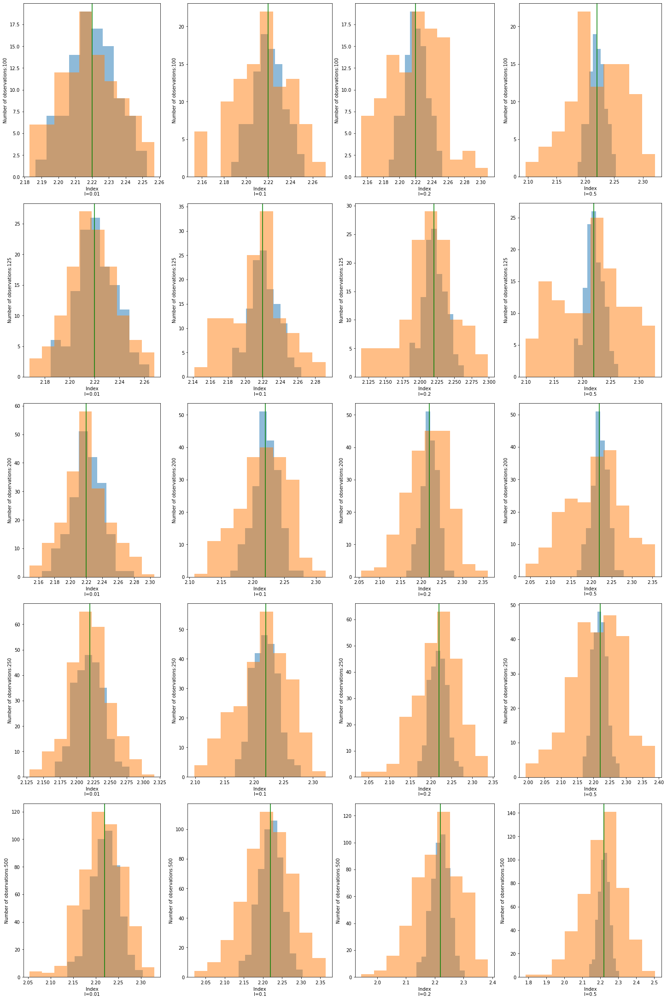

In [41]:
fig = plt.figure(figsize=[20,30],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 4, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[0])
for n in range(5):
    ax = fig.add_subplot(gs1[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][1], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.01')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs2 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[1])
for n in range(5):
    ax = fig.add_subplot(gs2[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][2], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.1')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

gs3 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[2])
for n in range(5):
    ax = fig.add_subplot(gs3[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][3], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.2')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs4 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[3])
for n in range(5):
    ax = fig.add_subplot(gs4[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][4], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.5')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

plt.show()

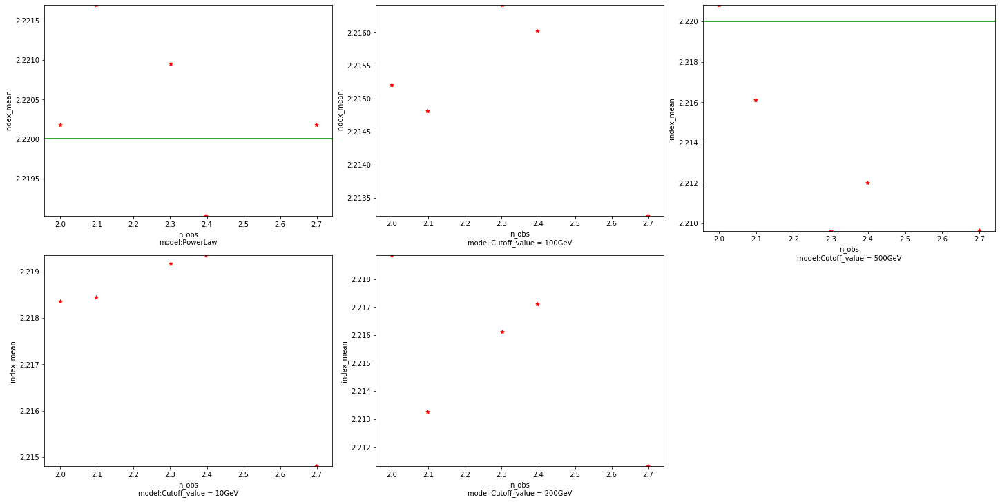

In [42]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n]}')
    plt.ylabel('index_mean')
    plt.axhline(y=model_simu.parameters["index"].value, color="green")
    plt.ylim(min([row[n] for row in mu]),max([row[n] for row in mu]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+2]}')
    plt.ylabel('index_mean')
    plt.axhline(y=model_simu.parameters["index"].value, color="green")
    plt.ylim(min([row[n+2] for row in mu]),max([row[n+2] for row in mu]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(1):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+4]}')
    plt.ylabel('index_mean')
    plt.axhline(y=model_simu.parameters["index"].value, color="green")
    plt.ylim(min([row[n+4] for row in mu]),max([row[n+4] for row in mu]))

plt.show()

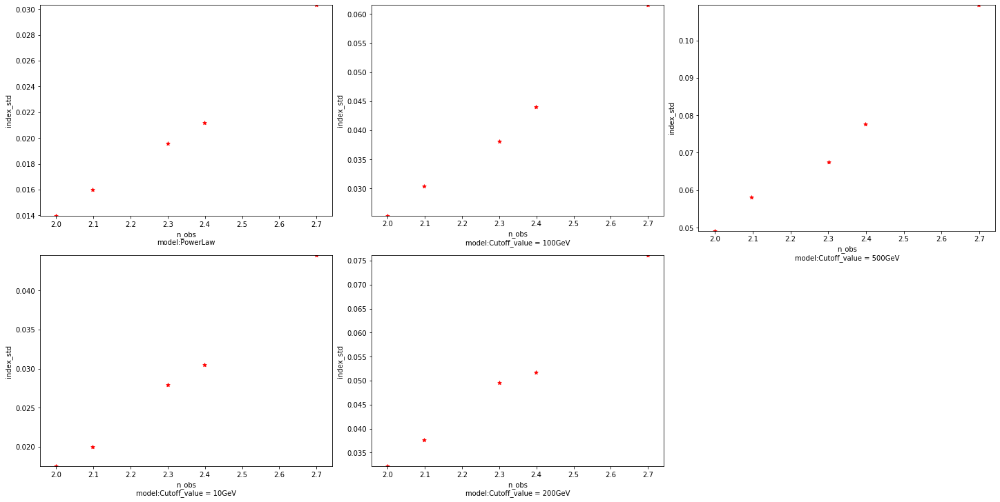

In [43]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n]}')
    plt.ylabel('index_std')
    plt.ylim(min([row[n] for row in sigma]),max([row[n] for row in sigma]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+2]}')
    plt.ylabel('index_std')
    plt.ylim(min([row[n+2] for row in sigma]),max([row[n+2] for row in sigma]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(1):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+4]}')
    plt.ylabel('index_std')
    plt.ylim(min([row[n+4] for row in sigma]),max([row[n+4] for row in sigma]))

plt.show()

In [44]:
for j in range(5):
    print(f"model: {j}")
    for i in range(5):
        mu[i][j]=amplitude[i][j].mean()
        sigma[i][j]=amplitude[i][j].std()
        print(f"amplitude: {amplitude[i][j].mean()} += {amplitude[i][j].std()}")

model: 0
amplitude: 1.2876338368636386e-12 += 3.012746334665229e-14
amplitude: 1.2846571766699697e-12 += 3.434165906679815e-14
amplitude: 1.2844615805590017e-12 += 4.214236797546734e-14
amplitude: 1.2841085058440728e-12 += 4.696933655825604e-14
amplitude: 1.2871695127986633e-12 += 6.426854162861659e-14
model: 1
amplitude: 1.2911065502135564e-12 += 4.1617962874915865e-14
amplitude: 1.29182882083288e-12 += 4.830346315861609e-14
amplitude: 1.2881770074335611e-12 += 6.106865501141437e-14
amplitude: 1.2893945873577129e-12 += 6.651106403078886e-14
amplitude: 1.2981360857255852e-12 += 9.644650360108848e-14
model: 2
amplitude: 1.2956267075103207e-12 += 6.011036129690028e-14
amplitude: 1.300541534608996e-12 += 6.993472853090129e-14
amplitude: 1.3018982718876844e-12 += 8.982233849933418e-14
amplitude: 1.3039017410290598e-12 += 9.956811001462624e-14
amplitude: 1.3138165468571525e-12 += 1.5283585048481986e-13
model: 3
amplitude: 1.2925272847626867e-12 += 8.155584968897954e-14
amplitude: 1.30717260

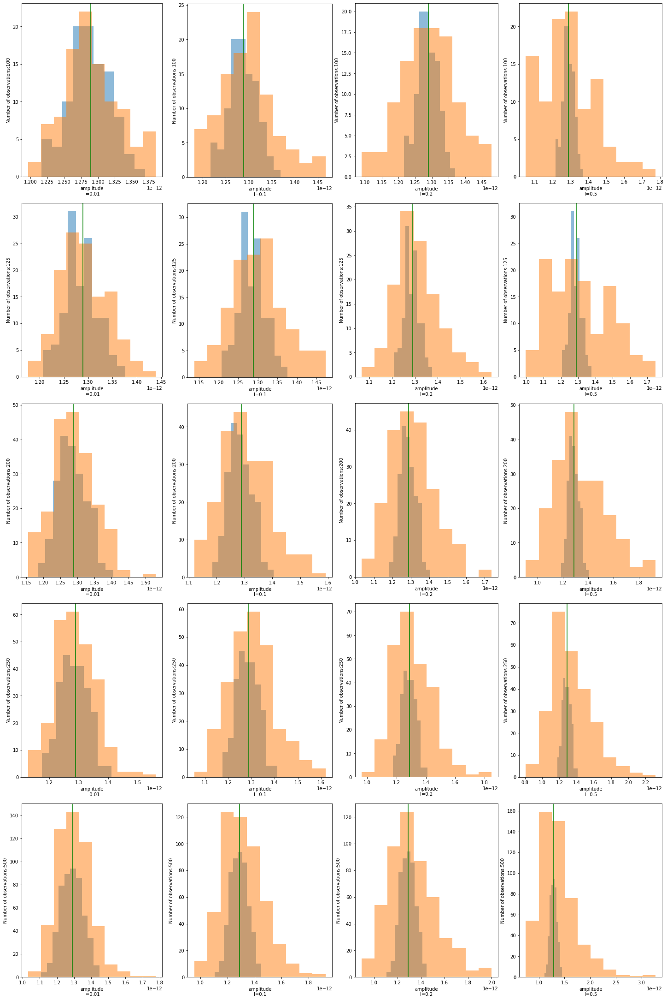

In [45]:
fig = plt.figure(figsize=[20,30],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 4, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[0])
for n in range(5):
    ax = fig.add_subplot(gs1[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][1], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.01')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs2 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[1])
for n in range(5):
    ax = fig.add_subplot(gs2[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][2], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.1')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

gs3 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[2])
for n in range(5):
    ax = fig.add_subplot(gs3[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][3], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.2')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs4 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[3])
for n in range(5):
    ax = fig.add_subplot(gs4[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][4], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.5')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

plt.show()

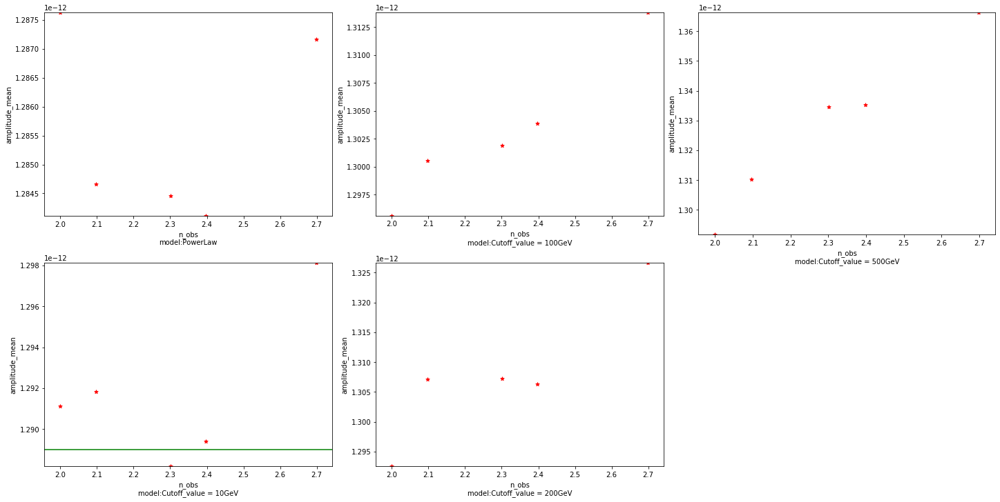

In [46]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n]}')
    plt.ylabel('amplitude_mean')
    plt.axhline(y=model_simu.parameters["amplitude"].value, color="green")
    plt.ylim(min([row[n] for row in mu]),max([row[n] for row in mu]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+2]}')
    plt.ylabel('amplitude_mean')
    plt.axhline(y=model_simu.parameters["amplitude"].value, color="green")
    plt.ylim(min([row[n+2] for row in mu]),max([row[n+2] for row in mu]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(1):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+4]}')
    plt.ylabel('amplitude_mean')
    plt.axhline(y=model_simu.parameters["amplitude"].value, color="green")
    plt.ylim(min([row[n+4] for row in mu]),max([row[n+4] for row in mu]))

plt.show()

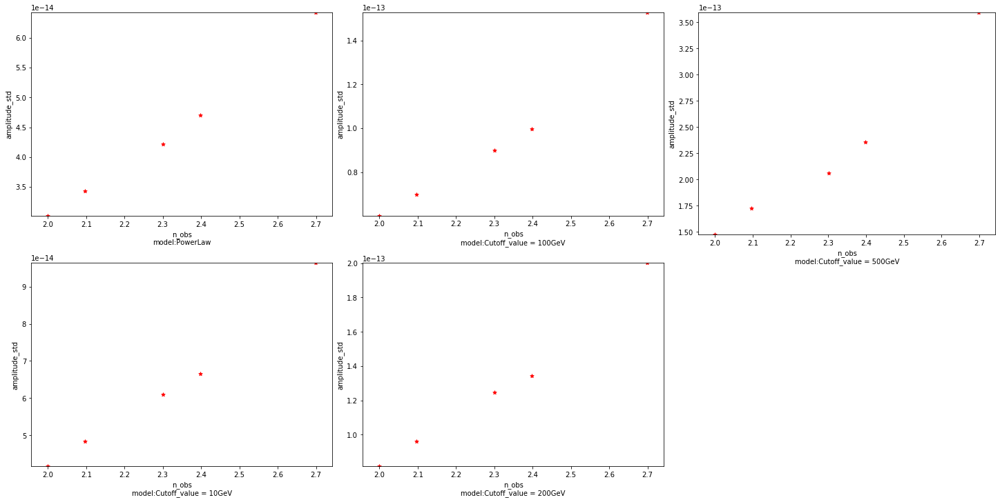

In [47]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n]}')
    plt.ylabel('amplitude_std')
    plt.ylim(min([row[n] for row in sigma]),max([row[n] for row in sigma]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+2]}')
    plt.ylabel('amplitude_std')
    plt.ylim(min([row[n+2] for row in sigma]),max([row[n+2] for row in sigma]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(1):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+4]}')
    plt.ylabel('amplitude_std')
    plt.ylim(min([row[n+4] for row in sigma]),max([row[n+4] for row in sigma]))

plt.show()

In [48]:
for j in range(4):
    print(f"model: {j}")
    for i in range(5):
        mu[i][j]=lambda_[i][j].mean()
        sigma[i][j]=lambda_[i][j].std()
        print(f"lambda_: {lambda_[i][j].mean()} += {lambda_[i][j].std()}")

model: 0
lambda_: 0.01129610705664321 += 0.005838456003133051
lambda_: 0.011498480468894647 += 0.006347305886461651
lambda_: 0.011144512685191446 += 0.008946337038678188
lambda_: 0.01154087752812562 += 0.010010773465972326
lambda_: 0.013669051547569533 += 0.0167596476386477
model: 1
lambda_: 0.10346781234902654 += 0.0172881718223158
lambda_: 0.10588887278329268 += 0.021395690264315422
lambda_: 0.10660063844760191 += 0.02792368412226071
lambda_: 0.10795252970606309 += 0.03126026824970748
lambda_: 0.11054607540762883 += 0.04616042807850996
model: 2
lambda_: 0.20232576523679982 += 0.033046269468711184
lambda_: 0.20855570894300848 += 0.038357503563444445
lambda_: 0.20899194207101102 += 0.04831628550507564
lambda_: 0.20960121720745595 += 0.053807705413007494
lambda_: 0.21717651745442182 += 0.07839312557048313
model: 3
lambda_: 0.5033444590589774 += 0.08802637041821045
lambda_: 0.5123524109196763 += 0.10061082539608704
lambda_: 0.5259170640292848 += 0.11839018065005166
lambda_: 0.52454779251

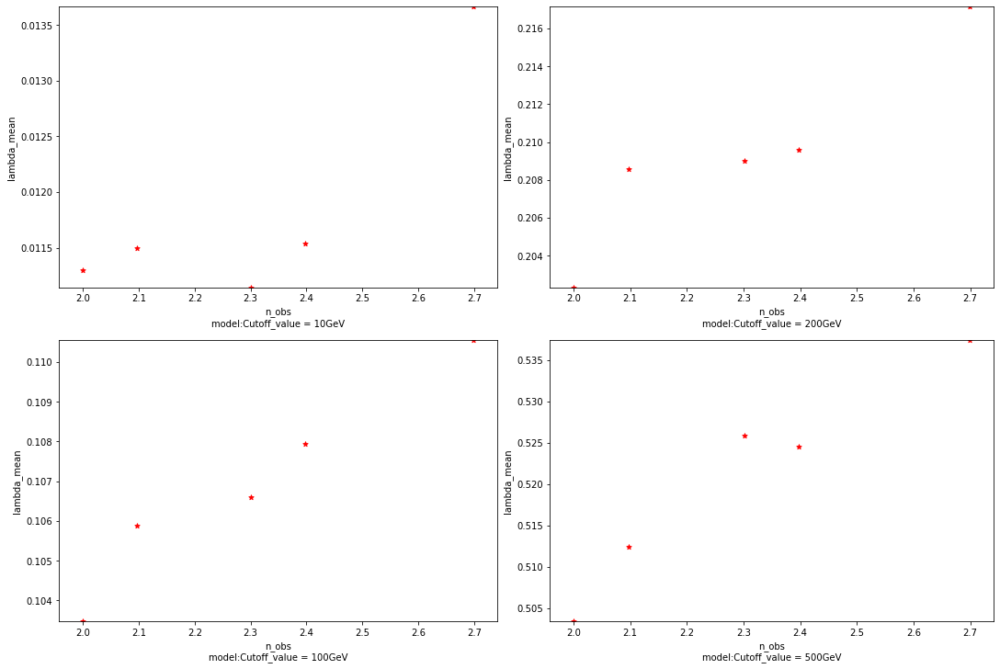

In [49]:
fig = plt.figure(figsize=[15,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 2, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+1]}')
    plt.ylabel('lambda_mean')
    plt.axhline(y=l[n], color="green")
    plt.ylim(min([row[n] for row in mu]),max([row[n] for row in mu]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+3]}')
    plt.ylabel('lambda_mean')
    plt.axhline(y=l[n+2], color="green")
    plt.ylim(min([row[n+2] for row in mu]),max([row[n+2] for row in mu]))

plt.show()

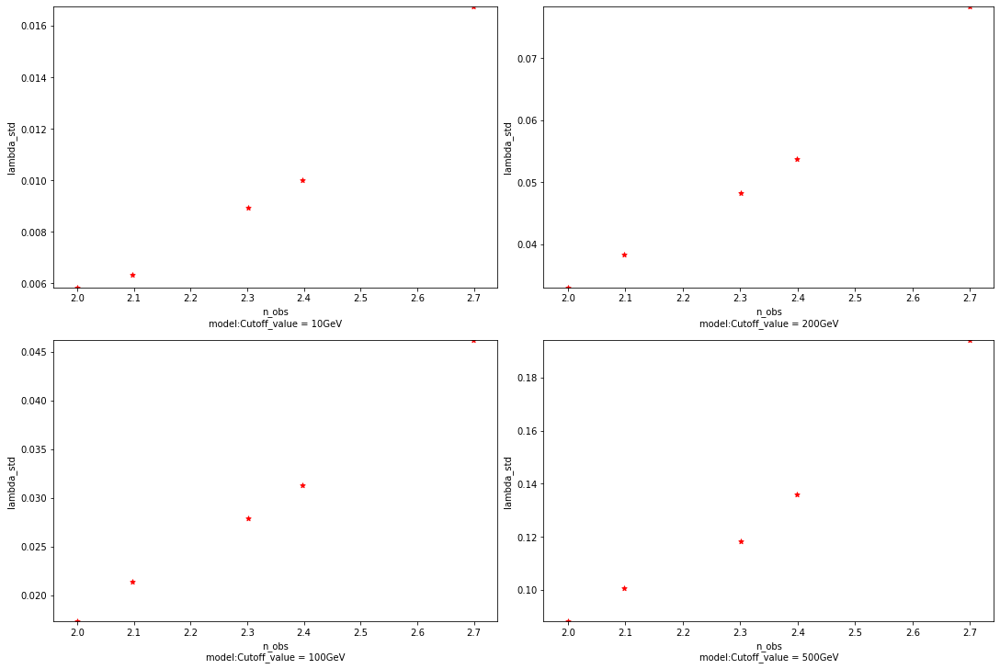

In [50]:
fig = plt.figure(figsize=[15,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 2, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+1]}')
    plt.ylabel('lambda_std')
    plt.ylim(min([row[n] for row in sigma]),max([row[n] for row in sigma]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+3]}')
    plt.ylabel('lambda_std')
    plt.ylim(min([row[n+2] for row in sigma]),max([row[n+2] for row in sigma]))

plt.show()

In [51]:
sim = [[0 for i in range(cols)] for j in range(rows)]
for i in range(5):
    s = PowerLawSpectralModel(
        index=index[i][0].mean(),
        amplitude=amplitude[i][0].mean() * u.Unit("cm-2 s-1 TeV-1"),
        reference=1 * u.TeV,
    )
    print(s) 
    sim[i][0]=s
    
for j in range(4):
    for i in range(5):
        s = ExpCutoffPowerLawSpectralModel(
            index=index[i][j+1].mean(),
            amplitude=amplitude[i][j+1].mean() * u.Unit("cm-2 s-1 TeV-1"),
            reference=1 * u.TeV,
            lambda_=lambda_[i][j].mean() * u.Unit("TeV-1"),
            alpha = 1,
        )
        print(s)
        sim[i][j+1]=s

PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.222e+00   nan                nan nan  False
amplitude 1.285e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.221e+00   nan                nan nan  False
amplitude 1.284e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --

<function matplotlib.pyplot.show(*args, **kw)>

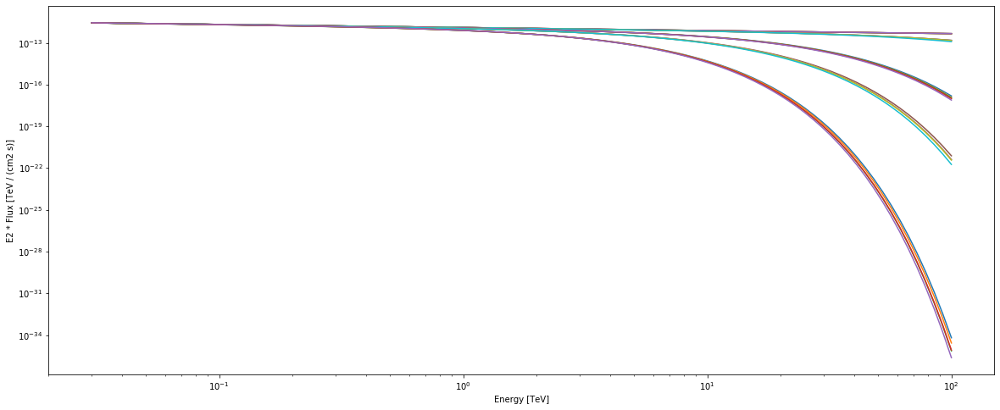

In [52]:
plt.figure(figsize=[20,8])
energy_range = [0.03, 100] * u.TeV
for j in range(5):
    for i in range(5):
        sim[i][j].plot(energy_range=energy_range, energy_power=2)
plt.show

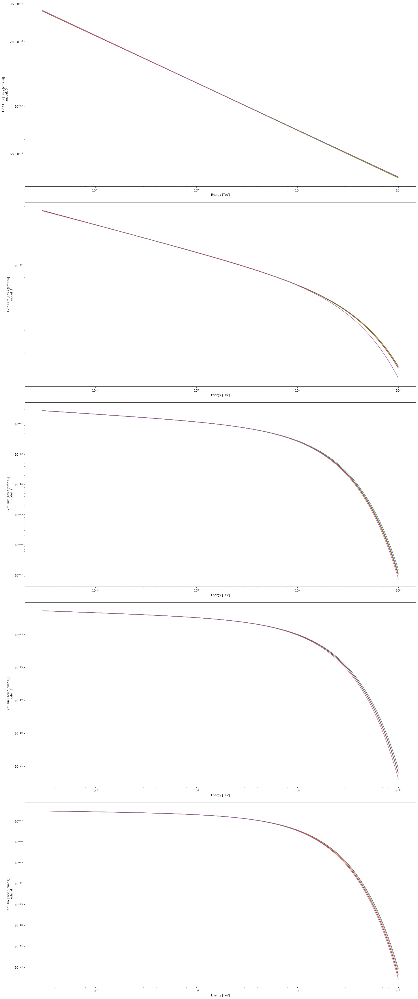

In [53]:
fig = plt.figure(figsize=[20,48],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 1, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[0])
for n in range(5):
    ax = fig.add_subplot(gs1[n])
    for i in range(5):
        sim[i][n].plot(energy_range=energy_range, energy_power=2)
    plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {n}')
    
plt.show()

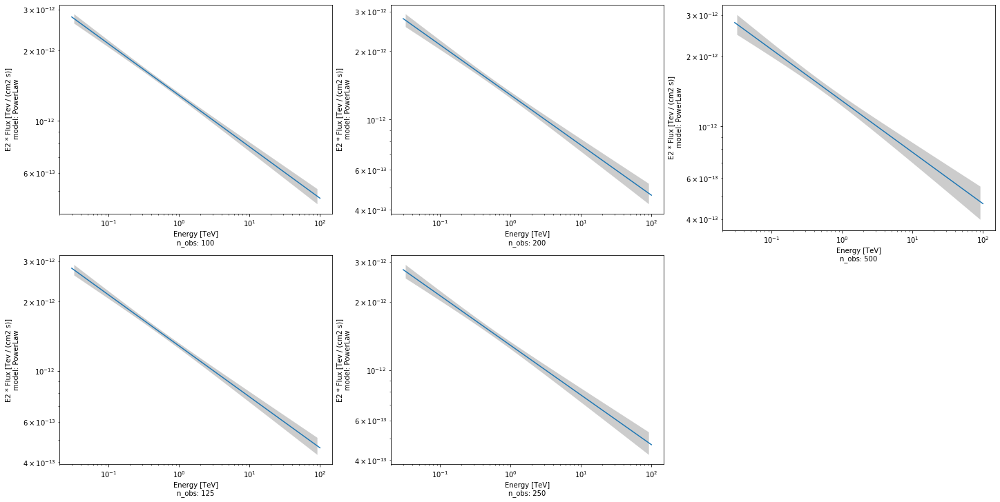

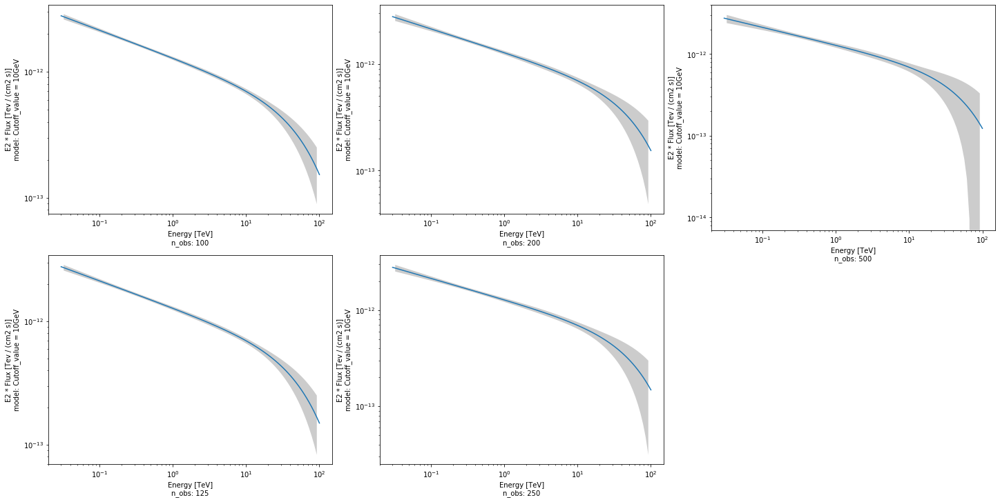

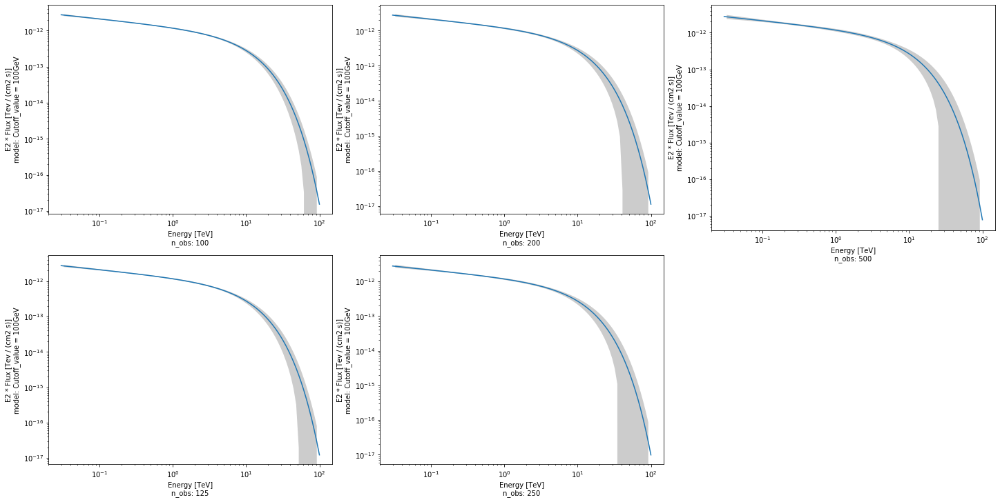

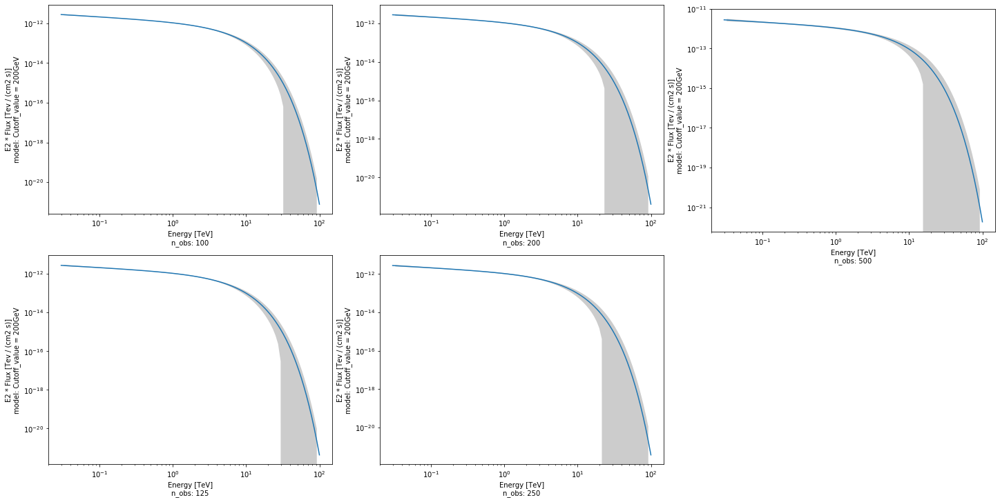

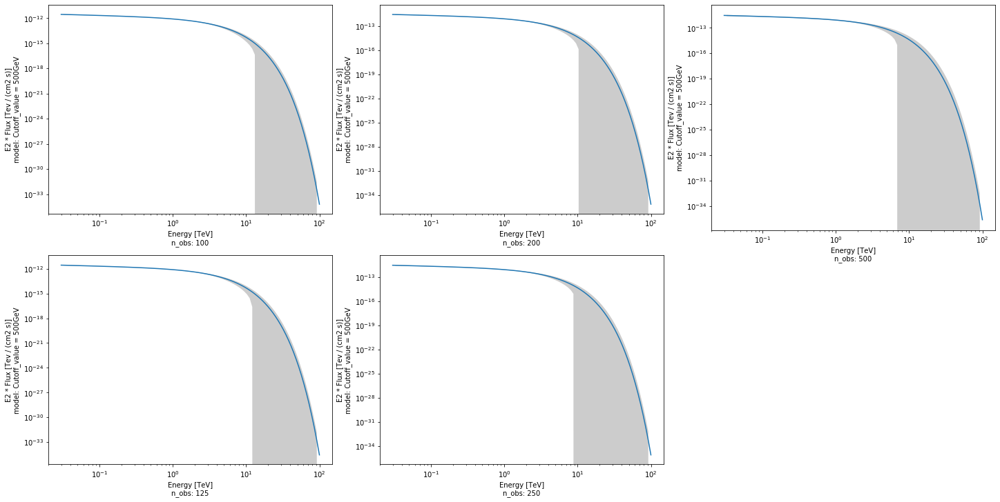

In [54]:
for i in range(5):    
    fig = plt.figure(figsize=[20,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 3, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim[n][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n][i], covar=covar[n][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i]}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim[n+2][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+2][i], covar=covar[n+2][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+2]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i]}')

    gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
    for n in range(1):
        ax = fig.add_subplot(gs3[n])
        sim[n+4][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+4][i], covar=covar[n+4][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+4]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i]}')


    plt.show()

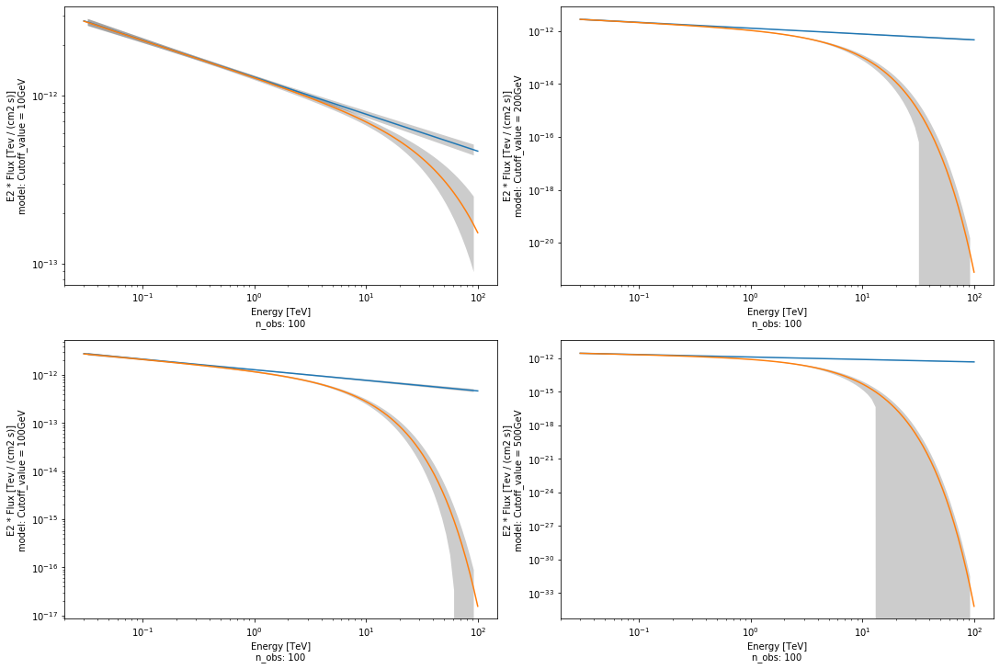

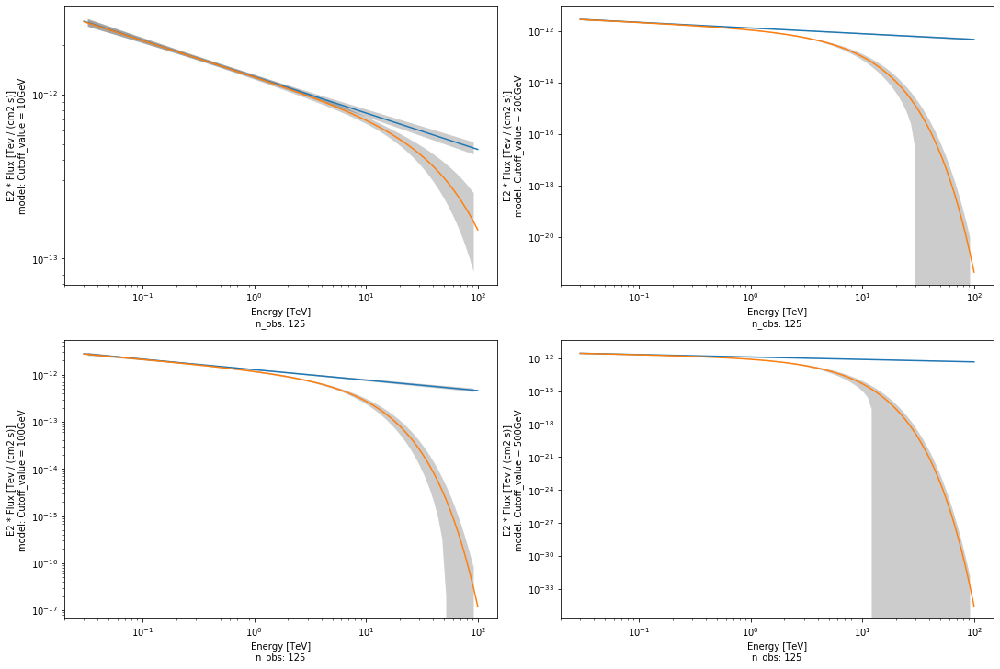

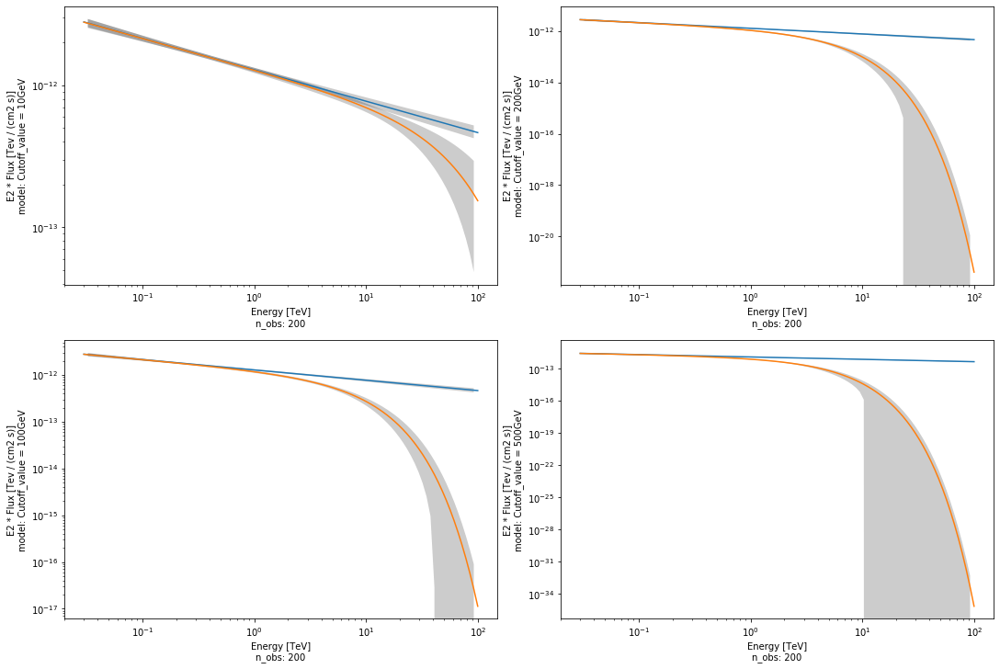

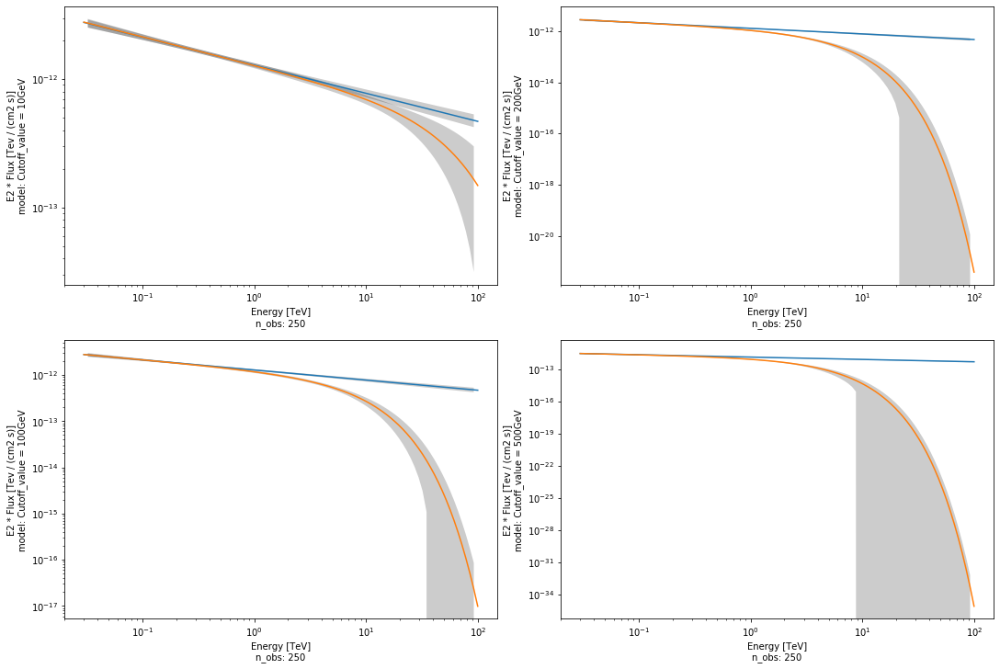

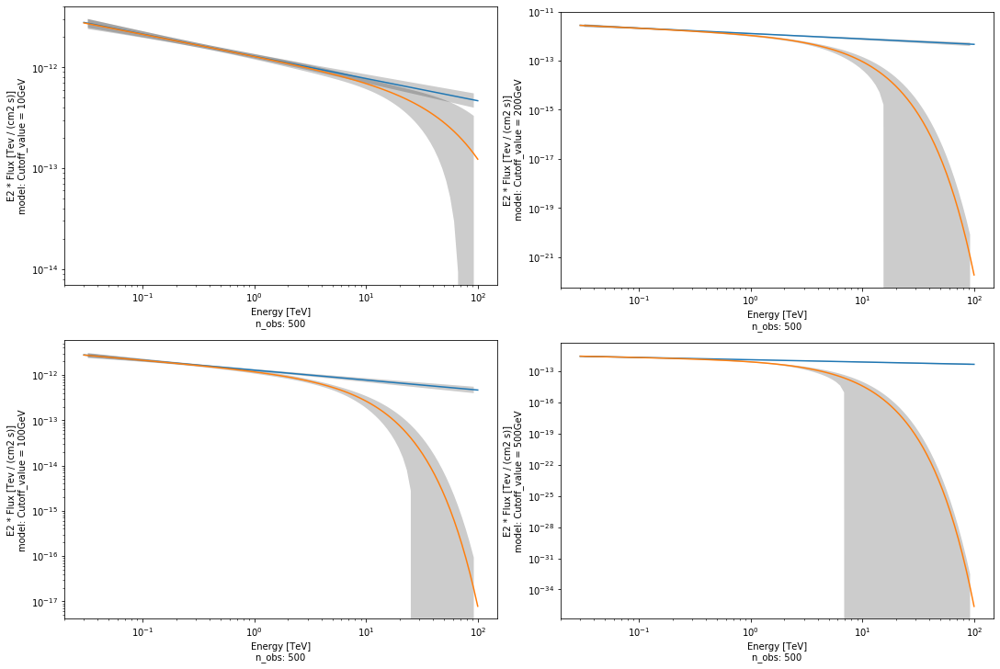

In [55]:
for i in range(5):    
    fig = plt.figure(figsize=[15,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 2, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim[i][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][0], covar=covar[i][0],energy_range=energy_range, energy_power=2)
        sim[i][n+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][n+1], covar=covar[i][n+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[i]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[n+1]}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim[i][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][0], covar=covar[i][0],energy_range=energy_range, energy_power=2)
        sim[i][n+3].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][n+3], covar=covar[i][n+3],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[i]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[n+3]}')


    plt.show()

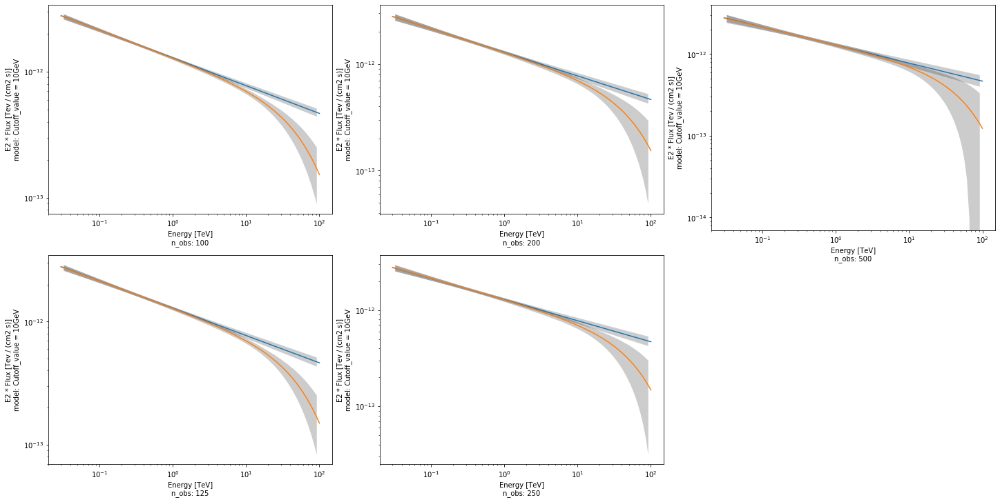

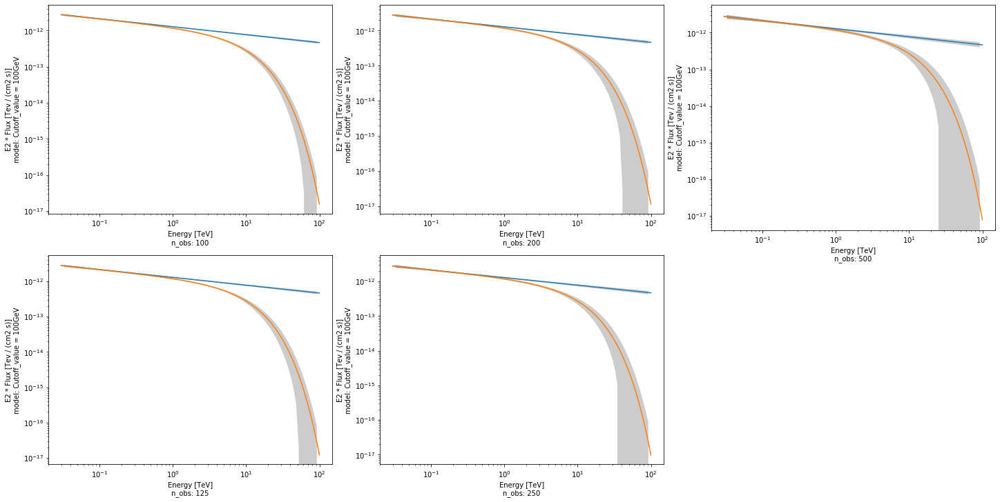

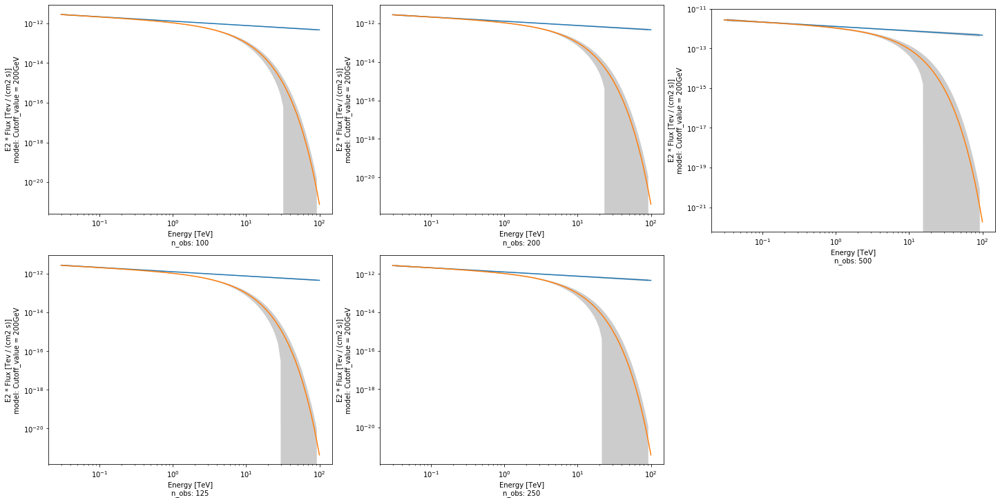

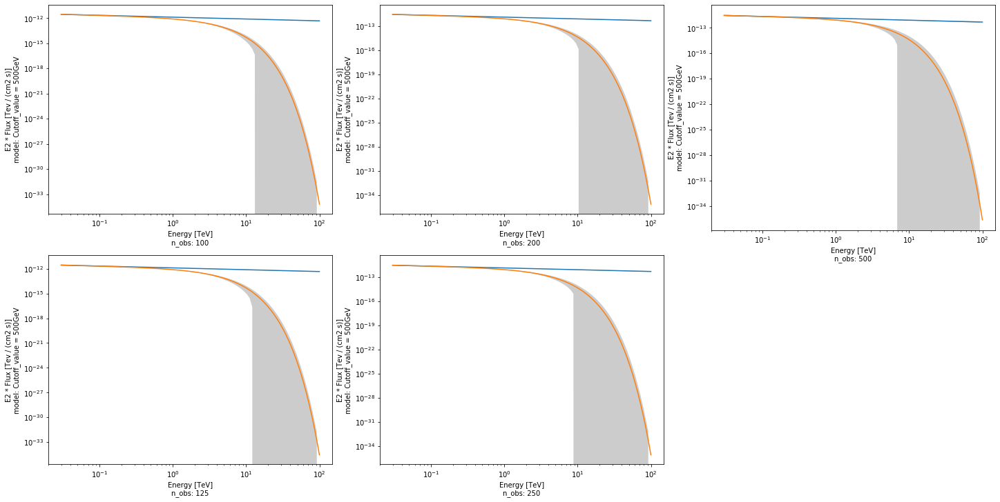

In [56]:
for i in range(4):    
    fig = plt.figure(figsize=[20,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 3, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim[n][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n][0], covar=covar[n][0],energy_range=energy_range, energy_power=2)
        sim[n][i+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n][i+1], covar=covar[n][i+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i+1]}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim[n+2][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+2][0], covar=covar[n+2][0],energy_range=energy_range, energy_power=2)
        sim[n+2][i+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+2][i+1], covar=covar[n+2][i+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+2]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i+1]}')

    gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
    for n in range(1):
        ax = fig.add_subplot(gs3[n])
        sim[n+4][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+4][0], covar=covar[n+4][0],energy_range=energy_range, energy_power=2)
        sim[n+4][i+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+4][i+1], covar=covar[n+4][i+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+4]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i+1]}')


    plt.show()

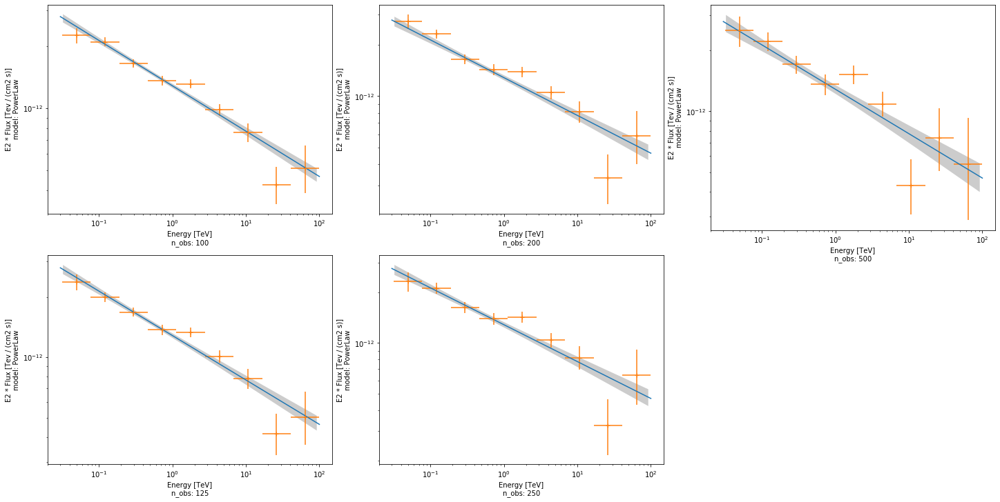

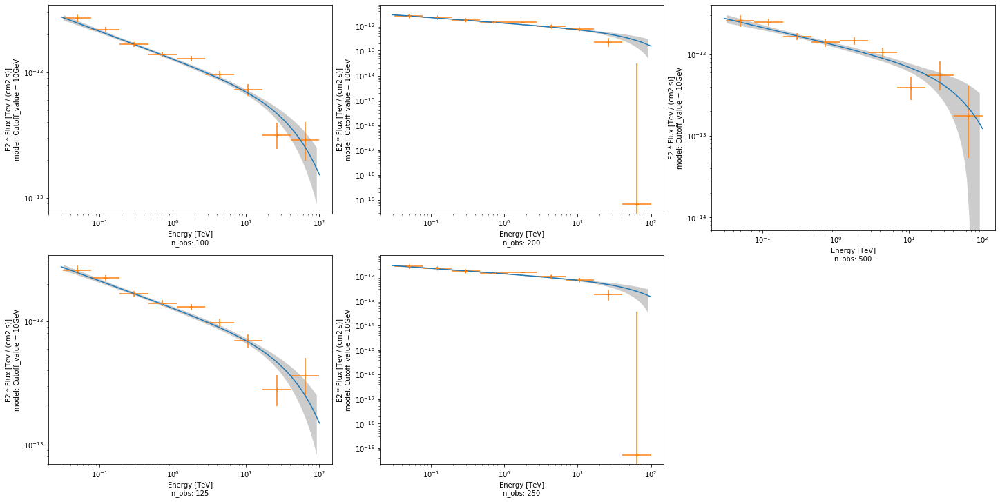

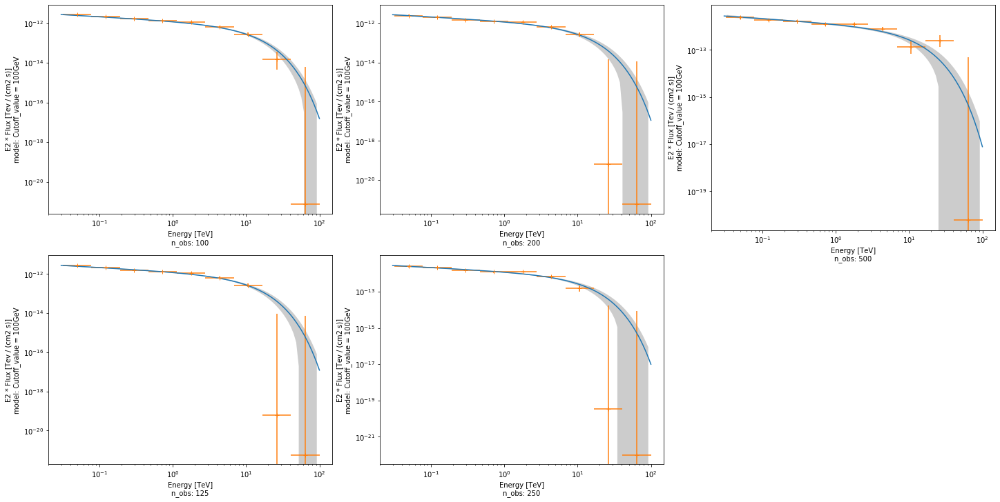

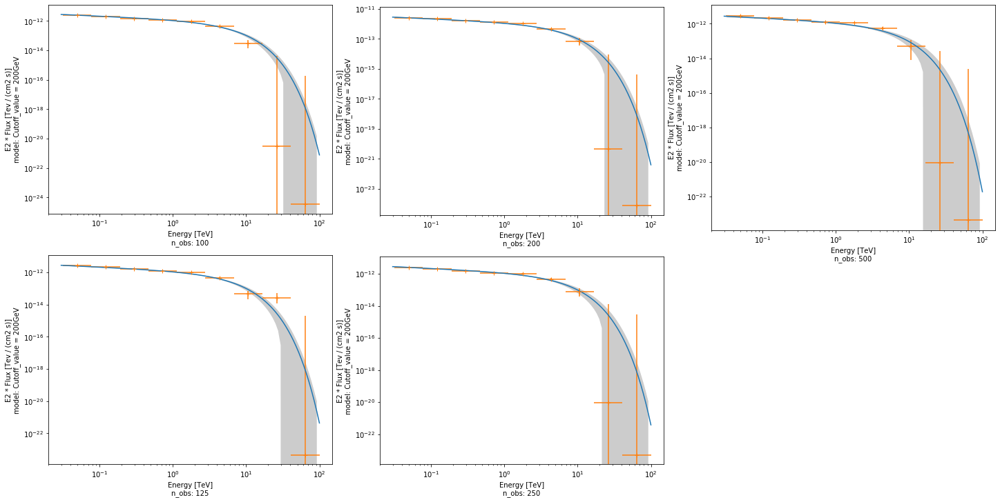

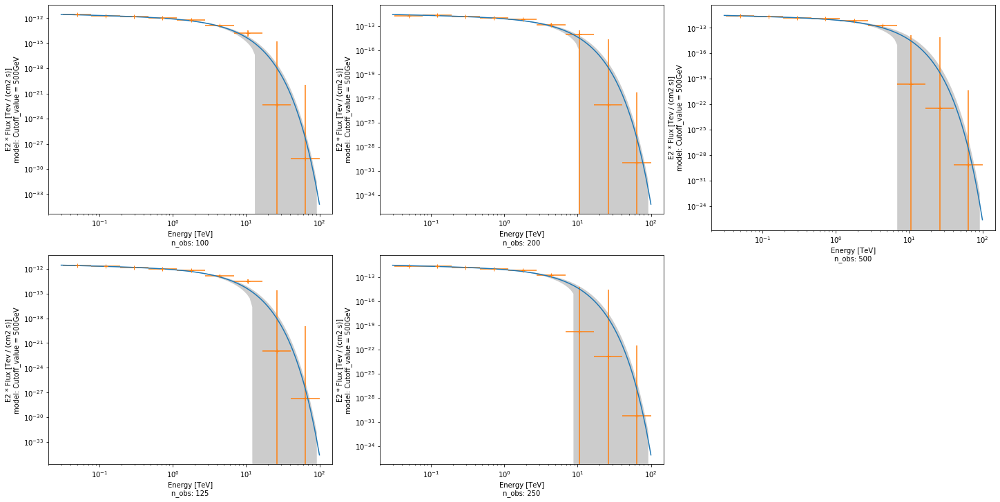

In [57]:
for i in range(5):    
    fig = plt.figure(figsize=[20,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 3, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim[n][i].plot(energy_range=energy_range, energy_power=2)
        fpes_all[n][i][0].plot(energy_power=2)
        plot_error(self=sim[n][i], covar=covar[n][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i]}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim[n+2][i].plot(energy_range=energy_range, energy_power=2)
        fpes_all[n+2][i][0].plot(energy_power=2)
        plot_error(self=sim[n+2][i], covar=covar[n+2][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+2]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i]}')

    gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
    for n in range(1):
        ax = fig.add_subplot(gs3[n])
        sim[n+4][i].plot(energy_range=energy_range, energy_power=2)
        fpes_all[n+4][i][0].plot(energy_power=2)
        plot_error(self=sim[n+4][i], covar=covar[n+4][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+4]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i]}')


    plt.show()